In [1]:
import IPython
import IPython.display
import numpy as np
import pandas as pd
import glob
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
import imblearn
from collections import Counter
from sklearn.preprocessing import LabelEncoder
from imblearn.datasets import make_imbalance
from sklearn.compose import make_column_transformer
from sklearn.pipeline import Pipeline, make_pipeline
import numpy as geek 

In [2]:
labels_df = pd.read_csv("D:\Clases\Tesis\Datasets\OGLE-III\OGLE_dataset.dat")

In [3]:
labels_df.Class.unique()

array(['ED', 'ESD', 'EC', 'cep', 'dsct', 'RRab', 'RRc', 'std', 'OSARG',
       'SRV', 'Mira'], dtype=object)

In [4]:
unique_vals = labels_df['Class'].unique()
labels_df['Class'].replace(to_replace=unique_vals,
           value= list(range(len(unique_vals))),
           inplace=True)

In [5]:
labels_df.Class.unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10], dtype=int64)

In [6]:
labels_df.head()

,ID,Class,Path,N
0,OGLE-LMC-ECL-10381,0,./lmc/ecl/phot/I/OGLE-LMC-ECL-10381.dat,476
1,OGLE-LMC-ECL-17914,0,./lmc/ecl/phot/I/OGLE-LMC-ECL-17914.dat,444
2,OGLE-LMC-ECL-01315,0,./lmc/ecl/phot/I/OGLE-LMC-ECL-01315.dat,686
3,OGLE-LMC-ECL-23784,1,./lmc/ecl/phot/I/OGLE-LMC-ECL-23784.dat,403
4,OGLE-LMC-ECL-03565,0,./lmc/ecl/phot/I/OGLE-LMC-ECL-03565.dat,477


In [7]:
labels_df = labels_df[labels_df['N'] >= 370]

In [8]:
labels_df['Class']

0         0
1         0
2         0
3         1
4         0
         ..
393097    8
393098    9
393099    8
393100    9
393101    9
Name: Class, Length: 329950, dtype: int64

8     212672
9      30413
0      21155
5      18238
7      10514
1       9322
3       6873
2       6822
6       5720
10      5423
4       2798
Name: Class, dtype: int64

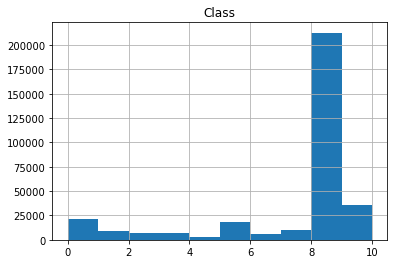

In [9]:
labels_df.hist('Class')
labels_df['Class'].value_counts()

In [10]:
print(labels_df)

                         ID  Class                                      Path  \
0        OGLE-LMC-ECL-10381      0   ./lmc/ecl/phot/I/OGLE-LMC-ECL-10381.dat   
1        OGLE-LMC-ECL-17914      0   ./lmc/ecl/phot/I/OGLE-LMC-ECL-17914.dat   
2        OGLE-LMC-ECL-01315      0   ./lmc/ecl/phot/I/OGLE-LMC-ECL-01315.dat   
3        OGLE-LMC-ECL-23784      1   ./lmc/ecl/phot/I/OGLE-LMC-ECL-23784.dat   
4        OGLE-LMC-ECL-03565      0   ./lmc/ecl/phot/I/OGLE-LMC-ECL-03565.dat   
...                     ...    ...                                       ...   
393097  OGLE-BLG-LPV-029899      8  ./blg/lpv/phot/I/OGLE-BLG-LPV-029899.dat   
393098  OGLE-BLG-LPV-203576      9  ./blg/lpv/phot/I/OGLE-BLG-LPV-203576.dat   
393099  OGLE-BLG-LPV-168014      8  ./blg/lpv/phot/I/OGLE-BLG-LPV-168014.dat   
393100  OGLE-BLG-LPV-029799      9  ./blg/lpv/phot/I/OGLE-BLG-LPV-029799.dat   
393101  OGLE-BLG-LPV-073010      9  ./blg/lpv/phot/I/OGLE-BLG-LPV-073010.dat   

           N  
0        476  
1        

In [11]:
path = "D:\Clases\Tesis\Datasets\OGLE-III\LCs\\"

xframes = [] 
xframesdiff = []
yframes = []

j = 0
for index, row in labels_df.iterrows():
    j = j+1
    #print(j)
    if j%3 == 0:      ##3, 7, 10, 15
        filename = path + row['ID'] + ".dat"
        frame = pd.read_csv(filename, index_col=None, header=None, sep= ' ', error_bad_lines=False, skipinitialspace=True)
        print('Elemento: ' + str(j))
        print('File: ' + filename)
        temp_newframe = frame.iloc[0:361, 0:2]              #361,2
        newframe_diff = np.diff(temp_newframe, axis = 0)    #360,2 (ya que diff tiene -1)
        temp_newframe = frame.iloc[0:360, 0:2]              #360,2
        newframe = pd.DataFrame(temp_newframe)
        time = newframe.iloc[0,0]
        if time > 2450000:
            print(time)
            print(row['ID'], row['Class'])
            newframe.iloc[:,0] = newframe.iloc[:,0] - 2450000
            print(newframe.iloc[0,0])
        xframes.append(newframe)
        xframesdiff.append(newframe_diff)
        yframes.append(row['Class'])
        print('Clase: ' + str(row['Class']))


Elemento: 3
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01315.dat
Clase: 0
Elemento: 6
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17480.dat
Clase: 1
Elemento: 9
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-20302.dat
Clase: 0
Elemento: 12
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23821.dat
Clase: 0
Elemento: 15
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06377.dat
Clase: 1
Elemento: 18
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01324.dat
Clase: 0
Elemento: 21
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06305.dat
Clase: 0
Elemento: 24
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09365.dat
Clase: 0
Elemento: 27
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06799.dat
Clase: 1
Elemento: 30
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-20188.dat
Clase: 0
Elemento: 33
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11465.dat
Clase: 0
Elemento: 36
File: D:\Cl

Elemento: 336
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24269.dat
Clase: 1
Elemento: 339
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03065.dat
Clase: 1
Elemento: 342
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21642.dat
Clase: 1
Elemento: 345
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00667.dat
Clase: 1
Elemento: 348
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00554.dat
Clase: 1
Elemento: 351
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16407.dat
Clase: 1
Elemento: 354
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06414.dat
Clase: 0
Elemento: 357
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09726.dat
Clase: 0
Elemento: 360
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21394.dat
Clase: 1
Elemento: 363
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14631.dat
Clase: 0
Elemento: 366
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10501.dat
Clase: 0
Elemento: 

Elemento: 702
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09330.dat
Clase: 1
Elemento: 705
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24495.dat
Clase: 0
Elemento: 708
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24922.dat
Clase: 1
Elemento: 711
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-02246.dat
Clase: 0
Elemento: 714
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21883.dat
Clase: 2
Elemento: 717
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13185.dat
Clase: 0
Elemento: 720
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01021.dat
Clase: 0
Elemento: 723
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-25023.dat
Clase: 0
Elemento: 726
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-15487.dat
Clase: 0
Elemento: 729
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-15607.dat
Clase: 0
Elemento: 732
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11995.dat
Clase: 0
Elemento: 

Elemento: 984
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19406.dat
Clase: 1
Elemento: 987
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-20068.dat
Clase: 0
Elemento: 990
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00284.dat
Clase: 0
Elemento: 993
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12109.dat
Clase: 0
Elemento: 996
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23153.dat
Clase: 0
Elemento: 999
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16396.dat
Clase: 0
Elemento: 1002
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08493.dat
Clase: 1
Elemento: 1005
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05331.dat
Clase: 1
Elemento: 1008
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11312.dat
Clase: 0
Elemento: 1011
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14802.dat
Clase: 1
Elemento: 1014
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11924.dat
Clase: 0
Eleme

Elemento: 1365
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-20610.dat
Clase: 1
Elemento: 1368
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23492.dat
Clase: 2
Elemento: 1371
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00810.dat
Clase: 0
Elemento: 1374
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12747.dat
Clase: 0
Elemento: 1377
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17427.dat
Clase: 1
Elemento: 1380
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23700.dat
Clase: 0
Elemento: 1383
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-02417.dat
Clase: 0
Elemento: 1386
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17484.dat
Clase: 0
Elemento: 1389
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12585.dat
Clase: 0
Elemento: 1392
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23193.dat
Clase: 0
Elemento: 1395
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14237.dat
Clase: 0

Elemento: 1740
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17351.dat
Clase: 1
Elemento: 1743
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16892.dat
Clase: 0
Elemento: 1746
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14443.dat
Clase: 0
Elemento: 1749
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13059.dat
Clase: 0
Elemento: 1752
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23894.dat
Clase: 0
Elemento: 1755
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13965.dat
Clase: 1
Elemento: 1758
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09810.dat
Clase: 1
Elemento: 1761
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03851.dat
Clase: 0
Elemento: 1764
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-25186.dat
Clase: 1
Elemento: 1767
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11721.dat
Clase: 1
Elemento: 1770
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05461.dat
Clase: 0

Elemento: 2115
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11547.dat
Clase: 0
Elemento: 2118
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-04506.dat
Clase: 0
Elemento: 2121
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18094.dat
Clase: 1
Elemento: 2124
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17598.dat
Clase: 0
Elemento: 2127
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09344.dat
Clase: 1
Elemento: 2130
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03835.dat
Clase: 0
Elemento: 2133
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09890.dat
Clase: 0
Elemento: 2136
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-02408.dat
Clase: 0
Elemento: 2139
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-04060.dat
Clase: 0
Elemento: 2142
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03931.dat
Clase: 1
Elemento: 2145
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-15688.dat
Clase: 1

Elemento: 2484
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17236.dat
Clase: 0
Elemento: 2487
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03382.dat
Clase: 0
Elemento: 2490
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18231.dat
Clase: 0
Elemento: 2493
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13040.dat
Clase: 1
Elemento: 2496
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00418.dat
Clase: 0
Elemento: 2499
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13835.dat
Clase: 1
Elemento: 2502
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09059.dat
Clase: 0
Elemento: 2505
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11831.dat
Clase: 0
Elemento: 2508
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18227.dat
Clase: 1
Elemento: 2511
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19466.dat
Clase: 0
Elemento: 2514
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12993.dat
Clase: 1

Elemento: 2859
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17584.dat
Clase: 1
Elemento: 2862
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01721.dat
Clase: 0
Elemento: 2865
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16949.dat
Clase: 0
Elemento: 2868
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-25588.dat
Clase: 0
Elemento: 2871
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12792.dat
Clase: 0
Elemento: 2874
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09036.dat
Clase: 0
Elemento: 2877
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08864.dat
Clase: 1
Elemento: 2880
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23030.dat
Clase: 0
Elemento: 2883
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-20981.dat
Clase: 0
Elemento: 2886
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12609.dat
Clase: 0
Elemento: 2889
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03249.dat
Clase: 0

Elemento: 3249
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23161.dat
Clase: 1
Elemento: 3252
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10610.dat
Clase: 0
Elemento: 3255
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08767.dat
Clase: 0
Elemento: 3258
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17962.dat
Clase: 0
Elemento: 3261
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-15629.dat
Clase: 0
Elemento: 3264
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12752.dat
Clase: 1
Elemento: 3267
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06881.dat
Clase: 0
Elemento: 3270
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06020.dat
Clase: 0
Elemento: 3273
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23561.dat
Clase: 0
Elemento: 3276
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16860.dat
Clase: 1
Elemento: 3279
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-22271.dat
Clase: 0

Elemento: 3618
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16666.dat
Clase: 0
Elemento: 3621
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10541.dat
Clase: 0
Elemento: 3624
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24941.dat
Clase: 0
Elemento: 3627
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01468.dat
Clase: 0
Elemento: 3630
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18564.dat
Clase: 1
Elemento: 3633
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06075.dat
Clase: 2
Elemento: 3636
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03059.dat
Clase: 0
Elemento: 3639
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09911.dat
Clase: 1
Elemento: 3642
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14574.dat
Clase: 0
Elemento: 3645
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18545.dat
Clase: 0
Elemento: 3648
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23696.dat
Clase: 0

Elemento: 3972
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12543.dat
Clase: 2
Elemento: 3975
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14684.dat
Clase: 0
Elemento: 3978
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07039.dat
Clase: 0
Elemento: 3981
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12981.dat
Clase: 0
Elemento: 3984
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13212.dat
Clase: 0
Elemento: 3987
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-15061.dat
Clase: 0
Elemento: 3990
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07653.dat
Clase: 1
Elemento: 3993
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01265.dat
Clase: 1
Elemento: 3996
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06862.dat
Clase: 0
Elemento: 3999
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08651.dat
Clase: 1
Elemento: 4002
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23853.dat
Clase: 0

Elemento: 4341
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03785.dat
Clase: 0
Elemento: 4344
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-04785.dat
Clase: 0
Elemento: 4347
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01677.dat
Clase: 0
Elemento: 4350
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19574.dat
Clase: 0
Elemento: 4353
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17602.dat
Clase: 0
Elemento: 4356
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23636.dat
Clase: 0
Elemento: 4359
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00819.dat
Clase: 0
Elemento: 4362
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23727.dat
Clase: 2
Elemento: 4365
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11645.dat
Clase: 1
Elemento: 4368
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19278.dat
Clase: 2
Elemento: 4371
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16464.dat
Clase: 1

Elemento: 4701
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-20086.dat
Clase: 0
Elemento: 4704
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-22339.dat
Clase: 0
Elemento: 4707
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01940.dat
Clase: 0
Elemento: 4710
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-02247.dat
Clase: 1
Elemento: 4713
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-22931.dat
Clase: 1
Elemento: 4716
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11770.dat
Clase: 0
Elemento: 4719
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09787.dat
Clase: 2
Elemento: 4722
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00150.dat
Clase: 1
Elemento: 4725
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13744.dat
Clase: 0
Elemento: 4728
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23873.dat
Clase: 0
Elemento: 4731
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03259.dat
Clase: 1

Elemento: 5085
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21368.dat
Clase: 0
Elemento: 5088
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03478.dat
Clase: 0
Elemento: 5091
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09853.dat
Clase: 1
Elemento: 5094
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17565.dat
Clase: 0
Elemento: 5097
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16599.dat
Clase: 0
Elemento: 5100
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14016.dat
Clase: 1
Elemento: 5103
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14768.dat
Clase: 0
Elemento: 5106
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00318.dat
Clase: 0
Elemento: 5109
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19602.dat
Clase: 0
Elemento: 5112
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-15916.dat
Clase: 1
Elemento: 5115
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18294.dat
Clase: 1

Elemento: 5466
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10140.dat
Clase: 0
Elemento: 5469
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00687.dat
Clase: 1
Elemento: 5472
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-25403.dat
Clase: 0
Elemento: 5475
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01767.dat
Clase: 0
Elemento: 5478
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21246.dat
Clase: 1
Elemento: 5481
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07197.dat
Clase: 0
Elemento: 5484
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16238.dat
Clase: 1
Elemento: 5487
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-15212.dat
Clase: 0
Elemento: 5490
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03120.dat
Clase: 1
Elemento: 5493
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14090.dat
Clase: 0
Elemento: 5496
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11092.dat
Clase: 0

Elemento: 5823
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14617.dat
Clase: 2
Elemento: 5826
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10253.dat
Clase: 1
Elemento: 5829
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12517.dat
Clase: 0
Elemento: 5832
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10205.dat
Clase: 1
Elemento: 5835
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14529.dat
Clase: 0
Elemento: 5838
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05328.dat
Clase: 1
Elemento: 5841
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12686.dat
Clase: 0
Elemento: 5844
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12133.dat
Clase: 1
Elemento: 5847
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01080.dat
Clase: 0
Elemento: 5850
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10202.dat
Clase: 1
Elemento: 5853
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01293.dat
Clase: 0

Elemento: 6207
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16824.dat
Clase: 1
Elemento: 6210
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06763.dat
Clase: 0
Elemento: 6213
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23909.dat
Clase: 1
Elemento: 6216
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-15482.dat
Clase: 0
Elemento: 6219
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10795.dat
Clase: 1
Elemento: 6222
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06972.dat
Clase: 0
Elemento: 6225
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-22935.dat
Clase: 1
Elemento: 6228
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13699.dat
Clase: 0
Elemento: 6231
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00206.dat
Clase: 1
Elemento: 6234
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-02801.dat
Clase: 0
Elemento: 6237
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-25915.dat
Clase: 0

Elemento: 6594
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13095.dat
Clase: 1
Elemento: 6597
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-15067.dat
Clase: 0
Elemento: 6600
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19711.dat
Clase: 1
Elemento: 6603
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-25051.dat
Clase: 1
Elemento: 6606
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10703.dat
Clase: 1
Elemento: 6609
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03747.dat
Clase: 0
Elemento: 6612
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11723.dat
Clase: 1
Elemento: 6615
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16316.dat
Clase: 0
Elemento: 6618
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18370.dat
Clase: 1
Elemento: 6621
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06936.dat
Clase: 0
Elemento: 6624
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03356.dat
Clase: 0

Elemento: 6978
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19890.dat
Clase: 0
Elemento: 6981
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24305.dat
Clase: 0
Elemento: 6984
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13891.dat
Clase: 1
Elemento: 6987
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11128.dat
Clase: 0
Elemento: 6990
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24907.dat
Clase: 0
Elemento: 6993
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16822.dat
Clase: 0
Elemento: 6996
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03963.dat
Clase: 1
Elemento: 6999
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18812.dat
Clase: 1
Elemento: 7002
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-02679.dat
Clase: 0
Elemento: 7005
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17275.dat
Clase: 0
Elemento: 7008
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11535.dat
Clase: 0

Elemento: 7353
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-25540.dat
Clase: 0
Elemento: 7356
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-20213.dat
Clase: 0
Elemento: 7359
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10449.dat
Clase: 0
Elemento: 7362
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05735.dat
Clase: 0
Elemento: 7365
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17569.dat
Clase: 0
Elemento: 7368
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24762.dat
Clase: 0
Elemento: 7371
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13511.dat
Clase: 0
Elemento: 7374
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-22869.dat
Clase: 0
Elemento: 7377
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19740.dat
Clase: 1
Elemento: 7380
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05535.dat
Clase: 0
Elemento: 7383
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-22196.dat
Clase: 0

Elemento: 7728
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14753.dat
Clase: 0
Elemento: 7731
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14857.dat
Clase: 0
Elemento: 7734
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19569.dat
Clase: 0
Elemento: 7737
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08602.dat
Clase: 0
Elemento: 7740
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05297.dat
Clase: 1
Elemento: 7743
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24308.dat
Clase: 1
Elemento: 7746
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-15003.dat
Clase: 0
Elemento: 7749
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19293.dat
Clase: 0
Elemento: 7752
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05807.dat
Clase: 0
Elemento: 7755
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17925.dat
Clase: 0
Elemento: 7758
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06520.dat
Clase: 0

Elemento: 8109
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17827.dat
Clase: 0
Elemento: 8112
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13339.dat
Clase: 0
Elemento: 8115
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12972.dat
Clase: 2
Elemento: 8118
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01446.dat
Clase: 0
Elemento: 8121
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18632.dat
Clase: 0
Elemento: 8124
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05962.dat
Clase: 2
Elemento: 8127
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13050.dat
Clase: 0
Elemento: 8130
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-25989.dat
Clase: 0
Elemento: 8133
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-20921.dat
Clase: 1
Elemento: 8136
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17388.dat
Clase: 0
Elemento: 8139
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05480.dat
Clase: 0

Elemento: 8493
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06164.dat
Clase: 0
Elemento: 8496
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08979.dat
Clase: 0
Elemento: 8499
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-02772.dat
Clase: 0
Elemento: 8502
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-22627.dat
Clase: 2
Elemento: 8505
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09646.dat
Clase: 0
Elemento: 8508
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-02703.dat
Clase: 0
Elemento: 8511
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-25385.dat
Clase: 0
Elemento: 8514
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10891.dat
Clase: 0
Elemento: 8517
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10166.dat
Clase: 0
Elemento: 8520
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01204.dat
Clase: 0
Elemento: 8523
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18496.dat
Clase: 1

Elemento: 8865
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14891.dat
Clase: 1
Elemento: 8868
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14969.dat
Clase: 0
Elemento: 8871
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03397.dat
Clase: 1
Elemento: 8874
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14187.dat
Clase: 0
Elemento: 8877
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09404.dat
Clase: 0
Elemento: 8880
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00263.dat
Clase: 0
Elemento: 8883
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18770.dat
Clase: 0
Elemento: 8886
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08685.dat
Clase: 0
Elemento: 8889
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19031.dat
Clase: 1
Elemento: 8892
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-02565.dat
Clase: 0
Elemento: 8895
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01380.dat
Clase: 0

Elemento: 9138
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12576.dat
Clase: 0
Elemento: 9141
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-04227.dat
Clase: 0
Elemento: 9144
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09523.dat
Clase: 0
Elemento: 9147
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11969.dat
Clase: 1
Elemento: 9150
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24524.dat
Clase: 0
Elemento: 9153
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19009.dat
Clase: 0
Elemento: 9156
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19521.dat
Clase: 0
Elemento: 9159
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01109.dat
Clase: 1
Elemento: 9162
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17046.dat
Clase: 0
Elemento: 9165
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06841.dat
Clase: 1
Elemento: 9168
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13690.dat
Clase: 0

Elemento: 9423
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13191.dat
Clase: 0
Elemento: 9426
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05285.dat
Clase: 1
Elemento: 9429
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17547.dat
Clase: 1
Elemento: 9432
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11243.dat
Clase: 0
Elemento: 9435
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-15385.dat
Clase: 0
Elemento: 9438
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21356.dat
Clase: 0
Elemento: 9441
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19163.dat
Clase: 0
Elemento: 9444
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-02329.dat
Clase: 2
Elemento: 9447
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17818.dat
Clase: 0
Elemento: 9450
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16192.dat
Clase: 1
Elemento: 9453
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08599.dat
Clase: 0

Elemento: 9696
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08905.dat
Clase: 0
Elemento: 9699
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23491.dat
Clase: 0
Elemento: 9702
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01696.dat
Clase: 0
Elemento: 9705
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06436.dat
Clase: 0
Elemento: 9708
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10736.dat
Clase: 0
Elemento: 9711
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16693.dat
Clase: 0
Elemento: 9714
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-15905.dat
Clase: 0
Elemento: 9717
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05121.dat
Clase: 2
Elemento: 9720
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00221.dat
Clase: 1
Elemento: 9723
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23085.dat
Clase: 1
Elemento: 9726
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16157.dat
Clase: 1

Elemento: 9981
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03904.dat
Clase: 0
Elemento: 9984
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09493.dat
Clase: 0
Elemento: 9987
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07537.dat
Clase: 0
Elemento: 9990
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-20953.dat
Clase: 0
Elemento: 9993
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17844.dat
Clase: 0
Elemento: 9996
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-22382.dat
Clase: 1
Elemento: 9999
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23002.dat
Clase: 0
Elemento: 10002
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14691.dat
Clase: 1
Elemento: 10005
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-22025.dat
Clase: 0
Elemento: 10008
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-22955.dat
Clase: 1
Elemento: 10011
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08700.dat
Clas

Elemento: 10269
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12165.dat
Clase: 2
Elemento: 10272
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07303.dat
Clase: 1
Elemento: 10275
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21212.dat
Clase: 1
Elemento: 10278
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23330.dat
Clase: 0
Elemento: 10281
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16917.dat
Clase: 1
Elemento: 10284
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12044.dat
Clase: 1
Elemento: 10287
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-15156.dat
Clase: 1
Elemento: 10290
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16600.dat
Clase: 0
Elemento: 10293
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05140.dat
Clase: 2
Elemento: 10296
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-20286.dat
Clase: 0
Elemento: 10299
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-22777.d

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-22651.dat
Clase: 0
Elemento: 10545
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08838.dat
Clase: 1
Elemento: 10548
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01972.dat
Clase: 1
Elemento: 10551
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-02349.dat
Clase: 0
Elemento: 10554
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-20351.dat
Clase: 1
Elemento: 10557
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01887.dat
Clase: 0
Elemento: 10560
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05829.dat
Clase: 0
Elemento: 10563
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11089.dat
Clase: 0
Elemento: 10566
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09770.dat
Clase: 0
Elemento: 10569
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24090.dat
Clase: 0
Elemento: 10572
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14332.dat
Clase: 0
Elem

Elemento: 10833
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21701.dat
Clase: 0
Elemento: 10836
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16890.dat
Clase: 0
Elemento: 10839
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-20492.dat
Clase: 1
Elemento: 10842
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-04143.dat
Clase: 1
Elemento: 10845
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21350.dat
Clase: 0
Elemento: 10848
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11329.dat
Clase: 0
Elemento: 10851
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00421.dat
Clase: 0
Elemento: 10854
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18365.dat
Clase: 0
Elemento: 10857
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08532.dat
Clase: 0
Elemento: 10860
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08736.dat
Clase: 0
Elemento: 10863
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09113.d

Elemento: 11127
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06155.dat
Clase: 0
Elemento: 11130
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08832.dat
Clase: 0
Elemento: 11133
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09680.dat
Clase: 1
Elemento: 11136
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14834.dat
Clase: 0
Elemento: 11139
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23582.dat
Clase: 0
Elemento: 11142
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14679.dat
Clase: 1
Elemento: 11145
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-20847.dat
Clase: 1
Elemento: 11148
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19502.dat
Clase: 0
Elemento: 11151
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-25475.dat
Clase: 1
Elemento: 11154
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07859.dat
Clase: 0
Elemento: 11157
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12341.d

Elemento: 11421
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18828.dat
Clase: 0
Elemento: 11424
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17123.dat
Clase: 0
Elemento: 11427
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21310.dat
Clase: 1
Elemento: 11430
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19721.dat
Clase: 0
Elemento: 11433
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-02049.dat
Clase: 0
Elemento: 11436
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12370.dat
Clase: 1
Elemento: 11439
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12853.dat
Clase: 1
Elemento: 11442
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10352.dat
Clase: 1
Elemento: 11445
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-20064.dat
Clase: 0
Elemento: 11448
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-22401.dat
Clase: 0
Elemento: 11451
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13469.d

Elemento: 11700
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-04184.dat
Clase: 2
Elemento: 11703
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00698.dat
Clase: 2
Elemento: 11706
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07790.dat
Clase: 0
Elemento: 11709
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-25249.dat
Clase: 2
Elemento: 11712
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10955.dat
Clase: 2
Elemento: 11715
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08802.dat
Clase: 1
Elemento: 11718
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11297.dat
Clase: 0
Elemento: 11721
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-02360.dat
Clase: 0
Elemento: 11724
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11750.dat
Clase: 0
Elemento: 11727
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24686.dat
Clase: 1
Elemento: 11730
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24296.d

Elemento: 11973
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-22709.dat
Clase: 0
Elemento: 11976
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21294.dat
Clase: 0
Elemento: 11979
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03972.dat
Clase: 0
Elemento: 11982
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-22466.dat
Clase: 0
Elemento: 11985
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07934.dat
Clase: 2
Elemento: 11988
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03634.dat
Clase: 1
Elemento: 11991
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24204.dat
Clase: 0
Elemento: 11994
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08555.dat
Clase: 0
Elemento: 11997
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16702.dat
Clase: 1
Elemento: 12000
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03240.dat
Clase: 1
Elemento: 12003
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03520.d

Elemento: 12246
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01034.dat
Clase: 0
Elemento: 12249
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07655.dat
Clase: 0
Elemento: 12252
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14494.dat
Clase: 0
Elemento: 12255
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-02709.dat
Clase: 0
Elemento: 12258
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24504.dat
Clase: 1
Elemento: 12261
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06293.dat
Clase: 0
Elemento: 12264
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10245.dat
Clase: 0
Elemento: 12267
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14653.dat
Clase: 1
Elemento: 12270
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00973.dat
Clase: 0
Elemento: 12273
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12214.dat
Clase: 0
Elemento: 12276
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09631.d

Elemento: 12525
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-22076.dat
Clase: 1
Elemento: 12528
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16857.dat
Clase: 2
Elemento: 12531
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06428.dat
Clase: 0
Elemento: 12534
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12507.dat
Clase: 0
Elemento: 12537
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24747.dat
Clase: 0
Elemento: 12540
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13445.dat
Clase: 0
Elemento: 12543
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-26034.dat
Clase: 0
Elemento: 12546
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07928.dat
Clase: 0
Elemento: 12549
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14352.dat
Clase: 0
Elemento: 12552
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00598.dat
Clase: 0
Elemento: 12555
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06843.d

Elemento: 12816
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08729.dat
Clase: 0
Elemento: 12819
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12541.dat
Clase: 1
Elemento: 12822
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12092.dat
Clase: 1
Elemento: 12825
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05781.dat
Clase: 1
Elemento: 12828
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08029.dat
Clase: 0
Elemento: 12831
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-02477.dat
Clase: 1
Elemento: 12834
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17463.dat
Clase: 1
Elemento: 12837
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-20732.dat
Clase: 1
Elemento: 12840
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05909.dat
Clase: 0
Elemento: 12843
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13674.dat
Clase: 1
Elemento: 12846
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16914.d

Elemento: 13101
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-25725.dat
Clase: 0
Elemento: 13104
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07567.dat
Clase: 1
Elemento: 13107
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06344.dat
Clase: 1
Elemento: 13110
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09961.dat
Clase: 0
Elemento: 13113
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-25816.dat
Clase: 0
Elemento: 13116
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-20502.dat
Clase: 0
Elemento: 13119
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05967.dat
Clase: 0
Elemento: 13122
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14528.dat
Clase: 0
Elemento: 13125
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17133.dat
Clase: 0
Elemento: 13128
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24272.dat
Clase: 1
Elemento: 13131
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07704.d

Elemento: 13386
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01804.dat
Clase: 0
Elemento: 13389
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00463.dat
Clase: 0
Elemento: 13392
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14810.dat
Clase: 0
Elemento: 13395
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07968.dat
Clase: 0
Elemento: 13398
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07437.dat
Clase: 1
Elemento: 13401
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07913.dat
Clase: 1
Elemento: 13404
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-20707.dat
Clase: 0
Elemento: 13407
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-02883.dat
Clase: 0
Elemento: 13410
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14761.dat
Clase: 1
Elemento: 13413
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08561.dat
Clase: 0
Elemento: 13416
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23241.d

Elemento: 13665
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10695.dat
Clase: 0
Elemento: 13668
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10853.dat
Clase: 0
Elemento: 13671
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21248.dat
Clase: 2
Elemento: 13674
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12383.dat
Clase: 0
Elemento: 13677
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21441.dat
Clase: 1
Elemento: 13680
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-15348.dat
Clase: 0
Elemento: 13683
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-15426.dat
Clase: 1
Elemento: 13686
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-04332.dat
Clase: 0
Elemento: 13689
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12800.dat
Clase: 0
Elemento: 13692
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14035.dat
Clase: 1
Elemento: 13695
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-15742.d

Elemento: 13947
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07699.dat
Clase: 0
Elemento: 13950
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07882.dat
Clase: 0
Elemento: 13953
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18194.dat
Clase: 0
Elemento: 13956
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08813.dat
Clase: 0
Elemento: 13959
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14261.dat
Clase: 0
Elemento: 13962
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-22098.dat
Clase: 1
Elemento: 13965
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11965.dat
Clase: 0
Elemento: 13968
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10948.dat
Clase: 1
Elemento: 13971
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23195.dat
Clase: 0
Elemento: 13974
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-25878.dat
Clase: 0
Elemento: 13977
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12831.d

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-26049.dat
Clase: 0
Elemento: 14232
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07955.dat
Clase: 0
Elemento: 14235
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11653.dat
Clase: 0
Elemento: 14238
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19381.dat
Clase: 0
Elemento: 14241
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01071.dat
Clase: 0
Elemento: 14244
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24912.dat
Clase: 1
Elemento: 14247
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21446.dat
Clase: 0
Elemento: 14250
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-02054.dat
Clase: 0
Elemento: 14253
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06556.dat
Clase: 0
Elemento: 14256
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08874.dat
Clase: 0
Elemento: 14259
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18377.dat
Clase: 0
Elem

Elemento: 14514
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09356.dat
Clase: 0
Elemento: 14517
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16403.dat
Clase: 1
Elemento: 14520
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21588.dat
Clase: 0
Elemento: 14523
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07355.dat
Clase: 0
Elemento: 14526
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07967.dat
Clase: 1
Elemento: 14529
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21189.dat
Clase: 2
Elemento: 14532
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08711.dat
Clase: 1
Elemento: 14535
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09016.dat
Clase: 0
Elemento: 14538
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24691.dat
Clase: 0
Elemento: 14541
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06885.dat
Clase: 1
Elemento: 14544
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23702.d

Elemento: 14787
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18889.dat
Clase: 0
Elemento: 14790
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-04505.dat
Clase: 0
Elemento: 14793
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-04176.dat
Clase: 0
Elemento: 14796
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07319.dat
Clase: 0
Elemento: 14799
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09765.dat
Clase: 0
Elemento: 14802
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-15271.dat
Clase: 0
Elemento: 14805
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11288.dat
Clase: 0
Elemento: 14808
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00689.dat
Clase: 0
Elemento: 14811
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19338.dat
Clase: 0
Elemento: 14814
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08740.dat
Clase: 1
Elemento: 14817
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06688.d

Elemento: 15072
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05032.dat
Clase: 0
Elemento: 15075
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01567.dat
Clase: 1
Elemento: 15078
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18175.dat
Clase: 0
Elemento: 15081
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-02931.dat
Clase: 0
Elemento: 15084
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-20851.dat
Clase: 2
Elemento: 15087
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01816.dat
Clase: 1
Elemento: 15090
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19870.dat
Clase: 0
Elemento: 15093
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08769.dat
Clase: 0
Elemento: 15096
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05045.dat
Clase: 1
Elemento: 15099
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05518.dat
Clase: 0
Elemento: 15102
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10615.d

Elemento: 15348
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03404.dat
Clase: 0
Elemento: 15351
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12458.dat
Clase: 0
Elemento: 15354
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14804.dat
Clase: 2
Elemento: 15357
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07315.dat
Clase: 0
Elemento: 15360
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-25456.dat
Clase: 1
Elemento: 15363
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01982.dat
Clase: 0
Elemento: 15366
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18629.dat
Clase: 0
Elemento: 15369
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01838.dat
Clase: 1
Elemento: 15372
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03001.dat
Clase: 0
Elemento: 15375
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-02525.dat
Clase: 1
Elemento: 15378
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19591.d

Elemento: 15624
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12344.dat
Clase: 0
Elemento: 15627
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18907.dat
Clase: 1
Elemento: 15630
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05626.dat
Clase: 0
Elemento: 15633
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-22077.dat
Clase: 0
Elemento: 15636
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-04632.dat
Clase: 0
Elemento: 15639
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19404.dat
Clase: 1
Elemento: 15642
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00258.dat
Clase: 1
Elemento: 15645
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-04372.dat
Clase: 0
Elemento: 15648
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-20228.dat
Clase: 0
Elemento: 15651
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00780.dat
Clase: 0
Elemento: 15654
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11226.d

Elemento: 15894
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08452.dat
Clase: 1
Elemento: 15897
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-02219.dat
Clase: 1
Elemento: 15900
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16537.dat
Clase: 1
Elemento: 15903
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08712.dat
Clase: 0
Elemento: 15906
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18947.dat
Clase: 1
Elemento: 15909
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21103.dat
Clase: 1
Elemento: 15912
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13853.dat
Clase: 0
Elemento: 15915
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11512.dat
Clase: 1
Elemento: 15918
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21676.dat
Clase: 1
Elemento: 15921
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-02150.dat
Clase: 1
Elemento: 15924
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08476.d

Elemento: 16170
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-25213.dat
Clase: 1
Elemento: 16173
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10976.dat
Clase: 1
Elemento: 16176
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12635.dat
Clase: 0
Elemento: 16179
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17789.dat
Clase: 0
Elemento: 16182
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-02585.dat
Clase: 0
Elemento: 16185
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24596.dat
Clase: 0
Elemento: 16188
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16300.dat
Clase: 0
Elemento: 16191
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16461.dat
Clase: 0
Elemento: 16194
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06829.dat
Clase: 1
Elemento: 16197
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10854.dat
Clase: 0
Elemento: 16200
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16307.d

Elemento: 16455
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03995.dat
Clase: 0
Elemento: 16458
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24659.dat
Clase: 0
Elemento: 16461
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-26001.dat
Clase: 0
Elemento: 16464
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05030.dat
Clase: 0
Elemento: 16467
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23046.dat
Clase: 1
Elemento: 16470
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05229.dat
Clase: 1
Elemento: 16473
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11731.dat
Clase: 0
Elemento: 16476
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24001.dat
Clase: 0
Elemento: 16479
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24661.dat
Clase: 1
Elemento: 16482
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23113.dat
Clase: 0
Elemento: 16485
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-20783.d

Elemento: 16758
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-20396.dat
Clase: 1
Elemento: 16761
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18255.dat
Clase: 0
Elemento: 16764
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10576.dat
Clase: 1
Elemento: 16767
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21831.dat
Clase: 0
Elemento: 16770
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12392.dat
Clase: 0
Elemento: 16773
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08965.dat
Clase: 1
Elemento: 16776
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-26078.dat
Clase: 1
Elemento: 16779
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18475.dat
Clase: 0
Elemento: 16782
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06859.dat
Clase: 0
Elemento: 16785
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07217.dat
Clase: 0
Elemento: 16788
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11352.d

Elemento: 17028
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01177.dat
Clase: 0
Elemento: 17031
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21813.dat
Clase: 0
Elemento: 17034
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-15687.dat
Clase: 1
Elemento: 17037
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00686.dat
Clase: 0
Elemento: 17040
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24893.dat
Clase: 0
Elemento: 17043
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17581.dat
Clase: 0
Elemento: 17046
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-04294.dat
Clase: 1
Elemento: 17049
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19093.dat
Clase: 0
Elemento: 17052
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21840.dat
Clase: 0
Elemento: 17055
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06404.dat
Clase: 0
Elemento: 17058
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11856.d

Elemento: 17301
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16868.dat
Clase: 0
Elemento: 17304
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-20689.dat
Clase: 1
Elemento: 17307
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24227.dat
Clase: 0
Elemento: 17310
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24701.dat
Clase: 1
Elemento: 17313
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23988.dat
Clase: 0
Elemento: 17316
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08182.dat
Clase: 1
Elemento: 17319
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24152.dat
Clase: 1
Elemento: 17322
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12126.dat
Clase: 0
Elemento: 17325
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10817.dat
Clase: 0
Elemento: 17328
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-15338.dat
Clase: 0
Elemento: 17331
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07101.d

Elemento: 17577
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-15986.dat
Clase: 1
Elemento: 17580
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11676.dat
Clase: 0
Elemento: 17583
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11809.dat
Clase: 0
Elemento: 17586
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12563.dat
Clase: 0
Elemento: 17589
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13360.dat
Clase: 0
Elemento: 17592
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03076.dat
Clase: 0
Elemento: 17595
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-04528.dat
Clase: 0
Elemento: 17598
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08596.dat
Clase: 0
Elemento: 17601
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16567.dat
Clase: 0
Elemento: 17604
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-04025.dat
Clase: 0
Elemento: 17607
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07978.d

Elemento: 17850
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11711.dat
Clase: 0
Elemento: 17853
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00753.dat
Clase: 0
Elemento: 17856
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06163.dat
Clase: 0
Elemento: 17859
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24744.dat
Clase: 0
Elemento: 17862
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01493.dat
Clase: 2
Elemento: 17865
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-22551.dat
Clase: 1
Elemento: 17868
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-25825.dat
Clase: 1
Elemento: 17871
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03017.dat
Clase: 0
Elemento: 17874
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21084.dat
Clase: 1
Elemento: 17877
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24890.dat
Clase: 0
Elemento: 17880
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08888.d

Elemento: 18147
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16613.dat
Clase: 0
Elemento: 18150
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-25830.dat
Clase: 0
Elemento: 18153
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07154.dat
Clase: 0
Elemento: 18156
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19808.dat
Clase: 0
Elemento: 18159
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24433.dat
Clase: 0
Elemento: 18162
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06963.dat
Clase: 0
Elemento: 18165
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00402.dat
Clase: 1
Elemento: 18168
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01292.dat
Clase: 0
Elemento: 18171
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08442.dat
Clase: 0
Elemento: 18174
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19645.dat
Clase: 0
Elemento: 18177
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18246.d

Clase: 0
Elemento: 18423
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18174.dat
Clase: 0
Elemento: 18426
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06100.dat
Clase: 0
Elemento: 18429
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01894.dat
Clase: 0
Elemento: 18432
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07827.dat
Clase: 0
Elemento: 18435
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12760.dat
Clase: 0
Elemento: 18438
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16884.dat
Clase: 1
Elemento: 18441
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09811.dat
Clase: 0
Elemento: 18444
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08836.dat
Clase: 1
Elemento: 18447
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12916.dat
Clase: 1
Elemento: 18450
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16735.dat
Clase: 1
Elemento: 18453
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-EC

Elemento: 18717
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12125.dat
Clase: 1
Elemento: 18720
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24019.dat
Clase: 0
Elemento: 18723
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11032.dat
Clase: 0
Elemento: 18726
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-02785.dat
Clase: 0
Elemento: 18729
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-04624.dat
Clase: 0
Elemento: 18732
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12106.dat
Clase: 0
Elemento: 18735
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24993.dat
Clase: 1
Elemento: 18738
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13213.dat
Clase: 0
Elemento: 18741
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01859.dat
Clase: 0
Elemento: 18744
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08634.dat
Clase: 0
Elemento: 18747
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12138.d

Elemento: 19008
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21854.dat
Clase: 0
Elemento: 19011
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13257.dat
Clase: 0
Elemento: 19014
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06043.dat
Clase: 0
Elemento: 19017
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03703.dat
Clase: 0
Elemento: 19020
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01929.dat
Clase: 0
Elemento: 19023
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18388.dat
Clase: 1
Elemento: 19026
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14110.dat
Clase: 0
Elemento: 19029
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11117.dat
Clase: 1
Elemento: 19032
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09453.dat
Clase: 1
Elemento: 19035
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-20633.dat
Clase: 0
Elemento: 19038
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-22909.d

Elemento: 19302
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11120.dat
Clase: 0
Elemento: 19305
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05544.dat
Clase: 1
Elemento: 19308
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11489.dat
Clase: 1
Elemento: 19311
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19744.dat
Clase: 0
Elemento: 19314
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14038.dat
Clase: 2
Elemento: 19317
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11669.dat
Clase: 0
Elemento: 19320
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19576.dat
Clase: 0
Elemento: 19323
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09687.dat
Clase: 0
Elemento: 19326
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18100.dat
Clase: 0
Elemento: 19329
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24717.dat
Clase: 0
Elemento: 19332
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12359.d

Elemento: 19578
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06193.dat
Clase: 1
Elemento: 19581
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05143.dat
Clase: 0
Elemento: 19584
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08145.dat
Clase: 1
Elemento: 19587
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01629.dat
Clase: 1
Elemento: 19590
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-22841.dat
Clase: 0
Elemento: 19593
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13237.dat
Clase: 0
Elemento: 19596
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05386.dat
Clase: 2
Elemento: 19599
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-25047.dat
Clase: 0
Elemento: 19602
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17253.dat
Clase: 1
Elemento: 19605
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23474.dat
Clase: 0
Elemento: 19608
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-02178.d

Elemento: 19863
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-20385.dat
Clase: 0
Elemento: 19866
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07755.dat
Clase: 0
Elemento: 19869
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06278.dat
Clase: 0
Elemento: 19872
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00066.dat
Clase: 0
Elemento: 19875
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06415.dat
Clase: 0
Elemento: 19878
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09258.dat
Clase: 0
Elemento: 19881
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-02843.dat
Clase: 0
Elemento: 19884
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24327.dat
Clase: 0
Elemento: 19887
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14474.dat
Clase: 0
Elemento: 19890
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24802.dat
Clase: 0
Elemento: 19893
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17680.d

Elemento: 20133
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13892.dat
Clase: 0
Elemento: 20136
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09928.dat
Clase: 1
Elemento: 20139
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12328.dat
Clase: 0
Elemento: 20142
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00185.dat
Clase: 0
Elemento: 20145
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12454.dat
Clase: 0
Elemento: 20148
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03255.dat
Clase: 0
Elemento: 20151
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17893.dat
Clase: 1
Elemento: 20154
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18560.dat
Clase: 0
Elemento: 20157
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10887.dat
Clase: 1
Elemento: 20160
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-25518.dat
Clase: 2
Elemento: 20163
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16504.d

Elemento: 20436
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-25616.dat
Clase: 0
Elemento: 20439
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-04081.dat
Clase: 0
Elemento: 20442
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13352.dat
Clase: 0
Elemento: 20445
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00327.dat
Clase: 0
Elemento: 20448
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10258.dat
Clase: 0
Elemento: 20451
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23471.dat
Clase: 0
Elemento: 20454
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21197.dat
Clase: 0
Elemento: 20457
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14248.dat
Clase: 2
Elemento: 20460
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12961.dat
Clase: 0
Elemento: 20463
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23217.dat
Clase: 1
Elemento: 20466
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16067.d

Elemento: 20706
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14328.dat
Clase: 1
Elemento: 20709
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14988.dat
Clase: 0
Elemento: 20712
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-04074.dat
Clase: 2
Elemento: 20715
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11769.dat
Clase: 2
Elemento: 20718
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03965.dat
Clase: 0
Elemento: 20721
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-24034.dat
Clase: 0
Elemento: 20724
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00708.dat
Clase: 1
Elemento: 20727
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01214.dat
Clase: 1
Elemento: 20730
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-06157.dat
Clase: 0
Elemento: 20733
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18656.dat
Clase: 0
Elemento: 20736
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09766.d

Elemento: 20982
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07045.dat
Clase: 0
Elemento: 20985
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14964.dat
Clase: 1
Elemento: 20988
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18402.dat
Clase: 0
Elemento: 20991
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18575.dat
Clase: 0
Elemento: 20994
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05788.dat
Clase: 0
Elemento: 20997
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12025.dat
Clase: 0
Elemento: 21000
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17200.dat
Clase: 0
Elemento: 21003
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05689.dat
Clase: 0
Elemento: 21006
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07914.dat
Clase: 1
Elemento: 21009
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-25204.dat
Clase: 0
Elemento: 21012
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10179.d

Elemento: 21261
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19407.dat
Clase: 0
Elemento: 21264
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21201.dat
Clase: 0
Elemento: 21267
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05296.dat
Clase: 1
Elemento: 21270
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14307.dat
Clase: 0
Elemento: 21273
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-20967.dat
Clase: 0
Elemento: 21276
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01605.dat
Clase: 0
Elemento: 21279
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00193.dat
Clase: 1
Elemento: 21282
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-25573.dat
Clase: 0
Elemento: 21285
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23456.dat
Clase: 2
Elemento: 21288
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13656.dat
Clase: 1
Elemento: 21291
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05981.d

Elemento: 21540
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08890.dat
Clase: 0
Elemento: 21543
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09536.dat
Clase: 0
Elemento: 21546
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18190.dat
Clase: 1
Elemento: 21549
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-04568.dat
Clase: 1
Elemento: 21552
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07782.dat
Clase: 0
Elemento: 21555
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17551.dat
Clase: 1
Elemento: 21558
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13271.dat
Clase: 0
Elemento: 21561
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18098.dat
Clase: 1
Elemento: 21564
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-04538.dat
Clase: 0
Elemento: 21567
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08052.dat
Clase: 0
Elemento: 21570
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14337.d

Elemento: 21819
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12878.dat
Clase: 2
Elemento: 21822
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18871.dat
Clase: 1
Elemento: 21825
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23815.dat
Clase: 0
Elemento: 21828
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07306.dat
Clase: 0
Elemento: 21831
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01412.dat
Clase: 0
Elemento: 21834
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07052.dat
Clase: 0
Elemento: 21837
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17668.dat
Clase: 0
Elemento: 21840
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12931.dat
Clase: 1
Elemento: 21843
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-08837.dat
Clase: 2
Elemento: 21846
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10412.dat
Clase: 0
Elemento: 21849
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-10112.d

Elemento: 22107
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16779.dat
Clase: 1
Elemento: 22110
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13806.dat
Clase: 1
Elemento: 22113
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05305.dat
Clase: 1
Elemento: 22116
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07367.dat
Clase: 1
Elemento: 22119
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14544.dat
Clase: 1
Elemento: 22122
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-22829.dat
Clase: 1
Elemento: 22125
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-04714.dat
Clase: 2
Elemento: 22128
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23105.dat
Clase: 1
Elemento: 22131
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21505.dat
Clase: 2
Elemento: 22134
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-17041.dat
Clase: 1
Elemento: 22137
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21025.d

Elemento: 22377
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18617.dat
Clase: 1
Elemento: 22380
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21359.dat
Clase: 0
Elemento: 22383
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19079.dat
Clase: 1
Elemento: 22386
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09730.dat
Clase: 0
Elemento: 22389
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21935.dat
Clase: 0
Elemento: 22392
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-04700.dat
Clase: 0
Elemento: 22395
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-22663.dat
Clase: 0
Elemento: 22398
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-15235.dat
Clase: 0
Elemento: 22401
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-19742.dat
Clase: 0
Elemento: 22404
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11822.dat
Clase: 0
Elemento: 22407
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-15409.d

Elemento: 22647
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-22119.dat
Clase: 0
Elemento: 22650
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-21682.dat
Clase: 1
Elemento: 22653
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00578.dat
Clase: 0
Elemento: 22656
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03273.dat
Clase: 0
Elemento: 22659
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00331.dat
Clase: 0
Elemento: 22662
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-23391.dat
Clase: 1
Elemento: 22665
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-11335.dat
Clase: 0
Elemento: 22668
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-25421.dat
Clase: 1
Elemento: 22671
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-13611.dat
Clase: 0
Elemento: 22674
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-03795.dat
Clase: 1
Elemento: 22677
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-16710.d

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07822.dat
Clase: 0
Elemento: 22917
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05501.dat
Clase: 1
Elemento: 22920
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12086.dat
Clase: 0
Elemento: 22923
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-09008.dat
Clase: 0
Elemento: 22926
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-05881.dat
Clase: 0
Elemento: 22929
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-07383.dat
Clase: 0
Elemento: 22932
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-18429.dat
Clase: 1
Elemento: 22935
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-14885.dat
Clase: 0
Elemento: 22938
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-12029.dat
Clase: 1
Elemento: 22941
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-00410.dat
Clase: 0
Elemento: 22944
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-ECL-01459.dat
Clase: 0
Elem

Elemento: 23196
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-0151.dat
Clase: 3
Elemento: 23199
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-3031.dat
Clase: 3
Elemento: 23202
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2375.dat
Clase: 3
Elemento: 23205
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-0584.dat
Clase: 3
Elemento: 23208
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2500.dat
Clase: 3
Elemento: 23211
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-0356.dat
Clase: 3
Elemento: 23214
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2584.dat
Clase: 3
Elemento: 23217
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1428.dat
Clase: 3
Elemento: 23220
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2366.dat
Clase: 3
Elemento: 23223
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1725.dat
Clase: 3
Elemento: 23226
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-0388.dat
Clase: 3

Elemento: 23478
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1310.dat
Clase: 3
Elemento: 23481
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1461.dat
Clase: 3
Elemento: 23484
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2210.dat
Clase: 3
Elemento: 23487
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2164.dat
Clase: 3
Elemento: 23490
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1774.dat
Clase: 3
Elemento: 23493
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-0732.dat
Clase: 3
Elemento: 23496
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1936.dat
Clase: 3
Elemento: 23499
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-0184.dat
Clase: 3
Elemento: 23502
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2408.dat
Clase: 3
Elemento: 23505
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2571.dat
Clase: 3
Elemento: 23508
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2226.dat
Clase: 3

Elemento: 23763
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2401.dat
Clase: 3
Elemento: 23766
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2384.dat
Clase: 3
Elemento: 23769
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1836.dat
Clase: 3
Elemento: 23772
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2209.dat
Clase: 3
Elemento: 23775
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1900.dat
Clase: 3
Elemento: 23778
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2480.dat
Clase: 3
Elemento: 23781
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-3171.dat
Clase: 3
Elemento: 23784
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-0671.dat
Clase: 3
Elemento: 23787
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2503.dat
Clase: 3
Elemento: 23790
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1442.dat
Clase: 3
Elemento: 23793
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2420.dat
Clase: 3

Elemento: 24057
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1857.dat
Clase: 3
Elemento: 24060
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2412.dat
Clase: 3
Elemento: 24063
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1944.dat
Clase: 3
Elemento: 24066
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2184.dat
Clase: 3
Elemento: 24069
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2207.dat
Clase: 3
Elemento: 24072
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2775.dat
Clase: 3
Elemento: 24075
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2764.dat
Clase: 3
Elemento: 24078
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-0481.dat
Clase: 3
Elemento: 24081
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1793.dat
Clase: 3
Elemento: 24084
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1435.dat
Clase: 3
Elemento: 24087
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-0164.dat
Clase: 3

Elemento: 24342
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2297.dat
Clase: 3
Elemento: 24345
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1189.dat
Clase: 3
Elemento: 24348
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-0248.dat
Clase: 3
Elemento: 24351
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-0926.dat
Clase: 3
Elemento: 24354
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1552.dat
Clase: 3
Elemento: 24357
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2279.dat
Clase: 3
Elemento: 24360
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-0789.dat
Clase: 3
Elemento: 24363
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2333.dat
Clase: 3
Elemento: 24366
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-0055.dat
Clase: 3
Elemento: 24369
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2986.dat
Clase: 3
Elemento: 24372
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2402.dat
Clase: 3

Elemento: 24642
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-3153.dat
Clase: 3
Elemento: 24645
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-3183.dat
Clase: 3
Elemento: 24648
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2451.dat
Clase: 3
Elemento: 24651
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2437.dat
Clase: 3
Elemento: 24654
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2599.dat
Clase: 3
Elemento: 24657
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-0974.dat
Clase: 3
Elemento: 24660
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2888.dat
Clase: 3
Elemento: 24663
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1782.dat
Clase: 3
Elemento: 24666
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-0374.dat
Clase: 3
Elemento: 24669
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1953.dat
Clase: 3
Elemento: 24672
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1102.dat
Clase: 3

Elemento: 24930
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1305.dat
Clase: 3
Elemento: 24933
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1522.dat
Clase: 3
Elemento: 24936
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2377.dat
Clase: 3
Elemento: 24939
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-0631.dat
Clase: 3
Elemento: 24942
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2664.dat
Clase: 3
Elemento: 24945
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-0798.dat
Clase: 3
Elemento: 24948
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1445.dat
Clase: 3
Elemento: 24951
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-0752.dat
Clase: 3
Elemento: 24954
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1269.dat
Clase: 3
Elemento: 24957
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-3159.dat
Clase: 3
Elemento: 24960
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2231.dat
Clase: 3

Elemento: 25233
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1762.dat
Clase: 3
Elemento: 25236
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1933.dat
Clase: 3
Elemento: 25239
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-0571.dat
Clase: 3
Elemento: 25242
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2033.dat
Clase: 3
Elemento: 25245
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-0754.dat
Clase: 3
Elemento: 25248
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-0499.dat
Clase: 3
Elemento: 25251
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-0538.dat
Clase: 3
Elemento: 25254
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2916.dat
Clase: 3
Elemento: 25257
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1214.dat
Clase: 3
Elemento: 25260
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-1896.dat
Clase: 3
Elemento: 25263
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-CEP-2365.dat
Clase: 3

Elemento: 25512
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0010.dat
Clase: 4
Elemento: 25515
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1998.dat
Clase: 4
Elemento: 25518
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0044.dat
Clase: 4
Elemento: 25521
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1843.dat
Clase: 4
Elemento: 25524
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1932.dat
Clase: 4
Elemento: 25527
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-2586.dat
Clase: 4
Elemento: 25530
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1617.dat
Clase: 4
Elemento: 25533
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-2741.dat
Clase: 4
Elemento: 25536
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-2232.dat
Clase: 4
Elemento: 25539
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-2673.dat
Clase: 4
Elemento: 25542
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0423.d

Elemento: 25794
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0406.dat
Clase: 4
Elemento: 25797
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0807.dat
Clase: 4
Elemento: 25800
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1597.dat
Clase: 4
Elemento: 25803
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0059.dat
Clase: 4
Elemento: 25806
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0260.dat
Clase: 4
Elemento: 25809
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1375.dat
Clase: 4
Elemento: 25812
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0515.dat
Clase: 4
Elemento: 25815
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1205.dat
Clase: 4
Elemento: 25818
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0056.dat
Clase: 4
Elemento: 25821
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-2456.dat
Clase: 4
Elemento: 25824
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-2663.d

Elemento: 26073
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1861.dat
Clase: 4
Elemento: 26076
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1502.dat
Clase: 4
Elemento: 26079
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0048.dat
Clase: 4
Elemento: 26082
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1191.dat
Clase: 4
Elemento: 26085
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0084.dat
Clase: 4
Elemento: 26088
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1627.dat
Clase: 4
Elemento: 26091
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-2634.dat
Clase: 4
Elemento: 26094
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1388.dat
Clase: 4
Elemento: 26097
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-2243.dat
Clase: 4
Elemento: 26100
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0928.dat
Clase: 4
Elemento: 26103
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-2593.d

Elemento: 26346
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0740.dat
Clase: 4
Elemento: 26349
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1006.dat
Clase: 4
Elemento: 26352
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1480.dat
Clase: 4
Elemento: 26355
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0259.dat
Clase: 4
Elemento: 26358
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-2158.dat
Clase: 4
Elemento: 26361
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-2080.dat
Clase: 4
Elemento: 26364
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0975.dat
Clase: 4
Elemento: 26367
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1714.dat
Clase: 4
Elemento: 26370
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1247.dat
Clase: 4
Elemento: 26373
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-2552.dat
Clase: 4
Elemento: 26376
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1343.d

Elemento: 26640
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1092.dat
Clase: 4
Elemento: 26643
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0077.dat
Clase: 4
Elemento: 26646
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0510.dat
Clase: 4
Elemento: 26649
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1926.dat
Clase: 4
Elemento: 26652
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1757.dat
Clase: 4
Elemento: 26655
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0358.dat
Clase: 4
Elemento: 26658
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1558.dat
Clase: 4
Elemento: 26661
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1200.dat
Clase: 4
Elemento: 26664
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0672.dat
Clase: 4
Elemento: 26667
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1082.dat
Clase: 4
Elemento: 26670
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0312.d

Elemento: 26925
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0434.dat
Clase: 4
Elemento: 26928
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-2032.dat
Clase: 4
Elemento: 26931
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1551.dat
Clase: 4
Elemento: 26934
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1973.dat
Clase: 4
Elemento: 26937
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0069.dat
Clase: 4
Elemento: 26940
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1097.dat
Clase: 4
Elemento: 26943
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-2006.dat
Clase: 4
Elemento: 26946
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0906.dat
Clase: 4
Elemento: 26949
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-2194.dat
Clase: 4
Elemento: 26952
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1612.dat
Clase: 4
Elemento: 26955
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-2121.d

Elemento: 27213
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-2007.dat
Clase: 4
Elemento: 27216
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1457.dat
Clase: 4
Elemento: 27219
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0131.dat
Clase: 4
Elemento: 27222
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0242.dat
Clase: 4
Elemento: 27225
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0506.dat
Clase: 4
Elemento: 27228
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1729.dat
Clase: 4
Elemento: 27231
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0956.dat
Clase: 4
Elemento: 27234
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0204.dat
Clase: 4
Elemento: 27237
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0491.dat
Clase: 4
Elemento: 27240
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1741.dat
Clase: 4
Elemento: 27243
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-2504.d

Elemento: 27498
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-2564.dat
Clase: 4
Elemento: 27501
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1104.dat
Clase: 4
Elemento: 27504
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0262.dat
Clase: 4
Elemento: 27507
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0859.dat
Clase: 4
Elemento: 27510
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0666.dat
Clase: 4
Elemento: 27513
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0385.dat
Clase: 4
Elemento: 27516
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-2371.dat
Clase: 4
Elemento: 27519
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-2198.dat
Clase: 4
Elemento: 27522
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0681.dat
Clase: 4
Elemento: 27525
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1559.dat
Clase: 4
Elemento: 27528
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0452.d

Elemento: 27789
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-2395.dat
Clase: 4
Elemento: 27792
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-2623.dat
Clase: 4
Elemento: 27795
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0854.dat
Clase: 4
Elemento: 27798
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1023.dat
Clase: 4
Elemento: 27801
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1423.dat
Clase: 4
Elemento: 27804
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1393.dat
Clase: 4
Elemento: 27807
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-2179.dat
Clase: 4
Elemento: 27810
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-1516.dat
Clase: 4
Elemento: 27813
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0132.dat
Clase: 4
Elemento: 27816
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-2560.dat
Clase: 4
Elemento: 27819
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-DSCT-0154.d

Elemento: 28056
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07926.dat
Clase: 6
Elemento: 28059
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-18785.dat
Clase: 6
Elemento: 28062
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12667.dat
Clase: 5
Elemento: 28065
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07001.dat
Clase: 5
Elemento: 28068
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19729.dat
Clase: 5
Elemento: 28071
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-18149.dat
Clase: 5
Elemento: 28074
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-06179.dat
Clase: 5
Elemento: 28077
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19763.dat
Clase: 5
Elemento: 28080
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-10285.dat
Clase: 5
Elemento: 28083
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-24575.dat
Clase: 6
Elemento: 28086
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 28320
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-04337.dat
Clase: 6
Elemento: 28323
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-15452.dat
Clase: 5
Elemento: 28326
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07997.dat
Clase: 5
Elemento: 28329
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-18564.dat
Clase: 5
Elemento: 28332
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-22706.dat
Clase: 5
Elemento: 28335
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13825.dat
Clase: 5
Elemento: 28338
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14257.dat
Clase: 5
Elemento: 28341
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-04601.dat
Clase: 6
Elemento: 28344
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-16353.dat
Clase: 5
Elemento: 28347
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13543.dat
Clase: 6
Elemento: 28350
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 28584
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07962.dat
Clase: 5
Elemento: 28587
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-06661.dat
Clase: 6
Elemento: 28590
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08269.dat
Clase: 6
Elemento: 28593
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17910.dat
Clase: 5
Elemento: 28596
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-15347.dat
Clase: 5
Elemento: 28599
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08127.dat
Clase: 5
Elemento: 28602
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-18640.dat
Clase: 5
Elemento: 28605
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17938.dat
Clase: 5
Elemento: 28608
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07217.dat
Clase: 5
Elemento: 28611
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-00977.dat
Clase: 5
Elemento: 28614
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 28854
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12000.dat
Clase: 6
Elemento: 28857
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19457.dat
Clase: 5
Elemento: 28860
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14591.dat
Clase: 5
Elemento: 28863
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-09036.dat
Clase: 5
Elemento: 28866
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-20363.dat
Clase: 5
Elemento: 28869
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13381.dat
Clase: 5
Elemento: 28872
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12318.dat
Clase: 5
Elemento: 28875
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12477.dat
Clase: 5
Elemento: 28878
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-11947.dat
Clase: 6
Elemento: 28881
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-16667.dat
Clase: 5
Elemento: 28884
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Clase: 5
Elemento: 29118
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-10543.dat
Clase: 5
Elemento: 29121
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-06532.dat
Clase: 6
Elemento: 29124
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-10951.dat
Clase: 6
Elemento: 29127
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-06618.dat
Clase: 5
Elemento: 29130
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-11414.dat
Clase: 6
Elemento: 29133
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17661.dat
Clase: 5
Elemento: 29136
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-03526.dat
Clase: 5
Elemento: 29139
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-10401.dat
Clase: 5
Elemento: 29142
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-21966.dat
Clase: 5
Elemento: 29145
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07639.dat
Clase: 5
Elemento: 29148
File: D:\Clases\Tesis\Datasets\OGLE

Elemento: 29382
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12506.dat
Clase: 5
Elemento: 29385
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-16511.dat
Clase: 5
Elemento: 29388
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-03786.dat
Clase: 5
Elemento: 29391
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12936.dat
Clase: 5
Elemento: 29394
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12889.dat
Clase: 5
Elemento: 29397
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-06427.dat
Clase: 5
Elemento: 29400
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-10720.dat
Clase: 6
Elemento: 29403
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13661.dat
Clase: 6
Elemento: 29406
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-02724.dat
Clase: 6
Elemento: 29409
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17298.dat
Clase: 5
Elemento: 29412
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 29649
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17850.dat
Clase: 6
Elemento: 29652
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19116.dat
Clase: 6
Elemento: 29655
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14722.dat
Clase: 5
Elemento: 29658
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08989.dat
Clase: 5
Elemento: 29661
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17549.dat
Clase: 5
Elemento: 29664
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-15623.dat
Clase: 6
Elemento: 29667
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07328.dat
Clase: 5
Elemento: 29670
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-06082.dat
Clase: 5
Elemento: 29673
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19496.dat
Clase: 5
Elemento: 29676
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13929.dat
Clase: 5
Elemento: 29679
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Clase: 5
Elemento: 29913
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13205.dat
Clase: 6
Elemento: 29916
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-05903.dat
Clase: 5
Elemento: 29919
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07830.dat
Clase: 5
Elemento: 29922
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17203.dat
Clase: 6
Elemento: 29925
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07561.dat
Clase: 6
Elemento: 29928
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-09549.dat
Clase: 5
Elemento: 29931
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-22205.dat
Clase: 5
Elemento: 29934
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14967.dat
Clase: 6
Elemento: 29937
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13242.dat
Clase: 5
Elemento: 29940
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12013.dat
Clase: 5
Elemento: 29943
File: D:\Clases\Tesis\Datasets\OGLE

Elemento: 30186
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-15158.dat
Clase: 5
Elemento: 30189
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-04106.dat
Clase: 5
Elemento: 30192
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-01964.dat
Clase: 5
Elemento: 30195
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17119.dat
Clase: 5
Elemento: 30198
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08924.dat
Clase: 6
Elemento: 30201
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19403.dat
Clase: 5
Elemento: 30204
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14793.dat
Clase: 5
Elemento: 30207
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-20322.dat
Clase: 6
Elemento: 30210
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14703.dat
Clase: 5
Elemento: 30213
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-15916.dat
Clase: 5
Elemento: 30216
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 30462
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12843.dat
Clase: 5
Elemento: 30465
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-03225.dat
Clase: 5
Elemento: 30468
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17333.dat
Clase: 6
Elemento: 30471
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-11655.dat
Clase: 5
Elemento: 30474
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-15102.dat
Clase: 5
Elemento: 30477
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-09746.dat
Clase: 5
Elemento: 30480
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-16036.dat
Clase: 5
Elemento: 30483
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-05498.dat
Clase: 5
Elemento: 30486
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-21172.dat
Clase: 5
Elemento: 30489
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-21843.dat
Clase: 5
Elemento: 30492
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 30735
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-22677.dat
Clase: 5
Elemento: 30738
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08769.dat
Clase: 5
Elemento: 30741
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-18079.dat
Clase: 5
Elemento: 30744
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19277.dat
Clase: 5
Elemento: 30747
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13537.dat
Clase: 5
Elemento: 30750
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13030.dat
Clase: 5
Elemento: 30753
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-20569.dat
Clase: 5
Elemento: 30756
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19794.dat
Clase: 5
Elemento: 30759
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-10706.dat
Clase: 5
Elemento: 30762
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-01497.dat
Clase: 6
Elemento: 30765
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 31014
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-03904.dat
Clase: 5
Elemento: 31017
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-06239.dat
Clase: 6
Elemento: 31020
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14628.dat
Clase: 5
Elemento: 31023
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08153.dat
Clase: 5
Elemento: 31026
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-06202.dat
Clase: 5
Elemento: 31029
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13147.dat
Clase: 6
Elemento: 31032
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-03433.dat
Clase: 6
Elemento: 31035
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-03350.dat
Clase: 5
Elemento: 31038
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14118.dat
Clase: 5
Elemento: 31041
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-04495.dat
Clase: 5
Elemento: 31044
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 31287
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-22538.dat
Clase: 5
Elemento: 31290
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-06765.dat
Clase: 5
Elemento: 31293
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-06976.dat
Clase: 6
Elemento: 31296
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-20815.dat
Clase: 6
Elemento: 31299
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-23177.dat
Clase: 5
Elemento: 31302
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08853.dat
Clase: 5
Elemento: 31305
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-06040.dat
Clase: 5
Elemento: 31308
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17854.dat
Clase: 5
Elemento: 31311
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08854.dat
Clase: 5
Elemento: 31314
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17685.dat
Clase: 5
Elemento: 31317
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 31566
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-18617.dat
Clase: 5
Elemento: 31569
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-10298.dat
Clase: 5
Elemento: 31572
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12476.dat
Clase: 5
Elemento: 31575
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-16634.dat
Clase: 5
Elemento: 31578
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13054.dat
Clase: 5
Elemento: 31581
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-20310.dat
Clase: 5
Elemento: 31584
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-18342.dat
Clase: 5
Elemento: 31587
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-04775.dat
Clase: 5
Elemento: 31590
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-21814.dat
Clase: 5
Elemento: 31593
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-21796.dat
Clase: 5
Elemento: 31596
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 31842
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-06296.dat
Clase: 5
Elemento: 31845
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-05926.dat
Clase: 5
Elemento: 31848
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-22106.dat
Clase: 6
Elemento: 31851
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-11816.dat
Clase: 5
Elemento: 31854
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-21012.dat
Clase: 5
Elemento: 31857
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08812.dat
Clase: 5
Elemento: 31860
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-05452.dat
Clase: 5
Elemento: 31863
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-20106.dat
Clase: 6
Elemento: 31866
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-10730.dat
Clase: 5
Elemento: 31869
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-22571.dat
Clase: 6
Elemento: 31872
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 32130
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19576.dat
Clase: 5
Elemento: 32133
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-06289.dat
Clase: 5
Elemento: 32136
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07417.dat
Clase: 5
Elemento: 32139
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19011.dat
Clase: 6
Elemento: 32142
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-06918.dat
Clase: 5
Elemento: 32145
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-06901.dat
Clase: 6
Elemento: 32148
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-01879.dat
Clase: 5
Elemento: 32151
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19781.dat
Clase: 6
Elemento: 32154
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-03446.dat
Clase: 5
Elemento: 32157
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19313.dat
Clase: 5
Elemento: 32160
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Clase: 5
Elemento: 32397
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14418.dat
Clase: 5
Elemento: 32400
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-15956.dat
Clase: 6
Elemento: 32403
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12205.dat
Clase: 5
Elemento: 32406
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13818.dat
Clase: 5
Elemento: 32409
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-15825.dat
Clase: 6
Elemento: 32412
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13966.dat
Clase: 6
Elemento: 32415
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-09705.dat
Clase: 5
Elemento: 32418
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12255.dat
Clase: 5
Elemento: 32421
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19839.dat
Clase: 5
Elemento: 32424
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19365.dat
Clase: 5
Elemento: 32427
File: D:\Clases\Tesis\Datasets\OGLE

Elemento: 32664
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-18694.dat
Clase: 5
Elemento: 32667
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-00298.dat
Clase: 5
Elemento: 32670
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14853.dat
Clase: 5
Elemento: 32673
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14230.dat
Clase: 6
Elemento: 32676
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-04834.dat
Clase: 5
Elemento: 32679
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-18048.dat
Clase: 5
Elemento: 32682
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-16780.dat
Clase: 6
Elemento: 32685
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-11787.dat
Clase: 5
Elemento: 32688
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08541.dat
Clase: 5
Elemento: 32691
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-22173.dat
Clase: 5
Elemento: 32694
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 32946
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-20718.dat
Clase: 5
Elemento: 32949
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17493.dat
Clase: 5
Elemento: 32952
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-11472.dat
Clase: 6
Elemento: 32955
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07670.dat
Clase: 5
Elemento: 32958
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-01609.dat
Clase: 5
Elemento: 32961
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-10074.dat
Clase: 5
Elemento: 32964
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-09298.dat
Clase: 6
Elemento: 32967
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-10936.dat
Clase: 5
Elemento: 32970
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-04120.dat
Clase: 6
Elemento: 32973
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-10949.dat
Clase: 5
Elemento: 32976
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 33213
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08749.dat
Clase: 5
Elemento: 33216
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-06367.dat
Clase: 5
Elemento: 33219
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19585.dat
Clase: 5
Elemento: 33222
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-20351.dat
Clase: 5
Elemento: 33225
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-18498.dat
Clase: 5
Elemento: 33228
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13345.dat
Clase: 5
Elemento: 33231
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-21799.dat
Clase: 6
Elemento: 33234
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-00484.dat
Clase: 5
Elemento: 33237
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-10271.dat
Clase: 5
Elemento: 33240
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13420.dat
Clase: 5
Elemento: 33243
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Clase: 5
Elemento: 33477
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13245.dat
Clase: 5
Elemento: 33480
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-20985.dat
Clase: 5
Elemento: 33483
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-04732.dat
Clase: 5
Elemento: 33486
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17761.dat
Clase: 5
Elemento: 33489
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-11644.dat
Clase: 5
Elemento: 33492
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-05141.dat
Clase: 6
Elemento: 33495
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-11487.dat
Clase: 5
Elemento: 33498
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-04718.dat
Clase: 5
Elemento: 33501
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-21350.dat
Clase: 5
Elemento: 33504
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13065.dat
Clase: 6
Elemento: 33507
File: D:\Clases\Tesis\Datasets\OGLE

Elemento: 33744
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-04480.dat
Clase: 5
Elemento: 33747
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12443.dat
Clase: 5
Elemento: 33750
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-04945.dat
Clase: 5
Elemento: 33753
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-16117.dat
Clase: 5
Elemento: 33756
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-18426.dat
Clase: 5
Elemento: 33759
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-04255.dat
Clase: 5
Elemento: 33762
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07867.dat
Clase: 5
Elemento: 33765
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08108.dat
Clase: 5
Elemento: 33768
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-18856.dat
Clase: 5
Elemento: 33771
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07587.dat
Clase: 5
Elemento: 33774
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 34032
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12861.dat
Clase: 6
Elemento: 34035
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-16579.dat
Clase: 5
Elemento: 34038
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-15035.dat
Clase: 5
Elemento: 34041
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-11253.dat
Clase: 5
Elemento: 34044
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-02520.dat
Clase: 5
Elemento: 34047
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-22023.dat
Clase: 5
Elemento: 34050
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-02000.dat
Clase: 5
Elemento: 34053
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13313.dat
Clase: 6
Elemento: 34056
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-15941.dat
Clase: 5
Elemento: 34059
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17799.dat
Clase: 5
Elemento: 34062
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 34302
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-06320.dat
Clase: 5
Elemento: 34305
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19339.dat
Clase: 6
Elemento: 34308
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-22586.dat
Clase: 5
Elemento: 34311
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-15391.dat
Clase: 5
Elemento: 34314
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-21477.dat
Clase: 5
Elemento: 34317
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17806.dat
Clase: 5
Elemento: 34320
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13808.dat
Clase: 5
Elemento: 34323
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17555.dat
Clase: 5
Elemento: 34326
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-11104.dat
Clase: 5
Elemento: 34329
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08264.dat
Clase: 5
Elemento: 34332
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 34569
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-23088.dat
Clase: 5
Elemento: 34572
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08529.dat
Clase: 6
Elemento: 34575
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-10485.dat
Clase: 5
Elemento: 34578
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14738.dat
Clase: 5
Elemento: 34581
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19020.dat
Clase: 6
Elemento: 34584
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-03448.dat
Clase: 6
Elemento: 34587
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14550.dat
Clase: 5
Elemento: 34590
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07693.dat
Clase: 5
Elemento: 34593
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-15152.dat
Clase: 5
Elemento: 34596
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13699.dat
Clase: 5
Elemento: 34599
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 34851
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08649.dat
Clase: 6
Elemento: 34854
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-10707.dat
Clase: 5
Elemento: 34857
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-06425.dat
Clase: 6
Elemento: 34860
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-10975.dat
Clase: 5
Elemento: 34863
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-09149.dat
Clase: 5
Elemento: 34866
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-23305.dat
Clase: 5
Elemento: 34869
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-15236.dat
Clase: 5
Elemento: 34872
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-04508.dat
Clase: 6
Elemento: 34875
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-09928.dat
Clase: 5
Elemento: 34878
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-15015.dat
Clase: 5
Elemento: 34881
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 35127
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13786.dat
Clase: 5
Elemento: 35130
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08656.dat
Clase: 5
Elemento: 35133
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-16363.dat
Clase: 5
Elemento: 35136
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19682.dat
Clase: 5
Elemento: 35139
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-24225.dat
Clase: 5
Elemento: 35142
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-10254.dat
Clase: 5
Elemento: 35145
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-10742.dat
Clase: 5
Elemento: 35148
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-11046.dat
Clase: 5
Elemento: 35151
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08023.dat
Clase: 5
Elemento: 35154
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-21865.dat
Clase: 5
Elemento: 35157
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 35391
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-10549.dat
Clase: 5
Elemento: 35394
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07272.dat
Clase: 5
Elemento: 35397
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-11168.dat
Clase: 5
Elemento: 35400
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-15215.dat
Clase: 6
Elemento: 35403
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19086.dat
Clase: 5
Elemento: 35406
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-22396.dat
Clase: 5
Elemento: 35409
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-20853.dat
Clase: 6
Elemento: 35412
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-22109.dat
Clase: 5
Elemento: 35415
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08049.dat
Clase: 6
Elemento: 35418
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08728.dat
Clase: 5
Elemento: 35421
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-01730.dat
Clase: 5
Elemento: 35658
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13280.dat
Clase: 5
Elemento: 35661
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07667.dat
Clase: 5
Elemento: 35664
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-03691.dat
Clase: 5
Elemento: 35667
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13551.dat
Clase: 5
Elemento: 35670
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07106.dat
Clase: 5
Elemento: 35673
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-15384.dat
Clase: 5
Elemento: 35676
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17243.dat
Clase: 5
Elemento: 35679
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-16131.dat
Clase: 5
Elemento: 35682
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-15029.dat
Clase: 6
Elemento: 35685
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-0

Elemento: 35919
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13204.dat
Clase: 5
Elemento: 35922
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-18281.dat
Clase: 5
Elemento: 35925
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-03064.dat
Clase: 5
Elemento: 35928
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-01485.dat
Clase: 5
Elemento: 35931
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-04452.dat
Clase: 5
Elemento: 35934
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-22334.dat
Clase: 5
Elemento: 35937
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-04903.dat
Clase: 5
Elemento: 35940
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19142.dat
Clase: 5
Elemento: 35943
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-18095.dat
Clase: 5
Elemento: 35946
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12028.dat
Clase: 5
Elemento: 35949
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07655.dat
Clase: 5
Elemento: 36201
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-11660.dat
Clase: 5
Elemento: 36204
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19657.dat
Clase: 5
Elemento: 36207
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-18360.dat
Clase: 5
Elemento: 36210
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-09487.dat
Clase: 5
Elemento: 36213
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14403.dat
Clase: 5
Elemento: 36216
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-02674.dat
Clase: 5
Elemento: 36219
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-05256.dat
Clase: 6
Elemento: 36222
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08365.dat
Clase: 5
Elemento: 36225
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14127.dat
Clase: 5
Elemento: 36228
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-1

Elemento: 36462
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07367.dat
Clase: 5
Elemento: 36465
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-11172.dat
Clase: 5
Elemento: 36468
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-02687.dat
Clase: 5
Elemento: 36471
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19227.dat
Clase: 6
Elemento: 36474
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-04315.dat
Clase: 5
Elemento: 36477
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-06306.dat
Clase: 5
Elemento: 36480
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-05365.dat
Clase: 5
Elemento: 36483
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-01895.dat
Clase: 6
Elemento: 36486
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07898.dat
Clase: 5
Elemento: 36489
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08786.dat
Clase: 5
Elemento: 36492
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 36738
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-01571.dat
Clase: 5
Elemento: 36741
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14106.dat
Clase: 6
Elemento: 36744
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-10643.dat
Clase: 5
Elemento: 36747
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-05617.dat
Clase: 5
Elemento: 36750
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-09762.dat
Clase: 5
Elemento: 36753
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-16595.dat
Clase: 5
Elemento: 36756
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-02865.dat
Clase: 5
Elemento: 36759
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08604.dat
Clase: 5
Elemento: 36762
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-18187.dat
Clase: 5
Elemento: 36765
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08326.dat
Clase: 5
Elemento: 36768
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 37002
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-11901.dat
Clase: 5
Elemento: 37005
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-09494.dat
Clase: 5
Elemento: 37008
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08251.dat
Clase: 6
Elemento: 37011
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-05547.dat
Clase: 5
Elemento: 37014
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-09772.dat
Clase: 6
Elemento: 37017
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-16943.dat
Clase: 5
Elemento: 37020
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-18906.dat
Clase: 5
Elemento: 37023
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19317.dat
Clase: 6
Elemento: 37026
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-09385.dat
Clase: 6
Elemento: 37029
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-15260.dat
Clase: 6
Elemento: 37032
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 37284
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14875.dat
Clase: 5
Elemento: 37287
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-02094.dat
Clase: 5
Elemento: 37290
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-03090.dat
Clase: 5
Elemento: 37293
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19625.dat
Clase: 5
Elemento: 37296
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-16451.dat
Clase: 5
Elemento: 37299
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17638.dat
Clase: 5
Elemento: 37302
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-04826.dat
Clase: 5
Elemento: 37305
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07540.dat
Clase: 5
Elemento: 37308
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-10807.dat
Clase: 5
Elemento: 37311
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12514.dat
Clase: 5
Elemento: 37314
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Clase: 5
Elemento: 37557
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-01929.dat
Clase: 5
Elemento: 37560
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12629.dat
Clase: 5
Elemento: 37563
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13563.dat
Clase: 5
Elemento: 37566
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08369.dat
Clase: 5
Elemento: 37569
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17004.dat
Clase: 5
Elemento: 37572
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12671.dat
Clase: 5
Elemento: 37575
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-11612.dat
Clase: 5
Elemento: 37578
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-02890.dat
Clase: 5
Elemento: 37581
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12128.dat
Clase: 5
Elemento: 37584
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13827.dat
Clase: 6
Elemento: 37587
File: D:\Clases\Tesis\Datasets\OGLE

Elemento: 37824
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-04252.dat
Clase: 5
Elemento: 37827
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-15659.dat
Clase: 5
Elemento: 37830
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-18042.dat
Clase: 6
Elemento: 37833
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-02343.dat
Clase: 5
Elemento: 37836
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-03564.dat
Clase: 6
Elemento: 37839
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-06130.dat
Clase: 5
Elemento: 37842
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17919.dat
Clase: 5
Elemento: 37845
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14931.dat
Clase: 5
Elemento: 37848
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-10875.dat
Clase: 6
Elemento: 37851
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-21343.dat
Clase: 5
Elemento: 37854
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13843.dat
Clase: 5
Elemento: 38109
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14932.dat
Clase: 5
Elemento: 38112
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-03812.dat
Clase: 5
Elemento: 38115
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14426.dat
Clase: 5
Elemento: 38118
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12386.dat
Clase: 6
Elemento: 38121
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13778.dat
Clase: 6
Elemento: 38124
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-21466.dat
Clase: 6
Elemento: 38127
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-18942.dat
Clase: 5
Elemento: 38130
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14008.dat
Clase: 5
Elemento: 38133
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-10575.dat
Clase: 5
Elemento: 38136
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-0

Elemento: 38373
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13495.dat
Clase: 5
Elemento: 38376
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08233.dat
Clase: 5
Elemento: 38379
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17923.dat
Clase: 6
Elemento: 38382
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-15738.dat
Clase: 5
Elemento: 38385
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19352.dat
Clase: 5
Elemento: 38388
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17943.dat
Clase: 5
Elemento: 38391
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-15058.dat
Clase: 5
Elemento: 38394
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-21480.dat
Clase: 5
Elemento: 38397
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07570.dat
Clase: 5
Elemento: 38400
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-06638.dat
Clase: 5
Elemento: 38403
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 38655
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07037.dat
Clase: 6
Elemento: 38658
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-06597.dat
Clase: 5
Elemento: 38661
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08076.dat
Clase: 5
Elemento: 38664
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-11379.dat
Clase: 5
Elemento: 38667
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-24358.dat
Clase: 5
Elemento: 38670
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14305.dat
Clase: 5
Elemento: 38673
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08317.dat
Clase: 5
Elemento: 38676
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14533.dat
Clase: 5
Elemento: 38679
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19988.dat
Clase: 5
Elemento: 38682
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-05524.dat
Clase: 5
Elemento: 38685
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 38946
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-18183.dat
Clase: 5
Elemento: 38949
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-09779.dat
Clase: 5
Elemento: 38952
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14074.dat
Clase: 6
Elemento: 38955
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17237.dat
Clase: 6
Elemento: 38958
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-04118.dat
Clase: 5
Elemento: 38961
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07642.dat
Clase: 5
Elemento: 38964
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07415.dat
Clase: 5
Elemento: 38967
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-01287.dat
Clase: 5
Elemento: 38970
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-16306.dat
Clase: 5
Elemento: 38973
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12543.dat
Clase: 5
Elemento: 38976
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 39216
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17586.dat
Clase: 6
Elemento: 39219
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-02017.dat
Clase: 6
Elemento: 39222
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-02328.dat
Clase: 5
Elemento: 39225
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-02594.dat
Clase: 5
Elemento: 39228
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-03549.dat
Clase: 5
Elemento: 39231
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12462.dat
Clase: 5
Elemento: 39234
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-04739.dat
Clase: 5
Elemento: 39237
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-02221.dat
Clase: 5
Elemento: 39240
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07171.dat
Clase: 6
Elemento: 39243
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19524.dat
Clase: 5
Elemento: 39246
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 39483
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-20818.dat
Clase: 5
Elemento: 39486
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13884.dat
Clase: 5
Elemento: 39489
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13236.dat
Clase: 5
Elemento: 39492
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-18897.dat
Clase: 5
Elemento: 39495
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-16730.dat
Clase: 5
Elemento: 39498
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-06979.dat
Clase: 5
Elemento: 39501
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-02706.dat
Clase: 5
Elemento: 39504
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-20212.dat
Clase: 5
Elemento: 39507
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19558.dat
Clase: 5
Elemento: 39510
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-04338.dat
Clase: 5
Elemento: 39513
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Clase: 5
Elemento: 39765
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12840.dat
Clase: 5
Elemento: 39768
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-20680.dat
Clase: 6
Elemento: 39771
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08562.dat
Clase: 6
Elemento: 39774
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-11589.dat
Clase: 5
Elemento: 39777
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14671.dat
Clase: 5
Elemento: 39780
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14670.dat
Clase: 5
Elemento: 39783
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-02090.dat
Clase: 5
Elemento: 39786
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-11320.dat
Clase: 5
Elemento: 39789
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14677.dat
Clase: 6
Elemento: 39792
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07473.dat
Clase: 5
Elemento: 39795
File: D:\Clases\Tesis\Datasets\OGLE

Elemento: 40035
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13577.dat
Clase: 5
Elemento: 40038
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-11994.dat
Clase: 6
Elemento: 40041
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13876.dat
Clase: 6
Elemento: 40044
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17726.dat
Clase: 5
Elemento: 40047
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-22611.dat
Clase: 6
Elemento: 40050
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-16461.dat
Clase: 6
Elemento: 40053
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-02718.dat
Clase: 6
Elemento: 40056
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-10982.dat
Clase: 6
Elemento: 40059
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19300.dat
Clase: 5
Elemento: 40062
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-05670.dat
Clase: 5
Elemento: 40065
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-11238.dat
Clase: 6
Elemento: 40329
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-24509.dat
Clase: 5
Elemento: 40332
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12815.dat
Clase: 5
Elemento: 40335
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19041.dat
Clase: 5
Elemento: 40338
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07610.dat
Clase: 6
Elemento: 40341
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08752.dat
Clase: 5
Elemento: 40344
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-03515.dat
Clase: 6
Elemento: 40347
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-10701.dat
Clase: 5
Elemento: 40350
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-05203.dat
Clase: 5
Elemento: 40353
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-11527.dat
Clase: 6
Elemento: 40356
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-1

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-05050.dat
Clase: 5
Elemento: 40608
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14325.dat
Clase: 5
Elemento: 40611
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-15709.dat
Clase: 6
Elemento: 40614
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-05690.dat
Clase: 5
Elemento: 40617
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-09925.dat
Clase: 5
Elemento: 40620
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-05066.dat
Clase: 5
Elemento: 40623
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-09996.dat
Clase: 5
Elemento: 40626
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-10099.dat
Clase: 5
Elemento: 40629
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-09039.dat
Clase: 5
Elemento: 40632
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13123.dat
Clase: 5
Elemento: 40635
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-2

Elemento: 40884
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-02324.dat
Clase: 6
Elemento: 40887
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-18962.dat
Clase: 5
Elemento: 40890
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-14062.dat
Clase: 5
Elemento: 40893
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-06341.dat
Clase: 5
Elemento: 40896
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-17339.dat
Clase: 5
Elemento: 40899
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12376.dat
Clase: 5
Elemento: 40902
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-18457.dat
Clase: 5
Elemento: 40905
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07492.dat
Clase: 5
Elemento: 40908
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-12969.dat
Clase: 5
Elemento: 40911
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07800.dat
Clase: 6
Elemento: 40914
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 41178
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-19993.dat
Clase: 5
Elemento: 41181
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-13984.dat
Clase: 5
Elemento: 41184
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-11462.dat
Clase: 6
Elemento: 41187
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-11967.dat
Clase: 5
Elemento: 41190
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-08268.dat
Clase: 5
Elemento: 41193
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-03949.dat
Clase: 5
Elemento: 41196
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-16921.dat
Clase: 5
Elemento: 41199
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-01876.dat
Clase: 5
Elemento: 41202
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-16589.dat
Clase: 5
Elemento: 41205
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-RRLYR-07666.dat
Clase: 5
Elemento: 41208
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 41379
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_468882.dat
2450455.6707
lmc_sc6_i_468882 7
455.67070000013337
Clase: 7
Elemento: 41382
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_278188.dat
2450455.67981
lmc_sc7_i_278188 7
455.67981000011787
Clase: 7
Elemento: 41385
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_254796.dat
2450455.67981
lmc_sc7_i_254796 7
455.67981000011787
Clase: 7
Elemento: 41388
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_153161.dat
2450446.72915
lmc_sc5_i_153161 7
446.7291500000283
Clase: 7
Elemento: 41391
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_262852.dat
2450455.67981
lmc_sc7_i_262852 7
455.67981000011787
Clase: 7
Elemento: 41394
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_364519.dat
2450446.72055
lmc_sc5_i_364519 7
446.7205500002019
Clase: 7
Elemento: 41397
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_203517.dat
2450455.65158
lmc_sc4_i_203517 7
455.6515799998306
Clase: 7
Elemento: 

2450446.72055
lmc_sc5_i_201314 7
446.7205500002019
Clase: 7
Elemento: 41559
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_12462.dat
2450455.6707
lmc_sc6_i_12462 7
455.67070000013337
Clase: 7
Elemento: 41562
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_161217.dat
2450446.72055
lmc_sc5_i_161217 7
446.7205500002019
Clase: 7
Elemento: 41565
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_85119.dat
2450455.6707
lmc_sc6_i_85119 7
455.67070000013337
Clase: 7
Elemento: 41568
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_467879.dat
2450455.73037
lmc_sc4_i_467879 7
455.73037000000477
Clase: 7
Elemento: 41571
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_283935.dat
2450446.72055
lmc_sc5_i_283935 7
446.7205500002019
Clase: 7
Elemento: 41574
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_20967.dat
2450455.65158
lmc_sc4_i_20967 7
455.6515799998306
Clase: 7
Elemento: 41577
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_118180.dat
2450455.6707
lmc_s

455.67070000013337
Clase: 7
Elemento: 41748
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_20966.dat
2450455.65158
lmc_sc4_i_20966 7
455.6515799998306
Clase: 7
Elemento: 41751
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_305003.dat
2450455.6707
lmc_sc6_i_305003 7
455.67070000013337
Clase: 7
Elemento: 41754
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_251257.dat
2450455.65158
lmc_sc4_i_251257 7
455.6515799998306
Clase: 7
Elemento: 41757
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_377044.dat
2450455.6707
lmc_sc6_i_377044 7
455.67070000013337
Clase: 7
Elemento: 41760
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_331728.dat
2450455.65158
lmc_sc4_i_331728 7
455.6515799998306
Clase: 7
Elemento: 41763
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_208449.dat
2450455.66132
lmc_sc5_i_208449 7
455.6613199999556
Clase: 7
Elemento: 41766
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_287774.dat
2450455.6707
lmc_sc6_i_287774 7
455.67070000013

Elemento: 41928
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_425166.dat
2450455.67981
lmc_sc7_i_425166 7
455.67981000011787
Clase: 7
Elemento: 41931
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_14183.dat
2450455.67981
lmc_sc7_i_14183 7
455.67981000011787
Clase: 7
Elemento: 41934
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_384298.dat
2450455.6707
lmc_sc6_i_384298 7
455.67070000013337
Clase: 7
Elemento: 41937
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_239881.dat
2450455.67981
lmc_sc7_i_239881 7
455.67981000011787
Clase: 7
Elemento: 41940
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_131194.dat
2450455.66132
lmc_sc5_i_131194 7
455.6613199999556
Clase: 7
Elemento: 41943
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_397137.dat
2450455.67981
lmc_sc7_i_397137 7
455.67981000011787
Clase: 7
Elemento: 41946
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_187856.dat
2450455.6707
lmc_sc6_i_187856 7
455.67070000013337
Clase: 7
Elemento: 4

2450455.6707
lmc_sc6_i_260749 7
455.67070000013337
Clase: 7
Elemento: 42114
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_431598.dat
2450455.6707
lmc_sc6_i_431598 7
455.67070000013337
Clase: 7
Elemento: 42117
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_330280.dat
2450455.6707
lmc_sc6_i_330280 7
455.67070000013337
Clase: 7
Elemento: 42120
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_447588.dat
2450455.67981
lmc_sc7_i_447588 7
455.67981000011787
Clase: 7
Elemento: 42123
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_145397.dat
2450455.65158
lmc_sc4_i_145397 7
455.6515799998306
Clase: 7
Elemento: 42126
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_214368.dat
2450455.6707
lmc_sc6_i_214368 7
455.67070000013337
Clase: 7
Elemento: 42129
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_205832.dat
2450455.6707
lmc_sc6_i_205832 7
455.67070000013337
Clase: 7
Elemento: 42132
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_404743.dat
2450455.6707

446.7205500002019
Clase: 7
Elemento: 42306
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_207075.dat
2450455.67981
lmc_sc7_i_207075 7
455.67981000011787
Clase: 7
Elemento: 42309
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_27073.dat
2450455.6707
lmc_sc6_i_27073 7
455.67070000013337
Clase: 7
Elemento: 42312
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_142235.dat
2450455.67981
lmc_sc7_i_142235 7
455.67981000011787
Clase: 7
Elemento: 42315
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_156213.dat
2450455.6707
lmc_sc6_i_156213 7
455.67070000013337
Clase: 7
Elemento: 42318
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_184144.dat
2450455.67981
lmc_sc7_i_184144 7
455.67981000011787
Clase: 7
Elemento: 42321
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_56064.dat
2450455.67981
lmc_sc7_i_56064 7
455.67981000011787
Clase: 7
Elemento: 42324
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_93938.dat
2450455.6707
lmc_sc6_i_93938 7
455.670700000133

Elemento: 42483
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_259059.dat
2450446.72055
lmc_sc5_i_259059 7
446.7205500002019
Clase: 7
Elemento: 42486
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_149115.dat
2450455.6707
lmc_sc6_i_149115 7
455.67070000013337
Clase: 7
Elemento: 42489
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_152331.dat
2450455.65158
lmc_sc4_i_152331 7
455.6515799998306
Clase: 7
Elemento: 42492
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_260754.dat
2450455.6707
lmc_sc6_i_260754 7
455.67070000013337
Clase: 7
Elemento: 42495
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_57395.dat
2450455.6707
lmc_sc6_i_57395 7
455.67070000013337
Clase: 7
Elemento: 42498
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_251591.dat
2450446.72055
lmc_sc5_i_251591 7
446.7205500002019
Clase: 7
Elemento: 42501
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_49961.dat
2450455.66132
lmc_sc5_i_49961 7
455.6613199999556
Clase: 7
Elemento: 42504
F

Elemento: 42666
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_149046.dat
2450455.6707
lmc_sc6_i_149046 7
455.67070000013337
Clase: 7
Elemento: 42669
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_93782.dat
2450455.6707
lmc_sc6_i_93782 7
455.67070000013337
Clase: 7
Elemento: 42672
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_295275.dat
2450455.67981
lmc_sc7_i_295275 7
455.67981000011787
Clase: 7
Elemento: 42675
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_287452.dat
2450455.6707
lmc_sc6_i_287452 7
455.67070000013337
Clase: 7
Elemento: 42678
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_376285.dat
2450455.65158
lmc_sc4_i_376285 7
455.6515799998306
Clase: 7
Elemento: 42681
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_383588.dat
2450455.65158
lmc_sc4_i_383588 7
455.6515799998306
Clase: 7
Elemento: 42684
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_295991.dat
2450455.65158
lmc_sc4_i_295991 7
455.6515799998306
Clase: 7
Elemento: 4268

Elemento: 42843
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc3_i_187045.dat
2450455.64171
lmc_sc3_i_187045 7
455.64171000011265
Clase: 7
Elemento: 42846
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc3_i_400697.dat
2450455.64171
lmc_sc3_i_400697 7
455.64171000011265
Clase: 7
Elemento: 42849
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_66650.dat
2450455.6707
lmc_sc6_i_66650 7
455.67070000013337
Clase: 7
Elemento: 42852
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_267321.dat
2450455.6707
lmc_sc6_i_267321 7
455.67070000013337
Clase: 7
Elemento: 42855
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_339166.dat
2450455.65158
lmc_sc4_i_339166 7
455.6515799998306
Clase: 7
Elemento: 42858
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc3_i_274430.dat
2450455.64171
lmc_sc3_i_274430 7
455.64171000011265
Clase: 7
Elemento: 42861
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_184139.dat
2450455.67981
lmc_sc7_i_184139 7
455.67981000011787
Clase: 7
Elemento: 4

Elemento: 43038
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_19626.dat
2450455.6707
lmc_sc6_i_19626 7
455.67070000013337
Clase: 7
Elemento: 43041
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_184314.dat
2450455.67981
lmc_sc7_i_184314 7
455.67981000011787
Clase: 7
Elemento: 43044
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_84593.dat
2450455.66132
lmc_sc5_i_84593 7
455.6613199999556
Clase: 7
Elemento: 43047
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_157515.dat
2450455.67981
lmc_sc7_i_157515 7
455.67981000011787
Clase: 7
Elemento: 43050
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_33972.dat
2450455.6707
lmc_sc6_i_33972 7
455.67070000013337
Clase: 7
Elemento: 43053
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_295487.dat
2450455.67981
lmc_sc7_i_295487 7
455.67981000011787
Clase: 7
Elemento: 43056
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_161138.dat
2450446.72055
lmc_sc5_i_161138 7
446.7205500002019
Clase: 7
Elemento: 43059


Elemento: 43227
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_208487.dat
2450446.72915
lmc_sc5_i_208487 7
446.7291500000283
Clase: 7
Elemento: 43230
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_165534.dat
2450455.67981
lmc_sc7_i_165534 7
455.67981000011787
Clase: 7
Elemento: 43233
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_315641.dat
2450446.72055
lmc_sc5_i_315641 7
446.7205500002019
Clase: 7
Elemento: 43236
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_170542.dat
2450455.6707
lmc_sc6_i_170542 7
455.67070000013337
Clase: 7
Elemento: 43239
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_229725.dat
2450455.6707
lmc_sc6_i_229725 7
455.67070000013337
Clase: 7
Elemento: 43242
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_322252.dat
2450446.72055
lmc_sc5_i_322252 7
446.7205500002019
Clase: 7
Elemento: 43245
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_76011.dat
2450455.66132
lmc_sc5_i_76011 7
455.6613199999556
Clase: 7
Elemento: 4324

2450455.6707
lmc_sc6_i_350626 7
455.67070000013337
Clase: 7
Elemento: 43425
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_222592.dat
2450455.6707
lmc_sc6_i_222592 7
455.67070000013337
Clase: 7
Elemento: 43428
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_384180.dat
2450455.6707
lmc_sc6_i_384180 7
455.67070000013337
Clase: 7
Elemento: 43431
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_229555.dat
2450455.6707
lmc_sc6_i_229555 7
455.67070000013337
Clase: 7
Elemento: 43434
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_300369.dat
2450446.72055
lmc_sc5_i_300369 7
446.7205500002019
Clase: 7
Elemento: 43437
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_413673.dat
2450455.6707
lmc_sc6_i_413673 7
455.67070000013337
Clase: 7
Elemento: 43440
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_119916.dat
2450455.65158
lmc_sc4_i_119916 7
455.6515799998306
Clase: 7
Elemento: 43443
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_322089.dat
2450446.72055

Elemento: 43620
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_199904.dat
2450455.67981
lmc_sc7_i_199904 7
455.67981000011787
Clase: 7
Elemento: 43623
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_194057.dat
2450455.66132
lmc_sc5_i_194057 7
455.6613199999556
Clase: 7
Elemento: 43626
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_436146.dat
2450455.73037
lmc_sc4_i_436146 7
455.73037000000477
Clase: 7
Elemento: 43629
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_260690.dat
2450455.6707
lmc_sc6_i_260690 7
455.67070000013337
Clase: 7
Elemento: 43632
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_439809.dat
2450446.72055
lmc_sc5_i_439809 7
446.7205500002019
Clase: 7
Elemento: 43635
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_244825.dat
2450446.72055
lmc_sc5_i_244825 7
446.7205500002019
Clase: 7
Elemento: 43638
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_174561.dat
2450455.67981
lmc_sc7_i_174561 7
455.67981000011787
Clase: 7
Elemento: 

Elemento: 43812
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_333099.dat
2450455.66132
lmc_sc5_i_333099 7
455.6613199999556
Clase: 7
Elemento: 43815
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_12379.dat
2450455.6707
lmc_sc6_i_12379 7
455.67070000013337
Clase: 7
Elemento: 43818
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_138110.dat
2450446.72055
lmc_sc5_i_138110 7
446.7205500002019
Clase: 7
Elemento: 43821
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_245666.dat
2450455.65158
lmc_sc4_i_245666 7
455.6515799998306
Clase: 7
Elemento: 43824
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_201495.dat
2450446.72055
lmc_sc5_i_201495 7
446.7205500002019
Clase: 7
Elemento: 43827
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_233991.dat
2450455.65158
lmc_sc4_i_233991 7
455.6515799998306
Clase: 7
Elemento: 43830
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_280512.dat
2450455.6707
lmc_sc6_i_280512 7
455.67070000013337
Clase: 7
Elemento: 43833

Elemento: 43998
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_36206.dat
2450455.65158
lmc_sc4_i_36206 7
455.6515799998306
Clase: 7
Elemento: 44001
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_439783.dat
2450446.72055
lmc_sc5_i_439783 7
446.7205500002019
Clase: 7
Elemento: 44004
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_178964.dat
2450455.6707
lmc_sc6_i_178964 7
455.67070000013337
Clase: 7
Elemento: 44007
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_94010.dat
2450456.68583
lmc_sc7_i_94010 7
456.68582999985665
Clase: 7
Elemento: 44010
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_295156.dat
2450455.67981
lmc_sc7_i_295156 7
455.67981000011787
Clase: 7
Elemento: 44013
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_134408.dat
2450455.67981
lmc_sc7_i_134408 7
455.67981000011787
Clase: 7
Elemento: 44016
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc3_i_359907.dat
2450455.64171
lmc_sc3_i_359907 7
455.64171000011265
Clase: 7
Elemento: 440

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_30181.dat
2450455.67981
lmc_sc7_i_30181 7
455.67981000011787
Clase: 7
Elemento: 44193
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_251219.dat
2450455.65158
lmc_sc4_i_251219 7
455.6515799998306
Clase: 7
Elemento: 44196
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_135766.dat
2450455.6707
lmc_sc6_i_135766 7
455.67070000013337
Clase: 7
Elemento: 44199
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_356532.dat
2450455.6707
lmc_sc6_i_356532 7
455.67070000013337
Clase: 7
Elemento: 44202
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_170531.dat
2450455.6707
lmc_sc6_i_170531 7
455.67070000013337
Clase: 7
Elemento: 44205
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_67155.dat
2450455.66132
lmc_sc5_i_67155 7
455.6613199999556
Clase: 7
Elemento: 44208
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_280659.dat
2450455.6707
lmc_sc6_i_280659 7
455.67070000013337
Clase: 7
Elemento: 44211
File: D:\Clases\

Elemento: 44367
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_339250.dat
2450455.65158
lmc_sc4_i_339250 7
455.6515799998306
Clase: 7
Elemento: 44370
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_26969.dat
2450455.66132
lmc_sc5_i_26969 7
455.6613199999556
Clase: 7
Elemento: 44373
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_418119.dat
2450455.65158
lmc_sc4_i_418119 7
455.6515799998306
Clase: 7
Elemento: 44376
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_125105.dat
2450455.6707
lmc_sc6_i_125105 7
455.67070000013337
Clase: 7
Elemento: 44379
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_125671.dat
2450455.65158
lmc_sc4_i_125671 7
455.6515799998306
Clase: 7
Elemento: 44382
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_64922.dat
2450455.67981
lmc_sc7_i_64922 7
455.67981000011787
Clase: 7
Elemento: 44385
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_206979.dat
2450455.67981
lmc_sc7_i_206979 7
455.67981000011787
Clase: 7
Elemento: 44388

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_157435.dat
2450455.67981
lmc_sc7_i_157435 7
455.67981000011787
Clase: 7
Elemento: 44556
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_431653.dat
2450455.6707
lmc_sc6_i_431653 7
455.67070000013337
Clase: 7
Elemento: 44559
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_431676.dat
2450455.6707
lmc_sc6_i_431676 7
455.67070000013337
Clase: 7
Elemento: 44562
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_149098.dat
2450455.6707
lmc_sc6_i_149098 7
455.67070000013337
Clase: 7
Elemento: 44565
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_257704.dat
2450455.65158
lmc_sc4_i_257704 7
455.6515799998306
Clase: 7
Elemento: 44568
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_112864.dat
2450455.66132
lmc_sc5_i_112864 7
455.6613199999556
Clase: 7
Elemento: 44571
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc3_i_290164.dat
2450455.64171
lmc_sc3_i_290164 7
455.64171000011265
Clase: 7
Elemento: 44574
File: D:\Cl

Clase: 7
Elemento: 44742
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_40868.dat
2450455.6707
lmc_sc6_i_40868 7
455.67070000013337
Clase: 7
Elemento: 44745
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_93754.dat
2450455.6707
lmc_sc6_i_93754 7
455.67070000013337
Clase: 7
Elemento: 44748
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_47358.dat
2450455.67981
lmc_sc7_i_47358 7
455.67981000011787
Clase: 7
Elemento: 44751
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_162811.dat
2450455.6707
lmc_sc6_i_162811 7
455.67070000013337
Clase: 7
Elemento: 44754
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_208587.dat
2450446.72915
lmc_sc5_i_208587 7
446.7291500000283
Clase: 7
Elemento: 44757
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_273931.dat
2450455.6707
lmc_sc6_i_273931 7
455.67070000013337
Clase: 7
Elemento: 44760
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_135704.dat
2450455.6707
lmc_sc6_i_135704 7
455.67070000013337
Clase: 7
Elemento:

Elemento: 44937
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_165699.dat
2450455.67981
lmc_sc7_i_165699 7
455.67981000011787
Clase: 7
Elemento: 44940
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_406455.dat
2450455.67981
lmc_sc7_i_406455 7
455.67981000011787
Clase: 7
Elemento: 44943
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_313776.dat
2450455.6707
lmc_sc6_i_313776 7
455.67070000013337
Clase: 7
Elemento: 44946
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_232385.dat
2450446.72055
lmc_sc5_i_232385 7
446.7205500002019
Clase: 7
Elemento: 44949
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_14171.dat
2450455.67981
lmc_sc7_i_14171 7
455.67981000011787
Clase: 7
Elemento: 44952
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_444380.dat
2450455.65158
lmc_sc4_i_444380 7
455.6515799998306
Clase: 7
Elemento: 44955
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_440359.dat
2450455.6707
lmc_sc6_i_440359 7
455.67070000013337
Clase: 7
Elemento: 44

Elemento: 45117
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_238385.dat
2450446.72055
lmc_sc5_i_238385 7
446.7205500002019
Clase: 7
Elemento: 45120
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_300351.dat
2450446.72055
lmc_sc5_i_300351 7
446.7205500002019
Clase: 7
Elemento: 45123
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_440243.dat
2450455.6707
lmc_sc6_i_440243 7
455.67070000013337
Clase: 7
Elemento: 45126
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc3_i_230777.dat
2450455.72309
lmc_sc3_i_230777 7
455.72308999998495
Clase: 7
Elemento: 45129
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_283914.dat
2450446.72055
lmc_sc5_i_283914 7
446.7205500002019
Clase: 7
Elemento: 45132
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_214372.dat
2450455.6707
lmc_sc6_i_214372 7
455.67070000013337
Clase: 7
Elemento: 45135
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_270489.dat
2450455.67981
lmc_sc7_i_270489 7
455.67981000011787
Clase: 7
Elemento: 4

Elemento: 45306
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_287583.dat
2450455.6707
lmc_sc6_i_287583 7
455.67070000013337
Clase: 7
Elemento: 45309
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_480328.dat
2450455.65158
lmc_sc4_i_480328 7
455.6515799998306
Clase: 7
Elemento: 45312
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_377103.dat
2450455.6707
lmc_sc6_i_377103 7
455.67070000013337
Clase: 7
Elemento: 45315
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_149057.dat
2450455.6707
lmc_sc6_i_149057 7
455.67070000013337
Clase: 7
Elemento: 45318
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_34036.dat
2450455.6707
lmc_sc6_i_34036 7
455.67070000013337
Clase: 7
Elemento: 45321
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_118796.dat
2450446.72055
lmc_sc5_i_118796 7
446.7205500002019
Clase: 7
Elemento: 45324
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_313993.dat
2450455.6707
lmc_sc6_i_313993 7
455.67070000013337
Clase: 7
Elemento: 45327

Elemento: 45498
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_480268.dat
2450455.65158
lmc_sc4_i_480268 7
455.6515799998306
Clase: 7
Elemento: 45501
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_40963.dat
2450455.6707
lmc_sc6_i_40963 7
455.67070000013337
Clase: 7
Elemento: 45504
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_351498.dat
2450456.68583
lmc_sc7_i_351498 7
456.68582999985665
Clase: 7
Elemento: 45507
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_278907.dat
2450455.65158
lmc_sc4_i_278907 7
455.6515799998306
Clase: 7
Elemento: 45510
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_152326.dat
2450455.65158
lmc_sc4_i_152326 7
455.6515799998306
Clase: 7
Elemento: 45513
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_424972.dat
2450446.72055
lmc_sc5_i_424972 7
446.7205500002019
Clase: 7
Elemento: 45516
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_194044.dat
2450455.66132
lmc_sc5_i_194044 7
455.6613199999556
Clase: 7
Elemento: 4551

Elemento: 45681
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_203530.dat
2450455.65158
lmc_sc4_i_203530 7
455.6515799998306
Clase: 7
Elemento: 45684
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc3_i_333521.dat
2450455.64171
lmc_sc3_i_333521 7
455.64171000011265
Clase: 7
Elemento: 45687
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_149079.dat
2450455.6707
lmc_sc6_i_149079 7
455.67070000013337
Clase: 7
Elemento: 45690
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_106209.dat
2450455.66132
lmc_sc5_i_106209 7
455.6613199999556
Clase: 7
Elemento: 45693
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc2_i_295076.dat
2450455.68819
lmc_sc2_i_295076 7
455.6881900001317
Clase: 7
Elemento: 45696
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_283842.dat
2450446.72055
lmc_sc5_i_283842 7
446.7205500002019
Clase: 7
Elemento: 45699
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_388158.dat
2450455.67981
lmc_sc7_i_388158 7
455.67981000011787
Clase: 7
Elemento: 4

Elemento: 45876
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_451309.dat
2450455.66132
lmc_sc5_i_451309 7
455.6613199999556
Clase: 7
Elemento: 45879
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_184143.dat
2450455.67981
lmc_sc7_i_184143 7
455.67981000011787
Clase: 7
Elemento: 45882
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_19844.dat
2450455.66132
lmc_sc5_i_19844 7
455.6613199999556
Clase: 7
Elemento: 45885
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_260728.dat
2450455.6707
lmc_sc6_i_260728 7
455.67070000013337
Clase: 7
Elemento: 45888
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_356868.dat
2450446.72055
lmc_sc5_i_356868 7
446.7205500002019
Clase: 7
Elemento: 45891
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_19565.dat
2450455.6707
lmc_sc6_i_19565 7
455.67070000013337
Clase: 7
Elemento: 45894
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_6442.dat
2450455.65158
lmc_sc4_i_6442 7
455.6515799998306
Clase: 7
Elemento: 45897
File

Elemento: 46077
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_384278.dat
2450455.6707
lmc_sc6_i_384278 7
455.67070000013337
Clase: 7
Elemento: 46080
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_349513.dat
2450446.72055
lmc_sc5_i_349513 7
446.7205500002019
Clase: 7
Elemento: 46083
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_141903.dat
2450455.6707
lmc_sc6_i_141903 7
455.67070000013337
Clase: 7
Elemento: 46086
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_432856.dat
2450446.72055
lmc_sc5_i_432856 7
446.7205500002019
Clase: 7
Elemento: 46089
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_153038.dat
2450446.72915
lmc_sc5_i_153038 7
446.7291500000283
Clase: 7
Elemento: 46092
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_413347.dat
2450455.6707
lmc_sc6_i_413347 7
455.67070000013337
Clase: 7
Elemento: 46095
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_267351.dat
2450446.72055
lmc_sc5_i_267351 7
446.7205500002019
Clase: 7
Elemento: 460

Elemento: 46254
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_322406.dat
2450455.6707
lmc_sc6_i_322406 7
455.67070000013337
Clase: 7
Elemento: 46257
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_248170.dat
2450455.6707
lmc_sc6_i_248170 7
455.67070000013337
Clase: 7
Elemento: 46260
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_260681.dat
2450455.6707
lmc_sc6_i_260681 7
455.67070000013337
Clase: 7
Elemento: 46263
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_424986.dat
2450446.72055
lmc_sc5_i_424986 7
446.7205500002019
Clase: 7
Elemento: 46266
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_65078.dat
2450455.67981
lmc_sc7_i_65078 7
455.67981000011787
Clase: 7
Elemento: 46269
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_44888.dat
2450455.65158
lmc_sc4_i_44888 7
455.6515799998306
Clase: 7
Elemento: 46272
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_145355.dat
2450455.65158
lmc_sc4_i_145355 7
455.6515799998306
Clase: 7
Elemento: 46275


2450446.72055
lmc_sc5_i_251624 7
446.7205500002019
Clase: 7
Elemento: 46434
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_185959.dat
2450446.72055
lmc_sc5_i_185959 7
446.7205500002019
Clase: 7
Elemento: 46437
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_413260.dat
2450455.6707
lmc_sc6_i_413260 7
455.67070000013337
Clase: 7
Elemento: 46440
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_208503.dat
2450446.72915
lmc_sc5_i_208503 7
446.7291500000283
Clase: 7
Elemento: 46443
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_101488.dat
2450456.68583
lmc_sc7_i_101488 7
456.68582999985665
Clase: 7
Elemento: 46446
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc3_i_333520.dat
2450455.64171
lmc_sc3_i_333520 7
455.64171000011265
Clase: 7
Elemento: 46449
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_207060.dat
2450455.67981
lmc_sc7_i_207060 7
455.67981000011787
Clase: 7
Elemento: 46452
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc2_i_372409.dat
2450455.68

Clase: 7
Elemento: 46611
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_118803.dat
2450446.72055
lmc_sc5_i_118803 7
446.7205500002019
Clase: 7
Elemento: 46614
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_222564.dat
2450455.6707
lmc_sc6_i_222564 7
455.67070000013337
Clase: 7
Elemento: 46617
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_30485.dat
2450455.67981
lmc_sc7_i_30485 7
455.67981000011787
Clase: 7
Elemento: 46620
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_34.dat
2450455.65158
lmc_sc4_i_34 7
455.6515799998306
Clase: 7
Elemento: 46623
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_267253.dat
2450455.6707
lmc_sc6_i_267253 7
455.67070000013337
Clase: 7
Elemento: 46626
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_346237.dat
2450455.65158
lmc_sc4_i_346237 7
455.6515799998306
Clase: 7
Elemento: 46629
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_99551.dat
2450455.66132
lmc_sc5_i_99551 7
455.6613199999556
Clase: 7
Elemento: 46632

2450455.6707
lmc_sc6_i_267244 7
455.67070000013337
Clase: 7
Elemento: 46794
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_207209.dat
2450455.67981
lmc_sc7_i_207209 7
455.67981000011787
Clase: 7
Elemento: 46797
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_280662.dat
2450455.6707
lmc_sc6_i_280662 7
455.67070000013337
Clase: 7
Elemento: 46800
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_93691.dat
2450455.6707
lmc_sc6_i_93691 7
455.67070000013337
Clase: 7
Elemento: 46803
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_162991.dat
2450455.6707
lmc_sc6_i_162991 7
455.67070000013337
Clase: 7
Elemento: 46806
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_356525.dat
2450455.6707
lmc_sc6_i_356525 7
455.67070000013337
Clase: 7
Elemento: 46809
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_33975.dat
2450455.6707
lmc_sc6_i_33975 7
455.67070000013337
Clase: 7
Elemento: 46812
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_397072.dat
2450455.67981
lm

Elemento: 46977
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_174558.dat
2450455.67981
lmc_sc7_i_174558 7
455.67981000011787
Clase: 7
Elemento: 46980
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc2_i_143064.dat
2450455.68819
lmc_sc2_i_143064 7
455.6881900001317
Clase: 7
Elemento: 46983
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_287604.dat
2450455.6707
lmc_sc6_i_287604 7
455.67070000013337
Clase: 7
Elemento: 46986
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_248177.dat
2450455.6707
lmc_sc6_i_248177 7
455.67070000013337
Clase: 7
Elemento: 46989
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_135705.dat
2450455.6707
lmc_sc6_i_135705 7
455.67070000013337
Clase: 7
Elemento: 46992
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_176299.dat
2450455.65158
lmc_sc4_i_176299 7
455.6515799998306
Clase: 7
Elemento: 46995
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_391225.dat
2450455.65158
lmc_sc4_i_391225 7
455.6515799998306
Clase: 7
Elemento: 46

Elemento: 47163
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_305197.dat
2450455.6707
lmc_sc6_i_305197 7
455.67070000013337
Clase: 7
Elemento: 47166
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_40974.dat
2450455.6707
lmc_sc6_i_40974 7
455.67070000013337
Clase: 7
Elemento: 47169
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_156000.dat
2450455.6707
lmc_sc6_i_156000 7
455.67070000013337
Clase: 7
Elemento: 47172
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc3_i_213925.dat
2450455.64171
lmc_sc3_i_213925 7
455.64171000011265
Clase: 7
Elemento: 47175
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_337372.dat
2450455.6707
lmc_sc6_i_337372 7
455.67070000013337
Clase: 7
Elemento: 47178
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_283934.dat
2450446.72055
lmc_sc5_i_283934 7
446.7205500002019
Clase: 7
Elemento: 47181
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_280518.dat
2450455.6707
lmc_sc6_i_280518 7
455.67070000013337
Clase: 7
Elemento: 4718

Elemento: 47358
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_92581.dat
2450455.66132
lmc_sc5_i_92581 7
455.6613199999556
Clase: 7
Elemento: 47361
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_19836.dat
2450455.66132
lmc_sc5_i_19836 7
455.6613199999556
Clase: 7
Elemento: 47364
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_187930.dat
2450455.6707
lmc_sc6_i_187930 7
455.67070000013337
Clase: 7
Elemento: 47367
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_30282.dat
2450455.67981
lmc_sc7_i_30282 7
455.67981000011787
Clase: 7
Elemento: 47370
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_455967.dat
2450455.73765
lmc_sc5_i_455967 7
455.7376500000246
Clase: 7
Elemento: 47373
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_99618.dat
2450455.66132
lmc_sc5_i_99618 7
455.6613199999556
Clase: 7
Elemento: 47376
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_422339.dat
2450455.6707
lmc_sc6_i_422339 7
455.67070000013337
Clase: 7
Elemento: 47379
File

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_214287.dat
2450455.6707
lmc_sc6_i_214287 7
455.67070000013337
Clase: 7
Elemento: 47541
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_141912.dat
2450455.6707
lmc_sc6_i_141912 7
455.67070000013337
Clase: 7
Elemento: 47544
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_207045.dat
2450455.67981
lmc_sc7_i_207045 7
455.67981000011787
Clase: 7
Elemento: 47547
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_259081.dat
2450446.72055
lmc_sc5_i_259081 7
446.7205500002019
Clase: 7
Elemento: 47550
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_34046.dat
2450455.6707
lmc_sc6_i_34046 7
455.67070000013337
Clase: 7
Elemento: 47553
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_145338.dat
2450455.66132
lmc_sc5_i_145338 7
455.6613199999556
Clase: 7
Elemento: 47556
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_118799.dat
2450446.72055
lmc_sc5_i_118799 7
446.7205500002019
Clase: 7
Elemento: 47559
File: D:\Clase

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_292185.dat
2450446.72055
lmc_sc5_i_292185 7
446.7205500002019
Clase: 7
Elemento: 47721
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_145344.dat
2450455.65158
lmc_sc4_i_145344 7
455.6515799998306
Clase: 7
Elemento: 47724
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_242746.dat
2450455.6707
lmc_sc6_i_242746 7
455.67070000013337
Clase: 7
Elemento: 47727
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_391267.dat
2450455.65158
lmc_sc4_i_391267 7
455.6515799998306
Clase: 7
Elemento: 47730
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_286645.dat
2450455.67981
lmc_sc7_i_286645 7
455.67981000011787
Clase: 7
Elemento: 47733
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_287553.dat
2450455.6707
lmc_sc6_i_287553 7
455.67070000013337
Clase: 7
Elemento: 47736
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_273926.dat
2450455.6707
lmc_sc6_i_273926 7
455.67070000013337
Clase: 7
Elemento: 47739
File: D:\Cla

Elemento: 47898
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc2_i_300410.dat
2450455.68819
lmc_sc2_i_300410 7
455.6881900001317
Clase: 7
Elemento: 47901
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc3_i_304837.dat
2450455.64171
lmc_sc3_i_304837 7
455.64171000011265
Clase: 7
Elemento: 47904
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_110501.dat
2450455.6707
lmc_sc6_i_110501 7
455.67070000013337
Clase: 7
Elemento: 47907
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_338373.dat
2450455.66132
lmc_sc5_i_338373 7
455.6613199999556
Clase: 7
Elemento: 47910
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_284126.dat
2450446.72055
lmc_sc5_i_284126 7
446.7205500002019
Clase: 7
Elemento: 47913
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_86346.dat
2450455.67981
lmc_sc7_i_86346 7
455.67981000011787
Clase: 7
Elemento: 47916
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc7_i_38695.dat
2450455.67981
lmc_sc7_i_38695 7
455.67981000011787
Clase: 7
Elemento: 4791

Elemento: 48102
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_149228.dat
2450455.6707
lmc_sc6_i_149228 7
455.67070000013337
Clase: 7
Elemento: 48105
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_53535.dat
2450455.65158
lmc_sc4_i_53535 7
455.6515799998306
Clase: 7
Elemento: 48108
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_226890.dat
2450455.66132
lmc_sc5_i_226890 7
455.6613199999556
Clase: 7
Elemento: 48111
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_338374.dat
2450455.66132
lmc_sc5_i_338374 7
455.6613199999556
Clase: 7
Elemento: 48114
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_196710.dat
2450455.6707
lmc_sc6_i_196710 7
455.67070000013337
Clase: 7
Elemento: 48117
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_431589.dat
2450455.6707
lmc_sc6_i_431589 7
455.67070000013337
Clase: 7
Elemento: 48120
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_156181.dat
2450455.6707
lmc_sc6_i_156181 7
455.67070000013337
Clase: 7
Elemento: 48123

Elemento: 48282
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc4_i_240255.dat
2450455.65158
lmc_sc4_i_240255 7
455.6515799998306
Clase: 7
Elemento: 48285
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_84784.dat
2450455.66132
lmc_sc5_i_84784 7
455.6613199999556
Clase: 7
Elemento: 48288
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_356861.dat
2450446.72055
lmc_sc5_i_356861 7
446.7205500002019
Clase: 7
Elemento: 48291
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_455959.dat
2450455.73765
lmc_sc5_i_455959 7
455.7376500000246
Clase: 7
Elemento: 48294
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_201292.dat
2450446.72055
lmc_sc5_i_201292 7
446.7205500002019
Clase: 7
Elemento: 48297
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc5_i_244868.dat
2450446.72055
lmc_sc5_i_244868 7
446.7205500002019
Clase: 7
Elemento: 48300
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\lmc_sc6_i_110491.dat
2450455.6707
lmc_sc6_i_110491 7
455.67070000013337
Clase: 7
Elemento: 48303

Elemento: 48474
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54726.dat
Clase: 8
Elemento: 48477
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21326.dat
Clase: 8
Elemento: 48480
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70796.dat
Clase: 8
Elemento: 48483
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74659.dat
Clase: 8
Elemento: 48486
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39300.dat
Clase: 8
Elemento: 48489
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83481.dat
Clase: 8
Elemento: 48492
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21768.dat
Clase: 8
Elemento: 48495
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32969.dat
Clase: 8
Elemento: 48498
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28467.dat
Clase: 9
Elemento: 48501
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52910.dat
Clase: 8
Elemento: 48504
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63531.d

Elemento: 48756
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64461.dat
Clase: 8
Elemento: 48759
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81092.dat
Clase: 8
Elemento: 48762
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79737.dat
Clase: 8
Elemento: 48765
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23140.dat
Clase: 8
Elemento: 48768
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51765.dat
Clase: 8
Elemento: 48771
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22317.dat
Clase: 8
Elemento: 48774
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22205.dat
Clase: 8
Elemento: 48777
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19906.dat
Clase: 8
Elemento: 48780
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00851.dat
Clase: 8
Elemento: 48783
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77936.dat
Clase: 8
Elemento: 48786
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12934.d

Elemento: 49038
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67879.dat
Clase: 8
Elemento: 49041
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87468.dat
Clase: 8
Elemento: 49044
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32786.dat
Clase: 8
Elemento: 49047
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50113.dat
Clase: 8
Elemento: 49050
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50596.dat
Clase: 8
Elemento: 49053
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35518.dat
Clase: 8
Elemento: 49056
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48823.dat
Clase: 8
Elemento: 49059
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13218.dat
Clase: 8
Elemento: 49062
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47467.dat
Clase: 9
Elemento: 49065
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60448.dat
Clase: 8
Elemento: 49068
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37469.d

Elemento: 49323
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15407.dat
Clase: 9
Elemento: 49326
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48816.dat
Clase: 8
Elemento: 49329
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46985.dat
Clase: 9
Elemento: 49332
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75716.dat
Clase: 8
Elemento: 49335
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74568.dat
Clase: 8
Elemento: 49338
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23998.dat
Clase: 8
Elemento: 49341
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91505.dat
Clase: 8
Elemento: 49344
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05899.dat
Clase: 8
Elemento: 49347
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87241.dat
Clase: 8
Elemento: 49350
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72003.dat
Clase: 8
Elemento: 49353
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65329.d

Elemento: 49593
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73803.dat
Clase: 8
Elemento: 49596
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32987.dat
Clase: 8
Elemento: 49599
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13553.dat
Clase: 8
Elemento: 49602
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59304.dat
Clase: 8
Elemento: 49605
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10756.dat
Clase: 8
Elemento: 49608
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72585.dat
Clase: 8
Elemento: 49611
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39052.dat
Clase: 8
Elemento: 49614
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03284.dat
Clase: 8
Elemento: 49617
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16680.dat
Clase: 9
Elemento: 49620
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83157.dat
Clase: 8
Elemento: 49623
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44009.d

Elemento: 49863
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24952.dat
Clase: 8
Elemento: 49866
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58659.dat
Clase: 8
Elemento: 49869
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78768.dat
Clase: 9
Elemento: 49872
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90913.dat
Clase: 8
Elemento: 49875
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23113.dat
Clase: 9
Elemento: 49878
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65033.dat
Clase: 8
Elemento: 49881
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10896.dat
Clase: 8
Elemento: 49884
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-11265.dat
Clase: 8
Elemento: 49887
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34890.dat
Clase: 8
Elemento: 49890
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23379.dat
Clase: 8
Elemento: 49893
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16636.d

Elemento: 50148
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87452.dat
Clase: 8
Elemento: 50151
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91306.dat
Clase: 8
Elemento: 50154
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19104.dat
Clase: 8
Elemento: 50157
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48701.dat
Clase: 8
Elemento: 50160
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04337.dat
Clase: 8
Elemento: 50163
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34063.dat
Clase: 8
Elemento: 50166
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22152.dat
Clase: 8
Elemento: 50169
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64236.dat
Clase: 8
Elemento: 50172
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35619.dat
Clase: 8
Elemento: 50175
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-53789.dat
Clase: 9
Elemento: 50178
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41568.d

Elemento: 50421
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31560.dat
Clase: 8
Elemento: 50424
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73075.dat
Clase: 8
Elemento: 50427
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01503.dat
Clase: 8
Elemento: 50430
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14962.dat
Clase: 8
Elemento: 50433
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33529.dat
Clase: 10
Elemento: 50436
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55607.dat
Clase: 8
Elemento: 50439
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05080.dat
Clase: 8
Elemento: 50442
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81376.dat
Clase: 8
Elemento: 50445
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44756.dat
Clase: 8
Elemento: 50448
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72814.dat
Clase: 8
Elemento: 50451
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76432.

Elemento: 50697
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91410.dat
Clase: 8
Elemento: 50700
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40809.dat
Clase: 9
Elemento: 50703
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45272.dat
Clase: 9
Elemento: 50706
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29964.dat
Clase: 8
Elemento: 50709
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48257.dat
Clase: 8
Elemento: 50712
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69148.dat
Clase: 8
Elemento: 50715
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37322.dat
Clase: 10
Elemento: 50718
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58271.dat
Clase: 8
Elemento: 50721
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34711.dat
Clase: 8
Elemento: 50724
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43655.dat
Clase: 8
Elemento: 50727
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69182.

Clase: 8
Elemento: 50967
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75971.dat
Clase: 9
Elemento: 50970
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23781.dat
Clase: 8
Elemento: 50973
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85870.dat
Clase: 8
Elemento: 50976
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66395.dat
Clase: 8
Elemento: 50979
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49985.dat
Clase: 8
Elemento: 50982
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69913.dat
Clase: 8
Elemento: 50985
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86487.dat
Clase: 8
Elemento: 50988
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79954.dat
Clase: 8
Elemento: 50991
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71753.dat
Clase: 9
Elemento: 50994
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67713.dat
Clase: 8
Elemento: 50997
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LP

Elemento: 51234
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71684.dat
Clase: 8
Elemento: 51237
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44845.dat
Clase: 8
Elemento: 51240
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86272.dat
Clase: 8
Elemento: 51243
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59905.dat
Clase: 8
Elemento: 51246
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05791.dat
Clase: 8
Elemento: 51249
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37821.dat
Clase: 9
Elemento: 51252
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19810.dat
Clase: 8
Elemento: 51255
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43106.dat
Clase: 9
Elemento: 51258
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81436.dat
Clase: 8
Elemento: 51261
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68584.dat
Clase: 9
Elemento: 51264
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47939.d

Elemento: 51510
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52082.dat
Clase: 8
Elemento: 51513
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72679.dat
Clase: 8
Elemento: 51516
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87708.dat
Clase: 8
Elemento: 51519
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72963.dat
Clase: 8
Elemento: 51522
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20684.dat
Clase: 8
Elemento: 51525
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54802.dat
Clase: 8
Elemento: 51528
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59499.dat
Clase: 8
Elemento: 51531
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10223.dat
Clase: 8
Elemento: 51534
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67051.dat
Clase: 8
Elemento: 51537
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18234.dat
Clase: 8
Elemento: 51540
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25426.d

Elemento: 51780
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82212.dat
Clase: 8
Elemento: 51783
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33761.dat
Clase: 9
Elemento: 51786
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47392.dat
Clase: 8
Elemento: 51789
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36970.dat
Clase: 8
Elemento: 51792
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79131.dat
Clase: 9
Elemento: 51795
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00124.dat
Clase: 8
Elemento: 51798
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46881.dat
Clase: 8
Elemento: 51801
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80468.dat
Clase: 8
Elemento: 51804
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-53350.dat
Clase: 8
Elemento: 51807
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50030.dat
Clase: 8
Elemento: 51810
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69638.d

Elemento: 52056
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74252.dat
Clase: 8
Elemento: 52059
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-88670.dat
Clase: 8
Elemento: 52062
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57900.dat
Clase: 8
Elemento: 52065
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33356.dat
Clase: 9
Elemento: 52068
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90454.dat
Clase: 8
Elemento: 52071
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71678.dat
Clase: 8
Elemento: 52074
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49577.dat
Clase: 8
Elemento: 52077
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67192.dat
Clase: 8
Elemento: 52080
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47804.dat
Clase: 8
Elemento: 52083
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67855.dat
Clase: 8
Elemento: 52086
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72100.d

Elemento: 52329
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76799.dat
Clase: 8
Elemento: 52332
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66453.dat
Clase: 8
Elemento: 52335
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77627.dat
Clase: 8
Elemento: 52338
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91299.dat
Clase: 9
Elemento: 52341
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25510.dat
Clase: 8
Elemento: 52344
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36620.dat
Clase: 8
Elemento: 52347
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37324.dat
Clase: 8
Elemento: 52350
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16509.dat
Clase: 8
Elemento: 52353
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59627.dat
Clase: 8
Elemento: 52356
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01851.dat
Clase: 8
Elemento: 52359
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01593.d

Elemento: 52602
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08659.dat
Clase: 8
Elemento: 52605
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56582.dat
Clase: 9
Elemento: 52608
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36759.dat
Clase: 8
Elemento: 52611
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82676.dat
Clase: 8
Elemento: 52614
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35019.dat
Clase: 8
Elemento: 52617
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26890.dat
Clase: 8
Elemento: 52620
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63289.dat
Clase: 8
Elemento: 52623
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08013.dat
Clase: 8
Elemento: 52626
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78085.dat
Clase: 8
Elemento: 52629
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81245.dat
Clase: 8
Elemento: 52632
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02442.d

Elemento: 52884
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40279.dat
Clase: 8
Elemento: 52887
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81260.dat
Clase: 9
Elemento: 52890
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84966.dat
Clase: 8
Elemento: 52893
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64203.dat
Clase: 8
Elemento: 52896
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02209.dat
Clase: 8
Elemento: 52899
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49149.dat
Clase: 8
Elemento: 52902
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45643.dat
Clase: 8
Elemento: 52905
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67425.dat
Clase: 9
Elemento: 52908
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19455.dat
Clase: 9
Elemento: 52911
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75519.dat
Clase: 8
Elemento: 52914
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64665.d

Elemento: 53154
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-53066.dat
Clase: 8
Elemento: 53157
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07263.dat
Clase: 8
Elemento: 53160
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37729.dat
Clase: 8
Elemento: 53163
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73874.dat
Clase: 8
Elemento: 53166
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19121.dat
Clase: 8
Elemento: 53169
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-11746.dat
Clase: 8
Elemento: 53172
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63480.dat
Clase: 10
Elemento: 53175
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80835.dat
Clase: 8
Elemento: 53178
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80647.dat
Clase: 8
Elemento: 53181
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68351.dat
Clase: 8
Elemento: 53184
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90014.

Clase: 8
Elemento: 53439
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28952.dat
Clase: 8
Elemento: 53442
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29384.dat
Clase: 8
Elemento: 53445
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75523.dat
Clase: 9
Elemento: 53448
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48843.dat
Clase: 8
Elemento: 53451
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87799.dat
Clase: 8
Elemento: 53454
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03449.dat
Clase: 8
Elemento: 53457
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52428.dat
Clase: 8
Elemento: 53460
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58136.dat
Clase: 8
Elemento: 53463
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31292.dat
Clase: 8
Elemento: 53466
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75975.dat
Clase: 8
Elemento: 53469
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LP

Elemento: 53721
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28946.dat
Clase: 8
Elemento: 53724
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30663.dat
Clase: 8
Elemento: 53727
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58622.dat
Clase: 8
Elemento: 53730
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47539.dat
Clase: 8
Elemento: 53733
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34265.dat
Clase: 8
Elemento: 53736
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68804.dat
Clase: 8
Elemento: 53739
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29726.dat
Clase: 8
Elemento: 53742
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59301.dat
Clase: 9
Elemento: 53745
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41082.dat
Clase: 8
Elemento: 53748
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71879.dat
Clase: 8
Elemento: 53751
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52123.d

Elemento: 53994
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87721.dat
Clase: 8
Elemento: 53997
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39326.dat
Clase: 8
Elemento: 54000
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32170.dat
Clase: 8
Elemento: 54003
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00890.dat
Clase: 8
Elemento: 54006
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48083.dat
Clase: 8
Elemento: 54009
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75658.dat
Clase: 8
Elemento: 54012
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03090.dat
Clase: 8
Elemento: 54015
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46764.dat
Clase: 9
Elemento: 54018
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71714.dat
Clase: 8
Elemento: 54021
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32078.dat
Clase: 9
Elemento: 54024
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29414.d

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72257.dat
Clase: 8
Elemento: 54276
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12473.dat
Clase: 8
Elemento: 54279
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87869.dat
Clase: 8
Elemento: 54282
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22578.dat
Clase: 8
Elemento: 54285
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34365.dat
Clase: 8
Elemento: 54288
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50203.dat
Clase: 9
Elemento: 54291
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77959.dat
Clase: 8
Elemento: 54294
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18471.dat
Clase: 8
Elemento: 54297
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00385.dat
Clase: 8
Elemento: 54300
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60944.dat
Clase: 8
Elemento: 54303
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-88194.dat
Clase: 8
Elem

Elemento: 54549
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02269.dat
Clase: 8
Elemento: 54552
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39913.dat
Clase: 8
Elemento: 54555
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20016.dat
Clase: 8
Elemento: 54558
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60118.dat
Clase: 8
Elemento: 54561
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03244.dat
Clase: 8
Elemento: 54564
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22802.dat
Clase: 9
Elemento: 54567
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60890.dat
Clase: 8
Elemento: 54570
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74571.dat
Clase: 8
Elemento: 54573
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58263.dat
Clase: 8
Elemento: 54576
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67411.dat
Clase: 9
Elemento: 54579
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30439.d

Elemento: 54831
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46266.dat
Clase: 9
Elemento: 54834
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48052.dat
Clase: 9
Elemento: 54837
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84532.dat
Clase: 8
Elemento: 54840
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75819.dat
Clase: 8
Elemento: 54843
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18856.dat
Clase: 10
Elemento: 54846
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24654.dat
Clase: 8
Elemento: 54849
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16920.dat
Clase: 8
Elemento: 54852
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13595.dat
Clase: 8
Elemento: 54855
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26775.dat
Clase: 8
Elemento: 54858
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63724.dat
Clase: 8
Elemento: 54861
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61871.

Elemento: 55116
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58512.dat
Clase: 8
Elemento: 55119
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35351.dat
Clase: 8
Elemento: 55122
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51525.dat
Clase: 9
Elemento: 55125
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13668.dat
Clase: 8
Elemento: 55128
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42912.dat
Clase: 8
Elemento: 55131
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45532.dat
Clase: 8
Elemento: 55134
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90617.dat
Clase: 8
Elemento: 55137
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27357.dat
Clase: 8
Elemento: 55140
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36488.dat
Clase: 8
Elemento: 55143
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29978.dat
Clase: 8
Elemento: 55146
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46388.d

Elemento: 55386
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62568.dat
Clase: 8
Elemento: 55389
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80469.dat
Clase: 8
Elemento: 55392
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60308.dat
Clase: 8
Elemento: 55395
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21241.dat
Clase: 8
Elemento: 55398
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21966.dat
Clase: 8
Elemento: 55401
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40198.dat
Clase: 9
Elemento: 55404
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03203.dat
Clase: 8
Elemento: 55407
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55372.dat
Clase: 8
Elemento: 55410
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82391.dat
Clase: 8
Elemento: 55413
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06423.dat
Clase: 9
Elemento: 55416
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19944.d

Elemento: 55677
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81648.dat
Clase: 8
Elemento: 55680
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30880.dat
Clase: 8
Elemento: 55683
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54615.dat
Clase: 8
Elemento: 55686
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44222.dat
Clase: 8
Elemento: 55689
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89294.dat
Clase: 8
Elemento: 55692
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81584.dat
Clase: 9
Elemento: 55695
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78669.dat
Clase: 8
Elemento: 55698
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70983.dat
Clase: 8
Elemento: 55701
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72676.dat
Clase: 9
Elemento: 55704
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06949.dat
Clase: 8
Elemento: 55707
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16558.d

Elemento: 55947
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23190.dat
Clase: 8
Elemento: 55950
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35407.dat
Clase: 8
Elemento: 55953
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29749.dat
Clase: 8
Elemento: 55956
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42139.dat
Clase: 8
Elemento: 55959
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47848.dat
Clase: 8
Elemento: 55962
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79299.dat
Clase: 8
Elemento: 55965
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31239.dat
Clase: 8
Elemento: 55968
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68431.dat
Clase: 8
Elemento: 55971
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65078.dat
Clase: 8
Elemento: 55974
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65381.dat
Clase: 8
Elemento: 55977
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03942.d

Elemento: 56217
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54652.dat
Clase: 8
Elemento: 56220
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49555.dat
Clase: 8
Elemento: 56223
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28551.dat
Clase: 9
Elemento: 56226
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85986.dat
Clase: 8
Elemento: 56229
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44517.dat
Clase: 8
Elemento: 56232
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71038.dat
Clase: 8
Elemento: 56235
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14834.dat
Clase: 8
Elemento: 56238
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59523.dat
Clase: 8
Elemento: 56241
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65068.dat
Clase: 8
Elemento: 56244
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12707.dat
Clase: 8
Elemento: 56247
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18820.d

Elemento: 56487
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91271.dat
Clase: 8
Elemento: 56490
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55633.dat
Clase: 9
Elemento: 56493
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29502.dat
Clase: 9
Elemento: 56496
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25169.dat
Clase: 8
Elemento: 56499
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84064.dat
Clase: 8
Elemento: 56502
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78026.dat
Clase: 8
Elemento: 56505
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09480.dat
Clase: 8
Elemento: 56508
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16280.dat
Clase: 8
Elemento: 56511
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08260.dat
Clase: 8
Elemento: 56514
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08246.dat
Clase: 8
Elemento: 56517
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42274.d

Elemento: 56772
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06938.dat
Clase: 9
Elemento: 56775
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39162.dat
Clase: 8
Elemento: 56778
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49926.dat
Clase: 8
Elemento: 56781
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30359.dat
Clase: 8
Elemento: 56784
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63648.dat
Clase: 8
Elemento: 56787
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63638.dat
Clase: 8
Elemento: 56790
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26720.dat
Clase: 8
Elemento: 56793
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68580.dat
Clase: 9
Elemento: 56796
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54308.dat
Clase: 8
Elemento: 56799
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57992.dat
Clase: 8
Elemento: 56802
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17710.d

Elemento: 57048
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62556.dat
Clase: 8
Elemento: 57051
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03379.dat
Clase: 8
Elemento: 57054
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09154.dat
Clase: 8
Elemento: 57057
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03076.dat
Clase: 8
Elemento: 57060
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51155.dat
Clase: 8
Elemento: 57063
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-53088.dat
Clase: 8
Elemento: 57066
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80080.dat
Clase: 8
Elemento: 57069
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07475.dat
Clase: 9
Elemento: 57072
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28971.dat
Clase: 8
Elemento: 57075
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39910.dat
Clase: 8
Elemento: 57078
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39686.d

Elemento: 57333
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05716.dat
Clase: 8
Elemento: 57336
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64629.dat
Clase: 9
Elemento: 57339
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23034.dat
Clase: 9
Elemento: 57342
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59430.dat
Clase: 8
Elemento: 57345
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-88420.dat
Clase: 8
Elemento: 57348
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26476.dat
Clase: 8
Elemento: 57351
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65339.dat
Clase: 8
Elemento: 57354
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47046.dat
Clase: 8
Elemento: 57357
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46615.dat
Clase: 9
Elemento: 57360
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26560.dat
Clase: 8
Elemento: 57363
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19062.d

Elemento: 57612
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66784.dat
Clase: 8
Elemento: 57615
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81628.dat
Clase: 9
Elemento: 57618
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34416.dat
Clase: 8
Elemento: 57621
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79656.dat
Clase: 9
Elemento: 57624
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22894.dat
Clase: 8
Elemento: 57627
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65143.dat
Clase: 8
Elemento: 57630
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66210.dat
Clase: 9
Elemento: 57633
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27494.dat
Clase: 8
Elemento: 57636
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63296.dat
Clase: 8
Elemento: 57639
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76857.dat
Clase: 8
Elemento: 57642
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47175.d

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03344.dat
Clase: 8
Elemento: 57897
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19623.dat
Clase: 8
Elemento: 57900
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56326.dat
Clase: 8
Elemento: 57903
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06037.dat
Clase: 8
Elemento: 57906
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51659.dat
Clase: 8
Elemento: 57909
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46350.dat
Clase: 8
Elemento: 57912
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32357.dat
Clase: 8
Elemento: 57915
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01444.dat
Clase: 8
Elemento: 57918
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13469.dat
Clase: 8
Elemento: 57921
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50879.dat
Clase: 9
Elemento: 57924
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12319.dat
Clase: 8
Elem

Elemento: 58182
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39878.dat
Clase: 8
Elemento: 58185
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77919.dat
Clase: 8
Elemento: 58188
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25481.dat
Clase: 8
Elemento: 58191
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28390.dat
Clase: 8
Elemento: 58194
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82009.dat
Clase: 8
Elemento: 58197
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89519.dat
Clase: 8
Elemento: 58200
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02254.dat
Clase: 8
Elemento: 58203
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06223.dat
Clase: 8
Elemento: 58206
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64663.dat
Clase: 8
Elemento: 58209
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40466.dat
Clase: 8
Elemento: 58212
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55949.d

Elemento: 58458
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56095.dat
Clase: 8
Elemento: 58461
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19108.dat
Clase: 8
Elemento: 58464
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00992.dat
Clase: 8
Elemento: 58467
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91963.dat
Clase: 8
Elemento: 58470
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21406.dat
Clase: 9
Elemento: 58473
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-11182.dat
Clase: 8
Elemento: 58476
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31106.dat
Clase: 8
Elemento: 58479
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77890.dat
Clase: 8
Elemento: 58482
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32755.dat
Clase: 8
Elemento: 58485
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27487.dat
Clase: 9
Elemento: 58488
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25537.d

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49216.dat
Clase: 8
Elemento: 58743
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36202.dat
Clase: 8
Elemento: 58746
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86882.dat
Clase: 8
Elemento: 58749
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15871.dat
Clase: 8
Elemento: 58752
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47582.dat
Clase: 8
Elemento: 58755
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08529.dat
Clase: 9
Elemento: 58758
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56603.dat
Clase: 8
Elemento: 58761
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68556.dat
Clase: 8
Elemento: 58764
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10098.dat
Clase: 9
Elemento: 58767
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-11719.dat
Clase: 8
Elemento: 58770
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09286.dat
Clase: 8
Elem

Elemento: 59028
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46994.dat
Clase: 8
Elemento: 59031
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55490.dat
Clase: 8
Elemento: 59034
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62218.dat
Clase: 8
Elemento: 59037
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01857.dat
Clase: 8
Elemento: 59040
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-11924.dat
Clase: 8
Elemento: 59043
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29393.dat
Clase: 8
Elemento: 59046
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86481.dat
Clase: 8
Elemento: 59049
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84969.dat
Clase: 8
Elemento: 59052
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44998.dat
Clase: 8
Elemento: 59055
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59997.dat
Clase: 8
Elemento: 59058
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71243.d

Elemento: 59307
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90703.dat
Clase: 8
Elemento: 59310
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90916.dat
Clase: 8
Elemento: 59313
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14845.dat
Clase: 8
Elemento: 59316
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62798.dat
Clase: 8
Elemento: 59319
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68337.dat
Clase: 9
Elemento: 59322
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60622.dat
Clase: 8
Elemento: 59325
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64805.dat
Clase: 8
Elemento: 59328
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03545.dat
Clase: 8
Elemento: 59331
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52762.dat
Clase: 8
Elemento: 59334
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83336.dat
Clase: 8
Elemento: 59337
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13492.d

Elemento: 59586
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19163.dat
Clase: 8
Elemento: 59589
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57592.dat
Clase: 8
Elemento: 59592
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44336.dat
Clase: 9
Elemento: 59595
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35174.dat
Clase: 8
Elemento: 59598
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62406.dat
Clase: 8
Elemento: 59601
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66091.dat
Clase: 8
Elemento: 59604
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-88655.dat
Clase: 8
Elemento: 59607
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26114.dat
Clase: 8
Elemento: 59610
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09573.dat
Clase: 8
Elemento: 59613
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05977.dat
Clase: 8
Elemento: 59616
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78590.d

Elemento: 59862
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78526.dat
Clase: 8
Elemento: 59865
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74690.dat
Clase: 8
Elemento: 59868
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42947.dat
Clase: 8
Elemento: 59871
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58075.dat
Clase: 8
Elemento: 59874
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57655.dat
Clase: 8
Elemento: 59877
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24899.dat
Clase: 8
Elemento: 59880
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27575.dat
Clase: 8
Elemento: 59883
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55028.dat
Clase: 9
Elemento: 59886
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17243.dat
Clase: 8
Elemento: 59889
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37047.dat
Clase: 8
Elemento: 59892
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61522.d

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30518.dat
Clase: 8
Elemento: 60132
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32837.dat
Clase: 8
Elemento: 60135
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89031.dat
Clase: 8
Elemento: 60138
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15605.dat
Clase: 8
Elemento: 60141
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01589.dat
Clase: 8
Elemento: 60144
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81380.dat
Clase: 8
Elemento: 60147
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14690.dat
Clase: 8
Elemento: 60150
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40894.dat
Clase: 8
Elemento: 60153
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39164.dat
Clase: 8
Elemento: 60156
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87622.dat
Clase: 8
Elemento: 60159
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51482.dat
Clase: 8
Elem

Elemento: 60408
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22293.dat
Clase: 8
Elemento: 60411
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59560.dat
Clase: 10
Elemento: 60414
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66648.dat
Clase: 8
Elemento: 60417
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19931.dat
Clase: 8
Elemento: 60420
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40711.dat
Clase: 8
Elemento: 60423
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47974.dat
Clase: 9
Elemento: 60426
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44424.dat
Clase: 8
Elemento: 60429
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91034.dat
Clase: 8
Elemento: 60432
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22333.dat
Clase: 8
Elemento: 60435
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86908.dat
Clase: 8
Elemento: 60438
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54474.

Elemento: 60681
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89700.dat
Clase: 8
Elemento: 60684
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48488.dat
Clase: 8
Elemento: 60687
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13510.dat
Clase: 8
Elemento: 60690
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40151.dat
Clase: 8
Elemento: 60693
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28006.dat
Clase: 8
Elemento: 60696
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40294.dat
Clase: 8
Elemento: 60699
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09182.dat
Clase: 8
Elemento: 60702
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04198.dat
Clase: 8
Elemento: 60705
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10015.dat
Clase: 8
Elemento: 60708
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68027.dat
Clase: 8
Elemento: 60711
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26137.d

Elemento: 60975
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49855.dat
Clase: 8
Elemento: 60978
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-88572.dat
Clase: 8
Elemento: 60981
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08178.dat
Clase: 9
Elemento: 60984
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62268.dat
Clase: 8
Elemento: 60987
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07039.dat
Clase: 8
Elemento: 60990
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07286.dat
Clase: 8
Elemento: 60993
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26677.dat
Clase: 8
Elemento: 60996
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74892.dat
Clase: 9
Elemento: 60999
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83482.dat
Clase: 8
Elemento: 61002
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34458.dat
Clase: 8
Elemento: 61005
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04911.d

Clase: 8
Elemento: 61266
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61782.dat
Clase: 8
Elemento: 61269
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51604.dat
Clase: 8
Elemento: 61272
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63861.dat
Clase: 8
Elemento: 61275
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14460.dat
Clase: 8
Elemento: 61278
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-53070.dat
Clase: 8
Elemento: 61281
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75143.dat
Clase: 9
Elemento: 61284
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39631.dat
Clase: 8
Elemento: 61287
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54432.dat
Clase: 8
Elemento: 61290
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57396.dat
Clase: 8
Elemento: 61293
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30037.dat
Clase: 9
Elemento: 61296
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LP

Elemento: 61554
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84398.dat
Clase: 9
Elemento: 61557
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13028.dat
Clase: 8
Elemento: 61560
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47223.dat
Clase: 8
Elemento: 61563
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14111.dat
Clase: 8
Elemento: 61566
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32958.dat
Clase: 8
Elemento: 61569
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04114.dat
Clase: 8
Elemento: 61572
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79451.dat
Clase: 8
Elemento: 61575
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42907.dat
Clase: 8
Elemento: 61578
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00364.dat
Clase: 8
Elemento: 61581
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86377.dat
Clase: 10
Elemento: 61584
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81139.

Elemento: 61830
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27551.dat
Clase: 8
Elemento: 61833
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90744.dat
Clase: 8
Elemento: 61836
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91497.dat
Clase: 8
Elemento: 61839
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60172.dat
Clase: 8
Elemento: 61842
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73121.dat
Clase: 8
Elemento: 61845
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74362.dat
Clase: 8
Elemento: 61848
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83556.dat
Clase: 8
Elemento: 61851
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87786.dat
Clase: 8
Elemento: 61854
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34936.dat
Clase: 8
Elemento: 61857
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31147.dat
Clase: 8
Elemento: 61860
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01476.d

Elemento: 62118
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15638.dat
Clase: 8
Elemento: 62121
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50318.dat
Clase: 9
Elemento: 62124
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29901.dat
Clase: 8
Elemento: 62127
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79970.dat
Clase: 8
Elemento: 62130
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75484.dat
Clase: 8
Elemento: 62133
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38960.dat
Clase: 8
Elemento: 62136
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47419.dat
Clase: 8
Elemento: 62139
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02404.dat
Clase: 8
Elemento: 62142
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86967.dat
Clase: 8
Elemento: 62145
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14211.dat
Clase: 8
Elemento: 62148
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81398.d

Elemento: 62403
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57376.dat
Clase: 8
Elemento: 62406
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19543.dat
Clase: 9
Elemento: 62409
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00814.dat
Clase: 8
Elemento: 62412
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39208.dat
Clase: 9
Elemento: 62415
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12703.dat
Clase: 9
Elemento: 62418
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01920.dat
Clase: 8
Elemento: 62421
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30506.dat
Clase: 8
Elemento: 62424
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72945.dat
Clase: 8
Elemento: 62427
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64360.dat
Clase: 8
Elemento: 62430
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10419.dat
Clase: 10
Elemento: 62433
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14950.

Elemento: 62685
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32226.dat
Clase: 8
Elemento: 62688
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51440.dat
Clase: 8
Elemento: 62691
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00835.dat
Clase: 8
Elemento: 62694
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69156.dat
Clase: 8
Elemento: 62697
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16761.dat
Clase: 8
Elemento: 62700
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48930.dat
Clase: 8
Elemento: 62703
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22621.dat
Clase: 8
Elemento: 62706
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35986.dat
Clase: 8
Elemento: 62709
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79370.dat
Clase: 8
Elemento: 62712
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06549.dat
Clase: 8
Elemento: 62715
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65333.d

Elemento: 62964
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65971.dat
Clase: 8
Elemento: 62967
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71571.dat
Clase: 8
Elemento: 62970
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45083.dat
Clase: 8
Elemento: 62973
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79778.dat
Clase: 8
Elemento: 62976
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13703.dat
Clase: 8
Elemento: 62979
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24955.dat
Clase: 8
Elemento: 62982
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42400.dat
Clase: 8
Elemento: 62985
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04788.dat
Clase: 8
Elemento: 62988
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66100.dat
Clase: 9
Elemento: 62991
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67649.dat
Clase: 8
Elemento: 62994
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41458.d

Elemento: 63252
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31614.dat
Clase: 8
Elemento: 63255
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20698.dat
Clase: 8
Elemento: 63258
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21757.dat
Clase: 8
Elemento: 63261
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17084.dat
Clase: 8
Elemento: 63264
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41758.dat
Clase: 8
Elemento: 63267
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43695.dat
Clase: 8
Elemento: 63270
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56625.dat
Clase: 9
Elemento: 63273
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52894.dat
Clase: 8
Elemento: 63276
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83484.dat
Clase: 8
Elemento: 63279
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90274.dat
Clase: 9
Elemento: 63282
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83918.d

Elemento: 63537
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23655.dat
Clase: 8
Elemento: 63540
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64833.dat
Clase: 8
Elemento: 63543
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42734.dat
Clase: 8
Elemento: 63546
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66199.dat
Clase: 8
Elemento: 63549
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37424.dat
Clase: 8
Elemento: 63552
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65725.dat
Clase: 8
Elemento: 63555
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44919.dat
Clase: 8
Elemento: 63558
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56933.dat
Clase: 8
Elemento: 63561
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87609.dat
Clase: 9
Elemento: 63564
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17629.dat
Clase: 8
Elemento: 63567
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69365.d

Elemento: 63807
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42340.dat
Clase: 8
Elemento: 63810
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31602.dat
Clase: 8
Elemento: 63813
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71226.dat
Clase: 8
Elemento: 63816
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13068.dat
Clase: 8
Elemento: 63819
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39101.dat
Clase: 8
Elemento: 63822
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18268.dat
Clase: 8
Elemento: 63825
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59910.dat
Clase: 8
Elemento: 63828
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45411.dat
Clase: 8
Elemento: 63831
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33882.dat
Clase: 8
Elemento: 63834
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55836.dat
Clase: 8
Elemento: 63837
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42965.d

Elemento: 64089
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20207.dat
Clase: 8
Elemento: 64092
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34796.dat
Clase: 8
Elemento: 64095
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03575.dat
Clase: 8
Elemento: 64098
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56162.dat
Clase: 8
Elemento: 64101
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90618.dat
Clase: 8
Elemento: 64104
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24526.dat
Clase: 8
Elemento: 64107
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73745.dat
Clase: 8
Elemento: 64110
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86600.dat
Clase: 8
Elemento: 64113
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19780.dat
Clase: 8
Elemento: 64116
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03964.dat
Clase: 8
Elemento: 64119
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71529.d

Clase: 8
Elemento: 64362
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64389.dat
Clase: 8
Elemento: 64365
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06749.dat
Clase: 8
Elemento: 64368
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80669.dat
Clase: 8
Elemento: 64371
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47784.dat
Clase: 8
Elemento: 64374
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73111.dat
Clase: 8
Elemento: 64377
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13134.dat
Clase: 8
Elemento: 64380
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21120.dat
Clase: 8
Elemento: 64383
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57352.dat
Clase: 9
Elemento: 64386
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63457.dat
Clase: 9
Elemento: 64389
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39875.dat
Clase: 8
Elemento: 64392
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LP

Elemento: 64635
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45746.dat
Clase: 8
Elemento: 64638
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57386.dat
Clase: 10
Elemento: 64641
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30194.dat
Clase: 8
Elemento: 64644
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64851.dat
Clase: 8
Elemento: 64647
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49401.dat
Clase: 8
Elemento: 64650
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34061.dat
Clase: 8
Elemento: 64653
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52722.dat
Clase: 10
Elemento: 64656
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49965.dat
Clase: 8
Elemento: 64659
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21610.dat
Clase: 8
Elemento: 64662
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22587.dat
Clase: 9
Elemento: 64665
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57340

Elemento: 64929
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78326.dat
Clase: 8
Elemento: 64932
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31329.dat
Clase: 8
Elemento: 64935
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15048.dat
Clase: 8
Elemento: 64938
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84249.dat
Clase: 9
Elemento: 64941
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23676.dat
Clase: 8
Elemento: 64944
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09755.dat
Clase: 8
Elemento: 64947
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90539.dat
Clase: 9
Elemento: 64950
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26939.dat
Clase: 8
Elemento: 64953
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35114.dat
Clase: 9
Elemento: 64956
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77288.dat
Clase: 8
Elemento: 64959
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48678.d

Elemento: 65202
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58945.dat
Clase: 8
Elemento: 65205
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40167.dat
Clase: 8
Elemento: 65208
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77501.dat
Clase: 8
Elemento: 65211
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67171.dat
Clase: 8
Elemento: 65214
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42646.dat
Clase: 8
Elemento: 65217
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10951.dat
Clase: 8
Elemento: 65220
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55107.dat
Clase: 8
Elemento: 65223
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30050.dat
Clase: 8
Elemento: 65226
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23396.dat
Clase: 8
Elemento: 65229
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52077.dat
Clase: 8
Elemento: 65232
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89417.d

Elemento: 65484
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28048.dat
Clase: 8
Elemento: 65487
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59371.dat
Clase: 8
Elemento: 65490
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75769.dat
Clase: 8
Elemento: 65493
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82980.dat
Clase: 8
Elemento: 65496
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36474.dat
Clase: 8
Elemento: 65499
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58177.dat
Clase: 8
Elemento: 65502
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34687.dat
Clase: 8
Elemento: 65505
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40171.dat
Clase: 8
Elemento: 65508
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31916.dat
Clase: 8
Elemento: 65511
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52874.dat
Clase: 9
Elemento: 65514
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77391.d

Elemento: 65754
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16234.dat
Clase: 8
Elemento: 65757
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51092.dat
Clase: 8
Elemento: 65760
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15162.dat
Clase: 8
Elemento: 65763
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39175.dat
Clase: 8
Elemento: 65766
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05979.dat
Clase: 8
Elemento: 65769
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03529.dat
Clase: 9
Elemento: 65772
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12831.dat
Clase: 8
Elemento: 65775
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32033.dat
Clase: 8
Elemento: 65778
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83106.dat
Clase: 8
Elemento: 65781
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83283.dat
Clase: 8
Elemento: 65784
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33395.d

Elemento: 66042
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67566.dat
Clase: 8
Elemento: 66045
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23149.dat
Clase: 8
Elemento: 66048
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10934.dat
Clase: 8
Elemento: 66051
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45501.dat
Clase: 8
Elemento: 66054
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29181.dat
Clase: 8
Elemento: 66057
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91177.dat
Clase: 8
Elemento: 66060
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00947.dat
Clase: 8
Elemento: 66063
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24362.dat
Clase: 8
Elemento: 66066
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51796.dat
Clase: 8
Elemento: 66069
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38400.dat
Clase: 9
Elemento: 66072
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20440.d

Elemento: 66327
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30581.dat
Clase: 8
Elemento: 66330
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67735.dat
Clase: 8
Elemento: 66333
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76506.dat
Clase: 8
Elemento: 66336
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40019.dat
Clase: 8
Elemento: 66339
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39059.dat
Clase: 8
Elemento: 66342
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75257.dat
Clase: 8
Elemento: 66345
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47283.dat
Clase: 8
Elemento: 66348
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48605.dat
Clase: 8
Elemento: 66351
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69200.dat
Clase: 8
Elemento: 66354
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91201.dat
Clase: 8
Elemento: 66357
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26926.d

Elemento: 66609
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14140.dat
Clase: 8
Elemento: 66612
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35160.dat
Clase: 8
Elemento: 66615
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86906.dat
Clase: 9
Elemento: 66618
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52450.dat
Clase: 8
Elemento: 66621
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32342.dat
Clase: 8
Elemento: 66624
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27438.dat
Clase: 8
Elemento: 66627
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62390.dat
Clase: 8
Elemento: 66630
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81387.dat
Clase: 8
Elemento: 66633
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29430.dat
Clase: 8
Elemento: 66636
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63584.dat
Clase: 8
Elemento: 66639
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48423.d

Elemento: 66897
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36840.dat
Clase: 8
Elemento: 66900
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19776.dat
Clase: 8
Elemento: 66903
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00780.dat
Clase: 8
Elemento: 66906
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02028.dat
Clase: 10
Elemento: 66909
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47572.dat
Clase: 8
Elemento: 66912
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78615.dat
Clase: 8
Elemento: 66915
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80192.dat
Clase: 8
Elemento: 66918
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36734.dat
Clase: 8
Elemento: 66921
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13078.dat
Clase: 8
Elemento: 66924
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73382.dat
Clase: 8
Elemento: 66927
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33563.

Elemento: 67188
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51918.dat
Clase: 8
Elemento: 67191
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49098.dat
Clase: 8
Elemento: 67194
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54768.dat
Clase: 9
Elemento: 67197
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36859.dat
Clase: 8
Elemento: 67200
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52391.dat
Clase: 8
Elemento: 67203
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15336.dat
Clase: 8
Elemento: 67206
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68765.dat
Clase: 8
Elemento: 67209
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80659.dat
Clase: 8
Elemento: 67212
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31156.dat
Clase: 8
Elemento: 67215
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-11997.dat
Clase: 8
Elemento: 67218
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91816.d

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19320.dat
Clase: 8
Elemento: 67473
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14689.dat
Clase: 8
Elemento: 67476
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89841.dat
Clase: 8
Elemento: 67479
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83369.dat
Clase: 8
Elemento: 67482
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35253.dat
Clase: 8
Elemento: 67485
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87324.dat
Clase: 8
Elemento: 67488
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77300.dat
Clase: 9
Elemento: 67491
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60530.dat
Clase: 9
Elemento: 67494
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73624.dat
Clase: 8
Elemento: 67497
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19806.dat
Clase: 8
Elemento: 67500
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40769.dat
Clase: 9
Elem

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70100.dat
Clase: 8
Elemento: 67749
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40405.dat
Clase: 9
Elemento: 67752
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89200.dat
Clase: 8
Elemento: 67755
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67356.dat
Clase: 8
Elemento: 67758
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89965.dat
Clase: 8
Elemento: 67761
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63166.dat
Clase: 8
Elemento: 67764
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51561.dat
Clase: 8
Elemento: 67767
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91461.dat
Clase: 8
Elemento: 67770
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34390.dat
Clase: 8
Elemento: 67773
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75006.dat
Clase: 9
Elemento: 67776
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-88136.dat
Clase: 8
Elem

Elemento: 68019
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35420.dat
Clase: 9
Elemento: 68022
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03028.dat
Clase: 8
Elemento: 68025
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30320.dat
Clase: 8
Elemento: 68028
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07421.dat
Clase: 8
Elemento: 68031
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33138.dat
Clase: 8
Elemento: 68034
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14454.dat
Clase: 8
Elemento: 68037
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86057.dat
Clase: 8
Elemento: 68040
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89774.dat
Clase: 8
Elemento: 68043
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75079.dat
Clase: 8
Elemento: 68046
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14800.dat
Clase: 8
Elemento: 68049
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83694.d

Elemento: 68313
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21093.dat
Clase: 8
Elemento: 68316
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86759.dat
Clase: 10
Elemento: 68319
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67029.dat
Clase: 8
Elemento: 68322
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64888.dat
Clase: 8
Elemento: 68325
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67652.dat
Clase: 10
Elemento: 68328
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39088.dat
Clase: 8
Elemento: 68331
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77642.dat
Clase: 8
Elemento: 68334
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79740.dat
Clase: 8
Elemento: 68337
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26537.dat
Clase: 8
Elemento: 68340
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73936.dat
Clase: 8
Elemento: 68343
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48040

Elemento: 68583
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12774.dat
Clase: 8
Elemento: 68586
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13097.dat
Clase: 8
Elemento: 68589
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01960.dat
Clase: 8
Elemento: 68592
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21632.dat
Clase: 8
Elemento: 68595
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25026.dat
Clase: 8
Elemento: 68598
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59398.dat
Clase: 8
Elemento: 68601
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37528.dat
Clase: 8
Elemento: 68604
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03733.dat
Clase: 8
Elemento: 68607
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16241.dat
Clase: 9
Elemento: 68610
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08852.dat
Clase: 8
Elemento: 68613
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28915.d

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34871.dat
Clase: 9
Elemento: 68877
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28526.dat
Clase: 8
Elemento: 68880
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48804.dat
Clase: 8
Elemento: 68883
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57908.dat
Clase: 8
Elemento: 68886
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61708.dat
Clase: 9
Elemento: 68889
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62012.dat
Clase: 9
Elemento: 68892
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24969.dat
Clase: 8
Elemento: 68895
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54571.dat
Clase: 8
Elemento: 68898
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13220.dat
Clase: 8
Elemento: 68901
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87927.dat
Clase: 8
Elemento: 68904
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80790.dat
Clase: 8
Elem

Elemento: 69165
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68493.dat
Clase: 8
Elemento: 69168
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03345.dat
Clase: 8
Elemento: 69171
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28640.dat
Clase: 8
Elemento: 69174
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28881.dat
Clase: 8
Elemento: 69177
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23291.dat
Clase: 8
Elemento: 69180
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35761.dat
Clase: 8
Elemento: 69183
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12903.dat
Clase: 8
Elemento: 69186
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38923.dat
Clase: 8
Elemento: 69189
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34040.dat
Clase: 8
Elemento: 69192
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31401.dat
Clase: 8
Elemento: 69195
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50464.d

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59053.dat
Clase: 8
Elemento: 69438
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09477.dat
Clase: 8
Elemento: 69441
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29421.dat
Clase: 9
Elemento: 69444
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12927.dat
Clase: 8
Elemento: 69447
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40920.dat
Clase: 8
Elemento: 69450
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60241.dat
Clase: 8
Elemento: 69453
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04841.dat
Clase: 9
Elemento: 69456
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10926.dat
Clase: 9
Elemento: 69459
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44076.dat
Clase: 8
Elemento: 69462
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28104.dat
Clase: 8
Elemento: 69465
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17648.dat
Clase: 8
Elem

Elemento: 69720
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15614.dat
Clase: 8
Elemento: 69723
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27814.dat
Clase: 9
Elemento: 69726
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26998.dat
Clase: 8
Elemento: 69729
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29432.dat
Clase: 8
Elemento: 69732
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82806.dat
Clase: 9
Elemento: 69735
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10399.dat
Clase: 8
Elemento: 69738
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19470.dat
Clase: 8
Elemento: 69741
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34784.dat
Clase: 8
Elemento: 69744
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33394.dat
Clase: 8
Elemento: 69747
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61997.dat
Clase: 8
Elemento: 69750
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50823.d

Elemento: 69990
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00860.dat
Clase: 8
Elemento: 69993
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64070.dat
Clase: 8
Elemento: 69996
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89202.dat
Clase: 8
Elemento: 69999
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18213.dat
Clase: 8
Elemento: 70002
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21797.dat
Clase: 8
Elemento: 70005
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85233.dat
Clase: 8
Elemento: 70008
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20834.dat
Clase: 8
Elemento: 70011
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51371.dat
Clase: 8
Elemento: 70014
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32801.dat
Clase: 8
Elemento: 70017
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43927.dat
Clase: 8
Elemento: 70020
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61337.d

Elemento: 70278
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25857.dat
Clase: 8
Elemento: 70281
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12586.dat
Clase: 8
Elemento: 70284
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45504.dat
Clase: 9
Elemento: 70287
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15242.dat
Clase: 8
Elemento: 70290
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-53867.dat
Clase: 8
Elemento: 70293
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34067.dat
Clase: 8
Elemento: 70296
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30427.dat
Clase: 8
Elemento: 70299
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13405.dat
Clase: 8
Elemento: 70302
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69805.dat
Clase: 8
Elemento: 70305
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52466.dat
Clase: 8
Elemento: 70308
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75341.d

Elemento: 70560
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57426.dat
Clase: 8
Elemento: 70563
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17674.dat
Clase: 8
Elemento: 70566
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50306.dat
Clase: 9
Elemento: 70569
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-88455.dat
Clase: 9
Elemento: 70572
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33906.dat
Clase: 8
Elemento: 70575
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-11705.dat
Clase: 8
Elemento: 70578
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16486.dat
Clase: 8
Elemento: 70581
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85930.dat
Clase: 8
Elemento: 70584
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80174.dat
Clase: 8
Elemento: 70587
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08838.dat
Clase: 8
Elemento: 70590
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74171.d

Elemento: 70842
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71127.dat
Clase: 8
Elemento: 70845
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57414.dat
Clase: 8
Elemento: 70848
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84014.dat
Clase: 8
Elemento: 70851
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21215.dat
Clase: 8
Elemento: 70854
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72147.dat
Clase: 9
Elemento: 70857
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59244.dat
Clase: 8
Elemento: 70860
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32883.dat
Clase: 8
Elemento: 70863
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01946.dat
Clase: 8
Elemento: 70866
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31839.dat
Clase: 8
Elemento: 70869
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24763.dat
Clase: 8
Elemento: 70872
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35999.d

Clase: 8
Elemento: 71115
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41498.dat
Clase: 8
Elemento: 71118
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15344.dat
Clase: 8
Elemento: 71121
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61744.dat
Clase: 8
Elemento: 71124
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57933.dat
Clase: 9
Elemento: 71127
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71086.dat
Clase: 8
Elemento: 71130
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52548.dat
Clase: 8
Elemento: 71133
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69385.dat
Clase: 8
Elemento: 71136
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79959.dat
Clase: 8
Elemento: 71139
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84576.dat
Clase: 9
Elemento: 71142
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84783.dat
Clase: 8
Elemento: 71145
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LP

Clase: 8
Elemento: 71403
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30869.dat
Clase: 8
Elemento: 71406
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16841.dat
Clase: 8
Elemento: 71409
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45987.dat
Clase: 8
Elemento: 71412
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61834.dat
Clase: 8
Elemento: 71415
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61608.dat
Clase: 8
Elemento: 71418
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15314.dat
Clase: 8
Elemento: 71421
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70452.dat
Clase: 9
Elemento: 71424
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74737.dat
Clase: 9
Elemento: 71427
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25337.dat
Clase: 8
Elemento: 71430
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65491.dat
Clase: 8
Elemento: 71433
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LP

Elemento: 71691
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59013.dat
Clase: 9
Elemento: 71694
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25499.dat
Clase: 9
Elemento: 71697
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51326.dat
Clase: 8
Elemento: 71700
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41217.dat
Clase: 8
Elemento: 71703
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10776.dat
Clase: 9
Elemento: 71706
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56964.dat
Clase: 8
Elemento: 71709
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78734.dat
Clase: 8
Elemento: 71712
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30884.dat
Clase: 8
Elemento: 71715
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54472.dat
Clase: 8
Elemento: 71718
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49880.dat
Clase: 8
Elemento: 71721
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76309.d

Elemento: 71967
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84197.dat
Clase: 8
Elemento: 71970
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46039.dat
Clase: 8
Elemento: 71973
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25457.dat
Clase: 9
Elemento: 71976
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40531.dat
Clase: 8
Elemento: 71979
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57092.dat
Clase: 9
Elemento: 71982
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13100.dat
Clase: 9
Elemento: 71985
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27703.dat
Clase: 8
Elemento: 71988
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44133.dat
Clase: 8
Elemento: 71991
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44335.dat
Clase: 9
Elemento: 71994
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55782.dat
Clase: 8
Elemento: 71997
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77634.d

Elemento: 72240
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26074.dat
Clase: 8
Elemento: 72243
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20572.dat
Clase: 9
Elemento: 72246
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05920.dat
Clase: 8
Elemento: 72249
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85308.dat
Clase: 9
Elemento: 72252
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84498.dat
Clase: 8
Elemento: 72255
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10994.dat
Clase: 8
Elemento: 72258
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37549.dat
Clase: 8
Elemento: 72261
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30802.dat
Clase: 10
Elemento: 72264
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64655.dat
Clase: 8
Elemento: 72267
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25761.dat
Clase: 9
Elemento: 72270
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21932.

Elemento: 72516
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15238.dat
Clase: 8
Elemento: 72519
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91581.dat
Clase: 8
Elemento: 72522
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18726.dat
Clase: 8
Elemento: 72525
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26426.dat
Clase: 8
Elemento: 72528
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44932.dat
Clase: 8
Elemento: 72531
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57817.dat
Clase: 8
Elemento: 72534
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49930.dat
Clase: 8
Elemento: 72537
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73322.dat
Clase: 8
Elemento: 72540
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91620.dat
Clase: 8
Elemento: 72543
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71513.dat
Clase: 8
Elemento: 72546
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78873.d

Elemento: 72792
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08453.dat
Clase: 8
Elemento: 72795
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43158.dat
Clase: 10
Elemento: 72798
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79791.dat
Clase: 8
Elemento: 72801
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19117.dat
Clase: 8
Elemento: 72804
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22672.dat
Clase: 8
Elemento: 72807
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17122.dat
Clase: 8
Elemento: 72810
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49792.dat
Clase: 8
Elemento: 72813
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79653.dat
Clase: 8
Elemento: 72816
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20660.dat
Clase: 8
Elemento: 72819
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33639.dat
Clase: 8
Elemento: 72822
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60268.

Elemento: 73071
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82781.dat
Clase: 9
Elemento: 73074
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44660.dat
Clase: 8
Elemento: 73077
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60837.dat
Clase: 8
Elemento: 73080
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66468.dat
Clase: 8
Elemento: 73083
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63512.dat
Clase: 8
Elemento: 73086
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78471.dat
Clase: 8
Elemento: 73089
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36385.dat
Clase: 8
Elemento: 73092
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51770.dat
Clase: 8
Elemento: 73095
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09798.dat
Clase: 8
Elemento: 73098
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24612.dat
Clase: 8
Elemento: 73101
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47478.d

Elemento: 73350
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10719.dat
Clase: 8
Elemento: 73353
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74219.dat
Clase: 8
Elemento: 73356
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32816.dat
Clase: 9
Elemento: 73359
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80677.dat
Clase: 8
Elemento: 73362
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70473.dat
Clase: 8
Elemento: 73365
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30026.dat
Clase: 8
Elemento: 73368
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82826.dat
Clase: 8
Elemento: 73371
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64039.dat
Clase: 8
Elemento: 73374
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78817.dat
Clase: 8
Elemento: 73377
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36770.dat
Clase: 8
Elemento: 73380
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61214.d

Elemento: 73644
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83937.dat
Clase: 8
Elemento: 73647
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34260.dat
Clase: 8
Elemento: 73650
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79793.dat
Clase: 8
Elemento: 73653
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23626.dat
Clase: 8
Elemento: 73656
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16310.dat
Clase: 8
Elemento: 73659
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59732.dat
Clase: 8
Elemento: 73662
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19920.dat
Clase: 8
Elemento: 73665
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85889.dat
Clase: 8
Elemento: 73668
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71061.dat
Clase: 8
Elemento: 73671
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74877.dat
Clase: 9
Elemento: 73674
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25794.d

Elemento: 73938
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23950.dat
Clase: 8
Elemento: 73941
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87650.dat
Clase: 8
Elemento: 73944
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81538.dat
Clase: 9
Elemento: 73947
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-88678.dat
Clase: 8
Elemento: 73950
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83109.dat
Clase: 8
Elemento: 73953
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12436.dat
Clase: 8
Elemento: 73956
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01416.dat
Clase: 8
Elemento: 73959
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55905.dat
Clase: 8
Elemento: 73962
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20577.dat
Clase: 9
Elemento: 73965
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56853.dat
Clase: 8
Elemento: 73968
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52063.d

Elemento: 74220
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89301.dat
Clase: 8
Elemento: 74223
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29585.dat
Clase: 8
Elemento: 74226
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05054.dat
Clase: 10
Elemento: 74229
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38788.dat
Clase: 8
Elemento: 74232
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09507.dat
Clase: 8
Elemento: 74235
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24558.dat
Clase: 8
Elemento: 74238
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-53507.dat
Clase: 8
Elemento: 74241
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60350.dat
Clase: 8
Elemento: 74244
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40467.dat
Clase: 8
Elemento: 74247
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69079.dat
Clase: 8
Elemento: 74250
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22455.

Elemento: 74502
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45600.dat
Clase: 8
Elemento: 74505
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77340.dat
Clase: 8
Elemento: 74508
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71990.dat
Clase: 8
Elemento: 74511
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41280.dat
Clase: 8
Elemento: 74514
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36270.dat
Clase: 8
Elemento: 74517
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19350.dat
Clase: 8
Elemento: 74520
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26879.dat
Clase: 8
Elemento: 74523
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38096.dat
Clase: 8
Elemento: 74526
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79004.dat
Clase: 8
Elemento: 74529
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84257.dat
Clase: 8
Elemento: 74532
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83353.d

Elemento: 74799
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64216.dat
Clase: 8
Elemento: 74802
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43977.dat
Clase: 8
Elemento: 74805
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32398.dat
Clase: 8
Elemento: 74808
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25721.dat
Clase: 9
Elemento: 74811
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61940.dat
Clase: 8
Elemento: 74814
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09312.dat
Clase: 8
Elemento: 74817
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01189.dat
Clase: 8
Elemento: 74820
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09996.dat
Clase: 8
Elemento: 74823
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07706.dat
Clase: 8
Elemento: 74826
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01779.dat
Clase: 8
Elemento: 74829
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37020.d

Elemento: 75090
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37246.dat
Clase: 8
Elemento: 75093
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34737.dat
Clase: 8
Elemento: 75096
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-88453.dat
Clase: 9
Elemento: 75099
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64123.dat
Clase: 8
Elemento: 75102
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72223.dat
Clase: 8
Elemento: 75105
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73274.dat
Clase: 8
Elemento: 75108
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30071.dat
Clase: 8
Elemento: 75111
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82783.dat
Clase: 8
Elemento: 75114
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-88261.dat
Clase: 8
Elemento: 75117
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59618.dat
Clase: 9
Elemento: 75120
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44298.d

Elemento: 75369
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35414.dat
Clase: 8
Elemento: 75372
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44011.dat
Clase: 8
Elemento: 75375
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29766.dat
Clase: 9
Elemento: 75378
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45506.dat
Clase: 9
Elemento: 75381
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27114.dat
Clase: 8
Elemento: 75384
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65384.dat
Clase: 8
Elemento: 75387
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52855.dat
Clase: 8
Elemento: 75390
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70363.dat
Clase: 8
Elemento: 75393
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72099.dat
Clase: 8
Elemento: 75396
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42584.dat
Clase: 8
Elemento: 75399
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35236.d

Elemento: 75648
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09370.dat
Clase: 8
Elemento: 75651
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63172.dat
Clase: 8
Elemento: 75654
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00307.dat
Clase: 8
Elemento: 75657
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29519.dat
Clase: 8
Elemento: 75660
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58442.dat
Clase: 8
Elemento: 75663
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48250.dat
Clase: 8
Elemento: 75666
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25797.dat
Clase: 8
Elemento: 75669
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28016.dat
Clase: 8
Elemento: 75672
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34825.dat
Clase: 8
Elemento: 75675
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68134.dat
Clase: 8
Elemento: 75678
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85834.d

Elemento: 75924
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09278.dat
Clase: 9
Elemento: 75927
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45068.dat
Clase: 8
Elemento: 75930
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28577.dat
Clase: 8
Elemento: 75933
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04609.dat
Clase: 8
Elemento: 75936
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21747.dat
Clase: 8
Elemento: 75939
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75777.dat
Clase: 9
Elemento: 75942
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37972.dat
Clase: 8
Elemento: 75945
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39042.dat
Clase: 8
Elemento: 75948
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77659.dat
Clase: 8
Elemento: 75951
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46518.dat
Clase: 8
Elemento: 75954
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57972.d

Elemento: 76212
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72315.dat
Clase: 9
Elemento: 76215
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10434.dat
Clase: 9
Elemento: 76218
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12879.dat
Clase: 10
Elemento: 76221
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82339.dat
Clase: 9
Elemento: 76224
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16996.dat
Clase: 8
Elemento: 76227
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03061.dat
Clase: 8
Elemento: 76230
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46809.dat
Clase: 8
Elemento: 76233
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26408.dat
Clase: 8
Elemento: 76236
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36932.dat
Clase: 8
Elemento: 76239
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39690.dat
Clase: 8
Elemento: 76242
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65217.

Elemento: 76497
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89135.dat
Clase: 8
Elemento: 76500
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71067.dat
Clase: 8
Elemento: 76503
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02762.dat
Clase: 8
Elemento: 76506
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02683.dat
Clase: 8
Elemento: 76509
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68875.dat
Clase: 8
Elemento: 76512
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19056.dat
Clase: 8
Elemento: 76515
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05029.dat
Clase: 8
Elemento: 76518
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55693.dat
Clase: 8
Elemento: 76521
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00408.dat
Clase: 8
Elemento: 76524
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16618.dat
Clase: 8
Elemento: 76527
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25247.d

Clase: 8
Elemento: 76770
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51064.dat
Clase: 8
Elemento: 76773
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20804.dat
Clase: 8
Elemento: 76776
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54758.dat
Clase: 8
Elemento: 76779
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56277.dat
Clase: 8
Elemento: 76782
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02273.dat
Clase: 8
Elemento: 76785
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27510.dat
Clase: 8
Elemento: 76788
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65519.dat
Clase: 8
Elemento: 76791
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33691.dat
Clase: 8
Elemento: 76794
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78134.dat
Clase: 9
Elemento: 76797
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-11246.dat
Clase: 8
Elemento: 76800
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LP

Elemento: 77064
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07433.dat
Clase: 8
Elemento: 77067
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-11365.dat
Clase: 9
Elemento: 77070
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84470.dat
Clase: 8
Elemento: 77073
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91073.dat
Clase: 8
Elemento: 77076
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29397.dat
Clase: 8
Elemento: 77079
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76951.dat
Clase: 8
Elemento: 77082
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20826.dat
Clase: 8
Elemento: 77085
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17643.dat
Clase: 9
Elemento: 77088
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85534.dat
Clase: 8
Elemento: 77091
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24950.dat
Clase: 8
Elemento: 77094
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-88069.d

Elemento: 77334
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59436.dat
Clase: 8
Elemento: 77337
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83858.dat
Clase: 8
Elemento: 77340
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43193.dat
Clase: 8
Elemento: 77343
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77066.dat
Clase: 8
Elemento: 77346
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55968.dat
Clase: 8
Elemento: 77349
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56340.dat
Clase: 9
Elemento: 77352
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19308.dat
Clase: 8
Elemento: 77355
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00544.dat
Clase: 8
Elemento: 77358
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30044.dat
Clase: 8
Elemento: 77361
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58416.dat
Clase: 8
Elemento: 77364
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44239.d

Elemento: 77622
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85785.dat
Clase: 9
Elemento: 77625
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44127.dat
Clase: 8
Elemento: 77628
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22792.dat
Clase: 8
Elemento: 77631
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33627.dat
Clase: 8
Elemento: 77634
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37127.dat
Clase: 9
Elemento: 77637
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82758.dat
Clase: 9
Elemento: 77640
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87284.dat
Clase: 10
Elemento: 77643
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90489.dat
Clase: 8
Elemento: 77646
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39174.dat
Clase: 8
Elemento: 77649
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69733.dat
Clase: 8
Elemento: 77652
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89220.

Elemento: 77892
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51236.dat
Clase: 8
Elemento: 77895
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89142.dat
Clase: 8
Elemento: 77898
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89958.dat
Clase: 8
Elemento: 77901
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47664.dat
Clase: 8
Elemento: 77904
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44684.dat
Clase: 8
Elemento: 77907
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72401.dat
Clase: 8
Elemento: 77910
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41441.dat
Clase: 9
Elemento: 77913
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-53813.dat
Clase: 8
Elemento: 77916
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30850.dat
Clase: 8
Elemento: 77919
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62730.dat
Clase: 8
Elemento: 77922
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63301.d

Elemento: 78171
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22297.dat
Clase: 8
Elemento: 78174
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56097.dat
Clase: 8
Elemento: 78177
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55889.dat
Clase: 8
Elemento: 78180
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52452.dat
Clase: 8
Elemento: 78183
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72616.dat
Clase: 8
Elemento: 78186
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25035.dat
Clase: 8
Elemento: 78189
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37012.dat
Clase: 8
Elemento: 78192
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51164.dat
Clase: 8
Elemento: 78195
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32610.dat
Clase: 8
Elemento: 78198
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69482.dat
Clase: 8
Elemento: 78201
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58481.d

Elemento: 78441
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18117.dat
Clase: 8
Elemento: 78444
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00077.dat
Clase: 8
Elemento: 78447
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77400.dat
Clase: 8
Elemento: 78450
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81620.dat
Clase: 8
Elemento: 78453
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31362.dat
Clase: 8
Elemento: 78456
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65789.dat
Clase: 8
Elemento: 78459
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19991.dat
Clase: 8
Elemento: 78462
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06784.dat
Clase: 9
Elemento: 78465
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81514.dat
Clase: 8
Elemento: 78468
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47924.dat
Clase: 8
Elemento: 78471
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58285.d

Elemento: 78714
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66201.dat
Clase: 8
Elemento: 78717
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62102.dat
Clase: 8
Elemento: 78720
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08502.dat
Clase: 8
Elemento: 78723
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85859.dat
Clase: 9
Elemento: 78726
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64512.dat
Clase: 8
Elemento: 78729
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40145.dat
Clase: 8
Elemento: 78732
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36557.dat
Clase: 8
Elemento: 78735
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36838.dat
Clase: 8
Elemento: 78738
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21018.dat
Clase: 8
Elemento: 78741
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69296.dat
Clase: 8
Elemento: 78744
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54979.d

Elemento: 79008
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-11540.dat
Clase: 8
Elemento: 79011
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52162.dat
Clase: 8
Elemento: 79014
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71301.dat
Clase: 8
Elemento: 79017
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24351.dat
Clase: 8
Elemento: 79020
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37189.dat
Clase: 8
Elemento: 79023
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14322.dat
Clase: 8
Elemento: 79026
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29530.dat
Clase: 8
Elemento: 79029
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59382.dat
Clase: 8
Elemento: 79032
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56620.dat
Clase: 8
Elemento: 79035
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32112.dat
Clase: 8
Elemento: 79038
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52912.d

Elemento: 79290
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90871.dat
Clase: 8
Elemento: 79293
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16513.dat
Clase: 8
Elemento: 79296
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45928.dat
Clase: 8
Elemento: 79299
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47950.dat
Clase: 8
Elemento: 79302
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33077.dat
Clase: 9
Elemento: 79305
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44836.dat
Clase: 8
Elemento: 79308
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28232.dat
Clase: 8
Elemento: 79311
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14387.dat
Clase: 8
Elemento: 79314
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08353.dat
Clase: 8
Elemento: 79317
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23404.dat
Clase: 8
Elemento: 79320
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04263.d

Elemento: 79578
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38072.dat
Clase: 8
Elemento: 79581
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43019.dat
Clase: 8
Elemento: 79584
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66303.dat
Clase: 8
Elemento: 79587
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54942.dat
Clase: 8
Elemento: 79590
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03459.dat
Clase: 8
Elemento: 79593
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48560.dat
Clase: 8
Elemento: 79596
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59739.dat
Clase: 8
Elemento: 79599
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20977.dat
Clase: 8
Elemento: 79602
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12556.dat
Clase: 8
Elemento: 79605
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14998.dat
Clase: 8
Elemento: 79608
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02477.d

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79225.dat
Clase: 8
Elemento: 79866
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09705.dat
Clase: 8
Elemento: 79869
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18518.dat
Clase: 8
Elemento: 79872
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60516.dat
Clase: 8
Elemento: 79875
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29042.dat
Clase: 8
Elemento: 79878
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81118.dat
Clase: 8
Elemento: 79881
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73297.dat
Clase: 8
Elemento: 79884
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55961.dat
Clase: 8
Elemento: 79887
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25364.dat
Clase: 9
Elemento: 79890
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35681.dat
Clase: 9
Elemento: 79893
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21315.dat
Clase: 8
Elem

Elemento: 80151
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13252.dat
Clase: 9
Elemento: 80154
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46526.dat
Clase: 8
Elemento: 80157
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81844.dat
Clase: 8
Elemento: 80160
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24097.dat
Clase: 8
Elemento: 80163
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41859.dat
Clase: 8
Elemento: 80166
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38565.dat
Clase: 9
Elemento: 80169
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60559.dat
Clase: 9
Elemento: 80172
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66635.dat
Clase: 8
Elemento: 80175
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27732.dat
Clase: 8
Elemento: 80178
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91829.dat
Clase: 9
Elemento: 80181
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89608.d

Clase: 9
Elemento: 80442
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61152.dat
Clase: 9
Elemento: 80445
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74945.dat
Clase: 8
Elemento: 80448
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32979.dat
Clase: 8
Elemento: 80451
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76830.dat
Clase: 8
Elemento: 80454
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68303.dat
Clase: 8
Elemento: 80457
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04266.dat
Clase: 9
Elemento: 80460
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15131.dat
Clase: 8
Elemento: 80463
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62485.dat
Clase: 8
Elemento: 80466
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76972.dat
Clase: 8
Elemento: 80469
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04011.dat
Clase: 8
Elemento: 80472
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LP

Elemento: 80712
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52350.dat
Clase: 8
Elemento: 80715
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-88977.dat
Clase: 8
Elemento: 80718
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80823.dat
Clase: 8
Elemento: 80721
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12950.dat
Clase: 8
Elemento: 80724
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70824.dat
Clase: 8
Elemento: 80727
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25446.dat
Clase: 8
Elemento: 80730
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68799.dat
Clase: 8
Elemento: 80733
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75181.dat
Clase: 8
Elemento: 80736
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56472.dat
Clase: 8
Elemento: 80739
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90914.dat
Clase: 8
Elemento: 80742
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91830.d

Elemento: 81006
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19926.dat
Clase: 8
Elemento: 81009
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01550.dat
Clase: 8
Elemento: 81012
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44800.dat
Clase: 8
Elemento: 81015
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35643.dat
Clase: 8
Elemento: 81018
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34095.dat
Clase: 8
Elemento: 81021
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65012.dat
Clase: 8
Elemento: 81024
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81772.dat
Clase: 8
Elemento: 81027
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25906.dat
Clase: 8
Elemento: 81030
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09485.dat
Clase: 8
Elemento: 81033
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47033.dat
Clase: 8
Elemento: 81036
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49141.d

Clase: 8
Elemento: 81276
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48087.dat
Clase: 8
Elemento: 81279
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61001.dat
Clase: 8
Elemento: 81282
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66145.dat
Clase: 8
Elemento: 81285
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03107.dat
Clase: 9
Elemento: 81288
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82960.dat
Clase: 8
Elemento: 81291
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00535.dat
Clase: 8
Elemento: 81294
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58865.dat
Clase: 8
Elemento: 81297
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17431.dat
Clase: 8
Elemento: 81300
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90543.dat
Clase: 9
Elemento: 81303
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79526.dat
Clase: 8
Elemento: 81306
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LP

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66932.dat
Clase: 8
Elemento: 81549
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12779.dat
Clase: 8
Elemento: 81552
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62319.dat
Clase: 8
Elemento: 81555
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60861.dat
Clase: 8
Elemento: 81558
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75417.dat
Clase: 8
Elemento: 81561
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21150.dat
Clase: 8
Elemento: 81564
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01449.dat
Clase: 8
Elemento: 81567
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82493.dat
Clase: 8
Elemento: 81570
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43755.dat
Clase: 8
Elemento: 81573
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-11124.dat
Clase: 8
Elemento: 81576
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45885.dat
Clase: 8
Elem

Elemento: 81831
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68182.dat
Clase: 8
Elemento: 81834
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89263.dat
Clase: 8
Elemento: 81837
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15997.dat
Clase: 8
Elemento: 81840
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05699.dat
Clase: 8
Elemento: 81843
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87138.dat
Clase: 8
Elemento: 81846
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00996.dat
Clase: 8
Elemento: 81849
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81195.dat
Clase: 8
Elemento: 81852
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23806.dat
Clase: 9
Elemento: 81855
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16106.dat
Clase: 8
Elemento: 81858
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32722.dat
Clase: 8
Elemento: 81861
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68686.d

Elemento: 82104
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63937.dat
Clase: 8
Elemento: 82107
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23959.dat
Clase: 8
Elemento: 82110
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51285.dat
Clase: 8
Elemento: 82113
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54297.dat
Clase: 9
Elemento: 82116
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21840.dat
Clase: 8
Elemento: 82119
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50212.dat
Clase: 8
Elemento: 82122
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19442.dat
Clase: 8
Elemento: 82125
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04364.dat
Clase: 9
Elemento: 82128
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67636.dat
Clase: 9
Elemento: 82131
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45168.dat
Clase: 8
Elemento: 82134
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37985.d

Elemento: 82377
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15231.dat
Clase: 8
Elemento: 82380
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17787.dat
Clase: 8
Elemento: 82383
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90779.dat
Clase: 8
Elemento: 82386
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57986.dat
Clase: 9
Elemento: 82389
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00610.dat
Clase: 8
Elemento: 82392
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04779.dat
Clase: 8
Elemento: 82395
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80195.dat
Clase: 8
Elemento: 82398
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38246.dat
Clase: 8
Elemento: 82401
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19162.dat
Clase: 8
Elemento: 82404
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69569.dat
Clase: 9
Elemento: 82407
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37441.d

Elemento: 82659
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31481.dat
Clase: 8
Elemento: 82662
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65245.dat
Clase: 8
Elemento: 82665
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45966.dat
Clase: 8
Elemento: 82668
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37192.dat
Clase: 8
Elemento: 82671
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35302.dat
Clase: 8
Elemento: 82674
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51703.dat
Clase: 9
Elemento: 82677
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36895.dat
Clase: 8
Elemento: 82680
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31460.dat
Clase: 8
Elemento: 82683
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84039.dat
Clase: 9
Elemento: 82686
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61457.dat
Clase: 8
Elemento: 82689
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56049.d

Elemento: 82935
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08068.dat
Clase: 8
Elemento: 82938
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78381.dat
Clase: 8
Elemento: 82941
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84294.dat
Clase: 9
Elemento: 82944
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08149.dat
Clase: 8
Elemento: 82947
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63666.dat
Clase: 8
Elemento: 82950
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29554.dat
Clase: 9
Elemento: 82953
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45507.dat
Clase: 8
Elemento: 82956
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61480.dat
Clase: 8
Elemento: 82959
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03310.dat
Clase: 9
Elemento: 82962
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46277.dat
Clase: 8
Elemento: 82965
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34102.d

Elemento: 83214
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34582.dat
Clase: 9
Elemento: 83217
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28831.dat
Clase: 8
Elemento: 83220
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14992.dat
Clase: 8
Elemento: 83223
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04872.dat
Clase: 8
Elemento: 83226
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89906.dat
Clase: 8
Elemento: 83229
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22994.dat
Clase: 9
Elemento: 83232
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78364.dat
Clase: 8
Elemento: 83235
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60206.dat
Clase: 9
Elemento: 83238
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57620.dat
Clase: 8
Elemento: 83241
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14297.dat
Clase: 8
Elemento: 83244
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87103.d

Elemento: 83502
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18160.dat
Clase: 9
Elemento: 83505
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61520.dat
Clase: 8
Elemento: 83508
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58383.dat
Clase: 8
Elemento: 83511
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42491.dat
Clase: 8
Elemento: 83514
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52884.dat
Clase: 8
Elemento: 83517
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35472.dat
Clase: 8
Elemento: 83520
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13139.dat
Clase: 8
Elemento: 83523
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70048.dat
Clase: 8
Elemento: 83526
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64314.dat
Clase: 9
Elemento: 83529
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26598.dat
Clase: 9
Elemento: 83532
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14476.d

Elemento: 83796
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57269.dat
Clase: 8
Elemento: 83799
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18929.dat
Clase: 8
Elemento: 83802
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69717.dat
Clase: 8
Elemento: 83805
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83191.dat
Clase: 8
Elemento: 83808
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82100.dat
Clase: 9
Elemento: 83811
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20135.dat
Clase: 8
Elemento: 83814
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43514.dat
Clase: 8
Elemento: 83817
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38534.dat
Clase: 8
Elemento: 83820
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14541.dat
Clase: 8
Elemento: 83823
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87828.dat
Clase: 8
Elemento: 83826
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41652.d

Elemento: 84069
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89690.dat
Clase: 9
Elemento: 84072
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18986.dat
Clase: 8
Elemento: 84075
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-88685.dat
Clase: 10
Elemento: 84078
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26597.dat
Clase: 8
Elemento: 84081
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17368.dat
Clase: 8
Elemento: 84084
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41819.dat
Clase: 8
Elemento: 84087
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27436.dat
Clase: 8
Elemento: 84090
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70602.dat
Clase: 8
Elemento: 84093
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30502.dat
Clase: 8
Elemento: 84096
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32526.dat
Clase: 8
Elemento: 84099
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63696.

Elemento: 84360
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51188.dat
Clase: 10
Elemento: 84363
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37263.dat
Clase: 8
Elemento: 84366
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72410.dat
Clase: 8
Elemento: 84369
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81672.dat
Clase: 8
Elemento: 84372
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41116.dat
Clase: 8
Elemento: 84375
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12030.dat
Clase: 8
Elemento: 84378
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17861.dat
Clase: 8
Elemento: 84381
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85588.dat
Clase: 8
Elemento: 84384
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45831.dat
Clase: 8
Elemento: 84387
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34378.dat
Clase: 8
Elemento: 84390
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55297.

Elemento: 84657
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66840.dat
Clase: 8
Elemento: 84660
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55777.dat
Clase: 8
Elemento: 84663
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77167.dat
Clase: 8
Elemento: 84666
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-11255.dat
Clase: 8
Elemento: 84669
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48983.dat
Clase: 8
Elemento: 84672
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42213.dat
Clase: 8
Elemento: 84675
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58399.dat
Clase: 8
Elemento: 84678
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34247.dat
Clase: 8
Elemento: 84681
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18797.dat
Clase: 8
Elemento: 84684
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30630.dat
Clase: 8
Elemento: 84687
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56510.d

Elemento: 84948
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84539.dat
Clase: 9
Elemento: 84951
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91148.dat
Clase: 8
Elemento: 84954
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77629.dat
Clase: 8
Elemento: 84957
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48114.dat
Clase: 8
Elemento: 84960
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14966.dat
Clase: 8
Elemento: 84963
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74728.dat
Clase: 8
Elemento: 84966
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45235.dat
Clase: 9
Elemento: 84969
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33209.dat
Clase: 8
Elemento: 84972
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32788.dat
Clase: 8
Elemento: 84975
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19759.dat
Clase: 8
Elemento: 84978
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77754.d

Elemento: 85233
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04265.dat
Clase: 9
Elemento: 85236
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90433.dat
Clase: 8
Elemento: 85239
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52927.dat
Clase: 8
Elemento: 85242
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27578.dat
Clase: 8
Elemento: 85245
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25923.dat
Clase: 8
Elemento: 85248
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10300.dat
Clase: 8
Elemento: 85251
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27419.dat
Clase: 8
Elemento: 85254
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47491.dat
Clase: 8
Elemento: 85257
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15867.dat
Clase: 8
Elemento: 85260
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61397.dat
Clase: 8
Elemento: 85263
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49176.d

Elemento: 85527
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37515.dat
Clase: 8
Elemento: 85530
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37837.dat
Clase: 8
Elemento: 85533
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00956.dat
Clase: 8
Elemento: 85536
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34417.dat
Clase: 9
Elemento: 85539
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35926.dat
Clase: 8
Elemento: 85542
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00995.dat
Clase: 8
Elemento: 85545
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25328.dat
Clase: 10
Elemento: 85548
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20193.dat
Clase: 8
Elemento: 85551
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46670.dat
Clase: 8
Elemento: 85554
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34497.dat
Clase: 8
Elemento: 85557
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71618.

Elemento: 85803
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43119.dat
Clase: 8
Elemento: 85806
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61626.dat
Clase: 8
Elemento: 85809
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84407.dat
Clase: 9
Elemento: 85812
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26041.dat
Clase: 8
Elemento: 85815
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15170.dat
Clase: 8
Elemento: 85818
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67056.dat
Clase: 8
Elemento: 85821
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04823.dat
Clase: 8
Elemento: 85824
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45726.dat
Clase: 8
Elemento: 85827
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28149.dat
Clase: 8
Elemento: 85830
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52620.dat
Clase: 8
Elemento: 85833
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56232.d

Elemento: 86094
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84167.dat
Clase: 8
Elemento: 86097
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17589.dat
Clase: 9
Elemento: 86100
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75758.dat
Clase: 9
Elemento: 86103
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23422.dat
Clase: 9
Elemento: 86106
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65063.dat
Clase: 8
Elemento: 86109
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12135.dat
Clase: 8
Elemento: 86112
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46089.dat
Clase: 8
Elemento: 86115
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02920.dat
Clase: 8
Elemento: 86118
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16617.dat
Clase: 8
Elemento: 86121
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80220.dat
Clase: 8
Elemento: 86124
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21533.d

Elemento: 86388
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37461.dat
Clase: 8
Elemento: 86391
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06584.dat
Clase: 8
Elemento: 86394
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06637.dat
Clase: 8
Elemento: 86397
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75572.dat
Clase: 8
Elemento: 86400
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08173.dat
Clase: 8
Elemento: 86403
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35809.dat
Clase: 10
Elemento: 86406
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22039.dat
Clase: 8
Elemento: 86409
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45893.dat
Clase: 10
Elemento: 86412
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23062.dat
Clase: 8
Elemento: 86415
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78541.dat
Clase: 8
Elemento: 86418
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77937

Elemento: 86655
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90711.dat
Clase: 8
Elemento: 86658
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87604.dat
Clase: 8
Elemento: 86661
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12089.dat
Clase: 8
Elemento: 86664
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07172.dat
Clase: 8
Elemento: 86667
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10486.dat
Clase: 8
Elemento: 86670
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48243.dat
Clase: 9
Elemento: 86673
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72326.dat
Clase: 8
Elemento: 86676
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72448.dat
Clase: 8
Elemento: 86679
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72491.dat
Clase: 8
Elemento: 86682
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61630.dat
Clase: 8
Elemento: 86685
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74205.d

Elemento: 86928
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62278.dat
Clase: 8
Elemento: 86931
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61230.dat
Clase: 8
Elemento: 86934
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84032.dat
Clase: 10
Elemento: 86937
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41731.dat
Clase: 8
Elemento: 86940
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12663.dat
Clase: 8
Elemento: 86943
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17683.dat
Clase: 8
Elemento: 86946
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-53912.dat
Clase: 8
Elemento: 86949
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17026.dat
Clase: 8
Elemento: 86952
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85259.dat
Clase: 8
Elemento: 86955
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28557.dat
Clase: 8
Elemento: 86958
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05500.

Elemento: 87201
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84796.dat
Clase: 8
Elemento: 87204
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32528.dat
Clase: 9
Elemento: 87207
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26257.dat
Clase: 8
Elemento: 87210
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84073.dat
Clase: 8
Elemento: 87213
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86870.dat
Clase: 8
Elemento: 87216
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01927.dat
Clase: 8
Elemento: 87219
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27539.dat
Clase: 8
Elemento: 87222
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18099.dat
Clase: 8
Elemento: 87225
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62516.dat
Clase: 8
Elemento: 87228
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89146.dat
Clase: 8
Elemento: 87231
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76145.d

Clase: 8
Elemento: 87492
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29237.dat
Clase: 8
Elemento: 87495
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45156.dat
Clase: 8
Elemento: 87498
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18704.dat
Clase: 8
Elemento: 87501
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71759.dat
Clase: 8
Elemento: 87504
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79192.dat
Clase: 8
Elemento: 87507
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75423.dat
Clase: 8
Elemento: 87510
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29366.dat
Clase: 8
Elemento: 87513
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24919.dat
Clase: 8
Elemento: 87516
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74374.dat
Clase: 8
Elemento: 87519
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34833.dat
Clase: 9
Elemento: 87522
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LP

Elemento: 87786
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46376.dat
Clase: 8
Elemento: 87789
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50210.dat
Clase: 8
Elemento: 87792
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67433.dat
Clase: 8
Elemento: 87795
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35223.dat
Clase: 8
Elemento: 87798
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69629.dat
Clase: 8
Elemento: 87801
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39051.dat
Clase: 8
Elemento: 87804
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60799.dat
Clase: 8
Elemento: 87807
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40535.dat
Clase: 8
Elemento: 87810
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20961.dat
Clase: 8
Elemento: 87813
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50156.dat
Clase: 8
Elemento: 87816
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08286.d

Elemento: 88059
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34308.dat
Clase: 8
Elemento: 88062
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73439.dat
Clase: 8
Elemento: 88065
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83549.dat
Clase: 8
Elemento: 88068
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63946.dat
Clase: 8
Elemento: 88071
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73590.dat
Clase: 8
Elemento: 88074
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43597.dat
Clase: 8
Elemento: 88077
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09686.dat
Clase: 8
Elemento: 88080
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23729.dat
Clase: 8
Elemento: 88083
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00514.dat
Clase: 8
Elemento: 88086
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54685.dat
Clase: 8
Elemento: 88089
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54331.d

Elemento: 88329
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36815.dat
Clase: 9
Elemento: 88332
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48017.dat
Clase: 8
Elemento: 88335
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59334.dat
Clase: 8
Elemento: 88338
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82367.dat
Clase: 8
Elemento: 88341
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30548.dat
Clase: 8
Elemento: 88344
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01639.dat
Clase: 8
Elemento: 88347
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17263.dat
Clase: 8
Elemento: 88350
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09510.dat
Clase: 8
Elemento: 88353
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83158.dat
Clase: 9
Elemento: 88356
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85464.dat
Clase: 8
Elemento: 88359
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28252.d

Elemento: 88602
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30618.dat
Clase: 8
Elemento: 88605
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03321.dat
Clase: 8
Elemento: 88608
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-11938.dat
Clase: 8
Elemento: 88611
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71620.dat
Clase: 8
Elemento: 88614
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54304.dat
Clase: 8
Elemento: 88617
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22110.dat
Clase: 8
Elemento: 88620
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04613.dat
Clase: 8
Elemento: 88623
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55387.dat
Clase: 8
Elemento: 88626
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-53239.dat
Clase: 8
Elemento: 88629
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10286.dat
Clase: 8
Elemento: 88632
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81521.d

Elemento: 88875
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10156.dat
Clase: 8
Elemento: 88878
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56517.dat
Clase: 8
Elemento: 88881
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-88815.dat
Clase: 8
Elemento: 88884
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10636.dat
Clase: 8
Elemento: 88887
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-11147.dat
Clase: 8
Elemento: 88890
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86519.dat
Clase: 8
Elemento: 88893
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01103.dat
Clase: 8
Elemento: 88896
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01573.dat
Clase: 8
Elemento: 88899
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68310.dat
Clase: 8
Elemento: 88902
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60346.dat
Clase: 8
Elemento: 88905
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06537.d

Elemento: 89145
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47621.dat
Clase: 8
Elemento: 89148
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28956.dat
Clase: 8
Elemento: 89151
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38136.dat
Clase: 8
Elemento: 89154
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05879.dat
Clase: 8
Elemento: 89157
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69255.dat
Clase: 8
Elemento: 89160
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62425.dat
Clase: 8
Elemento: 89163
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35273.dat
Clase: 8
Elemento: 89166
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03024.dat
Clase: 8
Elemento: 89169
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03358.dat
Clase: 8
Elemento: 89172
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73434.dat
Clase: 8
Elemento: 89175
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71228.d

Clase: 8
Elemento: 89415
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83163.dat
Clase: 8
Elemento: 89418
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50817.dat
Clase: 9
Elemento: 89421
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86720.dat
Clase: 8
Elemento: 89424
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41500.dat
Clase: 8
Elemento: 89427
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34918.dat
Clase: 8
Elemento: 89430
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09878.dat
Clase: 8
Elemento: 89433
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82262.dat
Clase: 8
Elemento: 89436
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26584.dat
Clase: 8
Elemento: 89439
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15021.dat
Clase: 8
Elemento: 89442
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30735.dat
Clase: 8
Elemento: 89445
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LP

Elemento: 89691
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66164.dat
Clase: 9
Elemento: 89694
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05674.dat
Clase: 8
Elemento: 89697
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25559.dat
Clase: 8
Elemento: 89700
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46584.dat
Clase: 8
Elemento: 89703
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06627.dat
Clase: 8
Elemento: 89706
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71004.dat
Clase: 8
Elemento: 89709
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26743.dat
Clase: 8
Elemento: 89712
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35612.dat
Clase: 9
Elemento: 89715
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86399.dat
Clase: 8
Elemento: 89718
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37725.dat
Clase: 8
Elemento: 89721
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71135.d

Elemento: 89979
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28274.dat
Clase: 9
Elemento: 89982
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77229.dat
Clase: 8
Elemento: 89985
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12696.dat
Clase: 8
Elemento: 89988
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30126.dat
Clase: 8
Elemento: 89991
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91569.dat
Clase: 8
Elemento: 89994
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40341.dat
Clase: 9
Elemento: 89997
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68985.dat
Clase: 8
Elemento: 90000
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44136.dat
Clase: 8
Elemento: 90003
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80516.dat
Clase: 9
Elemento: 90006
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28480.dat
Clase: 8
Elemento: 90009
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35155.d

Elemento: 90267
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31440.dat
Clase: 8
Elemento: 90270
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82194.dat
Clase: 8
Elemento: 90273
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90148.dat
Clase: 8
Elemento: 90276
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41462.dat
Clase: 8
Elemento: 90279
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43715.dat
Clase: 8
Elemento: 90282
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90167.dat
Clase: 8
Elemento: 90285
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20039.dat
Clase: 8
Elemento: 90288
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22167.dat
Clase: 8
Elemento: 90291
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50615.dat
Clase: 8
Elemento: 90294
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08161.dat
Clase: 8
Elemento: 90297
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-88076.d

Elemento: 90549
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03290.dat
Clase: 8
Elemento: 90552
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60607.dat
Clase: 8
Elemento: 90555
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18034.dat
Clase: 8
Elemento: 90558
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56307.dat
Clase: 8
Elemento: 90561
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47439.dat
Clase: 8
Elemento: 90564
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91950.dat
Clase: 8
Elemento: 90567
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02814.dat
Clase: 8
Elemento: 90570
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76770.dat
Clase: 8
Elemento: 90573
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36904.dat
Clase: 8
Elemento: 90576
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25654.dat
Clase: 8
Elemento: 90579
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61810.d

Elemento: 90825
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30836.dat
Clase: 8
Elemento: 90828
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24004.dat
Clase: 8
Elemento: 90831
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29603.dat
Clase: 8
Elemento: 90834
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-88623.dat
Clase: 9
Elemento: 90837
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43112.dat
Clase: 8
Elemento: 90840
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32363.dat
Clase: 9
Elemento: 90843
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70461.dat
Clase: 8
Elemento: 90846
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35384.dat
Clase: 8
Elemento: 90849
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62363.dat
Clase: 8
Elemento: 90852
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25829.dat
Clase: 8
Elemento: 90855
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78340.d

Elemento: 91101
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86478.dat
Clase: 8
Elemento: 91104
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22467.dat
Clase: 8
Elemento: 91107
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57687.dat
Clase: 8
Elemento: 91110
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51272.dat
Clase: 8
Elemento: 91113
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33517.dat
Clase: 9
Elemento: 91116
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37094.dat
Clase: 9
Elemento: 91119
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70655.dat
Clase: 8
Elemento: 91122
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56378.dat
Clase: 9
Elemento: 91125
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47266.dat
Clase: 8
Elemento: 91128
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37503.dat
Clase: 8
Elemento: 91131
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44681.d

Elemento: 91371
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17769.dat
Clase: 8
Elemento: 91374
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25184.dat
Clase: 8
Elemento: 91377
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66222.dat
Clase: 8
Elemento: 91380
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91626.dat
Clase: 9
Elemento: 91383
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80761.dat
Clase: 8
Elemento: 91386
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81328.dat
Clase: 10
Elemento: 91389
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31196.dat
Clase: 8
Elemento: 91392
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28392.dat
Clase: 9
Elemento: 91395
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78426.dat
Clase: 8
Elemento: 91398
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70211.dat
Clase: 9
Elemento: 91401
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15175.

Elemento: 91671
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89813.dat
Clase: 8
Elemento: 91674
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21402.dat
Clase: 8
Elemento: 91677
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15643.dat
Clase: 8
Elemento: 91680
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65359.dat
Clase: 8
Elemento: 91683
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36573.dat
Clase: 8
Elemento: 91686
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68155.dat
Clase: 8
Elemento: 91689
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74334.dat
Clase: 8
Elemento: 91692
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42865.dat
Clase: 8
Elemento: 91695
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35807.dat
Clase: 8
Elemento: 91698
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33988.dat
Clase: 8
Elemento: 91701
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74538.d

Elemento: 91950
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83220.dat
Clase: 8
Elemento: 91953
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41524.dat
Clase: 8
Elemento: 91956
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39496.dat
Clase: 9
Elemento: 91959
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39008.dat
Clase: 8
Elemento: 91962
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25753.dat
Clase: 8
Elemento: 91965
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61102.dat
Clase: 8
Elemento: 91968
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64947.dat
Clase: 8
Elemento: 91971
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15524.dat
Clase: 8
Elemento: 91974
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84977.dat
Clase: 9
Elemento: 91977
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34238.dat
Clase: 8
Elemento: 91980
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60780.d

Elemento: 92235
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16892.dat
Clase: 8
Elemento: 92238
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17264.dat
Clase: 8
Elemento: 92241
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77789.dat
Clase: 8
Elemento: 92244
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23219.dat
Clase: 8
Elemento: 92247
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84665.dat
Clase: 8
Elemento: 92250
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18888.dat
Clase: 8
Elemento: 92253
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18948.dat
Clase: 8
Elemento: 92256
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22219.dat
Clase: 8
Elemento: 92259
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45130.dat
Clase: 8
Elemento: 92262
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78648.dat
Clase: 8
Elemento: 92265
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59089.d

Elemento: 92523
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08323.dat
Clase: 8
Elemento: 92526
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48742.dat
Clase: 8
Elemento: 92529
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70409.dat
Clase: 8
Elemento: 92532
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04240.dat
Clase: 8
Elemento: 92535
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77719.dat
Clase: 8
Elemento: 92538
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69614.dat
Clase: 8
Elemento: 92541
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09530.dat
Clase: 8
Elemento: 92544
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85565.dat
Clase: 9
Elemento: 92547
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58955.dat
Clase: 8
Elemento: 92550
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58592.dat
Clase: 8
Elemento: 92553
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28811.d

Elemento: 92799
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33790.dat
Clase: 8
Elemento: 92802
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28950.dat
Clase: 8
Elemento: 92805
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45870.dat
Clase: 8
Elemento: 92808
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34353.dat
Clase: 9
Elemento: 92811
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23102.dat
Clase: 8
Elemento: 92814
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04825.dat
Clase: 8
Elemento: 92817
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30387.dat
Clase: 8
Elemento: 92820
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72612.dat
Clase: 8
Elemento: 92823
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33228.dat
Clase: 8
Elemento: 92826
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74686.dat
Clase: 8
Elemento: 92829
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40340.d

Elemento: 93069
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37632.dat
Clase: 8
Elemento: 93072
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18321.dat
Clase: 9
Elemento: 93075
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77084.dat
Clase: 8
Elemento: 93078
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05963.dat
Clase: 8
Elemento: 93081
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86451.dat
Clase: 8
Elemento: 93084
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01895.dat
Clase: 8
Elemento: 93087
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00626.dat
Clase: 8
Elemento: 93090
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49457.dat
Clase: 8
Elemento: 93093
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47797.dat
Clase: 8
Elemento: 93096
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10999.dat
Clase: 8
Elemento: 93099
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67710.d

Elemento: 93360
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52342.dat
Clase: 8
Elemento: 93363
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49263.dat
Clase: 8
Elemento: 93366
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81384.dat
Clase: 8
Elemento: 93369
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58340.dat
Clase: 8
Elemento: 93372
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16347.dat
Clase: 8
Elemento: 93375
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87157.dat
Clase: 9
Elemento: 93378
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87336.dat
Clase: 8
Elemento: 93381
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05627.dat
Clase: 8
Elemento: 93384
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85574.dat
Clase: 8
Elemento: 93387
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19092.dat
Clase: 8
Elemento: 93390
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20189.d

Elemento: 93642
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69401.dat
Clase: 8
Elemento: 93645
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45472.dat
Clase: 8
Elemento: 93648
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-53194.dat
Clase: 8
Elemento: 93651
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68451.dat
Clase: 9
Elemento: 93654
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16677.dat
Clase: 8
Elemento: 93657
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71950.dat
Clase: 8
Elemento: 93660
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29958.dat
Clase: 8
Elemento: 93663
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20456.dat
Clase: 9
Elemento: 93666
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45385.dat
Clase: 9
Elemento: 93669
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08567.dat
Clase: 8
Elemento: 93672
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30465.d

Elemento: 93927
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43730.dat
Clase: 8
Elemento: 93930
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-11252.dat
Clase: 8
Elemento: 93933
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85568.dat
Clase: 8
Elemento: 93936
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80030.dat
Clase: 9
Elemento: 93939
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81232.dat
Clase: 8
Elemento: 93942
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56830.dat
Clase: 8
Elemento: 93945
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00315.dat
Clase: 8
Elemento: 93948
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72232.dat
Clase: 9
Elemento: 93951
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83259.dat
Clase: 8
Elemento: 93954
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69434.dat
Clase: 8
Elemento: 93957
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51752.d

Clase: 8
Elemento: 94218
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82060.dat
Clase: 8
Elemento: 94221
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28379.dat
Clase: 8
Elemento: 94224
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09069.dat
Clase: 8
Elemento: 94227
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-11465.dat
Clase: 8
Elemento: 94230
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26466.dat
Clase: 8
Elemento: 94233
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05249.dat
Clase: 8
Elemento: 94236
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74906.dat
Clase: 8
Elemento: 94239
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40994.dat
Clase: 8
Elemento: 94242
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08233.dat
Clase: 8
Elemento: 94245
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38048.dat
Clase: 8
Elemento: 94248
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LP

Clase: 8
Elemento: 94506
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33752.dat
Clase: 8
Elemento: 94509
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86007.dat
Clase: 8
Elemento: 94512
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05021.dat
Clase: 8
Elemento: 94515
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12198.dat
Clase: 8
Elemento: 94518
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47645.dat
Clase: 9
Elemento: 94521
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34182.dat
Clase: 8
Elemento: 94524
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57674.dat
Clase: 8
Elemento: 94527
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70669.dat
Clase: 8
Elemento: 94530
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28885.dat
Clase: 8
Elemento: 94533
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09837.dat
Clase: 8
Elemento: 94536
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LP

Elemento: 94791
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70029.dat
Clase: 9
Elemento: 94794
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83575.dat
Clase: 8
Elemento: 94797
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73680.dat
Clase: 8
Elemento: 94800
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43422.dat
Clase: 8
Elemento: 94803
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79268.dat
Clase: 8
Elemento: 94806
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72804.dat
Clase: 8
Elemento: 94809
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17303.dat
Clase: 8
Elemento: 94812
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01979.dat
Clase: 8
Elemento: 94815
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56575.dat
Clase: 8
Elemento: 94818
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56848.dat
Clase: 8
Elemento: 94821
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-11288.d

Elemento: 95067
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16413.dat
Clase: 8
Elemento: 95070
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39348.dat
Clase: 8
Elemento: 95073
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01932.dat
Clase: 8
Elemento: 95076
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82076.dat
Clase: 8
Elemento: 95079
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43548.dat
Clase: 9
Elemento: 95082
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65854.dat
Clase: 9
Elemento: 95085
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14916.dat
Clase: 9
Elemento: 95088
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48071.dat
Clase: 8
Elemento: 95091
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78517.dat
Clase: 8
Elemento: 95094
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47102.dat
Clase: 8
Elemento: 95097
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63303.d

Elemento: 95352
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69523.dat
Clase: 8
Elemento: 95355
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38386.dat
Clase: 8
Elemento: 95358
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58157.dat
Clase: 8
Elemento: 95361
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57339.dat
Clase: 8
Elemento: 95364
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82730.dat
Clase: 8
Elemento: 95367
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09043.dat
Clase: 8
Elemento: 95370
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16615.dat
Clase: 8
Elemento: 95373
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06394.dat
Clase: 8
Elemento: 95376
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73205.dat
Clase: 8
Elemento: 95379
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57118.dat
Clase: 8
Elemento: 95382
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41744.d

Elemento: 95637
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04306.dat
Clase: 9
Elemento: 95640
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90734.dat
Clase: 8
Elemento: 95643
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66430.dat
Clase: 8
Elemento: 95646
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12881.dat
Clase: 8
Elemento: 95649
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36522.dat
Clase: 9
Elemento: 95652
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56283.dat
Clase: 9
Elemento: 95655
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31081.dat
Clase: 8
Elemento: 95658
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81280.dat
Clase: 8
Elemento: 95661
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45551.dat
Clase: 8
Elemento: 95664
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17314.dat
Clase: 8
Elemento: 95667
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18048.d

Elemento: 95928
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15570.dat
Clase: 8
Elemento: 95931
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25650.dat
Clase: 8
Elemento: 95934
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12074.dat
Clase: 10
Elemento: 95937
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75492.dat
Clase: 8
Elemento: 95940
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21332.dat
Clase: 8
Elemento: 95943
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03338.dat
Clase: 9
Elemento: 95946
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64632.dat
Clase: 8
Elemento: 95949
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56820.dat
Clase: 8
Elemento: 95952
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25365.dat
Clase: 8
Elemento: 95955
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31241.dat
Clase: 8
Elemento: 95958
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66631.

Elemento: 96207
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71747.dat
Clase: 8
Elemento: 96210
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76105.dat
Clase: 8
Elemento: 96213
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23391.dat
Clase: 8
Elemento: 96216
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24046.dat
Clase: 8
Elemento: 96219
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77527.dat
Clase: 8
Elemento: 96222
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34827.dat
Clase: 8
Elemento: 96225
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08581.dat
Clase: 8
Elemento: 96228
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46018.dat
Clase: 8
Elemento: 96231
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02016.dat
Clase: 8
Elemento: 96234
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76444.dat
Clase: 8
Elemento: 96237
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70019.d

Elemento: 96501
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51154.dat
Clase: 8
Elemento: 96504
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86684.dat
Clase: 8
Elemento: 96507
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66698.dat
Clase: 10
Elemento: 96510
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55723.dat
Clase: 8
Elemento: 96513
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70022.dat
Clase: 8
Elemento: 96516
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79336.dat
Clase: 8
Elemento: 96519
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00413.dat
Clase: 8
Elemento: 96522
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50151.dat
Clase: 8
Elemento: 96525
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16240.dat
Clase: 8
Elemento: 96528
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54797.dat
Clase: 8
Elemento: 96531
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14425.

Elemento: 96786
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04009.dat
Clase: 8
Elemento: 96789
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23756.dat
Clase: 8
Elemento: 96792
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14990.dat
Clase: 8
Elemento: 96795
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60633.dat
Clase: 8
Elemento: 96798
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36072.dat
Clase: 8
Elemento: 96801
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74693.dat
Clase: 8
Elemento: 96804
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46493.dat
Clase: 8
Elemento: 96807
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42318.dat
Clase: 8
Elemento: 96810
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38522.dat
Clase: 8
Elemento: 96813
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02409.dat
Clase: 8
Elemento: 96816
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01529.d

Elemento: 97086
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40599.dat
Clase: 9
Elemento: 97089
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06582.dat
Clase: 8
Elemento: 97092
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18674.dat
Clase: 10
Elemento: 97095
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45773.dat
Clase: 8
Elemento: 97098
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50967.dat
Clase: 8
Elemento: 97101
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12428.dat
Clase: 8
Elemento: 97104
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16063.dat
Clase: 8
Elemento: 97107
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54431.dat
Clase: 8
Elemento: 97110
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40314.dat
Clase: 8
Elemento: 97113
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45619.dat
Clase: 8
Elemento: 97116
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22463.

Clase: 8
Elemento: 97356
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41031.dat
Clase: 8
Elemento: 97359
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26593.dat
Clase: 8
Elemento: 97362
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03318.dat
Clase: 8
Elemento: 97365
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84223.dat
Clase: 8
Elemento: 97368
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28475.dat
Clase: 8
Elemento: 97371
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09588.dat
Clase: 8
Elemento: 97374
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38319.dat
Clase: 8
Elemento: 97377
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35265.dat
Clase: 8
Elemento: 97380
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52439.dat
Clase: 9
Elemento: 97383
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48914.dat
Clase: 8
Elemento: 97386
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LP

Elemento: 97644
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02778.dat
Clase: 8
Elemento: 97647
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04476.dat
Clase: 8
Elemento: 97650
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22361.dat
Clase: 8
Elemento: 97653
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91427.dat
Clase: 8
Elemento: 97656
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81907.dat
Clase: 8
Elemento: 97659
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-11164.dat
Clase: 9
Elemento: 97662
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46988.dat
Clase: 8
Elemento: 97665
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14647.dat
Clase: 8
Elemento: 97668
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-53516.dat
Clase: 8
Elemento: 97671
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16326.dat
Clase: 8
Elemento: 97674
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08697.d

Elemento: 97923
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41763.dat
Clase: 8
Elemento: 97926
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16086.dat
Clase: 8
Elemento: 97929
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78672.dat
Clase: 9
Elemento: 97932
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26007.dat
Clase: 8
Elemento: 97935
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08803.dat
Clase: 8
Elemento: 97938
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00150.dat
Clase: 8
Elemento: 97941
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22951.dat
Clase: 8
Elemento: 97944
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09972.dat
Clase: 9
Elemento: 97947
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06793.dat
Clase: 9
Elemento: 97950
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20043.dat
Clase: 8
Elemento: 97953
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15115.d

Elemento: 98193
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54422.dat
Clase: 8
Elemento: 98196
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69888.dat
Clase: 8
Elemento: 98199
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20380.dat
Clase: 8
Elemento: 98202
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34611.dat
Clase: 8
Elemento: 98205
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78833.dat
Clase: 9
Elemento: 98208
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41127.dat
Clase: 8
Elemento: 98211
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00859.dat
Clase: 8
Elemento: 98214
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13825.dat
Clase: 8
Elemento: 98217
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13699.dat
Clase: 8
Elemento: 98220
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61651.dat
Clase: 8
Elemento: 98223
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30241.d

Elemento: 98481
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49546.dat
Clase: 8
Elemento: 98484
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05668.dat
Clase: 8
Elemento: 98487
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58007.dat
Clase: 8
Elemento: 98490
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80228.dat
Clase: 8
Elemento: 98493
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08248.dat
Clase: 8
Elemento: 98496
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52982.dat
Clase: 8
Elemento: 98499
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61858.dat
Clase: 8
Elemento: 98502
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25160.dat
Clase: 8
Elemento: 98505
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89473.dat
Clase: 8
Elemento: 98508
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38562.dat
Clase: 8
Elemento: 98511
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04678.d

Elemento: 98751
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64691.dat
Clase: 8
Elemento: 98754
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78244.dat
Clase: 8
Elemento: 98757
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13125.dat
Clase: 9
Elemento: 98760
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89620.dat
Clase: 8
Elemento: 98763
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68643.dat
Clase: 8
Elemento: 98766
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65438.dat
Clase: 8
Elemento: 98769
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39729.dat
Clase: 9
Elemento: 98772
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33140.dat
Clase: 8
Elemento: 98775
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86837.dat
Clase: 8
Elemento: 98778
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67052.dat
Clase: 8
Elemento: 98781
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49878.d

Elemento: 99024
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33532.dat
Clase: 8
Elemento: 99027
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67822.dat
Clase: 9
Elemento: 99030
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78390.dat
Clase: 9
Elemento: 99033
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56609.dat
Clase: 8
Elemento: 99036
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58690.dat
Clase: 8
Elemento: 99039
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72926.dat
Clase: 8
Elemento: 99042
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76465.dat
Clase: 8
Elemento: 99045
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14103.dat
Clase: 9
Elemento: 99048
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08114.dat
Clase: 9
Elemento: 99051
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33555.dat
Clase: 8
Elemento: 99054
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51539.d

Elemento: 99315
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31867.dat
Clase: 8
Elemento: 99318
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86491.dat
Clase: 8
Elemento: 99321
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65600.dat
Clase: 8
Elemento: 99324
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78068.dat
Clase: 8
Elemento: 99327
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43087.dat
Clase: 9
Elemento: 99330
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55023.dat
Clase: 8
Elemento: 99333
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74166.dat
Clase: 8
Elemento: 99336
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80290.dat
Clase: 8
Elemento: 99339
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10302.dat
Clase: 8
Elemento: 99342
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06136.dat
Clase: 8
Elemento: 99345
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06708.d

Elemento: 99600
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56208.dat
Clase: 8
Elemento: 99603
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06969.dat
Clase: 8
Elemento: 99606
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76375.dat
Clase: 8
Elemento: 99609
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72184.dat
Clase: 9
Elemento: 99612
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26425.dat
Clase: 9
Elemento: 99615
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37203.dat
Clase: 8
Elemento: 99618
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39646.dat
Clase: 9
Elemento: 99621
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06789.dat
Clase: 8
Elemento: 99624
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80250.dat
Clase: 8
Elemento: 99627
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32450.dat
Clase: 8
Elemento: 99630
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08724.d

Elemento: 99873
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39031.dat
Clase: 8
Elemento: 99876
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67602.dat
Clase: 8
Elemento: 99879
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28864.dat
Clase: 8
Elemento: 99882
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22987.dat
Clase: 8
Elemento: 99885
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89936.dat
Clase: 8
Elemento: 99888
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16346.dat
Clase: 8
Elemento: 99891
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16991.dat
Clase: 8
Elemento: 99894
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33618.dat
Clase: 8
Elemento: 99897
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82916.dat
Clase: 8
Elemento: 99900
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-88869.dat
Clase: 8
Elemento: 99903
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57548.d

Elemento: 100143
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70198.dat
Clase: 8
Elemento: 100146
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70316.dat
Clase: 8
Elemento: 100149
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86067.dat
Clase: 8
Elemento: 100152
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14355.dat
Clase: 8
Elemento: 100155
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45441.dat
Clase: 8
Elemento: 100158
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30701.dat
Clase: 8
Elemento: 100161
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38333.dat
Clase: 8
Elemento: 100164
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03243.dat
Clase: 8
Elemento: 100167
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45402.dat
Clase: 8
Elemento: 100170
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52401.dat
Clase: 8
Elemento: 100173
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Clase: 8
Elemento: 100419
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16792.dat
Clase: 8
Elemento: 100422
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57524.dat
Clase: 9
Elemento: 100425
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00782.dat
Clase: 8
Elemento: 100428
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57813.dat
Clase: 8
Elemento: 100431
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51407.dat
Clase: 8
Elemento: 100434
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33513.dat
Clase: 8
Elemento: 100437
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51759.dat
Clase: 8
Elemento: 100440
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67894.dat
Clase: 8
Elemento: 100443
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63717.dat
Clase: 8
Elemento: 100446
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01227.dat
Clase: 8
Elemento: 100449
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 100695
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71425.dat
Clase: 10
Elemento: 100698
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27223.dat
Clase: 8
Elemento: 100701
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40992.dat
Clase: 8
Elemento: 100704
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75126.dat
Clase: 8
Elemento: 100707
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16190.dat
Clase: 8
Elemento: 100710
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90331.dat
Clase: 8
Elemento: 100713
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77565.dat
Clase: 9
Elemento: 100716
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24178.dat
Clase: 8
Elemento: 100719
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07386.dat
Clase: 8
Elemento: 100722
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36713.dat
Clase: 8
Elemento: 100725
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC

Elemento: 100965
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77766.dat
Clase: 8
Elemento: 100968
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36097.dat
Clase: 8
Elemento: 100971
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56531.dat
Clase: 8
Elemento: 100974
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36871.dat
Clase: 8
Elemento: 100977
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58501.dat
Clase: 8
Elemento: 100980
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24623.dat
Clase: 8
Elemento: 100983
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47987.dat
Clase: 8
Elemento: 100986
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77464.dat
Clase: 8
Elemento: 100989
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42903.dat
Clase: 8
Elemento: 100992
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06565.dat
Clase: 8
Elemento: 100995
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 101256
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17161.dat
Clase: 8
Elemento: 101259
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24139.dat
Clase: 8
Elemento: 101262
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-53162.dat
Clase: 8
Elemento: 101265
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27886.dat
Clase: 8
Elemento: 101268
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87308.dat
Clase: 8
Elemento: 101271
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84739.dat
Clase: 8
Elemento: 101274
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07189.dat
Clase: 8
Elemento: 101277
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16025.dat
Clase: 8
Elemento: 101280
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19133.dat
Clase: 8
Elemento: 101283
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14844.dat
Clase: 8
Elemento: 101286
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 101529
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77040.dat
Clase: 8
Elemento: 101532
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60535.dat
Clase: 9
Elemento: 101535
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44056.dat
Clase: 8
Elemento: 101538
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14817.dat
Clase: 8
Elemento: 101541
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69157.dat
Clase: 8
Elemento: 101544
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64853.dat
Clase: 8
Elemento: 101547
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07078.dat
Clase: 8
Elemento: 101550
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49024.dat
Clase: 8
Elemento: 101553
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49998.dat
Clase: 9
Elemento: 101556
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18876.dat
Clase: 8
Elemento: 101559
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24744.dat
Clase: 8
Elemento: 101805
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68504.dat
Clase: 8
Elemento: 101808
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50559.dat
Clase: 8
Elemento: 101811
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17891.dat
Clase: 8
Elemento: 101814
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87725.dat
Clase: 10
Elemento: 101817
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-11097.dat
Clase: 8
Elemento: 101820
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27389.dat
Clase: 8
Elemento: 101823
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41267.dat
Clase: 8
Elemento: 101826
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90676.dat
Clase: 8
Elemento: 101829
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42769.dat
Clase: 8
Elemento: 101832
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68891.dat
Cl

Elemento: 102084
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42711.dat
Clase: 8
Elemento: 102087
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61446.dat
Clase: 10
Elemento: 102090
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83441.dat
Clase: 8
Elemento: 102093
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15580.dat
Clase: 8
Elemento: 102096
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17288.dat
Clase: 8
Elemento: 102099
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23587.dat
Clase: 8
Elemento: 102102
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-53761.dat
Clase: 8
Elemento: 102105
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63216.dat
Clase: 8
Elemento: 102108
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82513.dat
Clase: 9
Elemento: 102111
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52772.dat
Clase: 8
Elemento: 102114
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC

Elemento: 102360
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27218.dat
Clase: 8
Elemento: 102363
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72267.dat
Clase: 8
Elemento: 102366
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09044.dat
Clase: 8
Elemento: 102369
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24867.dat
Clase: 8
Elemento: 102372
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91233.dat
Clase: 8
Elemento: 102375
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30638.dat
Clase: 8
Elemento: 102378
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70138.dat
Clase: 8
Elemento: 102381
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42682.dat
Clase: 8
Elemento: 102384
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07243.dat
Clase: 9
Elemento: 102387
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72576.dat
Clase: 8
Elemento: 102390
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Clase: 8
Elemento: 102645
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64400.dat
Clase: 8
Elemento: 102648
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61367.dat
Clase: 8
Elemento: 102651
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90672.dat
Clase: 8
Elemento: 102654
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19695.dat
Clase: 8
Elemento: 102657
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84497.dat
Clase: 8
Elemento: 102660
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76792.dat
Clase: 8
Elemento: 102663
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23897.dat
Clase: 8
Elemento: 102666
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35364.dat
Clase: 8
Elemento: 102669
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57621.dat
Clase: 8
Elemento: 102672
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18451.dat
Clase: 8
Elemento: 102675
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 102909
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44543.dat
Clase: 8
Elemento: 102912
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68011.dat
Clase: 8
Elemento: 102915
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10564.dat
Clase: 8
Elemento: 102918
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72103.dat
Clase: 9
Elemento: 102921
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59298.dat
Clase: 8
Elemento: 102924
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-53299.dat
Clase: 10
Elemento: 102927
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04062.dat
Clase: 8
Elemento: 102930
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31355.dat
Clase: 9
Elemento: 102933
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85033.dat
Clase: 8
Elemento: 102936
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85912.dat
Clase: 8
Elemento: 102939
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC

Elemento: 103176
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57802.dat
Clase: 8
Elemento: 103179
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49718.dat
Clase: 8
Elemento: 103182
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04652.dat
Clase: 8
Elemento: 103185
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80456.dat
Clase: 8
Elemento: 103188
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59116.dat
Clase: 8
Elemento: 103191
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72605.dat
Clase: 8
Elemento: 103194
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08455.dat
Clase: 9
Elemento: 103197
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37511.dat
Clase: 8
Elemento: 103200
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01176.dat
Clase: 8
Elemento: 103203
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81930.dat
Clase: 8
Elemento: 103206
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 103446
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48239.dat
Clase: 8
Elemento: 103449
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19325.dat
Clase: 8
Elemento: 103452
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27089.dat
Clase: 8
Elemento: 103455
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60415.dat
Clase: 8
Elemento: 103458
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33484.dat
Clase: 8
Elemento: 103461
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07569.dat
Clase: 8
Elemento: 103464
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34583.dat
Clase: 8
Elemento: 103467
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50870.dat
Clase: 8
Elemento: 103470
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12145.dat
Clase: 8
Elemento: 103473
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33443.dat
Clase: 9
Elemento: 103476
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 103716
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12649.dat
Clase: 8
Elemento: 103719
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75824.dat
Clase: 8
Elemento: 103722
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76252.dat
Clase: 8
Elemento: 103725
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41803.dat
Clase: 8
Elemento: 103728
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51001.dat
Clase: 8
Elemento: 103731
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29740.dat
Clase: 9
Elemento: 103734
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31584.dat
Clase: 8
Elemento: 103737
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33903.dat
Clase: 8
Elemento: 103740
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76194.dat
Clase: 9
Elemento: 103743
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59203.dat
Clase: 8
Elemento: 103746
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08201.dat
Clase: 8
Elemento: 103995
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70390.dat
Clase: 8
Elemento: 103998
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42316.dat
Clase: 8
Elemento: 104001
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32838.dat
Clase: 8
Elemento: 104004
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36185.dat
Clase: 8
Elemento: 104007
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01755.dat
Clase: 9
Elemento: 104010
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16066.dat
Clase: 8
Elemento: 104013
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61965.dat
Clase: 8
Elemento: 104016
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30334.dat
Clase: 9
Elemento: 104019
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80535.dat
Clase: 9
Elemento: 104022
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29184.dat
Cla

Elemento: 104259
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77819.dat
Clase: 8
Elemento: 104262
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74881.dat
Clase: 8
Elemento: 104265
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10866.dat
Clase: 8
Elemento: 104268
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00902.dat
Clase: 10
Elemento: 104271
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81858.dat
Clase: 9
Elemento: 104274
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50216.dat
Clase: 8
Elemento: 104277
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34277.dat
Clase: 9
Elemento: 104280
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84219.dat
Clase: 9
Elemento: 104283
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50796.dat
Clase: 8
Elemento: 104286
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68751.dat
Clase: 8
Elemento: 104289
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC

Clase: 8
Elemento: 104547
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62619.dat
Clase: 8
Elemento: 104550
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02137.dat
Clase: 8
Elemento: 104553
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87563.dat
Clase: 8
Elemento: 104556
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22301.dat
Clase: 8
Elemento: 104559
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90851.dat
Clase: 9
Elemento: 104562
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06230.dat
Clase: 9
Elemento: 104565
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07436.dat
Clase: 8
Elemento: 104568
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33905.dat
Clase: 9
Elemento: 104571
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00949.dat
Clase: 8
Elemento: 104574
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46004.dat
Clase: 9
Elemento: 104577
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 104823
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-88361.dat
Clase: 8
Elemento: 104826
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45377.dat
Clase: 8
Elemento: 104829
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21526.dat
Clase: 9
Elemento: 104832
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01370.dat
Clase: 8
Elemento: 104835
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52978.dat
Clase: 8
Elemento: 104838
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22813.dat
Clase: 8
Elemento: 104841
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81434.dat
Clase: 8
Elemento: 104844
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67745.dat
Clase: 8
Elemento: 104847
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62873.dat
Clase: 8
Elemento: 104850
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13848.dat
Clase: 8
Elemento: 104853
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52185.dat
Clase: 8
Elemento: 105117
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35116.dat
Clase: 8
Elemento: 105120
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01378.dat
Clase: 8
Elemento: 105123
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42338.dat
Clase: 9
Elemento: 105126
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72435.dat
Clase: 8
Elemento: 105129
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44273.dat
Clase: 8
Elemento: 105132
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61760.dat
Clase: 8
Elemento: 105135
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72428.dat
Clase: 9
Elemento: 105138
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60157.dat
Clase: 8
Elemento: 105141
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45360.dat
Clase: 9
Elemento: 105144
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07894.dat
Cla

Elemento: 105387
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91657.dat
Clase: 8
Elemento: 105390
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90380.dat
Clase: 9
Elemento: 105393
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40934.dat
Clase: 8
Elemento: 105396
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63286.dat
Clase: 9
Elemento: 105399
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38271.dat
Clase: 8
Elemento: 105402
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22986.dat
Clase: 8
Elemento: 105405
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81923.dat
Clase: 8
Elemento: 105408
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46614.dat
Clase: 9
Elemento: 105411
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-53942.dat
Clase: 8
Elemento: 105414
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31713.dat
Clase: 8
Elemento: 105417
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16550.dat
Clase: 8
Elemento: 105657
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57999.dat
Clase: 8
Elemento: 105660
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66711.dat
Clase: 8
Elemento: 105663
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73690.dat
Clase: 8
Elemento: 105666
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76623.dat
Clase: 8
Elemento: 105669
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35409.dat
Clase: 8
Elemento: 105672
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63219.dat
Clase: 8
Elemento: 105675
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58448.dat
Clase: 8
Elemento: 105678
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36122.dat
Clase: 8
Elemento: 105681
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70811.dat
Clase: 9
Elemento: 105684
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12682.dat
Cla

Elemento: 105924
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77051.dat
Clase: 8
Elemento: 105927
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47014.dat
Clase: 8
Elemento: 105930
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03977.dat
Clase: 8
Elemento: 105933
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43035.dat
Clase: 8
Elemento: 105936
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63098.dat
Clase: 8
Elemento: 105939
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81473.dat
Clase: 8
Elemento: 105942
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77103.dat
Clase: 9
Elemento: 105945
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86194.dat
Clase: 8
Elemento: 105948
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23156.dat
Clase: 8
Elemento: 105951
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50586.dat
Clase: 9
Elemento: 105954
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 106209
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66601.dat
Clase: 8
Elemento: 106212
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20727.dat
Clase: 8
Elemento: 106215
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75546.dat
Clase: 8
Elemento: 106218
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18035.dat
Clase: 8
Elemento: 106221
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45010.dat
Clase: 8
Elemento: 106224
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21321.dat
Clase: 8
Elemento: 106227
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80013.dat
Clase: 8
Elemento: 106230
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90845.dat
Clase: 8
Elemento: 106233
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08270.dat
Clase: 8
Elemento: 106236
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59598.dat
Clase: 8
Elemento: 106239
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 106482
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83417.dat
Clase: 8
Elemento: 106485
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64442.dat
Clase: 8
Elemento: 106488
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81542.dat
Clase: 8
Elemento: 106491
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54083.dat
Clase: 8
Elemento: 106494
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62981.dat
Clase: 8
Elemento: 106497
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43462.dat
Clase: 9
Elemento: 106500
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52843.dat
Clase: 8
Elemento: 106503
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70527.dat
Clase: 8
Elemento: 106506
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71602.dat
Clase: 8
Elemento: 106509
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05582.dat
Clase: 8
Elemento: 106512
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43189.dat
Clase: 8
Elemento: 106752
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58499.dat
Clase: 8
Elemento: 106755
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90388.dat
Clase: 8
Elemento: 106758
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22058.dat
Clase: 8
Elemento: 106761
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36183.dat
Clase: 8
Elemento: 106764
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01520.dat
Clase: 8
Elemento: 106767
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05678.dat
Clase: 8
Elemento: 106770
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29575.dat
Clase: 8
Elemento: 106773
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69228.dat
Clase: 8
Elemento: 106776
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87309.dat
Clase: 8
Elemento: 106779
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19828.dat
Cla

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71515.dat
Clase: 8
Elemento: 107025
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82982.dat
Clase: 10
Elemento: 107028
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44708.dat
Clase: 8
Elemento: 107031
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91979.dat
Clase: 9
Elemento: 107034
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55030.dat
Clase: 8
Elemento: 107037
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51419.dat
Clase: 8
Elemento: 107040
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59814.dat
Clase: 9
Elemento: 107043
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39097.dat
Clase: 8
Elemento: 107046
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43728.dat
Clase: 8
Elemento: 107049
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82309.dat
Clase: 8
Elemento: 107052
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26796.dat
Cl

Elemento: 107295
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54236.dat
Clase: 8
Elemento: 107298
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48338.dat
Clase: 8
Elemento: 107301
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47702.dat
Clase: 8
Elemento: 107304
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35209.dat
Clase: 8
Elemento: 107307
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28529.dat
Clase: 8
Elemento: 107310
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12745.dat
Clase: 9
Elemento: 107313
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00917.dat
Clase: 8
Elemento: 107316
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74673.dat
Clase: 8
Elemento: 107319
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12033.dat
Clase: 8
Elemento: 107322
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18402.dat
Clase: 9
Elemento: 107325
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 107577
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46009.dat
Clase: 8
Elemento: 107580
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59601.dat
Clase: 8
Elemento: 107583
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73342.dat
Clase: 8
Elemento: 107586
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07737.dat
Clase: 8
Elemento: 107589
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54767.dat
Clase: 8
Elemento: 107592
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54078.dat
Clase: 8
Elemento: 107595
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05172.dat
Clase: 8
Elemento: 107598
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45616.dat
Clase: 8
Elemento: 107601
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76718.dat
Clase: 9
Elemento: 107604
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37943.dat
Clase: 8
Elemento: 107607
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 107865
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72823.dat
Clase: 9
Elemento: 107868
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83696.dat
Clase: 8
Elemento: 107871
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44986.dat
Clase: 8
Elemento: 107874
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65271.dat
Clase: 9
Elemento: 107877
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12165.dat
Clase: 8
Elemento: 107880
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48072.dat
Clase: 8
Elemento: 107883
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31065.dat
Clase: 8
Elemento: 107886
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52909.dat
Clase: 8
Elemento: 107889
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38467.dat
Clase: 8
Elemento: 107892
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12045.dat
Clase: 8
Elemento: 107895
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 108135
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77817.dat
Clase: 9
Elemento: 108138
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59630.dat
Clase: 8
Elemento: 108141
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82480.dat
Clase: 8
Elemento: 108144
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50147.dat
Clase: 8
Elemento: 108147
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61904.dat
Clase: 9
Elemento: 108150
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17659.dat
Clase: 8
Elemento: 108153
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68450.dat
Clase: 8
Elemento: 108156
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35358.dat
Clase: 8
Elemento: 108159
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43816.dat
Clase: 8
Elemento: 108162
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77454.dat
Clase: 8
Elemento: 108165
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70471.dat
Clase: 8
Elemento: 108426
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21173.dat
Clase: 9
Elemento: 108429
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17753.dat
Clase: 10
Elemento: 108432
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76690.dat
Clase: 8
Elemento: 108435
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25895.dat
Clase: 8
Elemento: 108438
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18375.dat
Clase: 8
Elemento: 108441
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21506.dat
Clase: 9
Elemento: 108444
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50139.dat
Clase: 9
Elemento: 108447
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71507.dat
Clase: 8
Elemento: 108450
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86401.dat
Clase: 8
Elemento: 108453
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32999.dat
Cl

Elemento: 108690
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32682.dat
Clase: 8
Elemento: 108693
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25644.dat
Clase: 8
Elemento: 108696
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75697.dat
Clase: 8
Elemento: 108699
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18089.dat
Clase: 8
Elemento: 108702
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66629.dat
Clase: 8
Elemento: 108705
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58517.dat
Clase: 8
Elemento: 108708
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46716.dat
Clase: 8
Elemento: 108711
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46844.dat
Clase: 8
Elemento: 108714
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71842.dat
Clase: 8
Elemento: 108717
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18017.dat
Clase: 9
Elemento: 108720
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 108978
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09451.dat
Clase: 8
Elemento: 108981
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73626.dat
Clase: 8
Elemento: 108984
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27589.dat
Clase: 9
Elemento: 108987
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50547.dat
Clase: 8
Elemento: 108990
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01315.dat
Clase: 8
Elemento: 108993
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07927.dat
Clase: 8
Elemento: 108996
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09087.dat
Clase: 9
Elemento: 108999
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60797.dat
Clase: 8
Elemento: 109002
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91675.dat
Clase: 9
Elemento: 109005
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85277.dat
Clase: 8
Elemento: 109008
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 109245
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13176.dat
Clase: 8
Elemento: 109248
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46591.dat
Clase: 8
Elemento: 109251
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70844.dat
Clase: 8
Elemento: 109254
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77704.dat
Clase: 8
Elemento: 109257
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49912.dat
Clase: 8
Elemento: 109260
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35095.dat
Clase: 8
Elemento: 109263
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70689.dat
Clase: 8
Elemento: 109266
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31268.dat
Clase: 8
Elemento: 109269
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77308.dat
Clase: 9
Elemento: 109272
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05752.dat
Clase: 8
Elemento: 109275
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 109533
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69486.dat
Clase: 8
Elemento: 109536
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62877.dat
Clase: 8
Elemento: 109539
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43965.dat
Clase: 8
Elemento: 109542
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33261.dat
Clase: 8
Elemento: 109545
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51875.dat
Clase: 8
Elemento: 109548
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24129.dat
Clase: 8
Elemento: 109551
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78193.dat
Clase: 8
Elemento: 109554
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70235.dat
Clase: 8
Elemento: 109557
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76627.dat
Clase: 8
Elemento: 109560
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76239.dat
Clase: 8
Elemento: 109563
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Clase: 9
Elemento: 109818
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27362.dat
Clase: 8
Elemento: 109821
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76086.dat
Clase: 8
Elemento: 109824
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83757.dat
Clase: 8
Elemento: 109827
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48948.dat
Clase: 8
Elemento: 109830
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64185.dat
Clase: 9
Elemento: 109833
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-53217.dat
Clase: 8
Elemento: 109836
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20319.dat
Clase: 8
Elemento: 109839
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49891.dat
Clase: 8
Elemento: 109842
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59570.dat
Clase: 8
Elemento: 109845
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16354.dat
Clase: 8
Elemento: 109848
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 110094
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67180.dat
Clase: 8
Elemento: 110097
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32632.dat
Clase: 8
Elemento: 110100
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57047.dat
Clase: 8
Elemento: 110103
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50633.dat
Clase: 8
Elemento: 110106
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26608.dat
Clase: 8
Elemento: 110109
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58131.dat
Clase: 8
Elemento: 110112
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20370.dat
Clase: 8
Elemento: 110115
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87970.dat
Clase: 8
Elemento: 110118
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84921.dat
Clase: 9
Elemento: 110121
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04630.dat
Clase: 8
Elemento: 110124
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 110382
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25637.dat
Clase: 8
Elemento: 110385
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82368.dat
Clase: 8
Elemento: 110388
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15710.dat
Clase: 8
Elemento: 110391
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68509.dat
Clase: 10
Elemento: 110394
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64814.dat
Clase: 8
Elemento: 110397
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21413.dat
Clase: 8
Elemento: 110400
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65057.dat
Clase: 9
Elemento: 110403
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01139.dat
Clase: 8
Elemento: 110406
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46757.dat
Clase: 8
Elemento: 110409
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73407.dat
Clase: 8
Elemento: 110412
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC

Elemento: 110661
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81477.dat
Clase: 10
Elemento: 110664
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91947.dat
Clase: 8
Elemento: 110667
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43626.dat
Clase: 8
Elemento: 110670
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41618.dat
Clase: 8
Elemento: 110673
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51878.dat
Clase: 9
Elemento: 110676
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12852.dat
Clase: 9
Elemento: 110679
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78990.dat
Clase: 8
Elemento: 110682
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68602.dat
Clase: 8
Elemento: 110685
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67229.dat
Clase: 8
Elemento: 110688
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51133.dat
Clase: 8
Elemento: 110691
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC

Clase: 8
Elemento: 110940
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00374.dat
Clase: 8
Elemento: 110943
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52106.dat
Clase: 9
Elemento: 110946
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51098.dat
Clase: 8
Elemento: 110949
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86407.dat
Clase: 8
Elemento: 110952
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-11558.dat
Clase: 9
Elemento: 110955
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44021.dat
Clase: 8
Elemento: 110958
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54462.dat
Clase: 8
Elemento: 110961
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25191.dat
Clase: 8
Elemento: 110964
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70215.dat
Clase: 8
Elemento: 110967
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42021.dat
Clase: 8
Elemento: 110970
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Clase: 8
Elemento: 111228
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13543.dat
Clase: 8
Elemento: 111231
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72175.dat
Clase: 8
Elemento: 111234
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52251.dat
Clase: 8
Elemento: 111237
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70525.dat
Clase: 9
Elemento: 111240
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78231.dat
Clase: 9
Elemento: 111243
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32003.dat
Clase: 8
Elemento: 111246
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-11109.dat
Clase: 8
Elemento: 111249
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70944.dat
Clase: 9
Elemento: 111252
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26296.dat
Clase: 8
Elemento: 111255
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60252.dat
Clase: 8
Elemento: 111258
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 111507
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23068.dat
Clase: 8
Elemento: 111510
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85183.dat
Clase: 8
Elemento: 111513
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18417.dat
Clase: 8
Elemento: 111516
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27011.dat
Clase: 8
Elemento: 111519
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59266.dat
Clase: 8
Elemento: 111522
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06971.dat
Clase: 8
Elemento: 111525
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59742.dat
Clase: 9
Elemento: 111528
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37425.dat
Clase: 8
Elemento: 111531
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70065.dat
Clase: 8
Elemento: 111534
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65567.dat
Clase: 8
Elemento: 111537
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 111789
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06472.dat
Clase: 8
Elemento: 111792
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79384.dat
Clase: 8
Elemento: 111795
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78720.dat
Clase: 8
Elemento: 111798
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20694.dat
Clase: 8
Elemento: 111801
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04259.dat
Clase: 8
Elemento: 111804
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37656.dat
Clase: 8
Elemento: 111807
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31037.dat
Clase: 8
Elemento: 111810
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76029.dat
Clase: 8
Elemento: 111813
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16688.dat
Clase: 8
Elemento: 111816
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52569.dat
Clase: 9
Elemento: 111819
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 112071
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55295.dat
Clase: 8
Elemento: 112074
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47892.dat
Clase: 8
Elemento: 112077
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89449.dat
Clase: 8
Elemento: 112080
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49493.dat
Clase: 8
Elemento: 112083
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45237.dat
Clase: 8
Elemento: 112086
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68505.dat
Clase: 8
Elemento: 112089
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23134.dat
Clase: 8
Elemento: 112092
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49937.dat
Clase: 8
Elemento: 112095
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07027.dat
Clase: 8
Elemento: 112098
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12368.dat
Clase: 8
Elemento: 112101
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Clase: 8
Elemento: 112359
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08218.dat
Clase: 8
Elemento: 112362
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60939.dat
Clase: 8
Elemento: 112365
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71077.dat
Clase: 9
Elemento: 112368
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31487.dat
Clase: 8
Elemento: 112371
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72642.dat
Clase: 9
Elemento: 112374
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64274.dat
Clase: 8
Elemento: 112377
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52616.dat
Clase: 10
Elemento: 112380
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-88116.dat
Clase: 8
Elemento: 112383
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33173.dat
Clase: 8
Elemento: 112386
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54392.dat
Clase: 8
Elemento: 112389
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 112626
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10130.dat
Clase: 8
Elemento: 112629
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18978.dat
Clase: 8
Elemento: 112632
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76574.dat
Clase: 9
Elemento: 112635
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04146.dat
Clase: 8
Elemento: 112638
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18754.dat
Clase: 9
Elemento: 112641
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39258.dat
Clase: 8
Elemento: 112644
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04573.dat
Clase: 8
Elemento: 112647
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48058.dat
Clase: 8
Elemento: 112650
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00228.dat
Clase: 9
Elemento: 112653
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64215.dat
Clase: 8
Elemento: 112656
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 112920
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23413.dat
Clase: 8
Elemento: 112923
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84437.dat
Clase: 9
Elemento: 112926
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31655.dat
Clase: 8
Elemento: 112929
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16084.dat
Clase: 8
Elemento: 112932
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91899.dat
Clase: 8
Elemento: 112935
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42860.dat
Clase: 8
Elemento: 112938
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46246.dat
Clase: 8
Elemento: 112941
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04942.dat
Clase: 8
Elemento: 112944
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56176.dat
Clase: 8
Elemento: 112947
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43587.dat
Clase: 8
Elemento: 112950
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 113187
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02190.dat
Clase: 8
Elemento: 113190
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21954.dat
Clase: 8
Elemento: 113193
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82954.dat
Clase: 9
Elemento: 113196
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79417.dat
Clase: 8
Elemento: 113199
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44865.dat
Clase: 8
Elemento: 113202
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72101.dat
Clase: 9
Elemento: 113205
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66208.dat
Clase: 8
Elemento: 113208
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12636.dat
Clase: 9
Elemento: 113211
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10888.dat
Clase: 9
Elemento: 113214
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33935.dat
Clase: 8
Elemento: 113217
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 113463
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07062.dat
Clase: 9
Elemento: 113466
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62391.dat
Clase: 8
Elemento: 113469
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09052.dat
Clase: 9
Elemento: 113472
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05347.dat
Clase: 8
Elemento: 113475
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09159.dat
Clase: 8
Elemento: 113478
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19710.dat
Clase: 8
Elemento: 113481
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66166.dat
Clase: 8
Elemento: 113484
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60244.dat
Clase: 8
Elemento: 113487
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24188.dat
Clase: 9
Elemento: 113490
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38267.dat
Clase: 8
Elemento: 113493
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 113733
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32593.dat
Clase: 8
Elemento: 113736
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82077.dat
Clase: 9
Elemento: 113739
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05442.dat
Clase: 8
Elemento: 113742
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37657.dat
Clase: 8
Elemento: 113745
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72364.dat
Clase: 8
Elemento: 113748
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35054.dat
Clase: 8
Elemento: 113751
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71366.dat
Clase: 8
Elemento: 113754
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38426.dat
Clase: 8
Elemento: 113757
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45254.dat
Clase: 8
Elemento: 113760
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58478.dat
Clase: 8
Elemento: 113763
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 114024
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13627.dat
Clase: 8
Elemento: 114027
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52634.dat
Clase: 8
Elemento: 114030
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84568.dat
Clase: 8
Elemento: 114033
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72492.dat
Clase: 8
Elemento: 114036
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44066.dat
Clase: 8
Elemento: 114039
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91369.dat
Clase: 8
Elemento: 114042
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23797.dat
Clase: 8
Elemento: 114045
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38255.dat
Clase: 8
Elemento: 114048
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73662.dat
Clase: 8
Elemento: 114051
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35708.dat
Clase: 8
Elemento: 114054
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 114300
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42208.dat
Clase: 8
Elemento: 114303
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66276.dat
Clase: 8
Elemento: 114306
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09814.dat
Clase: 8
Elemento: 114309
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42604.dat
Clase: 9
Elemento: 114312
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38060.dat
Clase: 8
Elemento: 114315
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30294.dat
Clase: 9
Elemento: 114318
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12728.dat
Clase: 9
Elemento: 114321
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30773.dat
Clase: 8
Elemento: 114324
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37976.dat
Clase: 8
Elemento: 114327
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50957.dat
Clase: 8
Elemento: 114330
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 114570
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46691.dat
Clase: 8
Elemento: 114573
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16352.dat
Clase: 9
Elemento: 114576
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44318.dat
Clase: 8
Elemento: 114579
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14045.dat
Clase: 8
Elemento: 114582
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12321.dat
Clase: 8
Elemento: 114585
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01806.dat
Clase: 8
Elemento: 114588
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46867.dat
Clase: 8
Elemento: 114591
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32207.dat
Clase: 8
Elemento: 114594
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82029.dat
Clase: 8
Elemento: 114597
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49092.dat
Clase: 8
Elemento: 114600
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 114852
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49849.dat
Clase: 8
Elemento: 114855
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29037.dat
Clase: 8
Elemento: 114858
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37316.dat
Clase: 8
Elemento: 114861
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14458.dat
Clase: 8
Elemento: 114864
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79295.dat
Clase: 8
Elemento: 114867
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57094.dat
Clase: 8
Elemento: 114870
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54879.dat
Clase: 8
Elemento: 114873
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61704.dat
Clase: 8
Elemento: 114876
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75073.dat
Clase: 8
Elemento: 114879
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58436.dat
Clase: 9
Elemento: 114882
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Clase: 8
Elemento: 115122
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22451.dat
Clase: 8
Elemento: 115125
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91133.dat
Clase: 8
Elemento: 115128
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02285.dat
Clase: 8
Elemento: 115131
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52317.dat
Clase: 8
Elemento: 115134
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42358.dat
Clase: 8
Elemento: 115137
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66122.dat
Clase: 8
Elemento: 115140
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17089.dat
Clase: 8
Elemento: 115143
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78897.dat
Clase: 8
Elemento: 115146
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33764.dat
Clase: 8
Elemento: 115149
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03987.dat
Clase: 8
Elemento: 115152
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 115401
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44941.dat
Clase: 10
Elemento: 115404
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13307.dat
Clase: 8
Elemento: 115407
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05523.dat
Clase: 8
Elemento: 115410
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64597.dat
Clase: 8
Elemento: 115413
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45909.dat
Clase: 9
Elemento: 115416
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70388.dat
Clase: 8
Elemento: 115419
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40112.dat
Clase: 8
Elemento: 115422
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60630.dat
Clase: 9
Elemento: 115425
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55223.dat
Clase: 8
Elemento: 115428
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75333.dat
Clase: 8
Elemento: 115431
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC

Elemento: 115677
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71813.dat
Clase: 8
Elemento: 115680
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25690.dat
Clase: 8
Elemento: 115683
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16531.dat
Clase: 8
Elemento: 115686
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31747.dat
Clase: 9
Elemento: 115689
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01413.dat
Clase: 9
Elemento: 115692
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57962.dat
Clase: 8
Elemento: 115695
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00857.dat
Clase: 8
Elemento: 115698
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46907.dat
Clase: 8
Elemento: 115701
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85042.dat
Clase: 8
Elemento: 115704
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42212.dat
Clase: 8
Elemento: 115707
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Clase: 8
Elemento: 115947
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83917.dat
Clase: 8
Elemento: 115950
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08096.dat
Clase: 8
Elemento: 115953
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17471.dat
Clase: 8
Elemento: 115956
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73962.dat
Clase: 8
Elemento: 115959
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57364.dat
Clase: 8
Elemento: 115962
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28863.dat
Clase: 8
Elemento: 115965
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68458.dat
Clase: 8
Elemento: 115968
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22173.dat
Clase: 8
Elemento: 115971
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01279.dat
Clase: 8
Elemento: 115974
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69654.dat
Clase: 8
Elemento: 115977
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 116229
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70481.dat
Clase: 8
Elemento: 116232
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19684.dat
Clase: 8
Elemento: 116235
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65319.dat
Clase: 8
Elemento: 116238
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80442.dat
Clase: 8
Elemento: 116241
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60170.dat
Clase: 8
Elemento: 116244
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39157.dat
Clase: 8
Elemento: 116247
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73853.dat
Clase: 8
Elemento: 116250
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50975.dat
Clase: 8
Elemento: 116253
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67727.dat
Clase: 8
Elemento: 116256
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45424.dat
Clase: 8
Elemento: 116259
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 116517
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04763.dat
Clase: 8
Elemento: 116520
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18285.dat
Clase: 8
Elemento: 116523
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09227.dat
Clase: 9
Elemento: 116526
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55401.dat
Clase: 8
Elemento: 116529
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79826.dat
Clase: 8
Elemento: 116532
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15158.dat
Clase: 8
Elemento: 116535
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-88257.dat
Clase: 8
Elemento: 116538
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57073.dat
Clase: 8
Elemento: 116541
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72747.dat
Clase: 8
Elemento: 116544
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03437.dat
Clase: 8
Elemento: 116547
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 116784
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31062.dat
Clase: 9
Elemento: 116787
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70966.dat
Clase: 8
Elemento: 116790
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60231.dat
Clase: 8
Elemento: 116793
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77726.dat
Clase: 8
Elemento: 116796
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45243.dat
Clase: 8
Elemento: 116799
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52465.dat
Clase: 8
Elemento: 116802
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67486.dat
Clase: 8
Elemento: 116805
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75376.dat
Clase: 8
Elemento: 116808
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08347.dat
Clase: 8
Elemento: 116811
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77106.dat
Clase: 8
Elemento: 116814
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 117072
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09527.dat
Clase: 9
Elemento: 117075
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48016.dat
Clase: 8
Elemento: 117078
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49654.dat
Clase: 8
Elemento: 117081
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12822.dat
Clase: 8
Elemento: 117084
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56247.dat
Clase: 8
Elemento: 117087
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43524.dat
Clase: 8
Elemento: 117090
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-88208.dat
Clase: 8
Elemento: 117093
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32780.dat
Clase: 8
Elemento: 117096
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57270.dat
Clase: 10
Elemento: 117099
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33303.dat
Clase: 9
Elemento: 117102
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC

Elemento: 117339
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24533.dat
Clase: 8
Elemento: 117342
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54892.dat
Clase: 8
Elemento: 117345
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90239.dat
Clase: 8
Elemento: 117348
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07497.dat
Clase: 8
Elemento: 117351
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83251.dat
Clase: 8
Elemento: 117354
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12943.dat
Clase: 8
Elemento: 117357
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33023.dat
Clase: 8
Elemento: 117360
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31972.dat
Clase: 8
Elemento: 117363
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75039.dat
Clase: 8
Elemento: 117366
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66055.dat
Clase: 10
Elemento: 117369
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC

Elemento: 117612
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64066.dat
Clase: 8
Elemento: 117615
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62432.dat
Clase: 8
Elemento: 117618
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13233.dat
Clase: 8
Elemento: 117621
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38332.dat
Clase: 8
Elemento: 117624
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51107.dat
Clase: 9
Elemento: 117627
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60701.dat
Clase: 8
Elemento: 117630
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76411.dat
Clase: 8
Elemento: 117633
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01696.dat
Clase: 8
Elemento: 117636
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87672.dat
Clase: 8
Elemento: 117639
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07929.dat
Clase: 8
Elemento: 117642
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 117879
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69490.dat
Clase: 8
Elemento: 117882
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02452.dat
Clase: 9
Elemento: 117885
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33652.dat
Clase: 8
Elemento: 117888
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51632.dat
Clase: 10
Elemento: 117891
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25268.dat
Clase: 8
Elemento: 117894
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27039.dat
Clase: 8
Elemento: 117897
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21927.dat
Clase: 8
Elemento: 117900
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43620.dat
Clase: 8
Elemento: 117903
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06723.dat
Clase: 8
Elemento: 117906
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68795.dat
Clase: 8
Elemento: 117909
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC

Elemento: 118167
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06786.dat
Clase: 9
Elemento: 118170
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80276.dat
Clase: 8
Elemento: 118173
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18541.dat
Clase: 9
Elemento: 118176
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52725.dat
Clase: 8
Elemento: 118179
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64084.dat
Clase: 8
Elemento: 118182
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25664.dat
Clase: 8
Elemento: 118185
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80723.dat
Clase: 8
Elemento: 118188
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86086.dat
Clase: 8
Elemento: 118191
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33248.dat
Clase: 8
Elemento: 118194
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61334.dat
Clase: 8
Elemento: 118197
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 118443
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47036.dat
Clase: 8
Elemento: 118446
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73015.dat
Clase: 8
Elemento: 118449
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70181.dat
Clase: 8
Elemento: 118452
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00937.dat
Clase: 8
Elemento: 118455
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14973.dat
Clase: 8
Elemento: 118458
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35756.dat
Clase: 8
Elemento: 118461
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79383.dat
Clase: 9
Elemento: 118464
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21705.dat
Clase: 8
Elemento: 118467
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02447.dat
Clase: 8
Elemento: 118470
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26070.dat
Clase: 8
Elemento: 118473
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 118710
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70454.dat
Clase: 9
Elemento: 118713
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02347.dat
Clase: 8
Elemento: 118716
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05945.dat
Clase: 8
Elemento: 118719
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09158.dat
Clase: 8
Elemento: 118722
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49014.dat
Clase: 8
Elemento: 118725
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19431.dat
Clase: 8
Elemento: 118728
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08337.dat
Clase: 8
Elemento: 118731
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28705.dat
Clase: 8
Elemento: 118734
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68218.dat
Clase: 8
Elemento: 118737
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22806.dat
Clase: 9
Elemento: 118740
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03324.dat
Clase: 8
Elemento: 118986
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84876.dat
Clase: 8
Elemento: 118989
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16821.dat
Clase: 8
Elemento: 118992
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63560.dat
Clase: 8
Elemento: 118995
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54687.dat
Clase: 8
Elemento: 118998
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48924.dat
Clase: 8
Elemento: 119001
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57191.dat
Clase: 8
Elemento: 119004
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06311.dat
Clase: 9
Elemento: 119007
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42948.dat
Clase: 8
Elemento: 119010
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63647.dat
Clase: 8
Elemento: 119013
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68511.dat
Cla

Clase: 8
Elemento: 119256
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60108.dat
Clase: 8
Elemento: 119259
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35330.dat
Clase: 8
Elemento: 119262
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77429.dat
Clase: 8
Elemento: 119265
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28593.dat
Clase: 8
Elemento: 119268
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47238.dat
Clase: 8
Elemento: 119271
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54567.dat
Clase: 8
Elemento: 119274
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00580.dat
Clase: 8
Elemento: 119277
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14534.dat
Clase: 8
Elemento: 119280
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77351.dat
Clase: 8
Elemento: 119283
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38343.dat
Clase: 8
Elemento: 119286
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 119529
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35896.dat
Clase: 8
Elemento: 119532
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37597.dat
Clase: 8
Elemento: 119535
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23269.dat
Clase: 8
Elemento: 119538
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79936.dat
Clase: 8
Elemento: 119541
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-11928.dat
Clase: 8
Elemento: 119544
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50712.dat
Clase: 8
Elemento: 119547
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43873.dat
Clase: 8
Elemento: 119550
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52885.dat
Clase: 8
Elemento: 119553
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21833.dat
Clase: 8
Elemento: 119556
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00836.dat
Clase: 8
Elemento: 119559
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 119811
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48215.dat
Clase: 8
Elemento: 119814
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06358.dat
Clase: 8
Elemento: 119817
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87025.dat
Clase: 8
Elemento: 119820
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14394.dat
Clase: 8
Elemento: 119823
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29635.dat
Clase: 8
Elemento: 119826
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65628.dat
Clase: 8
Elemento: 119829
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21492.dat
Clase: 8
Elemento: 119832
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06144.dat
Clase: 8
Elemento: 119835
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56488.dat
Clase: 8
Elemento: 119838
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78394.dat
Clase: 8
Elemento: 119841
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23481.dat
Clase: 9
Elemento: 120099
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76645.dat
Clase: 8
Elemento: 120102
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23923.dat
Clase: 8
Elemento: 120105
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66285.dat
Clase: 8
Elemento: 120108
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61371.dat
Clase: 9
Elemento: 120111
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23194.dat
Clase: 8
Elemento: 120114
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21028.dat
Clase: 9
Elemento: 120117
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85253.dat
Clase: 9
Elemento: 120120
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79886.dat
Clase: 8
Elemento: 120123
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22101.dat
Clase: 8
Elemento: 120126
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27337.dat
Cla

Elemento: 120363
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40299.dat
Clase: 8
Elemento: 120366
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90706.dat
Clase: 8
Elemento: 120369
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89650.dat
Clase: 8
Elemento: 120372
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58400.dat
Clase: 8
Elemento: 120375
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33329.dat
Clase: 8
Elemento: 120378
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03242.dat
Clase: 8
Elemento: 120381
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60783.dat
Clase: 9
Elemento: 120384
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26967.dat
Clase: 8
Elemento: 120387
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04950.dat
Clase: 10
Elemento: 120390
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78579.dat
Clase: 8
Elemento: 120393
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC

Elemento: 120633
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74446.dat
Clase: 8
Elemento: 120636
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76532.dat
Clase: 8
Elemento: 120639
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20340.dat
Clase: 8
Elemento: 120642
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38606.dat
Clase: 9
Elemento: 120645
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80754.dat
Clase: 8
Elemento: 120648
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73545.dat
Clase: 8
Elemento: 120651
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72445.dat
Clase: 9
Elemento: 120654
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04988.dat
Clase: 9
Elemento: 120657
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85805.dat
Clase: 8
Elemento: 120660
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42061.dat
Clase: 8
Elemento: 120663
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-26338.dat
Clase: 8
Elemento: 120918
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44223.dat
Clase: 8
Elemento: 120921
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78284.dat
Clase: 8
Elemento: 120924
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60306.dat
Clase: 8
Elemento: 120927
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85867.dat
Clase: 9
Elemento: 120930
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79832.dat
Clase: 9
Elemento: 120933
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47281.dat
Clase: 8
Elemento: 120936
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20564.dat
Clase: 8
Elemento: 120939
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14748.dat
Clase: 8
Elemento: 120942
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08019.dat
Clase: 8
Elemento: 120945
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38674.dat
Cla

Elemento: 121200
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85498.dat
Clase: 8
Elemento: 121203
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16203.dat
Clase: 8
Elemento: 121206
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14366.dat
Clase: 8
Elemento: 121209
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76487.dat
Clase: 8
Elemento: 121212
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73974.dat
Clase: 8
Elemento: 121215
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05073.dat
Clase: 9
Elemento: 121218
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74926.dat
Clase: 8
Elemento: 121221
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12559.dat
Clase: 8
Elemento: 121224
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44665.dat
Clase: 9
Elemento: 121227
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09622.dat
Clase: 9
Elemento: 121230
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 121491
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13950.dat
Clase: 9
Elemento: 121494
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33127.dat
Clase: 8
Elemento: 121497
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47070.dat
Clase: 8
Elemento: 121500
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81182.dat
Clase: 9
Elemento: 121503
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48954.dat
Clase: 9
Elemento: 121506
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35928.dat
Clase: 9
Elemento: 121509
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34080.dat
Clase: 8
Elemento: 121512
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08365.dat
Clase: 8
Elemento: 121515
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06282.dat
Clase: 8
Elemento: 121518
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70700.dat
Clase: 8
Elemento: 121521
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 121773
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58745.dat
Clase: 9
Elemento: 121776
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62725.dat
Clase: 8
Elemento: 121779
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27654.dat
Clase: 8
Elemento: 121782
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78941.dat
Clase: 8
Elemento: 121785
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12241.dat
Clase: 9
Elemento: 121788
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02644.dat
Clase: 8
Elemento: 121791
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35816.dat
Clase: 8
Elemento: 121794
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44144.dat
Clase: 8
Elemento: 121797
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37493.dat
Clase: 8
Elemento: 121800
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70632.dat
Clase: 9
Elemento: 121803
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 122064
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82127.dat
Clase: 8
Elemento: 122067
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51379.dat
Clase: 9
Elemento: 122070
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76062.dat
Clase: 8
Elemento: 122073
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06894.dat
Clase: 8
Elemento: 122076
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01148.dat
Clase: 8
Elemento: 122079
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67600.dat
Clase: 8
Elemento: 122082
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17374.dat
Clase: 8
Elemento: 122085
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44674.dat
Clase: 8
Elemento: 122088
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37043.dat
Clase: 8
Elemento: 122091
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36489.dat
Clase: 8
Elemento: 122094
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 122331
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63310.dat
Clase: 8
Elemento: 122334
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76044.dat
Clase: 8
Elemento: 122337
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57877.dat
Clase: 8
Elemento: 122340
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-88789.dat
Clase: 9
Elemento: 122343
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40568.dat
Clase: 8
Elemento: 122346
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64357.dat
Clase: 8
Elemento: 122349
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71295.dat
Clase: 10
Elemento: 122352
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13880.dat
Clase: 8
Elemento: 122355
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55724.dat
Clase: 8
Elemento: 122358
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56256.dat
Clase: 8
Elemento: 122361
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC

Clase: 8
Elemento: 122598
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01620.dat
Clase: 8
Elemento: 122601
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56457.dat
Clase: 8
Elemento: 122604
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84740.dat
Clase: 8
Elemento: 122607
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70494.dat
Clase: 8
Elemento: 122610
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72987.dat
Clase: 8
Elemento: 122613
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47104.dat
Clase: 9
Elemento: 122616
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27233.dat
Clase: 8
Elemento: 122619
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57296.dat
Clase: 8
Elemento: 122622
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29774.dat
Clase: 8
Elemento: 122625
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06359.dat
Clase: 8
Elemento: 122628
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81644.dat
Clase: 8
Elemento: 122880
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43228.dat
Clase: 8
Elemento: 122883
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17900.dat
Clase: 8
Elemento: 122886
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82152.dat
Clase: 8
Elemento: 122889
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35366.dat
Clase: 8
Elemento: 122892
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17242.dat
Clase: 8
Elemento: 122895
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17425.dat
Clase: 8
Elemento: 122898
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82763.dat
Clase: 8
Elemento: 122901
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56380.dat
Clase: 8
Elemento: 122904
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66958.dat
Clase: 8
Elemento: 122907
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27824.dat
Cla

Elemento: 123165
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20024.dat
Clase: 8
Elemento: 123168
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-53524.dat
Clase: 8
Elemento: 123171
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32091.dat
Clase: 8
Elemento: 123174
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-15796.dat
Clase: 8
Elemento: 123177
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80751.dat
Clase: 8
Elemento: 123180
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63051.dat
Clase: 8
Elemento: 123183
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47638.dat
Clase: 8
Elemento: 123186
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71101.dat
Clase: 8
Elemento: 123189
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18561.dat
Clase: 8
Elemento: 123192
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44870.dat
Clase: 8
Elemento: 123195
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 123453
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89434.dat
Clase: 8
Elemento: 123456
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13890.dat
Clase: 8
Elemento: 123459
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12279.dat
Clase: 8
Elemento: 123462
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01547.dat
Clase: 9
Elemento: 123465
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84185.dat
Clase: 8
Elemento: 123468
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35938.dat
Clase: 8
Elemento: 123471
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01747.dat
Clase: 8
Elemento: 123474
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38475.dat
Clase: 8
Elemento: 123477
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64139.dat
Clase: 8
Elemento: 123480
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59979.dat
Clase: 8
Elemento: 123483
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 123738
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44155.dat
Clase: 8
Elemento: 123741
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41629.dat
Clase: 8
Elemento: 123744
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39105.dat
Clase: 8
Elemento: 123747
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05322.dat
Clase: 8
Elemento: 123750
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14049.dat
Clase: 8
Elemento: 123753
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46630.dat
Clase: 9
Elemento: 123756
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77798.dat
Clase: 8
Elemento: 123759
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09589.dat
Clase: 8
Elemento: 123762
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34639.dat
Clase: 8
Elemento: 123765
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32870.dat
Clase: 8
Elemento: 123768
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 124008
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73526.dat
Clase: 8
Elemento: 124011
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57061.dat
Clase: 10
Elemento: 124014
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89498.dat
Clase: 8
Elemento: 124017
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82766.dat
Clase: 8
Elemento: 124020
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22204.dat
Clase: 8
Elemento: 124023
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60187.dat
Clase: 8
Elemento: 124026
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66658.dat
Clase: 8
Elemento: 124029
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19485.dat
Clase: 8
Elemento: 124032
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16756.dat
Clase: 8
Elemento: 124035
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40339.dat
Clase: 8
Elemento: 124038
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC

Elemento: 124281
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60468.dat
Clase: 8
Elemento: 124284
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33067.dat
Clase: 8
Elemento: 124287
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63799.dat
Clase: 8
Elemento: 124290
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13164.dat
Clase: 9
Elemento: 124293
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74722.dat
Clase: 8
Elemento: 124296
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75790.dat
Clase: 8
Elemento: 124299
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02289.dat
Clase: 8
Elemento: 124302
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10995.dat
Clase: 9
Elemento: 124305
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27178.dat
Clase: 8
Elemento: 124308
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-88332.dat
Clase: 9
Elemento: 124311
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82434.dat
Clase: 8
Elemento: 124548
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18496.dat
Clase: 8
Elemento: 124551
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17627.dat
Clase: 9
Elemento: 124554
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70257.dat
Clase: 8
Elemento: 124557
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03155.dat
Clase: 9
Elemento: 124560
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25658.dat
Clase: 8
Elemento: 124563
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24244.dat
Clase: 8
Elemento: 124566
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68899.dat
Clase: 8
Elemento: 124569
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03101.dat
Clase: 8
Elemento: 124572
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55893.dat
Clase: 8
Elemento: 124575
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25917.dat
Cla

Elemento: 124836
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78520.dat
Clase: 8
Elemento: 124839
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37572.dat
Clase: 9
Elemento: 124842
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07251.dat
Clase: 9
Elemento: 124845
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04258.dat
Clase: 8
Elemento: 124848
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65897.dat
Clase: 8
Elemento: 124851
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72727.dat
Clase: 8
Elemento: 124854
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74585.dat
Clase: 8
Elemento: 124857
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84363.dat
Clase: 8
Elemento: 124860
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36045.dat
Clase: 8
Elemento: 124863
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76570.dat
Clase: 8
Elemento: 124866
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 125115
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42972.dat
Clase: 8
Elemento: 125118
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40899.dat
Clase: 8
Elemento: 125121
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28407.dat
Clase: 8
Elemento: 125124
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19738.dat
Clase: 8
Elemento: 125127
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60882.dat
Clase: 8
Elemento: 125130
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36728.dat
Clase: 8
Elemento: 125133
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10469.dat
Clase: 8
Elemento: 125136
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25214.dat
Clase: 8
Elemento: 125139
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56100.dat
Clase: 8
Elemento: 125142
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40882.dat
Clase: 8
Elemento: 125145
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 125388
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52640.dat
Clase: 8
Elemento: 125391
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51452.dat
Clase: 8
Elemento: 125394
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08012.dat
Clase: 8
Elemento: 125397
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35417.dat
Clase: 8
Elemento: 125400
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39923.dat
Clase: 8
Elemento: 125403
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-88874.dat
Clase: 8
Elemento: 125406
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39991.dat
Clase: 8
Elemento: 125409
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09723.dat
Clase: 8
Elemento: 125412
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00305.dat
Clase: 8
Elemento: 125415
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62064.dat
Clase: 8
Elemento: 125418
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 125658
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17063.dat
Clase: 9
Elemento: 125661
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05984.dat
Clase: 8
Elemento: 125664
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55139.dat
Clase: 8
Elemento: 125667
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30576.dat
Clase: 8
Elemento: 125670
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90509.dat
Clase: 8
Elemento: 125673
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02844.dat
Clase: 9
Elemento: 125676
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04605.dat
Clase: 8
Elemento: 125679
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17462.dat
Clase: 8
Elemento: 125682
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64359.dat
Clase: 8
Elemento: 125685
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33374.dat
Clase: 8
Elemento: 125688
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Clase: 8
Elemento: 125952
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25946.dat
Clase: 8
Elemento: 125955
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70394.dat
Clase: 9
Elemento: 125958
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13947.dat
Clase: 8
Elemento: 125961
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38497.dat
Clase: 8
Elemento: 125964
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87833.dat
Clase: 8
Elemento: 125967
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44329.dat
Clase: 9
Elemento: 125970
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03943.dat
Clase: 9
Elemento: 125973
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07578.dat
Clase: 9
Elemento: 125976
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68967.dat
Clase: 8
Elemento: 125979
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20458.dat
Clase: 9
Elemento: 125982
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 126216
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50479.dat
Clase: 8
Elemento: 126219
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81415.dat
Clase: 8
Elemento: 126222
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37140.dat
Clase: 9
Elemento: 126225
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44047.dat
Clase: 8
Elemento: 126228
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20663.dat
Clase: 9
Elemento: 126231
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27496.dat
Clase: 8
Elemento: 126234
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87555.dat
Clase: 8
Elemento: 126237
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28659.dat
Clase: 8
Elemento: 126240
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44456.dat
Clase: 8
Elemento: 126243
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20037.dat
Clase: 9
Elemento: 126246
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 126489
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74299.dat
Clase: 8
Elemento: 126492
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73852.dat
Clase: 9
Elemento: 126495
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17192.dat
Clase: 9
Elemento: 126498
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05522.dat
Clase: 8
Elemento: 126501
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44124.dat
Clase: 8
Elemento: 126504
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74769.dat
Clase: 8
Elemento: 126507
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72146.dat
Clase: 8
Elemento: 126510
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46196.dat
Clase: 8
Elemento: 126513
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36006.dat
Clase: 9
Elemento: 126516
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42534.dat
Clase: 8
Elemento: 126519
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 126768
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65645.dat
Clase: 8
Elemento: 126771
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41169.dat
Clase: 8
Elemento: 126774
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76742.dat
Clase: 8
Elemento: 126777
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35858.dat
Clase: 9
Elemento: 126780
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84393.dat
Clase: 8
Elemento: 126783
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72312.dat
Clase: 8
Elemento: 126786
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67576.dat
Clase: 8
Elemento: 126789
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61912.dat
Clase: 8
Elemento: 126792
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17591.dat
Clase: 8
Elemento: 126795
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31009.dat
Clase: 8
Elemento: 126798
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 127050
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79046.dat
Clase: 8
Elemento: 127053
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58206.dat
Clase: 8
Elemento: 127056
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34683.dat
Clase: 8
Elemento: 127059
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68385.dat
Clase: 8
Elemento: 127062
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54630.dat
Clase: 8
Elemento: 127065
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63744.dat
Clase: 8
Elemento: 127068
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22348.dat
Clase: 8
Elemento: 127071
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65263.dat
Clase: 8
Elemento: 127074
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56023.dat
Clase: 8
Elemento: 127077
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49262.dat
Clase: 8
Elemento: 127080
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Clase: 8
Elemento: 127344
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42489.dat
Clase: 8
Elemento: 127347
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75817.dat
Clase: 9
Elemento: 127350
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42206.dat
Clase: 8
Elemento: 127353
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00674.dat
Clase: 8
Elemento: 127356
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63876.dat
Clase: 8
Elemento: 127359
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48227.dat
Clase: 8
Elemento: 127362
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03708.dat
Clase: 8
Elemento: 127365
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24535.dat
Clase: 8
Elemento: 127368
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48858.dat
Clase: 8
Elemento: 127371
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65849.dat
Clase: 8
Elemento: 127374
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 127638
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17868.dat
Clase: 8
Elemento: 127641
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-54153.dat
Clase: 8
Elemento: 127644
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67918.dat
Clase: 8
Elemento: 127647
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03560.dat
Clase: 8
Elemento: 127650
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67573.dat
Clase: 8
Elemento: 127653
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74289.dat
Clase: 8
Elemento: 127656
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66308.dat
Clase: 8
Elemento: 127659
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23007.dat
Clase: 8
Elemento: 127662
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16573.dat
Clase: 8
Elemento: 127665
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64517.dat
Clase: 8
Elemento: 127668
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69440.dat
Clase: 8
Elemento: 127905
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29899.dat
Clase: 8
Elemento: 127908
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18844.dat
Clase: 8
Elemento: 127911
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67619.dat
Clase: 8
Elemento: 127914
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13457.dat
Clase: 8
Elemento: 127917
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76210.dat
Clase: 8
Elemento: 127920
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17606.dat
Clase: 8
Elemento: 127923
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80358.dat
Clase: 8
Elemento: 127926
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-53833.dat
Clase: 9
Elemento: 127929
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86455.dat
Clase: 8
Elemento: 127932
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63288.dat
Cla

Elemento: 128175
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02156.dat
Clase: 8
Elemento: 128178
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47720.dat
Clase: 8
Elemento: 128181
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47465.dat
Clase: 8
Elemento: 128184
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47839.dat
Clase: 8
Elemento: 128187
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22067.dat
Clase: 8
Elemento: 128190
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58994.dat
Clase: 8
Elemento: 128193
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22771.dat
Clase: 8
Elemento: 128196
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61863.dat
Clase: 8
Elemento: 128199
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14627.dat
Clase: 8
Elemento: 128202
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30760.dat
Clase: 8
Elemento: 128205
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 128454
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01179.dat
Clase: 8
Elemento: 128457
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61532.dat
Clase: 8
Elemento: 128460
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86626.dat
Clase: 9
Elemento: 128463
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77670.dat
Clase: 8
Elemento: 128466
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91903.dat
Clase: 8
Elemento: 128469
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22401.dat
Clase: 8
Elemento: 128472
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43983.dat
Clase: 8
Elemento: 128475
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07763.dat
Clase: 9
Elemento: 128478
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04112.dat
Clase: 8
Elemento: 128481
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83981.dat
Clase: 8
Elemento: 128484
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 128727
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-04084.dat
Clase: 8
Elemento: 128730
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18041.dat
Clase: 8
Elemento: 128733
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10460.dat
Clase: 8
Elemento: 128736
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52680.dat
Clase: 8
Elemento: 128739
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32500.dat
Clase: 8
Elemento: 128742
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79973.dat
Clase: 8
Elemento: 128745
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57342.dat
Clase: 8
Elemento: 128748
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80108.dat
Clase: 8
Elemento: 128751
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05157.dat
Clase: 8
Elemento: 128754
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89479.dat
Clase: 8
Elemento: 128757
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 129024
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56565.dat
Clase: 8
Elemento: 129027
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51457.dat
Clase: 8
Elemento: 129030
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35150.dat
Clase: 8
Elemento: 129033
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18264.dat
Clase: 8
Elemento: 129036
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47084.dat
Clase: 8
Elemento: 129039
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08771.dat
Clase: 8
Elemento: 129042
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72744.dat
Clase: 8
Elemento: 129045
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40011.dat
Clase: 8
Elemento: 129048
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65879.dat
Clase: 8
Elemento: 129051
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60534.dat
Clase: 8
Elemento: 129054
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59906.dat
Clase: 8
Elemento: 129303
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31913.dat
Clase: 8
Elemento: 129306
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59151.dat
Clase: 8
Elemento: 129309
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-53960.dat
Clase: 8
Elemento: 129312
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07210.dat
Clase: 8
Elemento: 129315
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83418.dat
Clase: 8
Elemento: 129318
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81578.dat
Clase: 8
Elemento: 129321
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79968.dat
Clase: 8
Elemento: 129324
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52065.dat
Clase: 8
Elemento: 129327
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07943.dat
Clase: 8
Elemento: 129330
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89637.dat
Cla

Elemento: 129576
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30583.dat
Clase: 8
Elemento: 129579
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85296.dat
Clase: 8
Elemento: 129582
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-56220.dat
Clase: 9
Elemento: 129585
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01772.dat
Clase: 8
Elemento: 129588
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-65518.dat
Clase: 8
Elemento: 129591
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12364.dat
Clase: 9
Elemento: 129594
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23780.dat
Clase: 8
Elemento: 129597
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08472.dat
Clase: 9
Elemento: 129600
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84000.dat
Clase: 8
Elemento: 129603
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-91814.dat
Clase: 8
Elemento: 129606
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 129858
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07100.dat
Clase: 8
Elemento: 129861
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87420.dat
Clase: 8
Elemento: 129864
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14653.dat
Clase: 8
Elemento: 129867
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23031.dat
Clase: 8
Elemento: 129870
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84744.dat
Clase: 8
Elemento: 129873
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07744.dat
Clase: 8
Elemento: 129876
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42913.dat
Clase: 8
Elemento: 129879
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73476.dat
Clase: 8
Elemento: 129882
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85191.dat
Clase: 8
Elemento: 129885
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78548.dat
Clase: 8
Elemento: 129888
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 130140
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06352.dat
Clase: 8
Elemento: 130143
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44188.dat
Clase: 8
Elemento: 130146
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23913.dat
Clase: 8
Elemento: 130149
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82841.dat
Clase: 8
Elemento: 130152
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84616.dat
Clase: 8
Elemento: 130155
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82233.dat
Clase: 8
Elemento: 130158
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22760.dat
Clase: 8
Elemento: 130161
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66132.dat
Clase: 8
Elemento: 130164
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25807.dat
Clase: 8
Elemento: 130167
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58176.dat
Clase: 8
Elemento: 130170
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 130407
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03109.dat
Clase: 8
Elemento: 130410
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89507.dat
Clase: 8
Elemento: 130413
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29934.dat
Clase: 8
Elemento: 130416
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79834.dat
Clase: 8
Elemento: 130419
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90223.dat
Clase: 8
Elemento: 130422
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03723.dat
Clase: 8
Elemento: 130425
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58275.dat
Clase: 8
Elemento: 130428
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79016.dat
Clase: 8
Elemento: 130431
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24230.dat
Clase: 8
Elemento: 130434
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71202.dat
Clase: 8
Elemento: 130437
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 130686
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-53908.dat
Clase: 8
Elemento: 130689
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07066.dat
Clase: 8
Elemento: 130692
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35666.dat
Clase: 8
Elemento: 130695
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38045.dat
Clase: 8
Elemento: 130698
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19234.dat
Clase: 8
Elemento: 130701
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55908.dat
Clase: 8
Elemento: 130704
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80541.dat
Clase: 8
Elemento: 130707
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07159.dat
Clase: 8
Elemento: 130710
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36108.dat
Clase: 10
Elemento: 130713
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47726.dat
Clase: 9
Elemento: 130716
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC

Elemento: 130962
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23595.dat
Clase: 8
Elemento: 130965
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36916.dat
Clase: 8
Elemento: 130968
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29348.dat
Clase: 9
Elemento: 130971
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49251.dat
Clase: 8
Elemento: 130974
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62067.dat
Clase: 8
Elemento: 130977
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03049.dat
Clase: 8
Elemento: 130980
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22447.dat
Clase: 8
Elemento: 130983
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25424.dat
Clase: 8
Elemento: 130986
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01297.dat
Clase: 8
Elemento: 130989
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78805.dat
Clase: 8
Elemento: 130992
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 131235
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13282.dat
Clase: 8
Elemento: 131238
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61012.dat
Clase: 8
Elemento: 131241
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60958.dat
Clase: 8
Elemento: 131244
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39129.dat
Clase: 8
Elemento: 131247
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-46155.dat
Clase: 8
Elemento: 131250
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66621.dat
Clase: 8
Elemento: 131253
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-70163.dat
Clase: 8
Elemento: 131256
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24111.dat
Clase: 8
Elemento: 131259
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17271.dat
Clase: 8
Elemento: 131262
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69730.dat
Clase: 9
Elemento: 131265
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 131508
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-68532.dat
Clase: 8
Elemento: 131511
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09896.dat
Clase: 8
Elemento: 131514
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37677.dat
Clase: 8
Elemento: 131517
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-48769.dat
Clase: 9
Elemento: 131520
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38209.dat
Clase: 8
Elemento: 131523
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27002.dat
Clase: 8
Elemento: 131526
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23459.dat
Clase: 8
Elemento: 131529
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13898.dat
Clase: 8
Elemento: 131532
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87531.dat
Clase: 8
Elemento: 131535
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42063.dat
Clase: 8
Elemento: 131538
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 131796
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42654.dat
Clase: 9
Elemento: 131799
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42866.dat
Clase: 8
Elemento: 131802
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66892.dat
Clase: 8
Elemento: 131805
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13745.dat
Clase: 9
Elemento: 131808
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-60376.dat
Clase: 8
Elemento: 131811
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-53930.dat
Clase: 8
Elemento: 131814
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25346.dat
Clase: 8
Elemento: 131817
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85409.dat
Clase: 8
Elemento: 131820
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44945.dat
Clase: 8
Elemento: 131823
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83432.dat
Clase: 8
Elemento: 131826
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 132084
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06074.dat
Clase: 8
Elemento: 132087
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-52482.dat
Clase: 8
Elemento: 132090
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06491.dat
Clase: 8
Elemento: 132093
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01463.dat
Clase: 8
Elemento: 132096
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09207.dat
Clase: 8
Elemento: 132099
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87995.dat
Clase: 8
Elemento: 132102
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77943.dat
Clase: 8
Elemento: 132105
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24201.dat
Clase: 8
Elemento: 132108
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01066.dat
Clase: 8
Elemento: 132111
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35035.dat
Clase: 8
Elemento: 132114
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 132366
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22639.dat
Clase: 8
Elemento: 132369
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-20349.dat
Clase: 8
Elemento: 132372
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-38865.dat
Clase: 10
Elemento: 132375
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79608.dat
Clase: 8
Elemento: 132378
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-58160.dat
Clase: 8
Elemento: 132381
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18849.dat
Clase: 8
Elemento: 132384
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51416.dat
Clase: 8
Elemento: 132387
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-31060.dat
Clase: 8
Elemento: 132390
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82062.dat
Clase: 8
Elemento: 132393
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87425.dat
Clase: 8
Elemento: 132396
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC

Elemento: 132651
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13635.dat
Clase: 9
Elemento: 132654
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-90894.dat
Clase: 8
Elemento: 132657
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61032.dat
Clase: 8
Elemento: 132660
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89147.dat
Clase: 8
Elemento: 132663
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36085.dat
Clase: 8
Elemento: 132666
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-55662.dat
Clase: 8
Elemento: 132669
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67923.dat
Clase: 8
Elemento: 132672
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35452.dat
Clase: 8
Elemento: 132675
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74123.dat
Clase: 8
Elemento: 132678
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17555.dat
Clase: 8
Elemento: 132681
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 132918
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84687.dat
Clase: 8
Elemento: 132921
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82852.dat
Clase: 8
Elemento: 132924
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63274.dat
Clase: 8
Elemento: 132927
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37544.dat
Clase: 8
Elemento: 132930
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09533.dat
Clase: 8
Elemento: 132933
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16828.dat
Clase: 8
Elemento: 132936
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47549.dat
Clase: 8
Elemento: 132939
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-32523.dat
Clase: 8
Elemento: 132942
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66725.dat
Clase: 8
Elemento: 132945
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-39176.dat
Clase: 8
Elemento: 132948
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 133206
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17480.dat
Clase: 8
Elemento: 133209
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16266.dat
Clase: 8
Elemento: 133212
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67607.dat
Clase: 8
Elemento: 133215
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45283.dat
Clase: 8
Elemento: 133218
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22116.dat
Clase: 8
Elemento: 133221
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06980.dat
Clase: 8
Elemento: 133224
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80812.dat
Clase: 8
Elemento: 133227
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-18070.dat
Clase: 9
Elemento: 133230
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82548.dat
Clase: 8
Elemento: 133233
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14613.dat
Clase: 8
Elemento: 133236
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 133488
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45064.dat
Clase: 8
Elemento: 133491
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-42050.dat
Clase: 8
Elemento: 133494
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-53038.dat
Clase: 8
Elemento: 133497
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72681.dat
Clase: 8
Elemento: 133500
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63444.dat
Clase: 8
Elemento: 133503
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01546.dat
Clase: 8
Elemento: 133506
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-01351.dat
Clase: 9
Elemento: 133509
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61323.dat
Clase: 8
Elemento: 133512
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-50577.dat
Clase: 8
Elemento: 133515
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69035.dat
Clase: 8
Elemento: 133518
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 133779
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-61959.dat
Clase: 8
Elemento: 133782
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09309.dat
Clase: 8
Elemento: 133785
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-53503.dat
Clase: 8
Elemento: 133788
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22077.dat
Clase: 8
Elemento: 133791
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-72385.dat
Clase: 9
Elemento: 133794
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76474.dat
Clase: 8
Elemento: 133797
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-07830.dat
Clase: 9
Elemento: 133800
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09659.dat
Clase: 8
Elemento: 133803
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82914.dat
Clase: 8
Elemento: 133806
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-85198.dat
Clase: 8
Elemento: 133809
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 134055
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74489.dat
Clase: 8
Elemento: 134058
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02614.dat
Clase: 8
Elemento: 134061
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37289.dat
Clase: 8
Elemento: 134064
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24439.dat
Clase: 8
Elemento: 134067
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-21211.dat
Clase: 8
Elemento: 134070
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-81315.dat
Clase: 10
Elemento: 134073
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35970.dat
Clase: 8
Elemento: 134076
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43413.dat
Clase: 8
Elemento: 134079
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64895.dat
Clase: 8
Elemento: 134082
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67261.dat
Clase: 8
Elemento: 134085
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC

Elemento: 134334
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08865.dat
Clase: 8
Elemento: 134337
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-76567.dat
Clase: 9
Elemento: 134340
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29070.dat
Clase: 8
Elemento: 134343
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37215.dat
Clase: 9
Elemento: 134346
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00863.dat
Clase: 8
Elemento: 134349
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-84742.dat
Clase: 8
Elemento: 134352
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33096.dat
Clase: 8
Elemento: 134355
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-57628.dat
Clase: 8
Elemento: 134358
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45170.dat
Clase: 8
Elemento: 134361
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75076.dat
Clase: 8
Elemento: 134364
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 134631
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78015.dat
Clase: 8
Elemento: 134634
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02617.dat
Clase: 8
Elemento: 134637
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33837.dat
Clase: 8
Elemento: 134640
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22328.dat
Clase: 8
Elemento: 134643
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12269.dat
Clase: 8
Elemento: 134646
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49904.dat
Clase: 8
Elemento: 134649
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23046.dat
Clase: 8
Elemento: 134652
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34531.dat
Clase: 10
Elemento: 134655
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-27447.dat
Clase: 8
Elemento: 134658
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06790.dat
Clase: 8
Elemento: 134661
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC

Elemento: 134919
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-86220.dat
Clase: 8
Elemento: 134922
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82246.dat
Clase: 8
Elemento: 134925
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-28297.dat
Clase: 9
Elemento: 134928
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16399.dat
Clase: 8
Elemento: 134931
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79845.dat
Clase: 8
Elemento: 134934
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44135.dat
Clase: 8
Elemento: 134937
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10023.dat
Clase: 8
Elemento: 134940
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-83741.dat
Clase: 8
Elemento: 134943
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-11054.dat
Clase: 8
Elemento: 134946
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69632.dat
Clase: 8
Elemento: 134949
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 135186
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06174.dat
Clase: 8
Elemento: 135189
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-66675.dat
Clase: 8
Elemento: 135192
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-19769.dat
Clase: 8
Elemento: 135195
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-82893.dat
Clase: 8
Elemento: 135198
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36510.dat
Clase: 9
Elemento: 135201
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-08440.dat
Clase: 8
Elemento: 135204
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69980.dat
Clase: 8
Elemento: 135207
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-77902.dat
Clase: 8
Elemento: 135210
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-78074.dat
Clase: 8
Elemento: 135213
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00701.dat
Clase: 8
Elemento: 135216
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Clase: 8
Elemento: 135459
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-49311.dat
Clase: 8
Elemento: 135462
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-43907.dat
Clase: 9
Elemento: 135465
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75560.dat
Clase: 8
Elemento: 135468
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23775.dat
Clase: 8
Elemento: 135471
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-34101.dat
Clase: 8
Elemento: 135474
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35572.dat
Clase: 8
Elemento: 135477
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75837.dat
Clase: 8
Elemento: 135480
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-69783.dat
Clase: 8
Elemento: 135483
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64177.dat
Clase: 8
Elemento: 135486
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-40633.dat
Clase: 8
Elemento: 135489
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 135729
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-30976.dat
Clase: 8
Elemento: 135732
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-35823.dat
Clase: 8
Elemento: 135735
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47646.dat
Clase: 8
Elemento: 135738
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-37903.dat
Clase: 9
Elemento: 135741
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63299.dat
Clase: 9
Elemento: 135744
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03825.dat
Clase: 8
Elemento: 135747
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-17311.dat
Clase: 8
Elemento: 135750
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75185.dat
Clase: 8
Elemento: 135753
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-05255.dat
Clase: 8
Elemento: 135756
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-44931.dat
Clase: 8
Elemento: 135759
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Clase: 8
Elemento: 136017
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75299.dat
Clase: 8
Elemento: 136020
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74719.dat
Clase: 8
Elemento: 136023
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23439.dat
Clase: 8
Elemento: 136026
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-33798.dat
Clase: 8
Elemento: 136029
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-41229.dat
Clase: 8
Elemento: 136032
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89069.dat
Clase: 8
Elemento: 136035
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23385.dat
Clase: 8
Elemento: 136038
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80282.dat
Clase: 9
Elemento: 136041
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51451.dat
Clase: 8
Elemento: 136044
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47389.dat
Clase: 8
Elemento: 136047
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 136308
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-10323.dat
Clase: 8
Elemento: 136311
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-79301.dat
Clase: 8
Elemento: 136314
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-06963.dat
Clase: 8
Elemento: 136317
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51670.dat
Clase: 8
Elemento: 136320
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-89733.dat
Clase: 8
Elemento: 136323
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-13071.dat
Clase: 8
Elemento: 136326
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-29869.dat
Clase: 8
Elemento: 136329
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22533.dat
Clase: 8
Elemento: 136332
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-75547.dat
Clase: 8
Elemento: 136335
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-45445.dat
Clase: 8
Elemento: 136338
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 136578
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-03019.dat
Clase: 10
Elemento: 136581
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36590.dat
Clase: 8
Elemento: 136584
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-24547.dat
Clase: 8
Elemento: 136587
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-23682.dat
Clase: 9
Elemento: 136590
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-14412.dat
Clase: 8
Elemento: 136593
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-53004.dat
Clase: 8
Elemento: 136596
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-00371.dat
Clase: 8
Elemento: 136599
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-22090.dat
Clase: 9
Elemento: 136602
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-64681.dat
Clase: 8
Elemento: 136605
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-74863.dat
Clase: 8
Elemento: 136608
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC

Elemento: 136866
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-73184.dat
Clase: 8
Elemento: 136869
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-16528.dat
Clase: 9
Elemento: 136872
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12012.dat
Clase: 8
Elemento: 136875
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87450.dat
Clase: 8
Elemento: 136878
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-62800.dat
Clase: 8
Elemento: 136881
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-12365.dat
Clase: 8
Elemento: 136884
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-11488.dat
Clase: 9
Elemento: 136887
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-67580.dat
Clase: 8
Elemento: 136890
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-02846.dat
Clase: 8
Elemento: 136893
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-47536.dat
Clase: 8
Elemento: 136896
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 137160
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-36682.dat
Clase: 8
Elemento: 137163
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-71284.dat
Clase: 9
Elemento: 137166
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51624.dat
Clase: 8
Elemento: 137169
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-59809.dat
Clase: 8
Elemento: 137172
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-25619.dat
Clase: 9
Elemento: 137175
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-80437.dat
Clase: 8
Elemento: 137178
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-09789.dat
Clase: 8
Elemento: 137181
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-63856.dat
Clase: 8
Elemento: 137184
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-51187.dat
Clase: 8
Elemento: 137187
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-LPV-87747.dat
Clase: 8
Elemento: 137190
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-LMC-

Elemento: 137442
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00761.dat
Clase: 1
Elemento: 137445
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03090.dat
Clase: 1
Elemento: 137448
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03795.dat
Clase: 2
Elemento: 137451
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04161.dat
Clase: 2
Elemento: 137454
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07459.dat
Clase: 2
Elemento: 137457
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03294.dat
Clase: 1
Elemento: 137460
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06692.dat
Clase: 2
Elemento: 137463
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02114.dat
Clase: 2
Elemento: 137466
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04700.dat
Clase: 2
Elemento: 137469
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02557.dat
Clase: 2
Elemento: 137472
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03715.d

Elemento: 137715
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02167.dat
Clase: 1
Elemento: 137718
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00430.dat
Clase: 1
Elemento: 137721
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05367.dat
Clase: 1
Elemento: 137724
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03852.dat
Clase: 1
Elemento: 137727
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02673.dat
Clase: 1
Elemento: 137730
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06001.dat
Clase: 2
Elemento: 137733
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01538.dat
Clase: 2
Elemento: 137736
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02491.dat
Clase: 1
Elemento: 137739
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04036.dat
Clase: 2
Elemento: 137742
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01757.dat
Clase: 2
Elemento: 137745
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01410.d

Elemento: 137994
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-08053.dat
Clase: 2
Elemento: 137997
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04592.dat
Clase: 2
Elemento: 138000
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-09463.dat
Clase: 2
Elemento: 138003
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02014.dat
Clase: 1
Elemento: 138006
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05802.dat
Clase: 1
Elemento: 138009
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00780.dat
Clase: 2
Elemento: 138012
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01020.dat
Clase: 1
Elemento: 138015
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03095.dat
Clase: 2
Elemento: 138018
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02503.dat
Clase: 2
Elemento: 138021
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00431.dat
Clase: 2
Elemento: 138024
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-08075.d

Elemento: 138273
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00365.dat
Clase: 1
Elemento: 138276
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07956.dat
Clase: 1
Elemento: 138279
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01956.dat
Clase: 2
Elemento: 138282
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-08365.dat
Clase: 1
Elemento: 138285
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04174.dat
Clase: 2
Elemento: 138288
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05119.dat
Clase: 2
Elemento: 138291
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-10517.dat
Clase: 2
Elemento: 138294
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06862.dat
Clase: 2
Elemento: 138297
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05218.dat
Clase: 1
Elemento: 138300
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03181.dat
Clase: 1
Elemento: 138303
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07373.d

Elemento: 138552
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07688.dat
Clase: 2
Elemento: 138555
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03463.dat
Clase: 1
Elemento: 138558
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02786.dat
Clase: 1
Elemento: 138561
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04193.dat
Clase: 2
Elemento: 138564
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-08350.dat
Clase: 2
Elemento: 138567
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01134.dat
Clase: 2
Elemento: 138570
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04373.dat
Clase: 1
Elemento: 138573
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06877.dat
Clase: 2
Elemento: 138576
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05833.dat
Clase: 2
Elemento: 138579
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07453.dat
Clase: 1
Elemento: 138582
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03756.d

Elemento: 138822
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01395.dat
Clase: 1
Elemento: 138825
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00603.dat
Clase: 2
Elemento: 138828
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03128.dat
Clase: 2
Elemento: 138831
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07741.dat
Clase: 2
Elemento: 138834
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07897.dat
Clase: 2
Elemento: 138837
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03359.dat
Clase: 1
Elemento: 138840
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07597.dat
Clase: 1
Elemento: 138843
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05004.dat
Clase: 2
Elemento: 138846
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02549.dat
Clase: 1
Elemento: 138849
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01109.dat
Clase: 2
Elemento: 138852
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00189.d

Elemento: 139098
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07733.dat
Clase: 2
Elemento: 139101
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01298.dat
Clase: 2
Elemento: 139104
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06143.dat
Clase: 1
Elemento: 139107
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-08077.dat
Clase: 2
Elemento: 139110
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-08534.dat
Clase: 2
Elemento: 139113
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00286.dat
Clase: 2
Elemento: 139116
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00541.dat
Clase: 2
Elemento: 139119
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05401.dat
Clase: 1
Elemento: 139122
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03491.dat
Clase: 2
Elemento: 139125
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03058.dat
Clase: 1
Elemento: 139128
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03398.d

Clase: 2
Elemento: 139383
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05449.dat
Clase: 1
Elemento: 139386
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03991.dat
Clase: 1
Elemento: 139389
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07342.dat
Clase: 1
Elemento: 139392
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05751.dat
Clase: 2
Elemento: 139395
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04465.dat
Clase: 2
Elemento: 139398
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00095.dat
Clase: 2
Elemento: 139401
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03578.dat
Clase: 2
Elemento: 139404
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02991.dat
Clase: 1
Elemento: 139407
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04855.dat
Clase: 1
Elemento: 139410
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06950.dat
Clase: 2
Elemento: 139413
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-EC

Elemento: 139677
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06721.dat
Clase: 2
Elemento: 139680
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04977.dat
Clase: 2
Elemento: 139683
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05927.dat
Clase: 1
Elemento: 139686
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00815.dat
Clase: 2
Elemento: 139689
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02191.dat
Clase: 2
Elemento: 139692
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02119.dat
Clase: 2
Elemento: 139695
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01626.dat
Clase: 1
Elemento: 139698
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05470.dat
Clase: 2
Elemento: 139701
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04111.dat
Clase: 2
Elemento: 139704
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04334.dat
Clase: 2
Elemento: 139707
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-10528.d

Elemento: 139959
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02290.dat
Clase: 2
Elemento: 139962
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07497.dat
Clase: 2
Elemento: 139965
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03426.dat
Clase: 1
Elemento: 139968
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03284.dat
Clase: 2
Elemento: 139971
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05909.dat
Clase: 2
Elemento: 139974
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04784.dat
Clase: 1
Elemento: 139977
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03262.dat
Clase: 2
Elemento: 139980
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07532.dat
Clase: 2
Elemento: 139983
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05706.dat
Clase: 2
Elemento: 139986
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00266.dat
Clase: 2
Elemento: 139989
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-08529.d

Elemento: 140250
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04487.dat
Clase: 2
Elemento: 140253
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06564.dat
Clase: 1
Elemento: 140256
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02590.dat
Clase: 2
Elemento: 140259
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04625.dat
Clase: 1
Elemento: 140262
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03360.dat
Clase: 2
Elemento: 140265
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01766.dat
Clase: 2
Elemento: 140268
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04345.dat
Clase: 2
Elemento: 140271
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03784.dat
Clase: 1
Elemento: 140274
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07794.dat
Clase: 2
Elemento: 140277
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07655.dat
Clase: 2
Elemento: 140280
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07887.d

Elemento: 140535
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01494.dat
Clase: 2
Elemento: 140538
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02974.dat
Clase: 1
Elemento: 140541
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07528.dat
Clase: 2
Elemento: 140544
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05045.dat
Clase: 1
Elemento: 140547
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03821.dat
Clase: 1
Elemento: 140550
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04167.dat
Clase: 2
Elemento: 140553
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04486.dat
Clase: 1
Elemento: 140556
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05116.dat
Clase: 2
Elemento: 140559
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04133.dat
Clase: 2
Elemento: 140562
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01420.dat
Clase: 2
Elemento: 140565
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02426.d

Elemento: 140811
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06734.dat
Clase: 2
Elemento: 140814
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-08066.dat
Clase: 2
Elemento: 140817
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01881.dat
Clase: 2
Elemento: 140820
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02360.dat
Clase: 2
Elemento: 140823
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06207.dat
Clase: 2
Elemento: 140826
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05326.dat
Clase: 1
Elemento: 140829
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-08014.dat
Clase: 2
Elemento: 140832
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05745.dat
Clase: 1
Elemento: 140835
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00700.dat
Clase: 2
Elemento: 140838
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06915.dat
Clase: 2
Elemento: 140841
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-08250.d

Elemento: 141099
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01414.dat
Clase: 2
Elemento: 141102
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01269.dat
Clase: 2
Elemento: 141105
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02960.dat
Clase: 2
Elemento: 141108
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05569.dat
Clase: 2
Elemento: 141111
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00765.dat
Clase: 1
Elemento: 141114
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02060.dat
Clase: 2
Elemento: 141117
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02179.dat
Clase: 2
Elemento: 141120
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-09151.dat
Clase: 2
Elemento: 141123
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02467.dat
Clase: 2
Elemento: 141126
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00538.dat
Clase: 2
Elemento: 141129
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01602.d

Elemento: 141381
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04610.dat
Clase: 2
Elemento: 141384
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02775.dat
Clase: 2
Elemento: 141387
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03138.dat
Clase: 2
Elemento: 141390
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-08391.dat
Clase: 2
Elemento: 141393
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06268.dat
Clase: 1
Elemento: 141396
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05479.dat
Clase: 2
Elemento: 141399
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02956.dat
Clase: 1
Elemento: 141402
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00488.dat
Clase: 1
Elemento: 141405
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00520.dat
Clase: 2
Elemento: 141408
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02309.dat
Clase: 1
Elemento: 141411
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-10964.d

Elemento: 141657
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07718.dat
Clase: 1
Elemento: 141660
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03955.dat
Clase: 2
Elemento: 141663
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07578.dat
Clase: 2
Elemento: 141666
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05725.dat
Clase: 2
Elemento: 141669
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01076.dat
Clase: 2
Elemento: 141672
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04303.dat
Clase: 1
Elemento: 141675
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03183.dat
Clase: 2
Elemento: 141678
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03476.dat
Clase: 2
Elemento: 141681
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02320.dat
Clase: 2
Elemento: 141684
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02765.dat
Clase: 1
Elemento: 141687
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03649.d

Elemento: 141930
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04007.dat
Clase: 2
Elemento: 141933
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07394.dat
Clase: 2
Elemento: 141936
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06177.dat
Clase: 2
Elemento: 141939
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05578.dat
Clase: 2
Elemento: 141942
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01413.dat
Clase: 1
Elemento: 141945
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02134.dat
Clase: 2
Elemento: 141948
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-08397.dat
Clase: 1
Elemento: 141951
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00849.dat
Clase: 2
Elemento: 141954
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05818.dat
Clase: 1
Elemento: 141957
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07939.dat
Clase: 1
Elemento: 141960
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02611.d

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02702.dat
Clase: 2
Elemento: 142215
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06169.dat
Clase: 2
Elemento: 142218
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04302.dat
Clase: 2
Elemento: 142221
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05233.dat
Clase: 2
Elemento: 142224
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01136.dat
Clase: 2
Elemento: 142227
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02897.dat
Clase: 1
Elemento: 142230
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00117.dat
Clase: 1
Elemento: 142233
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00177.dat
Clase: 1
Elemento: 142236
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02722.dat
Clase: 2
Elemento: 142239
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-08296.dat
Clase: 1
Elemento: 142242
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03325.dat
Clase: 2
Eleme

Elemento: 142494
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03211.dat
Clase: 1
Elemento: 142497
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01751.dat
Clase: 2
Elemento: 142500
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05881.dat
Clase: 1
Elemento: 142503
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06096.dat
Clase: 2
Elemento: 142506
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04628.dat
Clase: 1
Elemento: 142509
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04180.dat
Clase: 2
Elemento: 142512
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-08164.dat
Clase: 2
Elemento: 142515
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-08246.dat
Clase: 1
Elemento: 142518
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02667.dat
Clase: 2
Elemento: 142521
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07724.dat
Clase: 1
Elemento: 142524
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04397.d

Elemento: 142773
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01665.dat
Clase: 2
Elemento: 142776
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02189.dat
Clase: 2
Elemento: 142779
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04864.dat
Clase: 2
Elemento: 142782
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00692.dat
Clase: 1
Elemento: 142785
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01534.dat
Clase: 2
Elemento: 142788
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05404.dat
Clase: 1
Elemento: 142791
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00434.dat
Clase: 1
Elemento: 142794
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-08286.dat
Clase: 1
Elemento: 142797
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06563.dat
Clase: 2
Elemento: 142800
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03379.dat
Clase: 2
Elemento: 142803
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04941.d

Elemento: 143070
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02313.dat
Clase: 2
Elemento: 143073
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-08030.dat
Clase: 1
Elemento: 143076
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06223.dat
Clase: 1
Elemento: 143079
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07995.dat
Clase: 2
Elemento: 143082
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03287.dat
Clase: 2
Elemento: 143085
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07912.dat
Clase: 1
Elemento: 143088
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01789.dat
Clase: 2
Elemento: 143091
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01586.dat
Clase: 2
Elemento: 143094
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05626.dat
Clase: 1
Elemento: 143097
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01857.dat
Clase: 1
Elemento: 143100
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03549.d

Elemento: 143367
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-08049.dat
Clase: 1
Elemento: 143370
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07712.dat
Clase: 2
Elemento: 143373
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05697.dat
Clase: 1
Elemento: 143376
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02436.dat
Clase: 2
Elemento: 143379
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02815.dat
Clase: 2
Elemento: 143382
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06411.dat
Clase: 1
Elemento: 143385
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00027.dat
Clase: 2
Elemento: 143388
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04377.dat
Clase: 2
Elemento: 143391
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04053.dat
Clase: 1
Elemento: 143394
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02521.dat
Clase: 2
Elemento: 143397
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00636.d

Elemento: 143655
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03472.dat
Clase: 1
Elemento: 143658
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01732.dat
Clase: 1
Elemento: 143661
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00969.dat
Clase: 2
Elemento: 143664
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04727.dat
Clase: 2
Elemento: 143667
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03147.dat
Clase: 1
Elemento: 143670
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03545.dat
Clase: 2
Elemento: 143673
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00325.dat
Clase: 1
Elemento: 143676
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06584.dat
Clase: 2
Elemento: 143679
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01801.dat
Clase: 1
Elemento: 143682
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04501.dat
Clase: 2
Elemento: 143685
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05702.d

Elemento: 143949
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02379.dat
Clase: 1
Elemento: 143952
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05592.dat
Clase: 1
Elemento: 143955
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-08135.dat
Clase: 2
Elemento: 143958
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00418.dat
Clase: 2
Elemento: 143961
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00632.dat
Clase: 1
Elemento: 143964
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05653.dat
Clase: 1
Elemento: 143967
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05876.dat
Clase: 1
Elemento: 143970
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06427.dat
Clase: 1
Elemento: 143973
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03156.dat
Clase: 2
Elemento: 143976
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05724.dat
Clase: 2
Elemento: 143979
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06294.d

Elemento: 144225
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01597.dat
Clase: 2
Elemento: 144228
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05399.dat
Clase: 2
Elemento: 144231
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04191.dat
Clase: 1
Elemento: 144234
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02784.dat
Clase: 2
Elemento: 144237
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-08581.dat
Clase: 2
Elemento: 144240
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02424.dat
Clase: 2
Elemento: 144243
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03427.dat
Clase: 2
Elemento: 144246
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05228.dat
Clase: 2
Elemento: 144249
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00593.dat
Clase: 1
Elemento: 144252
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04535.dat
Clase: 1
Elemento: 144255
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05712.d

Elemento: 144510
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03831.dat
Clase: 1
Elemento: 144513
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05942.dat
Clase: 2
Elemento: 144516
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03595.dat
Clase: 2
Elemento: 144519
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06807.dat
Clase: 1
Elemento: 144522
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05054.dat
Clase: 1
Elemento: 144525
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-08071.dat
Clase: 2
Elemento: 144528
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02709.dat
Clase: 2
Elemento: 144531
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06340.dat
Clase: 2
Elemento: 144534
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02339.dat
Clase: 2
Elemento: 144537
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03976.dat
Clase: 2
Elemento: 144540
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04320.d

Elemento: 144795
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04944.dat
Clase: 2
Elemento: 144798
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06578.dat
Clase: 2
Elemento: 144801
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06743.dat
Clase: 1
Elemento: 144804
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00366.dat
Clase: 2
Elemento: 144807
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03074.dat
Clase: 2
Elemento: 144810
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07340.dat
Clase: 2
Elemento: 144813
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07999.dat
Clase: 1
Elemento: 144816
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01778.dat
Clase: 2
Elemento: 144819
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01086.dat
Clase: 1
Elemento: 144822
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01100.dat
Clase: 2
Elemento: 144825
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07624.d

Elemento: 145068
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-08489.dat
Clase: 2
Elemento: 145071
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04983.dat
Clase: 1
Elemento: 145074
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07583.dat
Clase: 1
Elemento: 145077
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00615.dat
Clase: 1
Elemento: 145080
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00716.dat
Clase: 1
Elemento: 145083
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05261.dat
Clase: 2
Elemento: 145086
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06712.dat
Clase: 1
Elemento: 145089
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03510.dat
Clase: 2
Elemento: 145092
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-05320.dat
Clase: 2
Elemento: 145095
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07409.dat
Clase: 2
Elemento: 145098
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04513.d

Elemento: 145338
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-02471.dat
Clase: 2
Elemento: 145341
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03611.dat
Clase: 1
Elemento: 145344
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-01589.dat
Clase: 1
Elemento: 145347
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03657.dat
Clase: 2
Elemento: 145350
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03139.dat
Clase: 1
Elemento: 145353
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-07983.dat
Clase: 2
Elemento: 145356
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-06511.dat
Clase: 2
Elemento: 145359
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04723.dat
Clase: 1
Elemento: 145362
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-03668.dat
Clase: 2
Elemento: 145365
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-04452.dat
Clase: 1
Elemento: 145368
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-ECL-00201.d

Elemento: 145617
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-RRLYR-0007.dat
Clase: 6
Elemento: 145620
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-RRLYR-0002.dat
Clase: 5
Elemento: 145623
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-RRLYR-0004.dat
Clase: 5
Elemento: 145626
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-RRLYR-0003.dat
Clase: 5
Elemento: 145629
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-RRLYR-0022.dat
Clase: 5
Elemento: 145632
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-RRLYR-0024.dat
Clase: 5
Elemento: 145635
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-RRLYR-0026.dat
Clase: 5
Elemento: 145638
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-RRLYR-0033.dat
Clase: 5
Elemento: 145641
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-RRLYR-0014.dat
Clase: 5
Elemento: 145644
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-GD-RRLYR-0009.dat
Clase: 5
Elemento: 145647
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i

Elemento: 145806
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_32832.dat
2450476.67992
car_sc2_i_32832 7
476.67992000002414
Clase: 7
Elemento: 145809
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_39716.dat
2450476.67992
car_sc2_i_39716 7
476.67992000002414
Clase: 7
Elemento: 145812
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_116000.dat
2450476.67992
car_sc2_i_116000 7
476.67992000002414
Clase: 7
Elemento: 145815
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_111321.dat
2450476.81991
car_sc2_i_111321 7
476.8199100000784
Clase: 7
Elemento: 145818
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_147715.dat
2450476.67992
car_sc2_i_147715 7
476.67992000002414
Clase: 7
Elemento: 145821
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_131889.dat
2450476.67992
car_sc2_i_131889 7
476.67992000002414
Clase: 7
Elemento: 145824
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_11629.dat
2450476.67992
car_sc2_i_11629 7
476.67992000002414
Clase: 7
Elemen

Elemento: 146001
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_98939.dat
2450476.67992
car_sc2_i_98939 7
476.67992000002414
Clase: 7
Elemento: 146004
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_60020.dat
2450476.67992
car_sc2_i_60020 7
476.67992000002414
Clase: 7
Elemento: 146007
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_153070.dat
2450476.67992
car_sc2_i_153070 7
476.67992000002414
Clase: 7
Elemento: 146010
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_86551.dat
2450476.67992
car_sc2_i_86551 7
476.67992000002414
Clase: 7
Elemento: 146013
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_35093.dat
2450476.67992
car_sc2_i_35093 7
476.67992000002414
Clase: 7
Elemento: 146016
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_27145.dat
2450476.67992
car_sc2_i_27145 7
476.67992000002414
Clase: 7
Elemento: 146019
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_135035.dat
2450476.67992
car_sc2_i_135035 7
476.67992000002414
Clase: 7
Elemento:

2450476.67992
car_sc2_i_24120 7
476.67992000002414
Clase: 7
Elemento: 146193
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_80330.dat
2450476.67992
car_sc2_i_80330 7
476.67992000002414
Clase: 7
Elemento: 146196
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_101840.dat
2450476.67992
car_sc2_i_101840 7
476.67992000002414
Clase: 7
Elemento: 146199
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_118441.dat
2450476.67992
car_sc2_i_118441 7
476.67992000002414
Clase: 7
Elemento: 146202
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_8473.dat
2450476.67992
car_sc2_i_8473 7
476.67992000002414
Clase: 7
Elemento: 146205
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_113526.dat
2450476.67992
car_sc2_i_113526 7
476.67992000002414
Clase: 7
Elemento: 146208
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_71337.dat
2450476.67992
car_sc2_i_71337 7
476.67992000002414
Clase: 7
Elemento: 146211
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_68308.dat
2450476.6

Elemento: 146370
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_32943.dat
2450476.67992
car_sc2_i_32943 7
476.67992000002414
Clase: 7
Elemento: 146373
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_35289.dat
2450476.67992
car_sc2_i_35289 7
476.67992000002414
Clase: 7
Elemento: 146376
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_54411.dat
2450476.67992
car_sc2_i_54411 7
476.67992000002414
Clase: 7
Elemento: 146379
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_93275.dat
2450476.67992
car_sc2_i_93275 7
476.67992000002414
Clase: 7
Elemento: 146382
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_62756.dat
2450476.67992
car_sc2_i_62756 7
476.67992000002414
Clase: 7
Elemento: 146385
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_39776.dat
2450476.67992
car_sc2_i_39776 7
476.67992000002414
Clase: 7
Elemento: 146388
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_80257.dat
2450476.67992
car_sc2_i_80257 7
476.67992000002414
Clase: 7
Elemento: 146

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_86583.dat
2450476.67992
car_sc2_i_86583 7
476.67992000002414
Clase: 7
Elemento: 146547
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_140763.dat
2450476.67992
car_sc2_i_140763 7
476.67992000002414
Clase: 7
Elemento: 146550
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_68305.dat
2450476.67992
car_sc2_i_68305 7
476.67992000002414
Clase: 7
Elemento: 146553
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_113451.dat
2450476.67992
car_sc2_i_113451 7
476.67992000002414
Clase: 7
Elemento: 146556
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_2797.dat
2450476.67992
car_sc2_i_2797 7
476.67992000002414
Clase: 7
Elemento: 146559
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_35157.dat
2450476.67992
car_sc2_i_35157 7
476.67992000002414
Clase: 7
Elemento: 146562
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_101692.dat
2450476.67992
car_sc2_i_101692 7
476.67992000002414
Clase: 7
Elemento: 146565
File: D:\

2450476.67992
car_sc2_i_27205 7
476.67992000002414
Clase: 7
Elemento: 146730
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_20835.dat
2450476.67992
car_sc2_i_20835 7
476.67992000002414
Clase: 7
Elemento: 146733
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_115970.dat
2450476.67992
car_sc2_i_115970 7
476.67992000002414
Clase: 7
Elemento: 146736
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_80263.dat
2450476.67992
car_sc2_i_80263 7
476.67992000002414
Clase: 7
Elemento: 146739
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_62931.dat
2450476.67992
car_sc2_i_62931 7
476.67992000002414
Clase: 7
Elemento: 146742
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_127150.dat
2450476.67992
car_sc2_i_127150 7
476.67992000002414
Clase: 7
Elemento: 146745
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_95621.dat
2450476.67992
car_sc2_i_95621 7
476.67992000002414
Clase: 7
Elemento: 146748
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_37294.dat
2450476.6

Elemento: 146922
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_115986.dat
2450476.67992
car_sc2_i_115986 7
476.67992000002414
Clase: 7
Elemento: 146925
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_150549.dat
2450476.67992
car_sc2_i_150549 7
476.67992000002414
Clase: 7
Elemento: 146928
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_106599.dat
2450476.67992
car_sc2_i_106599 7
476.67992000002414
Clase: 7
Elemento: 146931
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_11508.dat
2450476.67992
car_sc2_i_11508 7
476.67992000002414
Clase: 7
Elemento: 146934
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_49493.dat
2450476.67992
car_sc2_i_49493 7
476.67992000002414
Clase: 7
Elemento: 146937
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_98937.dat
2450476.67992
car_sc2_i_98937 7
476.67992000002414
Clase: 7
Elemento: 146940
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_161205.dat
2450476.67992
car_sc2_i_161205 7
476.67992000002414
Clase: 7
Eleme

Elemento: 147114
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_150498.dat
2450476.67992
car_sc2_i_150498 7
476.67992000002414
Clase: 7
Elemento: 147117
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_125028.dat
2450476.67992
car_sc2_i_125028 7
476.67992000002414
Clase: 7
Elemento: 147120
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_150532.dat
2450476.67992
car_sc2_i_150532 7
476.67992000002414
Clase: 7
Elemento: 147123
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_145455.dat
2450476.67992
car_sc2_i_145455 7
476.67992000002414
Clase: 7
Elemento: 147126
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_145497.dat
2450476.67992
car_sc2_i_145497 7
476.67992000002414
Clase: 7
Elemento: 147129
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_134944.dat
2450476.67992
car_sc2_i_134944 7
476.67992000002414
Clase: 7
Elemento: 147132
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_32774.dat
2450476.67992
car_sc2_i_32774 7
476.67992000002414
Clase: 7
E

Elemento: 147306
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_135041.dat
2450476.67992
car_sc2_i_135041 7
476.67992000002414
Clase: 7
Elemento: 147309
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_75733.dat
2450476.67992
car_sc2_i_75733 7
476.67992000002414
Clase: 7
Elemento: 147312
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_115973.dat
2450476.67992
car_sc2_i_115973 7
476.67992000002414
Clase: 7
Elemento: 147315
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_17509.dat
2450476.67992
car_sc2_i_17509 7
476.67992000002414
Clase: 7
Elemento: 147318
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_41840.dat
2450476.67992
car_sc2_i_41840 7
476.67992000002414
Clase: 7
Elemento: 147321
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_113475.dat
2450476.67992
car_sc2_i_113475 7
476.67992000002414
Clase: 7
Elemento: 147324
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_17673.dat
2450476.67992
car_sc2_i_17673 7
476.67992000002414
Clase: 7
Element

Elemento: 147486
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_113652.dat
2450476.67992
car_sc2_i_113652 7
476.67992000002414
Clase: 7
Elemento: 147489
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_35281.dat
2450476.67992
car_sc2_i_35281 7
476.67992000002414
Clase: 7
Elemento: 147492
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_30319.dat
2450476.67992
car_sc2_i_30319 7
476.67992000002414
Clase: 7
Elemento: 147495
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_49487.dat
2450476.67992
car_sc2_i_49487 7
476.67992000002414
Clase: 7
Elemento: 147498
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_143199.dat
2450476.67992
car_sc2_i_143199 7
476.67992000002414
Clase: 7
Elemento: 147501
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_155502.dat
2450476.67992
car_sc2_i_155502 7
476.67992000002414
Clase: 7
Elemento: 147504
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_80347.dat
2450476.67992
car_sc2_i_80347 7
476.67992000002414
Clase: 7
Element

Elemento: 147855
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_17678.dat
2450476.67992
car_sc2_i_17678 7
476.67992000002414
Clase: 7
Elemento: 147858
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_99165.dat
2450476.67992
car_sc2_i_99165 7
476.67992000002414
Clase: 7
Elemento: 147861
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_65460.dat
2450476.67992
car_sc2_i_65460 7
476.67992000002414
Clase: 7
Elemento: 147864
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_47031.dat
2450476.67992
car_sc2_i_47031 7
476.67992000002414
Clase: 7
Elemento: 147867
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_155461.dat
2450476.67992
car_sc2_i_155461 7
476.67992000002414
Clase: 7
Elemento: 147870
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_84560.dat
2450476.67992
car_sc2_i_84560 7
476.67992000002414
Clase: 7
Elemento: 147873
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_113535.dat
2450476.67992
car_sc2_i_113535 7
476.67992000002414
Clase: 7
Elemento:

2450476.67992
car_sc2_i_155589 7
476.67992000002414
Clase: 7
Elemento: 148056
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_35095.dat
2450476.67992
car_sc2_i_35095 7
476.67992000002414
Clase: 7
Elemento: 148059
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_155469.dat
2450476.67992
car_sc2_i_155469 7
476.67992000002414
Clase: 7
Elemento: 148062
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_75731.dat
2450476.67992
car_sc2_i_75731 7
476.67992000002414
Clase: 7
Elemento: 148065
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_77995.dat
2450476.67992
car_sc2_i_77995 7
476.67992000002414
Clase: 7
Elemento: 148068
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_65619.dat
2450476.67992
car_sc2_i_65619 7
476.67992000002414
Clase: 7
Elemento: 148071
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_161213.dat
2450476.67992
car_sc2_i_161213 7
476.67992000002414
Clase: 7
Elemento: 148074
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_62925.dat
2450476.

Elemento: 148245
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_17599.dat
2450498.80876
car_sc2_i_17599 7
498.80875999992713
Clase: 7
Elemento: 148248
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_54322.dat
2450476.67992
car_sc2_i_54322 7
476.67992000002414
Clase: 7
Elemento: 148251
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_57125.dat
2450476.67992
car_sc2_i_57125 7
476.67992000002414
Clase: 7
Elemento: 148254
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_111338.dat
2450476.67992
car_sc2_i_111338 7
476.67992000002414
Clase: 7
Elemento: 148257
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_93204.dat
2450476.67992
car_sc2_i_93204 7
476.67992000002414
Clase: 7
Elemento: 148260
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_86469.dat
2450476.67992
car_sc2_i_86469 7
476.67992000002414
Clase: 7
Elemento: 148263
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\car_sc2_i_84565.dat
2450476.67992
car_sc2_i_84565 7
476.67992000002414
Clase: 7
Elemento: 1

Elemento: 148491
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4349.dat
Clase: 0
Elemento: 148494
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5642.dat
Clase: 0
Elemento: 148497
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5041.dat
Clase: 0
Elemento: 148500
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0294.dat
Clase: 0
Elemento: 148503
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2815.dat
Clase: 0
Elemento: 148506
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0250.dat
Clase: 0
Elemento: 148509
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1070.dat
Clase: 0
Elemento: 148512
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0049.dat
Clase: 2
Elemento: 148515
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5619.dat
Clase: 0
Elemento: 148518
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2051.dat
Clase: 0
Elemento: 148521
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0155.d

Elemento: 148773
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3502.dat
Clase: 0
Elemento: 148776
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0842.dat
Clase: 0
Elemento: 148779
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1675.dat
Clase: 0
Elemento: 148782
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2152.dat
Clase: 0
Elemento: 148785
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2397.dat
Clase: 0
Elemento: 148788
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1026.dat
Clase: 0
Elemento: 148791
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3717.dat
Clase: 0
Elemento: 148794
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2230.dat
Clase: 0
Elemento: 148797
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1178.dat
Clase: 0
Elemento: 148800
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1530.dat
Clase: 0
Elemento: 148803
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4234.d

Elemento: 149055
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3936.dat
Clase: 0
Elemento: 149058
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3635.dat
Clase: 0
Elemento: 149061
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2350.dat
Clase: 0
Elemento: 149064
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0804.dat
Clase: 2
Elemento: 149067
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5480.dat
Clase: 0
Elemento: 149070
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1135.dat
Clase: 0
Elemento: 149073
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5800.dat
Clase: 2
Elemento: 149076
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1369.dat
Clase: 0
Elemento: 149079
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0226.dat
Clase: 2
Elemento: 149082
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2149.dat
Clase: 0
Elemento: 149085
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3202.d

Elemento: 149325
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5475.dat
Clase: 0
Elemento: 149328
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4562.dat
Clase: 2
Elemento: 149331
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4289.dat
Clase: 2
Elemento: 149334
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2589.dat
Clase: 0
Elemento: 149337
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0925.dat
Clase: 0
Elemento: 149340
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1387.dat
Clase: 0
Elemento: 149343
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4192.dat
Clase: 2
Elemento: 149346
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3823.dat
Clase: 0
Elemento: 149349
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2706.dat
Clase: 0
Elemento: 149352
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3452.dat
Clase: 0
Elemento: 149355
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0853.d

Elemento: 149610
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0033.dat
Clase: 0
Elemento: 149613
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5118.dat
Clase: 0
Elemento: 149616
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5631.dat
Clase: 0
Elemento: 149619
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4156.dat
Clase: 0
Elemento: 149622
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1224.dat
Clase: 0
Elemento: 149625
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2812.dat
Clase: 0
Elemento: 149628
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0124.dat
Clase: 2
Elemento: 149631
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4501.dat
Clase: 0
Elemento: 149634
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1720.dat
Clase: 0
Elemento: 149637
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4715.dat
Clase: 0
Elemento: 149640
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2763.d

Elemento: 149883
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5707.dat
Clase: 0
Elemento: 149886
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1890.dat
Clase: 2
Elemento: 149889
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4073.dat
Clase: 0
Elemento: 149892
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3695.dat
Clase: 0
Elemento: 149895
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3337.dat
Clase: 0
Elemento: 149898
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5849.dat
Clase: 0
Elemento: 149901
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1123.dat
Clase: 0
Elemento: 149904
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4923.dat
Clase: 0
Elemento: 149907
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3225.dat
Clase: 0
Elemento: 149910
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4936.dat
Clase: 2
Elemento: 149913
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2813.d

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0187.dat
Clase: 0
Elemento: 150159
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4614.dat
Clase: 0
Elemento: 150162
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2892.dat
Clase: 0
Elemento: 150165
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4884.dat
Clase: 0
Elemento: 150168
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5342.dat
Clase: 0
Elemento: 150171
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4100.dat
Clase: 0
Elemento: 150174
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3198.dat
Clase: 0
Elemento: 150177
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5021.dat
Clase: 0
Elemento: 150180
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0838.dat
Clase: 0
Elemento: 150183
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2964.dat
Clase: 0
Elemento: 150186
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5407.dat
Clase: 0
Eleme

Elemento: 150426
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2328.dat
Clase: 0
Elemento: 150429
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5439.dat
Clase: 2
Elemento: 150432
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3629.dat
Clase: 0
Elemento: 150435
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2559.dat
Clase: 0
Elemento: 150438
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5379.dat
Clase: 0
Elemento: 150441
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0679.dat
Clase: 0
Elemento: 150444
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1348.dat
Clase: 0
Elemento: 150447
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4480.dat
Clase: 0
Elemento: 150450
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5151.dat
Clase: 0
Elemento: 150453
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0868.dat
Clase: 0
Elemento: 150456
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3204.d

Elemento: 150699
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1061.dat
Clase: 0
Elemento: 150702
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4542.dat
Clase: 2
Elemento: 150705
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4741.dat
Clase: 0
Elemento: 150708
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1060.dat
Clase: 2
Elemento: 150711
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3899.dat
Clase: 0
Elemento: 150714
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3737.dat
Clase: 0
Elemento: 150717
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5554.dat
Clase: 0
Elemento: 150720
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4274.dat
Clase: 0
Elemento: 150723
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2135.dat
Clase: 0
Elemento: 150726
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1933.dat
Clase: 2
Elemento: 150729
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5647.d

Elemento: 150972
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0455.dat
Clase: 0
Elemento: 150975
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4897.dat
Clase: 0
Elemento: 150978
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2486.dat
Clase: 0
Elemento: 150981
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3102.dat
Clase: 0
Elemento: 150984
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5172.dat
Clase: 0
Elemento: 150987
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4175.dat
Clase: 0
Elemento: 150990
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5418.dat
Clase: 0
Elemento: 150993
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3049.dat
Clase: 0
Elemento: 150996
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5145.dat
Clase: 0
Elemento: 150999
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3602.dat
Clase: 0
Elemento: 151002
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5637.d

Elemento: 151245
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5660.dat
Clase: 0
Elemento: 151248
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1132.dat
Clase: 0
Elemento: 151251
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2753.dat
Clase: 0
Elemento: 151254
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4711.dat
Clase: 0
Elemento: 151257
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1169.dat
Clase: 2
Elemento: 151260
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5154.dat
Clase: 0
Elemento: 151263
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4047.dat
Clase: 0
Elemento: 151266
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1584.dat
Clase: 0
Elemento: 151269
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4428.dat
Clase: 0
Elemento: 151272
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4293.dat
Clase: 0
Elemento: 151275
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4620.d

Elemento: 151524
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-6012.dat
Clase: 0
Elemento: 151527
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5045.dat
Clase: 0
Elemento: 151530
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1054.dat
Clase: 0
Elemento: 151533
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1159.dat
Clase: 0
Elemento: 151536
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0396.dat
Clase: 2
Elemento: 151539
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2419.dat
Clase: 2
Elemento: 151542
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2329.dat
Clase: 0
Elemento: 151545
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2579.dat
Clase: 0
Elemento: 151548
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3286.dat
Clase: 0
Elemento: 151551
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0298.dat
Clase: 0
Elemento: 151554
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3240.d

Clase: 2
Elemento: 151806
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5270.dat
Clase: 0
Elemento: 151809
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4025.dat
Clase: 0
Elemento: 151812
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0011.dat
Clase: 0
Elemento: 151815
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4795.dat
Clase: 0
Elemento: 151818
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3382.dat
Clase: 2
Elemento: 151821
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3015.dat
Clase: 0
Elemento: 151824
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2163.dat
Clase: 0
Elemento: 151827
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2452.dat
Clase: 0
Elemento: 151830
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4817.dat
Clase: 0
Elemento: 151833
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2086.dat
Clase: 0
Elemento: 151836
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-E

Elemento: 152085
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2421.dat
Clase: 0
Elemento: 152088
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1868.dat
Clase: 0
Elemento: 152091
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2569.dat
Clase: 0
Elemento: 152094
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2196.dat
Clase: 0
Elemento: 152097
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0274.dat
Clase: 0
Elemento: 152100
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0330.dat
Clase: 0
Elemento: 152103
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4559.dat
Clase: 0
Elemento: 152106
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0473.dat
Clase: 0
Elemento: 152109
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4616.dat
Clase: 0
Elemento: 152112
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2254.dat
Clase: 0
Elemento: 152115
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5653.d

Elemento: 152367
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5120.dat
Clase: 0
Elemento: 152370
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3787.dat
Clase: 0
Elemento: 152373
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2723.dat
Clase: 0
Elemento: 152376
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4110.dat
Clase: 0
Elemento: 152379
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2071.dat
Clase: 2
Elemento: 152382
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5827.dat
Clase: 0
Elemento: 152385
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2074.dat
Clase: 2
Elemento: 152388
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5528.dat
Clase: 0
Elemento: 152391
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0905.dat
Clase: 0
Elemento: 152394
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1728.dat
Clase: 0
Elemento: 152397
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3646.d

Elemento: 152661
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5244.dat
Clase: 0
Elemento: 152664
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2907.dat
Clase: 0
Elemento: 152667
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5987.dat
Clase: 0
Elemento: 152670
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0966.dat
Clase: 0
Elemento: 152673
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3894.dat
Clase: 0
Elemento: 152676
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3175.dat
Clase: 0
Elemento: 152679
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4034.dat
Clase: 0
Elemento: 152682
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4009.dat
Clase: 0
Elemento: 152685
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3549.dat
Clase: 0
Elemento: 152688
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3323.dat
Clase: 0
Elemento: 152691
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0944.d

Elemento: 152955
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3183.dat
Clase: 0
Elemento: 152958
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3131.dat
Clase: 0
Elemento: 152961
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5880.dat
Clase: 2
Elemento: 152964
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2216.dat
Clase: 0
Elemento: 152967
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1742.dat
Clase: 2
Elemento: 152970
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4786.dat
Clase: 0
Elemento: 152973
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0285.dat
Clase: 0
Elemento: 152976
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2218.dat
Clase: 0
Elemento: 152979
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0527.dat
Clase: 0
Elemento: 152982
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0665.dat
Clase: 0
Elemento: 152985
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0539.d

Elemento: 153225
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3413.dat
Clase: 0
Elemento: 153228
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5112.dat
Clase: 0
Elemento: 153231
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3781.dat
Clase: 2
Elemento: 153234
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3632.dat
Clase: 0
Elemento: 153237
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5727.dat
Clase: 0
Elemento: 153240
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5076.dat
Clase: 0
Elemento: 153243
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0677.dat
Clase: 0
Elemento: 153246
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4021.dat
Clase: 0
Elemento: 153249
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5185.dat
Clase: 0
Elemento: 153252
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3614.dat
Clase: 2
Elemento: 153255
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5150.d

Elemento: 153510
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3026.dat
Clase: 0
Elemento: 153513
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2680.dat
Clase: 0
Elemento: 153516
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3016.dat
Clase: 0
Elemento: 153519
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4169.dat
Clase: 0
Elemento: 153522
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-6105.dat
Clase: 0
Elemento: 153525
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3517.dat
Clase: 2
Elemento: 153528
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3477.dat
Clase: 0
Elemento: 153531
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1117.dat
Clase: 0
Elemento: 153534
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3704.dat
Clase: 0
Elemento: 153537
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0468.dat
Clase: 0
Elemento: 153540
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1195.d

Elemento: 153783
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0381.dat
Clase: 0
Elemento: 153786
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-1900.dat
Clase: 0
Elemento: 153789
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0533.dat
Clase: 0
Elemento: 153792
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0184.dat
Clase: 0
Elemento: 153795
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4979.dat
Clase: 0
Elemento: 153798
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-6098.dat
Clase: 0
Elemento: 153801
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4190.dat
Clase: 0
Elemento: 153804
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0402.dat
Clase: 0
Elemento: 153807
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0179.dat
Clase: 0
Elemento: 153810
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3570.dat
Clase: 0
Elemento: 153813
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5914.d

Clase: 0
Elemento: 154056
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2398.dat
Clase: 2
Elemento: 154059
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3067.dat
Clase: 0
Elemento: 154062
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5726.dat
Clase: 0
Elemento: 154065
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3808.dat
Clase: 0
Elemento: 154068
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2228.dat
Clase: 0
Elemento: 154071
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4513.dat
Clase: 0
Elemento: 154074
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0431.dat
Clase: 0
Elemento: 154077
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3859.dat
Clase: 0
Elemento: 154080
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4527.dat
Clase: 0
Elemento: 154083
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-3773.dat
Clase: 0
Elemento: 154086
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-E

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0035.dat
Clase: 0
Elemento: 154335
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2717.dat
Clase: 0
Elemento: 154338
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0444.dat
Clase: 0
Elemento: 154341
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5716.dat
Clase: 0
Elemento: 154344
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-2577.dat
Clase: 0
Elemento: 154347
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5476.dat
Clase: 0
Elemento: 154350
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4534.dat
Clase: 0
Elemento: 154353
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0652.dat
Clase: 0
Elemento: 154356
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-5095.dat
Clase: 0
Elemento: 154359
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-4980.dat
Clase: 0
Elemento: 154362
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-ECL-0967.dat
Clase: 0
Eleme

Elemento: 154629
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3223.dat
Clase: 3
Elemento: 154632
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0218.dat
Clase: 3
Elemento: 154635
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2142.dat
Clase: 3
Elemento: 154638
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1213.dat
Clase: 3
Elemento: 154641
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4381.dat
Clase: 3
Elemento: 154644
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4399.dat
Clase: 3
Elemento: 154647
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0928.dat
Clase: 3
Elemento: 154650
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0193.dat
Clase: 3
Elemento: 154653
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2198.dat
Clase: 3
Elemento: 154656
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2574.dat
Clase: 3
Elemento: 154659
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3005.d

Elemento: 154911
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1162.dat
Clase: 3
Elemento: 154914
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0065.dat
Clase: 3
Elemento: 154917
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3841.dat
Clase: 3
Elemento: 154920
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1282.dat
Clase: 3
Elemento: 154923
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2117.dat
Clase: 3
Elemento: 154926
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1452.dat
Clase: 3
Elemento: 154929
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4540.dat
Clase: 3
Elemento: 154932
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2253.dat
Clase: 3
Elemento: 154935
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4541.dat
Clase: 3
Elemento: 154938
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2440.dat
Clase: 3
Elemento: 154941
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0421.d

Elemento: 155181
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2773.dat
Clase: 3
Elemento: 155184
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3264.dat
Clase: 3
Elemento: 155187
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1464.dat
Clase: 3
Elemento: 155190
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4267.dat
Clase: 3
Elemento: 155193
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3100.dat
Clase: 3
Elemento: 155196
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4363.dat
Clase: 3
Elemento: 155199
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3668.dat
Clase: 3
Elemento: 155202
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0558.dat
Clase: 3
Elemento: 155205
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3073.dat
Clase: 3
Elemento: 155208
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1512.dat
Clase: 3
Elemento: 155211
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1937.d

Elemento: 155457
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3563.dat
Clase: 3
Elemento: 155460
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3290.dat
Clase: 3
Elemento: 155463
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4339.dat
Clase: 3
Elemento: 155466
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1974.dat
Clase: 3
Elemento: 155469
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1803.dat
Clase: 3
Elemento: 155472
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3412.dat
Clase: 3
Elemento: 155475
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0517.dat
Clase: 3
Elemento: 155478
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1293.dat
Clase: 3
Elemento: 155481
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0478.dat
Clase: 3
Elemento: 155484
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0624.dat
Clase: 3
Elemento: 155487
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0282.d

Elemento: 155736
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2222.dat
Clase: 3
Elemento: 155739
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4587.dat
Clase: 3
Elemento: 155742
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1385.dat
Clase: 3
Elemento: 155745
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1576.dat
Clase: 3
Elemento: 155748
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1530.dat
Clase: 3
Elemento: 155751
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4562.dat
Clase: 3
Elemento: 155754
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3136.dat
Clase: 3
Elemento: 155757
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1513.dat
Clase: 3
Elemento: 155760
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4515.dat
Clase: 3
Elemento: 155763
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0136.dat
Clase: 3
Elemento: 155766
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1626.d

Elemento: 156018
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0770.dat
Clase: 3
Elemento: 156021
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3996.dat
Clase: 3
Elemento: 156024
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1205.dat
Clase: 3
Elemento: 156027
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4423.dat
Clase: 3
Elemento: 156030
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3982.dat
Clase: 3
Elemento: 156033
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4057.dat
Clase: 3
Elemento: 156036
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0430.dat
Clase: 3
Elemento: 156039
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0166.dat
Clase: 3
Elemento: 156042
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0060.dat
Clase: 3
Elemento: 156045
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0967.dat
Clase: 3
Elemento: 156048
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1876.d

Clase: 3
Elemento: 156309
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4331.dat
Clase: 3
Elemento: 156312
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0415.dat
Clase: 3
Elemento: 156315
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2349.dat
Clase: 3
Elemento: 156318
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3585.dat
Clase: 3
Elemento: 156321
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0782.dat
Clase: 3
Elemento: 156324
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1182.dat
Clase: 3
Elemento: 156327
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2511.dat
Clase: 3
Elemento: 156330
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1639.dat
Clase: 3
Elemento: 156333
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4170.dat
Clase: 3
Elemento: 156336
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2113.dat
Clase: 3
Elemento: 156339
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-C

Clase: 3
Elemento: 156579
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2528.dat
Clase: 3
Elemento: 156582
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2738.dat
Clase: 3
Elemento: 156585
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3181.dat
Clase: 3
Elemento: 156588
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3144.dat
Clase: 3
Elemento: 156591
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2776.dat
Clase: 3
Elemento: 156594
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2677.dat
Clase: 3
Elemento: 156597
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0383.dat
Clase: 3
Elemento: 156600
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3468.dat
Clase: 3
Elemento: 156603
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3249.dat
Clase: 3
Elemento: 156606
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0733.dat
Clase: 3
Elemento: 156609
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-C

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4220.dat
Clase: 3
Elemento: 156858
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0522.dat
Clase: 3
Elemento: 156861
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4046.dat
Clase: 3
Elemento: 156864
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0773.dat
Clase: 3
Elemento: 156867
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1301.dat
Clase: 3
Elemento: 156870
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4232.dat
Clase: 3
Elemento: 156873
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4121.dat
Clase: 3
Elemento: 156876
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2516.dat
Clase: 3
Elemento: 156879
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2612.dat
Clase: 3
Elemento: 156882
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2041.dat
Clase: 3
Elemento: 156885
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4289.dat
Clase: 3
Eleme

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0837.dat
Clase: 3
Elemento: 157146
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1869.dat
Clase: 3
Elemento: 157149
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1601.dat
Clase: 3
Elemento: 157152
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3910.dat
Clase: 3
Elemento: 157155
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3489.dat
Clase: 3
Elemento: 157158
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1888.dat
Clase: 3
Elemento: 157161
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0818.dat
Clase: 3
Elemento: 157164
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2832.dat
Clase: 3
Elemento: 157167
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4434.dat
Clase: 3
Elemento: 157170
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3237.dat
Clase: 3
Elemento: 157173
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2917.dat
Clase: 3
Eleme

Elemento: 157437
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4402.dat
Clase: 3
Elemento: 157440
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4406.dat
Clase: 3
Elemento: 157443
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1729.dat
Clase: 3
Elemento: 157446
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2368.dat
Clase: 3
Elemento: 157449
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0886.dat
Clase: 3
Elemento: 157452
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1648.dat
Clase: 3
Elemento: 157455
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3994.dat
Clase: 3
Elemento: 157458
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0767.dat
Clase: 3
Elemento: 157461
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4387.dat
Clase: 3
Elemento: 157464
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0630.dat
Clase: 3
Elemento: 157467
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3299.d

Elemento: 157719
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1694.dat
Clase: 3
Elemento: 157722
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2133.dat
Clase: 3
Elemento: 157725
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3687.dat
Clase: 3
Elemento: 157728
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0894.dat
Clase: 3
Elemento: 157731
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2950.dat
Clase: 3
Elemento: 157734
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0655.dat
Clase: 3
Elemento: 157737
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1155.dat
Clase: 3
Elemento: 157740
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0554.dat
Clase: 3
Elemento: 157743
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3109.dat
Clase: 3
Elemento: 157746
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1113.dat
Clase: 3
Elemento: 157749
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1827.d

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4292.dat
Clase: 3
Elemento: 157998
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0867.dat
Clase: 3
Elemento: 158001
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2498.dat
Clase: 3
Elemento: 158004
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0944.dat
Clase: 3
Elemento: 158007
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1851.dat
Clase: 3
Elemento: 158010
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1437.dat
Clase: 3
Elemento: 158013
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4010.dat
Clase: 3
Elemento: 158016
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1252.dat
Clase: 3
Elemento: 158019
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0763.dat
Clase: 3
Elemento: 158022
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0805.dat
Clase: 3
Elemento: 158025
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3896.dat
Clase: 3
Eleme

Elemento: 158286
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3463.dat
Clase: 3
Elemento: 158289
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2174.dat
Clase: 3
Elemento: 158292
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0031.dat
Clase: 3
Elemento: 158295
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2837.dat
Clase: 3
Elemento: 158298
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3246.dat
Clase: 3
Elemento: 158301
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2141.dat
Clase: 3
Elemento: 158304
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2281.dat
Clase: 3
Elemento: 158307
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2684.dat
Clase: 3
Elemento: 158310
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0573.dat
Clase: 3
Elemento: 158313
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0748.dat
Clase: 3
Elemento: 158316
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1917.d

Elemento: 158577
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4067.dat
Clase: 3
Elemento: 158580
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1879.dat
Clase: 3
Elemento: 158583
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3185.dat
Clase: 3
Elemento: 158586
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2662.dat
Clase: 3
Elemento: 158589
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4050.dat
Clase: 3
Elemento: 158592
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2938.dat
Clase: 3
Elemento: 158595
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4590.dat
Clase: 3
Elemento: 158598
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0082.dat
Clase: 3
Elemento: 158601
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3017.dat
Clase: 3
Elemento: 158604
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4205.dat
Clase: 3
Elemento: 158607
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3027.d

Elemento: 158865
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3606.dat
Clase: 3
Elemento: 158868
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0904.dat
Clase: 3
Elemento: 158871
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1427.dat
Clase: 3
Elemento: 158874
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-2456.dat
Clase: 3
Elemento: 158877
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1014.dat
Clase: 3
Elemento: 158880
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3339.dat
Clase: 3
Elemento: 158883
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-3047.dat
Clase: 3
Elemento: 158886
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-1732.dat
Clase: 3
Elemento: 158889
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0400.dat
Clase: 3
Elemento: 158892
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-4429.dat
Clase: 3
Elemento: 158895
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-CEP-0302.d

Elemento: 159129
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0913.dat
Clase: 5
Elemento: 159132
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1795.dat
Clase: 5
Elemento: 159135
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0537.dat
Clase: 5
Elemento: 159138
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1861.dat
Clase: 5
Elemento: 159141
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0119.dat
Clase: 5
Elemento: 159144
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0335.dat
Clase: 5
Elemento: 159147
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0102.dat
Clase: 5
Elemento: 159150
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1772.dat
Clase: 5
Elemento: 159153
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1437.dat
Clase: 5
Elemento: 159156
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0044.dat
Clase: 5
Elemento: 159159
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 159417
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1636.dat
Clase: 5
Elemento: 159420
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1333.dat
Clase: 5
Elemento: 159423
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0367.dat
Clase: 5
Elemento: 159426
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1530.dat
Clase: 5
Elemento: 159429
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0771.dat
Clase: 5
Elemento: 159432
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-2365.dat
Clase: 5
Elemento: 159435
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0466.dat
Clase: 5
Elemento: 159438
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1536.dat
Clase: 5
Elemento: 159441
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-2249.dat
Clase: 5
Elemento: 159444
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1677.dat
Clase: 5
Elemento: 159447
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 159681
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1880.dat
Clase: 5
Elemento: 159684
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1130.dat
Clase: 5
Elemento: 159687
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1433.dat
Clase: 5
Elemento: 159690
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0722.dat
Clase: 6
Elemento: 159693
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1483.dat
Clase: 5
Elemento: 159696
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-2416.dat
Clase: 5
Elemento: 159699
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-2288.dat
Clase: 5
Elemento: 159702
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0959.dat
Clase: 5
Elemento: 159705
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0223.dat
Clase: 5
Elemento: 159708
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0522.dat
Clase: 5
Elemento: 159711
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 159948
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1347.dat
Clase: 5
Elemento: 159951
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1732.dat
Clase: 5
Elemento: 159954
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0413.dat
Clase: 5
Elemento: 159957
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0747.dat
Clase: 5
Elemento: 159960
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0725.dat
Clase: 6
Elemento: 159963
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0708.dat
Clase: 5
Elemento: 159966
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1580.dat
Clase: 5
Elemento: 159969
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0883.dat
Clase: 6
Elemento: 159972
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1596.dat
Clase: 5
Elemento: 159975
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-2389.dat
Clase: 5
Elemento: 159978
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 160215
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1448.dat
Clase: 5
Elemento: 160218
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1353.dat
Clase: 5
Elemento: 160221
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0511.dat
Clase: 5
Elemento: 160224
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0839.dat
Clase: 6
Elemento: 160227
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0951.dat
Clase: 6
Elemento: 160230
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1798.dat
Clase: 5
Elemento: 160233
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1626.dat
Clase: 5
Elemento: 160236
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0319.dat
Clase: 5
Elemento: 160239
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-2194.dat
Clase: 5
Elemento: 160242
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1558.dat
Clase: 5
Elemento: 160245
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 160503
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1656.dat
Clase: 5
Elemento: 160506
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1697.dat
Clase: 5
Elemento: 160509
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1009.dat
Clase: 5
Elemento: 160512
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-2466.dat
Clase: 5
Elemento: 160515
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1164.dat
Clase: 5
Elemento: 160518
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0479.dat
Clase: 5
Elemento: 160521
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0640.dat
Clase: 5
Elemento: 160524
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0211.dat
Clase: 5
Elemento: 160527
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1603.dat
Clase: 5
Elemento: 160530
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0909.dat
Clase: 5
Elemento: 160533
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 160767
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-2096.dat
Clase: 6
Elemento: 160770
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1383.dat
Clase: 5
Elemento: 160773
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-2053.dat
Clase: 5
Elemento: 160776
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1125.dat
Clase: 5
Elemento: 160779
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1025.dat
Clase: 5
Elemento: 160782
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1394.dat
Clase: 5
Elemento: 160785
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1887.dat
Clase: 5
Elemento: 160788
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-1794.dat
Clase: 5
Elemento: 160791
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-2452.dat
Clase: 5
Elemento: 160794
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-RRLYR-0742.dat
Clase: 5
Elemento: 160797
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 161031
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03681.dat
Clase: 8
Elemento: 161034
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11475.dat
Clase: 8
Elemento: 161037
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08650.dat
Clase: 8
Elemento: 161040
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01664.dat
Clase: 8
Elemento: 161043
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06700.dat
Clase: 9
Elemento: 161046
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15617.dat
Clase: 8
Elemento: 161049
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04071.dat
Clase: 8
Elemento: 161052
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09751.dat
Clase: 10
Elemento: 161055
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09501.dat
Clase: 8
Elemento: 161058
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12948.dat
Clase: 9
Elemento: 161061
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC

Elemento: 161310
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12147.dat
Clase: 8
Elemento: 161313
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12340.dat
Clase: 9
Elemento: 161316
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07928.dat
Clase: 8
Elemento: 161319
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10333.dat
Clase: 8
Elemento: 161322
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11636.dat
Clase: 8
Elemento: 161325
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02494.dat
Clase: 8
Elemento: 161328
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14203.dat
Clase: 9
Elemento: 161331
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15435.dat
Clase: 8
Elemento: 161334
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13085.dat
Clase: 8
Elemento: 161337
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00452.dat
Clase: 8
Elemento: 161340
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 161583
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14238.dat
Clase: 9
Elemento: 161586
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13161.dat
Clase: 8
Elemento: 161589
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00027.dat
Clase: 8
Elemento: 161592
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02847.dat
Clase: 9
Elemento: 161595
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08915.dat
Clase: 8
Elemento: 161598
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13901.dat
Clase: 8
Elemento: 161601
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13849.dat
Clase: 8
Elemento: 161604
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14248.dat
Clase: 8
Elemento: 161607
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06326.dat
Clase: 8
Elemento: 161610
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11367.dat
Clase: 8
Elemento: 161613
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 161850
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15891.dat
Clase: 8
Elemento: 161853
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-19162.dat
Clase: 8
Elemento: 161856
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05320.dat
Clase: 8
Elemento: 161859
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13348.dat
Clase: 8
Elemento: 161862
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04437.dat
Clase: 8
Elemento: 161865
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11679.dat
Clase: 8
Elemento: 161868
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00273.dat
Clase: 8
Elemento: 161871
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02342.dat
Clase: 8
Elemento: 161874
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07410.dat
Clase: 8
Elemento: 161877
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09263.dat
Clase: 8
Elemento: 161880
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 162129
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02598.dat
Clase: 8
Elemento: 162132
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10491.dat
Clase: 8
Elemento: 162135
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06914.dat
Clase: 8
Elemento: 162138
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06041.dat
Clase: 8
Elemento: 162141
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17455.dat
Clase: 8
Elemento: 162144
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17911.dat
Clase: 8
Elemento: 162147
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00769.dat
Clase: 8
Elemento: 162150
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07282.dat
Clase: 8
Elemento: 162153
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01533.dat
Clase: 8
Elemento: 162156
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13653.dat
Clase: 8
Elemento: 162159
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 162399
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07538.dat
Clase: 9
Elemento: 162402
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16740.dat
Clase: 8
Elemento: 162405
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14380.dat
Clase: 8
Elemento: 162408
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06226.dat
Clase: 8
Elemento: 162411
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17657.dat
Clase: 8
Elemento: 162414
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01292.dat
Clase: 8
Elemento: 162417
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12687.dat
Clase: 8
Elemento: 162420
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10233.dat
Clase: 8
Elemento: 162423
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17906.dat
Clase: 8
Elemento: 162426
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09295.dat
Clase: 8
Elemento: 162429
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 162672
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05637.dat
Clase: 8
Elemento: 162675
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09640.dat
Clase: 9
Elemento: 162678
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17725.dat
Clase: 8
Elemento: 162681
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17073.dat
Clase: 9
Elemento: 162684
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11829.dat
Clase: 8
Elemento: 162687
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14164.dat
Clase: 8
Elemento: 162690
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04792.dat
Clase: 9
Elemento: 162693
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16945.dat
Clase: 8
Elemento: 162696
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10135.dat
Clase: 8
Elemento: 162699
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15757.dat
Clase: 8
Elemento: 162702
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 162951
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15850.dat
Clase: 8
Elemento: 162954
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10622.dat
Clase: 8
Elemento: 162957
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17941.dat
Clase: 8
Elemento: 162960
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17384.dat
Clase: 8
Elemento: 162963
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01458.dat
Clase: 9
Elemento: 162966
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17256.dat
Clase: 8
Elemento: 162969
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04511.dat
Clase: 8
Elemento: 162972
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11453.dat
Clase: 8
Elemento: 162975
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15677.dat
Clase: 8
Elemento: 162978
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17495.dat
Clase: 8
Elemento: 162981
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 163236
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09174.dat
Clase: 8
Elemento: 163239
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10095.dat
Clase: 8
Elemento: 163242
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05114.dat
Clase: 8
Elemento: 163245
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00816.dat
Clase: 8
Elemento: 163248
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15543.dat
Clase: 9
Elemento: 163251
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06337.dat
Clase: 8
Elemento: 163254
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00118.dat
Clase: 10
Elemento: 163257
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09474.dat
Clase: 8
Elemento: 163260
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14570.dat
Clase: 8
Elemento: 163263
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18022.dat
Clase: 8
Elemento: 163266
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC

Elemento: 163512
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02896.dat
Clase: 8
Elemento: 163515
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11849.dat
Clase: 9
Elemento: 163518
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14904.dat
Clase: 8
Elemento: 163521
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10873.dat
Clase: 8
Elemento: 163524
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04771.dat
Clase: 8
Elemento: 163527
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06429.dat
Clase: 8
Elemento: 163530
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15759.dat
Clase: 9
Elemento: 163533
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06511.dat
Clase: 8
Elemento: 163536
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-19059.dat
Clase: 8
Elemento: 163539
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11563.dat
Clase: 8
Elemento: 163542
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Clase: 8
Elemento: 163797
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08194.dat
Clase: 9
Elemento: 163800
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12373.dat
Clase: 8
Elemento: 163803
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10372.dat
Clase: 8
Elemento: 163806
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13722.dat
Clase: 8
Elemento: 163809
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07388.dat
Clase: 9
Elemento: 163812
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05292.dat
Clase: 8
Elemento: 163815
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17635.dat
Clase: 8
Elemento: 163818
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02099.dat
Clase: 8
Elemento: 163821
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09964.dat
Clase: 9
Elemento: 163824
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11116.dat
Clase: 8
Elemento: 163827
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 164061
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14914.dat
Clase: 8
Elemento: 164064
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06961.dat
Clase: 8
Elemento: 164067
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06023.dat
Clase: 8
Elemento: 164070
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13443.dat
Clase: 8
Elemento: 164073
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16355.dat
Clase: 8
Elemento: 164076
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14816.dat
Clase: 8
Elemento: 164079
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11631.dat
Clase: 8
Elemento: 164082
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00335.dat
Clase: 8
Elemento: 164085
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18233.dat
Clase: 8
Elemento: 164088
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05337.dat
Clase: 8
Elemento: 164091
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 164346
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05011.dat
Clase: 9
Elemento: 164349
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16003.dat
Clase: 8
Elemento: 164352
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07058.dat
Clase: 8
Elemento: 164355
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16633.dat
Clase: 8
Elemento: 164358
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08867.dat
Clase: 9
Elemento: 164361
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04206.dat
Clase: 10
Elemento: 164364
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07052.dat
Clase: 8
Elemento: 164367
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14037.dat
Clase: 8
Elemento: 164370
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09616.dat
Clase: 9
Elemento: 164373
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02937.dat
Clase: 8
Elemento: 164376
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC

Elemento: 164625
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15098.dat
Clase: 8
Elemento: 164628
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16606.dat
Clase: 8
Elemento: 164631
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15873.dat
Clase: 8
Elemento: 164634
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03352.dat
Clase: 9
Elemento: 164637
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11133.dat
Clase: 8
Elemento: 164640
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11938.dat
Clase: 9
Elemento: 164643
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12423.dat
Clase: 8
Elemento: 164646
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18289.dat
Clase: 8
Elemento: 164649
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10888.dat
Clase: 8
Elemento: 164652
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18190.dat
Clase: 8
Elemento: 164655
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 164913
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12001.dat
Clase: 8
Elemento: 164916
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17830.dat
Clase: 9
Elemento: 164919
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12858.dat
Clase: 8
Elemento: 164922
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08810.dat
Clase: 8
Elemento: 164925
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13848.dat
Clase: 8
Elemento: 164928
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02269.dat
Clase: 8
Elemento: 164931
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00558.dat
Clase: 8
Elemento: 164934
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18317.dat
Clase: 8
Elemento: 164937
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02080.dat
Clase: 8
Elemento: 164940
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01461.dat
Clase: 8
Elemento: 164943
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 165192
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04983.dat
Clase: 8
Elemento: 165195
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06419.dat
Clase: 8
Elemento: 165198
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00485.dat
Clase: 8
Elemento: 165201
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07047.dat
Clase: 8
Elemento: 165204
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00137.dat
Clase: 8
Elemento: 165207
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10377.dat
Clase: 8
Elemento: 165210
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09169.dat
Clase: 10
Elemento: 165213
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10735.dat
Clase: 8
Elemento: 165216
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05996.dat
Clase: 8
Elemento: 165219
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06322.dat
Clase: 8
Elemento: 165222
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC

Elemento: 165480
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04181.dat
Clase: 8
Elemento: 165483
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02666.dat
Clase: 8
Elemento: 165486
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10560.dat
Clase: 8
Elemento: 165489
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07153.dat
Clase: 8
Elemento: 165492
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08213.dat
Clase: 8
Elemento: 165495
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14377.dat
Clase: 8
Elemento: 165498
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15652.dat
Clase: 8
Elemento: 165501
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09434.dat
Clase: 8
Elemento: 165504
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08060.dat
Clase: 8
Elemento: 165507
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14368.dat
Clase: 8
Elemento: 165510
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 165759
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15812.dat
Clase: 8
Elemento: 165762
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06278.dat
Clase: 9
Elemento: 165765
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11447.dat
Clase: 8
Elemento: 165768
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15563.dat
Clase: 8
Elemento: 165771
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16576.dat
Clase: 8
Elemento: 165774
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10583.dat
Clase: 8
Elemento: 165777
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05988.dat
Clase: 8
Elemento: 165780
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01143.dat
Clase: 8
Elemento: 165783
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02007.dat
Clase: 8
Elemento: 165786
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00751.dat
Clase: 9
Elemento: 165789
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 166041
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16815.dat
Clase: 8
Elemento: 166044
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13600.dat
Clase: 8
Elemento: 166047
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02517.dat
Clase: 8
Elemento: 166050
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00289.dat
Clase: 9
Elemento: 166053
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18942.dat
Clase: 8
Elemento: 166056
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01393.dat
Clase: 8
Elemento: 166059
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17024.dat
Clase: 8
Elemento: 166062
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02608.dat
Clase: 8
Elemento: 166065
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00494.dat
Clase: 8
Elemento: 166068
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15384.dat
Clase: 8
Elemento: 166071
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 166332
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14851.dat
Clase: 8
Elemento: 166335
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03950.dat
Clase: 8
Elemento: 166338
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04593.dat
Clase: 8
Elemento: 166341
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17901.dat
Clase: 8
Elemento: 166344
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01643.dat
Clase: 10
Elemento: 166347
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10344.dat
Clase: 8
Elemento: 166350
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16070.dat
Clase: 8
Elemento: 166353
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12468.dat
Clase: 8
Elemento: 166356
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09572.dat
Clase: 8
Elemento: 166359
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11589.dat
Clase: 8
Elemento: 166362
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC

Clase: 9
Elemento: 166629
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04734.dat
Clase: 8
Elemento: 166632
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08277.dat
Clase: 9
Elemento: 166635
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14046.dat
Clase: 8
Elemento: 166638
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11617.dat
Clase: 8
Elemento: 166641
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14754.dat
Clase: 8
Elemento: 166644
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10495.dat
Clase: 8
Elemento: 166647
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13782.dat
Clase: 8
Elemento: 166650
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05186.dat
Clase: 10
Elemento: 166653
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14252.dat
Clase: 8
Elemento: 166656
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06550.dat
Clase: 9
Elemento: 166659
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 166899
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17917.dat
Clase: 8
Elemento: 166902
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18515.dat
Clase: 8
Elemento: 166905
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02878.dat
Clase: 8
Elemento: 166908
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03997.dat
Clase: 10
Elemento: 166911
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10397.dat
Clase: 8
Elemento: 166914
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17315.dat
Clase: 8
Elemento: 166917
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07319.dat
Clase: 8
Elemento: 166920
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06489.dat
Clase: 8
Elemento: 166923
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18786.dat
Clase: 8
Elemento: 166926
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11299.dat
Clase: 8
Elemento: 166929
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC

Elemento: 167169
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09480.dat
Clase: 8
Elemento: 167172
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10718.dat
Clase: 8
Elemento: 167175
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05054.dat
Clase: 8
Elemento: 167178
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07620.dat
Clase: 8
Elemento: 167181
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17535.dat
Clase: 8
Elemento: 167184
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08897.dat
Clase: 9
Elemento: 167187
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13439.dat
Clase: 8
Elemento: 167190
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05582.dat
Clase: 8
Elemento: 167193
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13438.dat
Clase: 8
Elemento: 167196
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01853.dat
Clase: 8
Elemento: 167199
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 167442
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02023.dat
Clase: 8
Elemento: 167445
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06851.dat
Clase: 8
Elemento: 167448
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01788.dat
Clase: 8
Elemento: 167451
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17751.dat
Clase: 8
Elemento: 167454
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00740.dat
Clase: 8
Elemento: 167457
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01713.dat
Clase: 8
Elemento: 167460
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16056.dat
Clase: 8
Elemento: 167463
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14487.dat
Clase: 8
Elemento: 167466
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07512.dat
Clase: 8
Elemento: 167469
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01812.dat
Clase: 8
Elemento: 167472
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 167712
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09678.dat
Clase: 9
Elemento: 167715
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02274.dat
Clase: 8
Elemento: 167718
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11521.dat
Clase: 8
Elemento: 167721
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03365.dat
Clase: 8
Elemento: 167724
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14472.dat
Clase: 8
Elemento: 167727
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-19323.dat
Clase: 8
Elemento: 167730
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11711.dat
Clase: 8
Elemento: 167733
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17430.dat
Clase: 8
Elemento: 167736
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17613.dat
Clase: 8
Elemento: 167739
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00635.dat
Clase: 8
Elemento: 167742
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 167979
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18221.dat
Clase: 8
Elemento: 167982
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14044.dat
Clase: 8
Elemento: 167985
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06066.dat
Clase: 8
Elemento: 167988
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14141.dat
Clase: 8
Elemento: 167991
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15247.dat
Clase: 10
Elemento: 167994
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09324.dat
Clase: 8
Elemento: 167997
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-19131.dat
Clase: 8
Elemento: 168000
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04167.dat
Clase: 8
Elemento: 168003
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02457.dat
Clase: 9
Elemento: 168006
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02794.dat
Clase: 8
Elemento: 168009
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC

Elemento: 168246
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02349.dat
Clase: 8
Elemento: 168249
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04833.dat
Clase: 8
Elemento: 168252
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14585.dat
Clase: 8
Elemento: 168255
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05709.dat
Clase: 8
Elemento: 168258
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04722.dat
Clase: 8
Elemento: 168261
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06395.dat
Clase: 8
Elemento: 168264
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00743.dat
Clase: 8
Elemento: 168267
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04302.dat
Clase: 9
Elemento: 168270
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07606.dat
Clase: 8
Elemento: 168273
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12371.dat
Clase: 8
Elemento: 168276
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 168528
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02572.dat
Clase: 8
Elemento: 168531
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14428.dat
Clase: 8
Elemento: 168534
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03500.dat
Clase: 8
Elemento: 168537
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15165.dat
Clase: 8
Elemento: 168540
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09122.dat
Clase: 8
Elemento: 168543
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08708.dat
Clase: 10
Elemento: 168546
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07586.dat
Clase: 8
Elemento: 168549
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11110.dat
Clase: 8
Elemento: 168552
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07750.dat
Clase: 8
Elemento: 168555
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18885.dat
Clase: 8
Elemento: 168558
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC

Elemento: 168810
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13960.dat
Clase: 8
Elemento: 168813
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08562.dat
Clase: 8
Elemento: 168816
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14003.dat
Clase: 8
Elemento: 168819
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10800.dat
Clase: 8
Elemento: 168822
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16974.dat
Clase: 8
Elemento: 168825
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02438.dat
Clase: 9
Elemento: 168828
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18724.dat
Clase: 8
Elemento: 168831
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06835.dat
Clase: 8
Elemento: 168834
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09457.dat
Clase: 8
Elemento: 168837
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08798.dat
Clase: 8
Elemento: 168840
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 169077
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09610.dat
Clase: 8
Elemento: 169080
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18510.dat
Clase: 8
Elemento: 169083
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06342.dat
Clase: 8
Elemento: 169086
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04122.dat
Clase: 8
Elemento: 169089
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-19163.dat
Clase: 8
Elemento: 169092
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08375.dat
Clase: 8
Elemento: 169095
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10315.dat
Clase: 8
Elemento: 169098
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01837.dat
Clase: 8
Elemento: 169101
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15157.dat
Clase: 8
Elemento: 169104
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10742.dat
Clase: 8
Elemento: 169107
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 169362
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16305.dat
Clase: 8
Elemento: 169365
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06018.dat
Clase: 8
Elemento: 169368
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09112.dat
Clase: 8
Elemento: 169371
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10758.dat
Clase: 8
Elemento: 169374
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12412.dat
Clase: 8
Elemento: 169377
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05452.dat
Clase: 8
Elemento: 169380
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04730.dat
Clase: 8
Elemento: 169383
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04138.dat
Clase: 8
Elemento: 169386
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13662.dat
Clase: 8
Elemento: 169389
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11092.dat
Clase: 8
Elemento: 169392
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 169638
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08500.dat
Clase: 8
Elemento: 169641
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17771.dat
Clase: 8
Elemento: 169644
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17839.dat
Clase: 8
Elemento: 169647
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05479.dat
Clase: 8
Elemento: 169650
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01136.dat
Clase: 8
Elemento: 169653
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09012.dat
Clase: 8
Elemento: 169656
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11669.dat
Clase: 8
Elemento: 169659
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12132.dat
Clase: 8
Elemento: 169662
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11241.dat
Clase: 8
Elemento: 169665
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06825.dat
Clase: 8
Elemento: 169668
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 169926
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12396.dat
Clase: 8
Elemento: 169929
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14636.dat
Clase: 8
Elemento: 169932
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00900.dat
Clase: 8
Elemento: 169935
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03282.dat
Clase: 8
Elemento: 169938
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08427.dat
Clase: 8
Elemento: 169941
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04418.dat
Clase: 8
Elemento: 169944
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13103.dat
Clase: 8
Elemento: 169947
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00813.dat
Clase: 8
Elemento: 169950
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02373.dat
Clase: 8
Elemento: 169953
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-19201.dat
Clase: 8
Elemento: 169956
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 170193
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05265.dat
Clase: 8
Elemento: 170196
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-19361.dat
Clase: 8
Elemento: 170199
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06295.dat
Clase: 8
Elemento: 170202
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17821.dat
Clase: 9
Elemento: 170205
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09081.dat
Clase: 8
Elemento: 170208
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04868.dat
Clase: 8
Elemento: 170211
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15801.dat
Clase: 8
Elemento: 170214
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04862.dat
Clase: 8
Elemento: 170217
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07181.dat
Clase: 8
Elemento: 170220
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06995.dat
Clase: 8
Elemento: 170223
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 170478
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18805.dat
Clase: 8
Elemento: 170481
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01511.dat
Clase: 8
Elemento: 170484
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09510.dat
Clase: 8
Elemento: 170487
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10161.dat
Clase: 8
Elemento: 170490
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14628.dat
Clase: 8
Elemento: 170493
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-19091.dat
Clase: 8
Elemento: 170496
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16763.dat
Clase: 8
Elemento: 170499
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05305.dat
Clase: 8
Elemento: 170502
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07061.dat
Clase: 8
Elemento: 170505
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08894.dat
Clase: 8
Elemento: 170508
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Clase: 8
Elemento: 170766
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10721.dat
Clase: 8
Elemento: 170769
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05099.dat
Clase: 8
Elemento: 170772
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03851.dat
Clase: 8
Elemento: 170775
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04489.dat
Clase: 8
Elemento: 170778
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02872.dat
Clase: 9
Elemento: 170781
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18683.dat
Clase: 8
Elemento: 170784
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10945.dat
Clase: 8
Elemento: 170787
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09305.dat
Clase: 8
Elemento: 170790
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09463.dat
Clase: 8
Elemento: 170793
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11122.dat
Clase: 8
Elemento: 170796
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 171045
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00285.dat
Clase: 8
Elemento: 171048
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18266.dat
Clase: 8
Elemento: 171051
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01171.dat
Clase: 8
Elemento: 171054
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11156.dat
Clase: 8
Elemento: 171057
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08977.dat
Clase: 8
Elemento: 171060
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05691.dat
Clase: 9
Elemento: 171063
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04507.dat
Clase: 8
Elemento: 171066
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06611.dat
Clase: 8
Elemento: 171069
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10730.dat
Clase: 9
Elemento: 171072
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05180.dat
Clase: 8
Elemento: 171075
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 171324
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10826.dat
Clase: 9
Elemento: 171327
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10609.dat
Clase: 8
Elemento: 171330
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16171.dat
Clase: 8
Elemento: 171333
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12353.dat
Clase: 8
Elemento: 171336
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04480.dat
Clase: 8
Elemento: 171339
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08701.dat
Clase: 9
Elemento: 171342
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06622.dat
Clase: 8
Elemento: 171345
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15180.dat
Clase: 8
Elemento: 171348
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16835.dat
Clase: 8
Elemento: 171351
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01342.dat
Clase: 8
Elemento: 171354
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 171615
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11152.dat
Clase: 8
Elemento: 171618
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05553.dat
Clase: 8
Elemento: 171621
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15134.dat
Clase: 8
Elemento: 171624
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02912.dat
Clase: 8
Elemento: 171627
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02411.dat
Clase: 8
Elemento: 171630
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15243.dat
Clase: 8
Elemento: 171633
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16911.dat
Clase: 8
Elemento: 171636
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07112.dat
Clase: 8
Elemento: 171639
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02473.dat
Clase: 8
Elemento: 171642
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01144.dat
Clase: 8
Elemento: 171645
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 171903
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01289.dat
Clase: 8
Elemento: 171906
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03441.dat
Clase: 8
Elemento: 171909
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07564.dat
Clase: 8
Elemento: 171912
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08890.dat
Clase: 9
Elemento: 171915
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12397.dat
Clase: 8
Elemento: 171918
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03719.dat
Clase: 8
Elemento: 171921
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07980.dat
Clase: 8
Elemento: 171924
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09982.dat
Clase: 9
Elemento: 171927
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15537.dat
Clase: 8
Elemento: 171930
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13363.dat
Clase: 8
Elemento: 171933
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 172185
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15844.dat
Clase: 8
Elemento: 172188
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18228.dat
Clase: 8
Elemento: 172191
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07406.dat
Clase: 8
Elemento: 172194
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04804.dat
Clase: 8
Elemento: 172197
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14450.dat
Clase: 8
Elemento: 172200
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02483.dat
Clase: 9
Elemento: 172203
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-19175.dat
Clase: 8
Elemento: 172206
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03338.dat
Clase: 8
Elemento: 172209
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11276.dat
Clase: 8
Elemento: 172212
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10111.dat
Clase: 8
Elemento: 172215
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 172470
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11788.dat
Clase: 8
Elemento: 172473
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15007.dat
Clase: 8
Elemento: 172476
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15149.dat
Clase: 8
Elemento: 172479
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08924.dat
Clase: 8
Elemento: 172482
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14168.dat
Clase: 8
Elemento: 172485
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18038.dat
Clase: 8
Elemento: 172488
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17254.dat
Clase: 8
Elemento: 172491
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14081.dat
Clase: 8
Elemento: 172494
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07093.dat
Clase: 8
Elemento: 172497
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06035.dat
Clase: 8
Elemento: 172500
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 172752
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10869.dat
Clase: 8
Elemento: 172755
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03635.dat
Clase: 8
Elemento: 172758
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03407.dat
Clase: 8
Elemento: 172761
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10335.dat
Clase: 8
Elemento: 172764
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09879.dat
Clase: 8
Elemento: 172767
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10407.dat
Clase: 8
Elemento: 172770
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05887.dat
Clase: 10
Elemento: 172773
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17988.dat
Clase: 8
Elemento: 172776
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-19243.dat
Clase: 8
Elemento: 172779
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11386.dat
Clase: 8
Elemento: 172782
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC

Elemento: 173031
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16868.dat
Clase: 8
Elemento: 173034
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08299.dat
Clase: 8
Elemento: 173037
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01237.dat
Clase: 8
Elemento: 173040
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06718.dat
Clase: 8
Elemento: 173043
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06152.dat
Clase: 8
Elemento: 173046
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04795.dat
Clase: 8
Elemento: 173049
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16918.dat
Clase: 8
Elemento: 173052
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08491.dat
Clase: 8
Elemento: 173055
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18361.dat
Clase: 8
Elemento: 173058
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13233.dat
Clase: 8
Elemento: 173061
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 173310
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18010.dat
Clase: 8
Elemento: 173313
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04306.dat
Clase: 8
Elemento: 173316
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14662.dat
Clase: 8
Elemento: 173319
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01663.dat
Clase: 8
Elemento: 173322
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15192.dat
Clase: 8
Elemento: 173325
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10964.dat
Clase: 8
Elemento: 173328
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15063.dat
Clase: 8
Elemento: 173331
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09653.dat
Clase: 9
Elemento: 173334
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05513.dat
Clase: 9
Elemento: 173337
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08703.dat
Clase: 8
Elemento: 173340
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 173595
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15893.dat
Clase: 9
Elemento: 173598
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09548.dat
Clase: 8
Elemento: 173601
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16526.dat
Clase: 8
Elemento: 173604
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01148.dat
Clase: 8
Elemento: 173607
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05008.dat
Clase: 8
Elemento: 173610
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14932.dat
Clase: 9
Elemento: 173613
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17506.dat
Clase: 8
Elemento: 173616
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01647.dat
Clase: 8
Elemento: 173619
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15800.dat
Clase: 8
Elemento: 173622
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10044.dat
Clase: 8
Elemento: 173625
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Clase: 8
Elemento: 173874
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13150.dat
Clase: 8
Elemento: 173877
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02965.dat
Clase: 8
Elemento: 173880
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13606.dat
Clase: 9
Elemento: 173883
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02762.dat
Clase: 8
Elemento: 173886
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18428.dat
Clase: 8
Elemento: 173889
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03434.dat
Clase: 8
Elemento: 173892
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05325.dat
Clase: 8
Elemento: 173895
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14154.dat
Clase: 8
Elemento: 173898
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05475.dat
Clase: 8
Elemento: 173901
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03187.dat
Clase: 8
Elemento: 173904
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 174147
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06281.dat
Clase: 8
Elemento: 174150
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16213.dat
Clase: 8
Elemento: 174153
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04929.dat
Clase: 8
Elemento: 174156
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06225.dat
Clase: 8
Elemento: 174159
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09647.dat
Clase: 8
Elemento: 174162
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00301.dat
Clase: 8
Elemento: 174165
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00271.dat
Clase: 8
Elemento: 174168
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03900.dat
Clase: 8
Elemento: 174171
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01146.dat
Clase: 8
Elemento: 174174
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09075.dat
Clase: 9
Elemento: 174177
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 174429
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15877.dat
Clase: 8
Elemento: 174432
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04614.dat
Clase: 8
Elemento: 174435
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17302.dat
Clase: 8
Elemento: 174438
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15648.dat
Clase: 8
Elemento: 174441
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09421.dat
Clase: 8
Elemento: 174444
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14265.dat
Clase: 8
Elemento: 174447
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12443.dat
Clase: 8
Elemento: 174450
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10138.dat
Clase: 8
Elemento: 174453
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10665.dat
Clase: 8
Elemento: 174456
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07700.dat
Clase: 8
Elemento: 174459
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 174699
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15932.dat
Clase: 8
Elemento: 174702
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08601.dat
Clase: 8
Elemento: 174705
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11136.dat
Clase: 8
Elemento: 174708
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12970.dat
Clase: 8
Elemento: 174711
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01603.dat
Clase: 8
Elemento: 174714
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07219.dat
Clase: 8
Elemento: 174717
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08296.dat
Clase: 8
Elemento: 174720
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17632.dat
Clase: 8
Elemento: 174723
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18367.dat
Clase: 8
Elemento: 174726
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01536.dat
Clase: 8
Elemento: 174729
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 174966
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01122.dat
Clase: 8
Elemento: 174969
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14117.dat
Clase: 8
Elemento: 174972
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04546.dat
Clase: 8
Elemento: 174975
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01948.dat
Clase: 8
Elemento: 174978
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14796.dat
Clase: 8
Elemento: 174981
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17594.dat
Clase: 8
Elemento: 174984
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12369.dat
Clase: 8
Elemento: 174987
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09332.dat
Clase: 8
Elemento: 174990
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04774.dat
Clase: 8
Elemento: 174993
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13131.dat
Clase: 8
Elemento: 174996
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 175233
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13220.dat
Clase: 8
Elemento: 175236
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08096.dat
Clase: 8
Elemento: 175239
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13169.dat
Clase: 8
Elemento: 175242
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12107.dat
Clase: 8
Elemento: 175245
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12500.dat
Clase: 8
Elemento: 175248
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07971.dat
Clase: 8
Elemento: 175251
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07294.dat
Clase: 9
Elemento: 175254
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12451.dat
Clase: 8
Elemento: 175257
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02513.dat
Clase: 8
Elemento: 175260
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14364.dat
Clase: 8
Elemento: 175263
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 175503
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07592.dat
Clase: 8
Elemento: 175506
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00495.dat
Clase: 9
Elemento: 175509
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06462.dat
Clase: 9
Elemento: 175512
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00917.dat
Clase: 8
Elemento: 175515
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06772.dat
Clase: 8
Elemento: 175518
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01034.dat
Clase: 8
Elemento: 175521
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00193.dat
Clase: 8
Elemento: 175524
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15340.dat
Clase: 8
Elemento: 175527
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00150.dat
Clase: 8
Elemento: 175530
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13212.dat
Clase: 9
Elemento: 175533
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 175773
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08430.dat
Clase: 8
Elemento: 175776
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02853.dat
Clase: 8
Elemento: 175779
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12980.dat
Clase: 8
Elemento: 175782
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15532.dat
Clase: 8
Elemento: 175785
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03399.dat
Clase: 9
Elemento: 175788
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15913.dat
Clase: 8
Elemento: 175791
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10931.dat
Clase: 9
Elemento: 175794
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02482.dat
Clase: 9
Elemento: 175797
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02417.dat
Clase: 8
Elemento: 175800
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17369.dat
Clase: 8
Elemento: 175803
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 176043
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-19252.dat
Clase: 8
Elemento: 176046
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08736.dat
Clase: 8
Elemento: 176049
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03716.dat
Clase: 8
Elemento: 176052
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16855.dat
Clase: 8
Elemento: 176055
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11336.dat
Clase: 8
Elemento: 176058
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12897.dat
Clase: 8
Elemento: 176061
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04836.dat
Clase: 8
Elemento: 176064
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08439.dat
Clase: 8
Elemento: 176067
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07668.dat
Clase: 8
Elemento: 176070
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03384.dat
Clase: 8
Elemento: 176073
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 176325
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00901.dat
Clase: 8
Elemento: 176328
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00275.dat
Clase: 8
Elemento: 176331
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03398.dat
Clase: 8
Elemento: 176334
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-19180.dat
Clase: 8
Elemento: 176337
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02385.dat
Clase: 8
Elemento: 176340
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12452.dat
Clase: 8
Elemento: 176343
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13266.dat
Clase: 8
Elemento: 176346
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03295.dat
Clase: 8
Elemento: 176349
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12219.dat
Clase: 8
Elemento: 176352
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07033.dat
Clase: 8
Elemento: 176355
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 176592
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13735.dat
Clase: 8
Elemento: 176595
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16641.dat
Clase: 8
Elemento: 176598
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16237.dat
Clase: 9
Elemento: 176601
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17968.dat
Clase: 8
Elemento: 176604
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05544.dat
Clase: 8
Elemento: 176607
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01374.dat
Clase: 9
Elemento: 176610
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12271.dat
Clase: 8
Elemento: 176613
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00805.dat
Clase: 8
Elemento: 176616
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08722.dat
Clase: 8
Elemento: 176619
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04378.dat
Clase: 8
Elemento: 176622
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 176859
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09390.dat
Clase: 8
Elemento: 176862
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06086.dat
Clase: 8
Elemento: 176865
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16089.dat
Clase: 8
Elemento: 176868
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08368.dat
Clase: 8
Elemento: 176871
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07804.dat
Clase: 8
Elemento: 176874
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13172.dat
Clase: 8
Elemento: 176877
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10723.dat
Clase: 8
Elemento: 176880
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07915.dat
Clase: 9
Elemento: 176883
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15911.dat
Clase: 8
Elemento: 176886
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15034.dat
Clase: 8
Elemento: 176889
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 177138
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09691.dat
Clase: 9
Elemento: 177141
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18271.dat
Clase: 8
Elemento: 177144
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12657.dat
Clase: 8
Elemento: 177147
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00019.dat
Clase: 8
Elemento: 177150
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06448.dat
Clase: 8
Elemento: 177153
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18700.dat
Clase: 8
Elemento: 177156
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07246.dat
Clase: 8
Elemento: 177159
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10824.dat
Clase: 10
Elemento: 177162
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16199.dat
Clase: 8
Elemento: 177165
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11414.dat
Clase: 8
Elemento: 177168
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC

Elemento: 177411
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16919.dat
Clase: 8
Elemento: 177414
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02285.dat
Clase: 8
Elemento: 177417
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00525.dat
Clase: 8
Elemento: 177420
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02270.dat
Clase: 8
Elemento: 177423
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00496.dat
Clase: 9
Elemento: 177426
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06188.dat
Clase: 8
Elemento: 177429
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00593.dat
Clase: 8
Elemento: 177432
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09761.dat
Clase: 8
Elemento: 177435
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18425.dat
Clase: 8
Elemento: 177438
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06653.dat
Clase: 8
Elemento: 177441
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 177687
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16179.dat
Clase: 9
Elemento: 177690
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06620.dat
Clase: 8
Elemento: 177693
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03585.dat
Clase: 9
Elemento: 177696
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-06543.dat
Clase: 8
Elemento: 177699
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02206.dat
Clase: 8
Elemento: 177702
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05606.dat
Clase: 9
Elemento: 177705
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11378.dat
Clase: 9
Elemento: 177708
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12021.dat
Clase: 8
Elemento: 177711
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16297.dat
Clase: 8
Elemento: 177714
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01866.dat
Clase: 8
Elemento: 177717
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 177969
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03463.dat
Clase: 8
Elemento: 177972
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13022.dat
Clase: 8
Elemento: 177975
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04133.dat
Clase: 8
Elemento: 177978
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01176.dat
Clase: 8
Elemento: 177981
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10331.dat
Clase: 8
Elemento: 177984
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03739.dat
Clase: 8
Elemento: 177987
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03462.dat
Clase: 8
Elemento: 177990
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04287.dat
Clase: 8
Elemento: 177993
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-17476.dat
Clase: 8
Elemento: 177996
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05229.dat
Clase: 8
Elemento: 177999
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 178251
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16436.dat
Clase: 9
Elemento: 178254
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09967.dat
Clase: 8
Elemento: 178257
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07511.dat
Clase: 8
Elemento: 178260
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-19088.dat
Clase: 8
Elemento: 178263
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14177.dat
Clase: 8
Elemento: 178266
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00320.dat
Clase: 8
Elemento: 178269
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13321.dat
Clase: 8
Elemento: 178272
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16488.dat
Clase: 10
Elemento: 178275
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12501.dat
Clase: 8
Elemento: 178278
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12563.dat
Clase: 9
Elemento: 178281
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC

Clase: 8
Elemento: 178521
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15827.dat
Clase: 8
Elemento: 178524
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-00367.dat
Clase: 10
Elemento: 178527
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09032.dat
Clase: 8
Elemento: 178530
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07078.dat
Clase: 8
Elemento: 178533
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10963.dat
Clase: 8
Elemento: 178536
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11177.dat
Clase: 8
Elemento: 178539
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14235.dat
Clase: 8
Elemento: 178542
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15614.dat
Clase: 8
Elemento: 178545
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10189.dat
Clase: 8
Elemento: 178548
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02082.dat
Clase: 9
Elemento: 178551
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Clase: 8
Elemento: 178803
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04323.dat
Clase: 8
Elemento: 178806
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03001.dat
Clase: 8
Elemento: 178809
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03027.dat
Clase: 8
Elemento: 178812
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14129.dat
Clase: 8
Elemento: 178815
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14113.dat
Clase: 9
Elemento: 178818
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01320.dat
Clase: 8
Elemento: 178821
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12307.dat
Clase: 8
Elemento: 178824
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14844.dat
Clase: 8
Elemento: 178827
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13248.dat
Clase: 8
Elemento: 178830
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08051.dat
Clase: 8
Elemento: 178833
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\

Elemento: 179079
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13413.dat
Clase: 8
Elemento: 179082
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07318.dat
Clase: 8
Elemento: 179085
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07205.dat
Clase: 8
Elemento: 179088
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10065.dat
Clase: 9
Elemento: 179091
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11335.dat
Clase: 8
Elemento: 179094
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-19098.dat
Clase: 8
Elemento: 179097
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12601.dat
Clase: 8
Elemento: 179100
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04393.dat
Clase: 9
Elemento: 179103
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03885.dat
Clase: 8
Elemento: 179106
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-12045.dat
Clase: 8
Elemento: 179109
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 179364
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11946.dat
Clase: 8
Elemento: 179367
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10811.dat
Clase: 8
Elemento: 179370
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07370.dat
Clase: 8
Elemento: 179373
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02518.dat
Clase: 9
Elemento: 179376
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-02145.dat
Clase: 8
Elemento: 179379
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05791.dat
Clase: 8
Elemento: 179382
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09743.dat
Clase: 8
Elemento: 179385
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15033.dat
Clase: 8
Elemento: 179388
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-10596.dat
Clase: 8
Elemento: 179391
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04472.dat
Clase: 8
Elemento: 179394
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-

Elemento: 179640
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03777.dat
Clase: 10
Elemento: 179643
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14091.dat
Clase: 8
Elemento: 179646
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-04107.dat
Clase: 8
Elemento: 179649
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18566.dat
Clase: 8
Elemento: 179652
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07627.dat
Clase: 8
Elemento: 179655
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-09674.dat
Clase: 8
Elemento: 179658
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-15152.dat
Clase: 8
Elemento: 179661
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-07636.dat
Clase: 8
Elemento: 179664
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-08622.dat
Clase: 8
Elemento: 179667
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05880.dat
Clase: 8
Elemento: 179670
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC

Elemento: 179925
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16476.dat
Clase: 9
Elemento: 179928
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-05322.dat
Clase: 10
Elemento: 179931
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-13043.dat
Clase: 8
Elemento: 179934
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-03003.dat
Clase: 8
Elemento: 179937
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-14774.dat
Clase: 8
Elemento: 179940
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-18151.dat
Clase: 8
Elemento: 179943
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-01464.dat
Clase: 8
Elemento: 179946
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11283.dat
Clase: 8
Elemento: 179949
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-11726.dat
Clase: 8
Elemento: 179952
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC-LPV-16032.dat
Clase: 8
Elemento: 179955
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-SMC

Elemento: 180201
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-05821.dat
Clase: 6
Elemento: 180204
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-04046.dat
Clase: 5
Elemento: 180207
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09169.dat
Clase: 5
Elemento: 180210
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-10141.dat
Clase: 5
Elemento: 180213
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-03665.dat
Clase: 5
Elemento: 180216
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-08901.dat
Clase: 5
Elemento: 180219
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-11266.dat
Clase: 6
Elemento: 180222
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-05432.dat
Clase: 5
Elemento: 180225
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-10952.dat
Clase: 5
Elemento: 180228
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-06789.dat
Clase: 6
Elemento: 180231
File: D:\Clases\Tesis\Datasets\OG

Elemento: 180471
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-11156.dat
Clase: 5
Elemento: 180474
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-10862.dat
Clase: 5
Elemento: 180477
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13765.dat
Clase: 6
Elemento: 180480
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12018.dat
Clase: 6
Elemento: 180483
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-06563.dat
Clase: 5
Elemento: 180486
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-11967.dat
Clase: 5
Elemento: 180489
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-04366.dat
Clase: 5
Elemento: 180492
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-15163.dat
Clase: 5
Elemento: 180495
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-10505.dat
Clase: 6
Elemento: 180498
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12126.dat
Clase: 5
Elemento: 180501
File: D:\Clases\Tesis\Datasets\OG

Elemento: 180738
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-05082.dat
Clase: 5
Elemento: 180741
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-10468.dat
Clase: 5
Elemento: 180744
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-11536.dat
Clase: 5
Elemento: 180747
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02540.dat
Clase: 5
Elemento: 180750
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-14259.dat
Clase: 6
Elemento: 180753
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-05572.dat
Clase: 5
Elemento: 180756
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-08464.dat
Clase: 5
Elemento: 180759
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-08723.dat
Clase: 5
Elemento: 180762
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-15088.dat
Clase: 5
Elemento: 180765
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-10801.dat
Clase: 5
Elemento: 180768
File: D:\Clases\Tesis\Datasets\OG

Elemento: 181011
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-08087.dat
Clase: 6
Elemento: 181014
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-14347.dat
Clase: 5
Elemento: 181017
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12871.dat
Clase: 5
Elemento: 181020
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-04888.dat
Clase: 5
Elemento: 181023
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02639.dat
Clase: 5
Elemento: 181026
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-11004.dat
Clase: 5
Elemento: 181029
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12029.dat
Clase: 6
Elemento: 181032
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02663.dat
Clase: 6
Elemento: 181035
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-14863.dat
Clase: 6
Elemento: 181038
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-03182.dat
Clase: 5
Elemento: 181041
File: D:\Clases\Tesis\Datasets\OG

Elemento: 181278
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-14600.dat
Clase: 5
Elemento: 181281
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09878.dat
Clase: 6
Elemento: 181284
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-07274.dat
Clase: 5
Elemento: 181287
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-07526.dat
Clase: 5
Elemento: 181290
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09579.dat
Clase: 5
Elemento: 181293
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-04277.dat
Clase: 6
Elemento: 181296
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13215.dat
Clase: 5
Elemento: 181299
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13343.dat
Clase: 6
Elemento: 181302
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09124.dat
Clase: 5
Elemento: 181305
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12818.dat
Clase: 5
Elemento: 181308
File: D:\Clases\Tesis\Datasets\OG

Elemento: 181542
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-07741.dat
Clase: 6
Elemento: 181545
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13732.dat
Clase: 5
Elemento: 181548
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-06279.dat
Clase: 6
Elemento: 181551
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12435.dat
Clase: 5
Elemento: 181554
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-08146.dat
Clase: 5
Elemento: 181557
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-06344.dat
Clase: 6
Elemento: 181560
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12263.dat
Clase: 6
Elemento: 181563
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-00993.dat
Clase: 5
Elemento: 181566
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-03059.dat
Clase: 6
Elemento: 181569
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-07194.dat
Clase: 5
Elemento: 181572
File: D:\Clases\Tesis\Datasets\OG

Elemento: 181809
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-11001.dat
Clase: 5
Elemento: 181812
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-08762.dat
Clase: 6
Elemento: 181815
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-07131.dat
Clase: 5
Elemento: 181818
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-14313.dat
Clase: 5
Elemento: 181821
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13340.dat
Clase: 6
Elemento: 181824
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-04700.dat
Clase: 5
Elemento: 181827
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09365.dat
Clase: 6
Elemento: 181830
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09841.dat
Clase: 5
Elemento: 181833
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-07630.dat
Clase: 6
Elemento: 181836
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-14758.dat
Clase: 5
Elemento: 181839
File: D:\Clases\Tesis\Datasets\OG

Elemento: 182073
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-10379.dat
Clase: 6
Elemento: 182076
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-14244.dat
Clase: 6
Elemento: 182079
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02337.dat
Clase: 5
Elemento: 182082
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09502.dat
Clase: 5
Elemento: 182085
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09876.dat
Clase: 5
Elemento: 182088
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09723.dat
Clase: 5
Elemento: 182091
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02366.dat
Clase: 6
Elemento: 182094
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-03672.dat
Clase: 5
Elemento: 182097
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02273.dat
Clase: 5
Elemento: 182100
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-14851.dat
Clase: 5
Elemento: 182103
File: D:\Clases\Tesis\Datasets\OG

Elemento: 182334
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13024.dat
Clase: 6
Elemento: 182337
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-03025.dat
Clase: 5
Elemento: 182340
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02748.dat
Clase: 5
Elemento: 182343
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-06332.dat
Clase: 5
Elemento: 182346
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-05622.dat
Clase: 5
Elemento: 182349
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-11157.dat
Clase: 5
Elemento: 182352
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-11108.dat
Clase: 5
Elemento: 182355
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-04350.dat
Clase: 5
Elemento: 182358
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02799.dat
Clase: 6
Elemento: 182361
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13139.dat
Clase: 6
Elemento: 182364
File: D:\Clases\Tesis\Datasets\OG

Elemento: 182598
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-03130.dat
Clase: 5
Elemento: 182601
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13640.dat
Clase: 5
Elemento: 182604
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-05792.dat
Clase: 5
Elemento: 182607
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-04789.dat
Clase: 5
Elemento: 182610
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-08353.dat
Clase: 5
Elemento: 182613
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09170.dat
Clase: 6
Elemento: 182616
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13308.dat
Clase: 6
Elemento: 182619
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-06657.dat
Clase: 6
Elemento: 182622
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-05480.dat
Clase: 6
Elemento: 182625
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-01769.dat
Clase: 5
Elemento: 182628
File: D:\Clases\Tesis\Datasets\OG

Elemento: 182859
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-05685.dat
Clase: 6
Elemento: 182862
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-05857.dat
Clase: 5
Elemento: 182865
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02858.dat
Clase: 6
Elemento: 182868
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13001.dat
Clase: 6
Elemento: 182871
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-10171.dat
Clase: 5
Elemento: 182874
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13179.dat
Clase: 5
Elemento: 182877
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-05965.dat
Clase: 6
Elemento: 182880
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-14059.dat
Clase: 5
Elemento: 182883
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09463.dat
Clase: 5
Elemento: 182886
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-05594.dat
Clase: 6
Elemento: 182889
File: D:\Clases\Tesis\Datasets\OG

Clase: 6
Elemento: 183132
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02882.dat
Clase: 5
Elemento: 183135
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-05611.dat
Clase: 5
Elemento: 183138
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-14584.dat
Clase: 5
Elemento: 183141
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02647.dat
Clase: 5
Elemento: 183144
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09610.dat
Clase: 6
Elemento: 183147
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02260.dat
Clase: 5
Elemento: 183150
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-06231.dat
Clase: 5
Elemento: 183153
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-10257.dat
Clase: 6
Elemento: 183156
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09088.dat
Clase: 5
Elemento: 183159
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-08673.dat
Clase: 6
Elemento: 183162
File: D:\Clases\Tesis\Da

Elemento: 183399
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-03858.dat
Clase: 6
Elemento: 183402
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-11537.dat
Clase: 6
Elemento: 183405
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09398.dat
Clase: 5
Elemento: 183408
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-15068.dat
Clase: 5
Elemento: 183411
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-10750.dat
Clase: 5
Elemento: 183414
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09590.dat
Clase: 5
Elemento: 183417
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12172.dat
Clase: 5
Elemento: 183420
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12596.dat
Clase: 6
Elemento: 183423
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-11207.dat
Clase: 6
Elemento: 183426
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-06186.dat
Clase: 5
Elemento: 183429
File: D:\Clases\Tesis\Datasets\OG

Elemento: 183663
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-15086.dat
Clase: 6
Elemento: 183666
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13301.dat
Clase: 6
Elemento: 183669
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-14400.dat
Clase: 5
Elemento: 183672
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-03871.dat
Clase: 5
Elemento: 183675
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-03457.dat
Clase: 5
Elemento: 183678
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-14472.dat
Clase: 6
Elemento: 183681
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-07541.dat
Clase: 5
Elemento: 183684
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02957.dat
Clase: 5
Elemento: 183687
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-14751.dat
Clase: 6
Elemento: 183690
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09633.dat
Clase: 6
Elemento: 183693
File: D:\Clases\Tesis\Datasets\OG

Elemento: 183927
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-01545.dat
Clase: 5
Elemento: 183930
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-10148.dat
Clase: 5
Elemento: 183933
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13627.dat
Clase: 5
Elemento: 183936
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-03782.dat
Clase: 5
Elemento: 183939
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-05426.dat
Clase: 5
Elemento: 183942
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-05975.dat
Clase: 5
Elemento: 183945
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-05549.dat
Clase: 5
Elemento: 183948
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-10660.dat
Clase: 5
Elemento: 183951
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-08862.dat
Clase: 6
Elemento: 183954
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09216.dat
Clase: 6
Elemento: 183957
File: D:\Clases\Tesis\Datasets\OG

Elemento: 184206
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13063.dat
Clase: 5
Elemento: 184209
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09134.dat
Clase: 6
Elemento: 184212
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-08837.dat
Clase: 5
Elemento: 184215
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-04432.dat
Clase: 5
Elemento: 184218
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-06984.dat
Clase: 5
Elemento: 184221
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09404.dat
Clase: 5
Elemento: 184224
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-03378.dat
Clase: 5
Elemento: 184227
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-08559.dat
Clase: 5
Elemento: 184230
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-04741.dat
Clase: 5
Elemento: 184233
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-06097.dat
Clase: 6
Elemento: 184236
File: D:\Clases\Tesis\Datasets\OG

Elemento: 184479
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02864.dat
Clase: 6
Elemento: 184482
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13394.dat
Clase: 5
Elemento: 184485
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-10198.dat
Clase: 5
Elemento: 184488
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13514.dat
Clase: 5
Elemento: 184491
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-06661.dat
Clase: 5
Elemento: 184494
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-14557.dat
Clase: 6
Elemento: 184497
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-14987.dat
Clase: 5
Elemento: 184500
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-03295.dat
Clase: 5
Elemento: 184503
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-05285.dat
Clase: 5
Elemento: 184506
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-16208.dat
Clase: 5
Elemento: 184509
File: D:\Clases\Tesis\Datasets\OG

Elemento: 184749
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-14586.dat
Clase: 5
Elemento: 184752
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-14641.dat
Clase: 6
Elemento: 184755
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12483.dat
Clase: 6
Elemento: 184758
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-14616.dat
Clase: 6
Elemento: 184761
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-07168.dat
Clase: 5
Elemento: 184764
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09695.dat
Clase: 5
Elemento: 184767
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-10539.dat
Clase: 5
Elemento: 184770
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-08361.dat
Clase: 6
Elemento: 184773
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12567.dat
Clase: 6
Elemento: 184776
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-06252.dat
Clase: 6
Elemento: 184779
File: D:\Clases\Tesis\Datasets\OG

Elemento: 185025
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-14142.dat
Clase: 5
Elemento: 185028
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-06821.dat
Clase: 5
Elemento: 185031
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-05894.dat
Clase: 6
Elemento: 185034
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-08106.dat
Clase: 6
Elemento: 185037
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-04168.dat
Clase: 6
Elemento: 185040
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09701.dat
Clase: 5
Elemento: 185043
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-10635.dat
Clase: 5
Elemento: 185046
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13104.dat
Clase: 6
Elemento: 185049
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-05141.dat
Clase: 6
Elemento: 185052
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-03826.dat
Clase: 6
Elemento: 185055
File: D:\Clases\Tesis\Datasets\OG

Elemento: 185289
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-06706.dat
Clase: 5
Elemento: 185292
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-04570.dat
Clase: 5
Elemento: 185295
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02754.dat
Clase: 5
Elemento: 185298
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-01835.dat
Clase: 5
Elemento: 185301
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-08877.dat
Clase: 6
Elemento: 185304
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-06777.dat
Clase: 5
Elemento: 185307
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12588.dat
Clase: 5
Elemento: 185310
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-03082.dat
Clase: 5
Elemento: 185313
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-07075.dat
Clase: 6
Elemento: 185316
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-06062.dat
Clase: 6
Elemento: 185319
File: D:\Clases\Tesis\Datasets\OG

Elemento: 185562
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-14433.dat
Clase: 6
Elemento: 185565
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09417.dat
Clase: 5
Elemento: 185568
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12700.dat
Clase: 5
Elemento: 185571
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-01876.dat
Clase: 6
Elemento: 185574
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12661.dat
Clase: 5
Elemento: 185577
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02698.dat
Clase: 5
Elemento: 185580
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-03376.dat
Clase: 5
Elemento: 185583
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-10395.dat
Clase: 5
Elemento: 185586
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-11843.dat
Clase: 6
Elemento: 185589
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-07420.dat
Clase: 5
Elemento: 185592
File: D:\Clases\Tesis\Datasets\OG

Elemento: 185826
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-11475.dat
Clase: 5
Elemento: 185829
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02357.dat
Clase: 5
Elemento: 185832
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12230.dat
Clase: 5
Elemento: 185835
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-06909.dat
Clase: 5
Elemento: 185838
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-11442.dat
Clase: 5
Elemento: 185841
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13040.dat
Clase: 5
Elemento: 185844
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-08512.dat
Clase: 5
Elemento: 185847
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-03465.dat
Clase: 6
Elemento: 185850
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13095.dat
Clase: 5
Elemento: 185853
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-10564.dat
Clase: 5
Elemento: 185856
File: D:\Clases\Tesis\Datasets\OG

Elemento: 186090
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09738.dat
Clase: 5
Elemento: 186093
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-06804.dat
Clase: 5
Elemento: 186096
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-10883.dat
Clase: 6
Elemento: 186099
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13133.dat
Clase: 5
Elemento: 186102
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-07243.dat
Clase: 6
Elemento: 186105
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12061.dat
Clase: 5
Elemento: 186108
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-08943.dat
Clase: 5
Elemento: 186111
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-14056.dat
Clase: 5
Elemento: 186114
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09746.dat
Clase: 6
Elemento: 186117
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-11376.dat
Clase: 5
Elemento: 186120
File: D:\Clases\Tesis\Datasets\OG

Elemento: 186351
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13450.dat
Clase: 5
Elemento: 186354
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02902.dat
Clase: 5
Elemento: 186357
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-03891.dat
Clase: 5
Elemento: 186360
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-05198.dat
Clase: 6
Elemento: 186363
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09281.dat
Clase: 6
Elemento: 186366
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-03609.dat
Clase: 5
Elemento: 186369
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-11468.dat
Clase: 6
Elemento: 186372
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12490.dat
Clase: 6
Elemento: 186375
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-04509.dat
Clase: 5
Elemento: 186378
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02767.dat
Clase: 5
Elemento: 186381
File: D:\Clases\Tesis\Datasets\OG

Elemento: 186618
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12573.dat
Clase: 5
Elemento: 186621
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12236.dat
Clase: 5
Elemento: 186624
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-07688.dat
Clase: 5
Elemento: 186627
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-14426.dat
Clase: 6
Elemento: 186630
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-04815.dat
Clase: 6
Elemento: 186633
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09033.dat
Clase: 5
Elemento: 186636
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-06238.dat
Clase: 6
Elemento: 186639
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-03535.dat
Clase: 5
Elemento: 186642
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09660.dat
Clase: 6
Elemento: 186645
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12537.dat
Clase: 5
Elemento: 186648
File: D:\Clases\Tesis\Datasets\OG

Elemento: 186894
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13661.dat
Clase: 5
Elemento: 186897
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-06892.dat
Clase: 5
Elemento: 186900
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02077.dat
Clase: 6
Elemento: 186903
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-07764.dat
Clase: 6
Elemento: 186906
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12695.dat
Clase: 5
Elemento: 186909
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09389.dat
Clase: 6
Elemento: 186912
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-08147.dat
Clase: 5
Elemento: 186915
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02579.dat
Clase: 6
Elemento: 186918
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-05985.dat
Clase: 6
Elemento: 186921
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-10361.dat
Clase: 6
Elemento: 186924
File: D:\Clases\Tesis\Datasets\OG

Elemento: 187164
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-07711.dat
Clase: 5
Elemento: 187167
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-04363.dat
Clase: 5
Elemento: 187170
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13405.dat
Clase: 5
Elemento: 187173
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-06805.dat
Clase: 5
Elemento: 187176
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-05566.dat
Clase: 6
Elemento: 187179
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-14550.dat
Clase: 5
Elemento: 187182
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09616.dat
Clase: 6
Elemento: 187185
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13960.dat
Clase: 6
Elemento: 187188
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02537.dat
Clase: 5
Elemento: 187191
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-08144.dat
Clase: 6
Elemento: 187194
File: D:\Clases\Tesis\Datasets\OG

Elemento: 187425
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-03094.dat
Clase: 5
Elemento: 187428
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-10342.dat
Clase: 5
Elemento: 187431
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-06879.dat
Clase: 5
Elemento: 187434
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02731.dat
Clase: 5
Elemento: 187437
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-05179.dat
Clase: 6
Elemento: 187440
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13218.dat
Clase: 5
Elemento: 187443
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13520.dat
Clase: 6
Elemento: 187446
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-08173.dat
Clase: 6
Elemento: 187449
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-05865.dat
Clase: 5
Elemento: 187452
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-08117.dat
Clase: 5
Elemento: 187455
File: D:\Clases\Tesis\Datasets\OG

Elemento: 187692
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09614.dat
Clase: 5
Elemento: 187695
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-04515.dat
Clase: 6
Elemento: 187698
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-10574.dat
Clase: 6
Elemento: 187701
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-14325.dat
Clase: 5
Elemento: 187704
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-08680.dat
Clase: 6
Elemento: 187707
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-13103.dat
Clase: 6
Elemento: 187710
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12582.dat
Clase: 6
Elemento: 187713
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-01563.dat
Clase: 5
Elemento: 187716
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-04814.dat
Clase: 5
Elemento: 187719
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12975.dat
Clase: 5
Elemento: 187722
File: D:\Clases\Tesis\Datasets\OG

Elemento: 187953
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02635.dat
Clase: 6
Elemento: 187956
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-04608.dat
Clase: 5
Elemento: 187959
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-07643.dat
Clase: 5
Elemento: 187962
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-07777.dat
Clase: 5
Elemento: 187965
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-11641.dat
Clase: 6
Elemento: 187968
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-07573.dat
Clase: 6
Elemento: 187971
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-06672.dat
Clase: 6
Elemento: 187974
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-11477.dat
Clase: 5
Elemento: 187977
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02803.dat
Clase: 6
Elemento: 187980
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09937.dat
Clase: 5
Elemento: 187983
File: D:\Clases\Tesis\Datasets\OG

Elemento: 188220
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12954.dat
Clase: 5
Elemento: 188223
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12860.dat
Clase: 5
Elemento: 188226
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-10843.dat
Clase: 5
Elemento: 188229
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-11356.dat
Clase: 6
Elemento: 188232
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09961.dat
Clase: 6
Elemento: 188235
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-06565.dat
Clase: 6
Elemento: 188238
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-11782.dat
Clase: 5
Elemento: 188241
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-11246.dat
Clase: 5
Elemento: 188244
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-03293.dat
Clase: 6
Elemento: 188247
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09920.dat
Clase: 6
Elemento: 188250
File: D:\Clases\Tesis\Datasets\OG

Elemento: 188487
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-11205.dat
Clase: 5
Elemento: 188490
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09891.dat
Clase: 6
Elemento: 188493
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-08845.dat
Clase: 5
Elemento: 188496
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-11492.dat
Clase: 5
Elemento: 188499
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-07769.dat
Clase: 5
Elemento: 188502
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-10602.dat
Clase: 6
Elemento: 188505
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-08638.dat
Clase: 6
Elemento: 188508
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02486.dat
Clase: 5
Elemento: 188511
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09250.dat
Clase: 6
Elemento: 188514
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12179.dat
Clase: 6
Elemento: 188517
File: D:\Clases\Tesis\Datasets\OG

Elemento: 188748
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-03163.dat
Clase: 5
Elemento: 188751
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-12298.dat
Clase: 5
Elemento: 188754
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-09736.dat
Clase: 6
Elemento: 188757
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-05011.dat
Clase: 5
Elemento: 188760
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-14652.dat
Clase: 5
Elemento: 188763
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-03753.dat
Clase: 5
Elemento: 188766
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-08546.dat
Clase: 5
Elemento: 188769
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-02333.dat
Clase: 6
Elemento: 188772
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-01087.dat
Clase: 5
Elemento: 188775
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-RRLYR-07716.dat
Clase: 6
Elemento: 188778
File: D:\Clases\Tesis\Datasets\OG

Elemento: 188949
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\bul_sc3_i_421269.dat
2450534.78411
bul_sc3_i_421269 7
534.7841099998914
Clase: 7
Elemento: 188952
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\bul_sc4_i_267408.dat
2450534.79137
bul_sc4_i_267408 7
534.7913700002246
Clase: 7
Elemento: 188955
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\bul_sc4_i_406656.dat
2450534.79137
bul_sc4_i_406656 7
534.7913700002246
Clase: 7
Elemento: 188958
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\bul_sc4_i_534024.dat
2450534.79137
bul_sc4_i_534024 7
534.7913700002246
Clase: 7
Elemento: 188961
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\bul_sc3_i_48801.dat
2450540.7786
bul_sc3_i_48801 7
540.778599999845
Clase: 7
Elemento: 188964
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\bul_sc3_i_455594.dat
2450534.78411
bul_sc3_i_455594 7
534.7841099998914
Clase: 7
Elemento: 188967
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\bul_sc4_i_181838.dat
2450552.75357
bul_sc4_i_181838 7
552.7535700001754
Clase: 7
Elemento: 

534.7913700002246
Clase: 7
Elemento: 189129
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\bul_sc3_i_455593.dat
2450534.78411
bul_sc3_i_455593 7
534.7841099998914
Clase: 7
Elemento: 189132
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\bul_sc3_i_117253.dat
2450541.78747
bul_sc3_i_117253 7
541.7874699998647
Clase: 7
Elemento: 189135
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\bul_sc3_i_117495.dat
2450541.78747
bul_sc3_i_117495 7
541.7874699998647
Clase: 7
Elemento: 189138
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\bul_sc4_i_673079.dat
2450534.79137
bul_sc4_i_673079 7
534.7913700002246
Clase: 7
Elemento: 189141
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\bul_sc3_i_478449.dat
2450534.78411
bul_sc3_i_478449 7
534.7841099998914
Clase: 7
Elemento: 189144
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\bul_sc3_i_287681.dat
2450534.78411
bul_sc3_i_287681 7
534.7841099998914
Clase: 7
Elemento: 189147
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\bul_sc3_i_576038.dat
2450551.90914
bul_sc3_i_576038 7
551.90

Elemento: 189315
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\bul_sc4_i_545501.dat
2450534.79137
bul_sc4_i_545501 7
534.7913700002246
Clase: 7
Elemento: 189318
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\bul_sc3_i_383191.dat
2450551.90914
bul_sc3_i_383191 7
551.9091400001198
Clase: 7
Elemento: 189321
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\bul_sc3_i_275107.dat
2450534.78411
bul_sc3_i_275107 7
534.7841099998914
Clase: 7
Elemento: 189324
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\bul_sc3_i_537618.dat
2450534.78411
bul_sc3_i_537618 7
534.7841099998914
Clase: 7
Elemento: 189327
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\bul_sc3_i_793901.dat
2450551.90914
bul_sc3_i_793901 7
551.9091400001198
Clase: 7
Elemento: 189330
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\bul_sc4_i_568253.dat
2450552.75357
bul_sc4_i_568253 7
552.7535700001754
Clase: 7
Elemento: 189333
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\bul_sc3_i_369993.dat
2450534.78411
bul_sc3_i_369993 7
534.7841099998914
Clase: 7
Elemen

Elemento: 189510
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-020067.dat
Clase: 8
Elemento: 189513
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-036486.dat
Clase: 9
Elemento: 189516
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132559.dat
Clase: 8
Elemento: 189519
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-085243.dat
Clase: 8
Elemento: 189522
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109125.dat
Clase: 9
Elemento: 189525
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136945.dat
Clase: 8
Elemento: 189528
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158663.dat
Clase: 8
Elemento: 189531
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-134737.dat
Clase: 8
Elemento: 189534
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100702.dat
Clase: 8
Elemento: 189537
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-045329.dat
Clase: 8
Elemento: 189540
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 189786
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156725.dat
Clase: 8
Elemento: 189789
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-012006.dat
Clase: 8
Elemento: 189792
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162843.dat
Clase: 8
Elemento: 189795
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147684.dat
Clase: 8
Elemento: 189798
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-048443.dat
Clase: 8
Elemento: 189801
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-039256.dat
Clase: 8
Elemento: 189804
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167052.dat
Clase: 8
Elemento: 189807
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-076543.dat
Clase: 8
Elemento: 189810
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-121404.dat
Clase: 8
Elemento: 189813
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203239.dat
Clase: 8
Elemento: 189816
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 190059
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-091620.dat
Clase: 8
Elemento: 190062
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-022204.dat
Clase: 8
Elemento: 190065
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-205544.dat
Clase: 9
Elemento: 190068
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126206.dat
Clase: 8
Elemento: 190071
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077036.dat
Clase: 8
Elemento: 190074
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-023565.dat
Clase: 8
Elemento: 190077
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125219.dat
Clase: 8
Elemento: 190080
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-028978.dat
Clase: 9
Elemento: 190083
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150373.dat
Clase: 8
Elemento: 190086
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151615.dat
Clase: 9
Elemento: 190089
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 190323
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-091067.dat
Clase: 8
Elemento: 190326
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044022.dat
Clase: 8
Elemento: 190329
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-210556.dat
Clase: 8
Elemento: 190332
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-030276.dat
Clase: 8
Elemento: 190335
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-204858.dat
Clase: 9
Elemento: 190338
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-121222.dat
Clase: 8
Elemento: 190341
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-042282.dat
Clase: 9
Elemento: 190344
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137221.dat
Clase: 8
Elemento: 190347
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136040.dat
Clase: 8
Elemento: 190350
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074779.dat
Clase: 8
Elemento: 190353
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 190596
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-206335.dat
Clase: 8
Elemento: 190599
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-190804.dat
Clase: 8
Elemento: 190602
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-216630.dat
Clase: 8
Elemento: 190605
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-101512.dat
Clase: 8
Elemento: 190608
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098116.dat
Clase: 8
Elemento: 190611
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-066219.dat
Clase: 10
Elemento: 190614
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084004.dat
Clase: 8
Elemento: 190617
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-028796.dat
Clase: 9
Elemento: 190620
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-034795.dat
Clase: 8
Elemento: 190623
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-020841.dat
Clase: 8
Elemento: 190626
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 190869
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150486.dat
Clase: 8
Elemento: 190872
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198206.dat
Clase: 8
Elemento: 190875
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-187440.dat
Clase: 8
Elemento: 190878
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151691.dat
Clase: 8
Elemento: 190881
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099737.dat
Clase: 8
Elemento: 190884
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-050661.dat
Clase: 9
Elemento: 190887
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154637.dat
Clase: 8
Elemento: 190890
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-068674.dat
Clase: 9
Elemento: 190893
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103094.dat
Clase: 8
Elemento: 190896
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148849.dat
Clase: 8
Elemento: 190899
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 191136
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-112736.dat
Clase: 8
Elemento: 191139
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-144599.dat
Clase: 8
Elemento: 191142
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-157313.dat
Clase: 8
Elemento: 191145
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071020.dat
Clase: 8
Elemento: 191148
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-218195.dat
Clase: 8
Elemento: 191151
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-023841.dat
Clase: 10
Elemento: 191154
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169907.dat
Clase: 8
Elemento: 191157
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-023957.dat
Clase: 8
Elemento: 191160
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145015.dat
Clase: 8
Elemento: 191163
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153340.dat
Clase: 8
Elemento: 191166
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 191400
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-085549.dat
Clase: 8
Elemento: 191403
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081100.dat
Clase: 8
Elemento: 191406
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084573.dat
Clase: 9
Elemento: 191409
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137565.dat
Clase: 8
Elemento: 191412
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171547.dat
Clase: 8
Elemento: 191415
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119206.dat
Clase: 8
Elemento: 191418
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-062203.dat
Clase: 8
Elemento: 191421
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-121155.dat
Clase: 9
Elemento: 191424
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-186120.dat
Clase: 8
Elemento: 191427
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-197398.dat
Clase: 8
Elemento: 191430
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 191673
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-189458.dat
Clase: 8
Elemento: 191676
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178891.dat
Clase: 8
Elemento: 191679
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-202684.dat
Clase: 8
Elemento: 191682
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-025006.dat
Clase: 8
Elemento: 191685
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113467.dat
Clase: 8
Elemento: 191688
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146362.dat
Clase: 8
Elemento: 191691
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174680.dat
Clase: 8
Elemento: 191694
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-053339.dat
Clase: 8
Elemento: 191697
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044696.dat
Clase: 8
Elemento: 191700
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111669.dat
Clase: 8
Elemento: 191703
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 191940
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-034702.dat
Clase: 8
Elemento: 191943
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154854.dat
Clase: 8
Elemento: 191946
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-011347.dat
Clase: 9
Elemento: 191949
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126679.dat
Clase: 8
Elemento: 191952
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-078012.dat
Clase: 9
Elemento: 191955
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117068.dat
Clase: 8
Elemento: 191958
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133664.dat
Clase: 8
Elemento: 191961
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086258.dat
Clase: 8
Elemento: 191964
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-101476.dat
Clase: 9
Elemento: 191967
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-036971.dat
Clase: 8
Elemento: 191970
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 192210
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185667.dat
Clase: 8
Elemento: 192213
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174474.dat
Clase: 8
Elemento: 192216
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-020281.dat
Clase: 8
Elemento: 192219
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-025471.dat
Clase: 8
Elemento: 192222
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084762.dat
Clase: 8
Elemento: 192225
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-070845.dat
Clase: 8
Elemento: 192228
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-027101.dat
Clase: 8
Elemento: 192231
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125302.dat
Clase: 8
Elemento: 192234
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-221441.dat
Clase: 8
Elemento: 192237
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149531.dat
Clase: 8
Elemento: 192240
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 192483
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-196975.dat
Clase: 8
Elemento: 192486
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-036891.dat
Clase: 8
Elemento: 192489
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143492.dat
Clase: 8
Elemento: 192492
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-214772.dat
Clase: 8
Elemento: 192495
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138666.dat
Clase: 8
Elemento: 192498
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-141225.dat
Clase: 8
Elemento: 192501
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119411.dat
Clase: 9
Elemento: 192504
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-144788.dat
Clase: 8
Elemento: 192507
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148539.dat
Clase: 8
Elemento: 192510
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149765.dat
Clase: 8
Elemento: 192513
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 192750
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-012494.dat
Clase: 8
Elemento: 192753
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-205512.dat
Clase: 9
Elemento: 192756
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114156.dat
Clase: 8
Elemento: 192759
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178960.dat
Clase: 9
Elemento: 192762
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090945.dat
Clase: 8
Elemento: 192765
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-064168.dat
Clase: 8
Elemento: 192768
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117077.dat
Clase: 8
Elemento: 192771
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-051976.dat
Clase: 9
Elemento: 192774
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140351.dat
Clase: 8
Elemento: 192777
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-190935.dat
Clase: 9
Elemento: 192780
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 193014
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155186.dat
Clase: 8
Elemento: 193017
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113382.dat
Clase: 8
Elemento: 193020
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-110417.dat
Clase: 8
Elemento: 193023
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169765.dat
Clase: 8
Elemento: 193026
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-168715.dat
Clase: 8
Elemento: 193029
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059240.dat
Clase: 8
Elemento: 193032
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-205274.dat
Clase: 8
Elemento: 193035
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111816.dat
Clase: 8
Elemento: 193038
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-026183.dat
Clase: 8
Elemento: 193041
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-045781.dat
Clase: 9
Elemento: 193044
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 193284
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089083.dat
Clase: 8
Elemento: 193287
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176331.dat
Clase: 8
Elemento: 193290
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-165100.dat
Clase: 8
Elemento: 193293
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-028084.dat
Clase: 8
Elemento: 193296
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106868.dat
Clase: 8
Elemento: 193299
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-092447.dat
Clase: 8
Elemento: 193302
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117523.dat
Clase: 8
Elemento: 193305
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-121791.dat
Clase: 8
Elemento: 193308
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086485.dat
Clase: 8
Elemento: 193311
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-037288.dat
Clase: 8
Elemento: 193314
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Clase: 8
Elemento: 193551
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-062311.dat
Clase: 8
Elemento: 193554
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-197185.dat
Clase: 8
Elemento: 193557
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-197886.dat
Clase: 9
Elemento: 193560
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108047.dat
Clase: 8
Elemento: 193563
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158442.dat
Clase: 8
Elemento: 193566
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-064626.dat
Clase: 8
Elemento: 193569
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128792.dat
Clase: 8
Elemento: 193572
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173285.dat
Clase: 8
Elemento: 193575
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176975.dat
Clase: 8
Elemento: 193578
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124092.dat
Clase: 8
Elemento: 193581
File: D:\Clases\Tesis\Datasets\OGL

Elemento: 193827
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090325.dat
Clase: 8
Elemento: 193830
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181802.dat
Clase: 9
Elemento: 193833
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105434.dat
Clase: 8
Elemento: 193836
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133470.dat
Clase: 9
Elemento: 193839
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-193168.dat
Clase: 8
Elemento: 193842
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-141345.dat
Clase: 8
Elemento: 193845
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-032695.dat
Clase: 9
Elemento: 193848
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-134349.dat
Clase: 8
Elemento: 193851
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153819.dat
Clase: 8
Elemento: 193854
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071384.dat
Clase: 8
Elemento: 193857
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 194100
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106790.dat
Clase: 8
Elemento: 194103
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097396.dat
Clase: 8
Elemento: 194106
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119690.dat
Clase: 8
Elemento: 194109
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152211.dat
Clase: 8
Elemento: 194112
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203503.dat
Clase: 8
Elemento: 194115
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-039791.dat
Clase: 8
Elemento: 194118
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-011095.dat
Clase: 9
Elemento: 194121
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010500.dat
Clase: 8
Elemento: 194124
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-166529.dat
Clase: 8
Elemento: 194127
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105288.dat
Clase: 8
Elemento: 194130
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 194367
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151412.dat
Clase: 10
Elemento: 194370
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-172566.dat
Clase: 8
Elemento: 194373
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185472.dat
Clase: 8
Elemento: 194376
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143028.dat
Clase: 8
Elemento: 194379
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125430.dat
Clase: 8
Elemento: 194382
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113480.dat
Clase: 8
Elemento: 194385
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-168304.dat
Clase: 8
Elemento: 194388
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-045212.dat
Clase: 9
Elemento: 194391
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-058632.dat
Clase: 8
Elemento: 194394
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156317.dat
Clase: 8
Elemento: 194397
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 194637
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-195640.dat
Clase: 8
Elemento: 194640
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094150.dat
Clase: 8
Elemento: 194643
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103257.dat
Clase: 8
Elemento: 194646
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-034984.dat
Clase: 8
Elemento: 194649
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075107.dat
Clase: 8
Elemento: 194652
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119441.dat
Clase: 8
Elemento: 194655
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-223464.dat
Clase: 8
Elemento: 194658
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-066139.dat
Clase: 8
Elemento: 194661
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-096338.dat
Clase: 8
Elemento: 194664
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208525.dat
Clase: 8
Elemento: 194667
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 194904
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137793.dat
Clase: 10
Elemento: 194907
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140096.dat
Clase: 8
Elemento: 194910
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102074.dat
Clase: 8
Elemento: 194913
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-030488.dat
Clase: 8
Elemento: 194916
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-022652.dat
Clase: 8
Elemento: 194919
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-026680.dat
Clase: 8
Elemento: 194922
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167504.dat
Clase: 8
Elemento: 194925
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-066874.dat
Clase: 9
Elemento: 194928
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-165336.dat
Clase: 8
Elemento: 194931
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146508.dat
Clase: 9
Elemento: 194934
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 195183
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-047951.dat
Clase: 8
Elemento: 195186
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-218434.dat
Clase: 8
Elemento: 195189
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178871.dat
Clase: 8
Elemento: 195192
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136182.dat
Clase: 8
Elemento: 195195
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162628.dat
Clase: 10
Elemento: 195198
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173450.dat
Clase: 8
Elemento: 195201
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107360.dat
Clase: 8
Elemento: 195204
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108327.dat
Clase: 8
Elemento: 195207
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074387.dat
Clase: 8
Elemento: 195210
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-170681.dat
Clase: 8
Elemento: 195213
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 195453
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-024199.dat
Clase: 8
Elemento: 195456
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-046505.dat
Clase: 10
Elemento: 195459
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-177423.dat
Clase: 8
Elemento: 195462
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207057.dat
Clase: 8
Elemento: 195465
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106127.dat
Clase: 8
Elemento: 195468
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-061876.dat
Clase: 8
Elemento: 195471
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222539.dat
Clase: 8
Elemento: 195474
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-045762.dat
Clase: 8
Elemento: 195477
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106206.dat
Clase: 8
Elemento: 195480
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-163584.dat
Clase: 8
Elemento: 195483
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 195729
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-144189.dat
Clase: 8
Elemento: 195732
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-204038.dat
Clase: 8
Elemento: 195735
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181039.dat
Clase: 8
Elemento: 195738
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-166308.dat
Clase: 8
Elemento: 195741
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136604.dat
Clase: 8
Elemento: 195744
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-080941.dat
Clase: 8
Elemento: 195747
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148990.dat
Clase: 8
Elemento: 195750
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-101017.dat
Clase: 8
Elemento: 195753
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116039.dat
Clase: 9
Elemento: 195756
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059777.dat
Clase: 8
Elemento: 195759
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 195993
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123180.dat
Clase: 10
Elemento: 195996
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148998.dat
Clase: 8
Elemento: 195999
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072707.dat
Clase: 9
Elemento: 196002
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-205895.dat
Clase: 8
Elemento: 196005
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156544.dat
Clase: 8
Elemento: 196008
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049146.dat
Clase: 8
Elemento: 196011
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073873.dat
Clase: 8
Elemento: 196014
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-219171.dat
Clase: 8
Elemento: 196017
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132909.dat
Clase: 9
Elemento: 196020
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113524.dat
Clase: 8
Elemento: 196023
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 196263
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149749.dat
Clase: 8
Elemento: 196266
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090509.dat
Clase: 8
Elemento: 196269
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-186478.dat
Clase: 8
Elemento: 196272
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137344.dat
Clase: 8
Elemento: 196275
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-115280.dat
Clase: 10
Elemento: 196278
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-096265.dat
Clase: 8
Elemento: 196281
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097047.dat
Clase: 8
Elemento: 196284
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-166702.dat
Clase: 8
Elemento: 196287
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-144806.dat
Clase: 8
Elemento: 196290
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-062142.dat
Clase: 8
Elemento: 196293
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Clase: 10
Elemento: 196545
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107953.dat
Clase: 8
Elemento: 196548
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082220.dat
Clase: 8
Elemento: 196551
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149913.dat
Clase: 8
Elemento: 196554
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-168457.dat
Clase: 9
Elemento: 196557
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131276.dat
Clase: 8
Elemento: 196560
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-028860.dat
Clase: 8
Elemento: 196563
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087874.dat
Clase: 9
Elemento: 196566
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-214897.dat
Clase: 8
Elemento: 196569
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-031743.dat
Clase: 8
Elemento: 196572
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152834.dat
Clase: 8
Elemento: 196575
File: D:\Clases\Tesis\Datasets\OG

Elemento: 196818
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-197810.dat
Clase: 8
Elemento: 196821
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-161189.dat
Clase: 8
Elemento: 196824
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-101493.dat
Clase: 8
Elemento: 196827
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-052459.dat
Clase: 8
Elemento: 196830
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086290.dat
Clase: 8
Elemento: 196833
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081847.dat
Clase: 8
Elemento: 196836
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123374.dat
Clase: 8
Elemento: 196839
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153032.dat
Clase: 8
Elemento: 196842
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-025704.dat
Clase: 8
Elemento: 196845
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099883.dat
Clase: 8
Elemento: 196848
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 197091
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099980.dat
Clase: 8
Elemento: 197094
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-026713.dat
Clase: 8
Elemento: 197097
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-057048.dat
Clase: 8
Elemento: 197100
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-139657.dat
Clase: 9
Elemento: 197103
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142636.dat
Clase: 8
Elemento: 197106
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-217070.dat
Clase: 8
Elemento: 197109
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-057727.dat
Clase: 8
Elemento: 197112
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-160754.dat
Clase: 8
Elemento: 197115
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-197876.dat
Clase: 9
Elemento: 197118
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109341.dat
Clase: 8
Elemento: 197121
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 197358
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072174.dat
Clase: 8
Elemento: 197361
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081782.dat
Clase: 8
Elemento: 197364
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-112242.dat
Clase: 8
Elemento: 197367
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010937.dat
Clase: 8
Elemento: 197370
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086342.dat
Clase: 8
Elemento: 197373
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-221627.dat
Clase: 8
Elemento: 197376
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-212737.dat
Clase: 8
Elemento: 197379
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162798.dat
Clase: 8
Elemento: 197382
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090744.dat
Clase: 10
Elemento: 197385
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-063341.dat
Clase: 8
Elemento: 197388
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 197640
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089251.dat
Clase: 8
Elemento: 197643
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109270.dat
Clase: 8
Elemento: 197646
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-030654.dat
Clase: 9
Elemento: 197649
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113008.dat
Clase: 8
Elemento: 197652
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-204132.dat
Clase: 8
Elemento: 197655
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082408.dat
Clase: 8
Elemento: 197658
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-011465.dat
Clase: 8
Elemento: 197661
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038428.dat
Clase: 8
Elemento: 197664
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-165193.dat
Clase: 8
Elemento: 197667
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129767.dat
Clase: 8
Elemento: 197670
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 197907
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-078572.dat
Clase: 8
Elemento: 197910
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071132.dat
Clase: 8
Elemento: 197913
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125106.dat
Clase: 8
Elemento: 197916
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-036466.dat
Clase: 9
Elemento: 197919
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198835.dat
Clase: 8
Elemento: 197922
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119356.dat
Clase: 8
Elemento: 197925
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055112.dat
Clase: 8
Elemento: 197928
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071778.dat
Clase: 8
Elemento: 197931
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087858.dat
Clase: 8
Elemento: 197934
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097388.dat
Clase: 8
Elemento: 197937
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 198177
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130931.dat
Clase: 8
Elemento: 198180
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-048817.dat
Clase: 8
Elemento: 198183
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208259.dat
Clase: 8
Elemento: 198186
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122688.dat
Clase: 8
Elemento: 198189
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-205952.dat
Clase: 8
Elemento: 198192
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102032.dat
Clase: 8
Elemento: 198195
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103200.dat
Clase: 8
Elemento: 198198
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-139901.dat
Clase: 8
Elemento: 198201
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124061.dat
Clase: 8
Elemento: 198204
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178311.dat
Clase: 9
Elemento: 198207
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 198456
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-032273.dat
Clase: 8
Elemento: 198459
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088559.dat
Clase: 8
Elemento: 198462
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154437.dat
Clase: 8
Elemento: 198465
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-221202.dat
Clase: 8
Elemento: 198468
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153703.dat
Clase: 8
Elemento: 198471
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-042496.dat
Clase: 8
Elemento: 198474
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164984.dat
Clase: 8
Elemento: 198477
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153433.dat
Clase: 8
Elemento: 198480
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136244.dat
Clase: 8
Elemento: 198483
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-011235.dat
Clase: 9
Elemento: 198486
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 198723
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222617.dat
Clase: 8
Elemento: 198726
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-093410.dat
Clase: 8
Elemento: 198729
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142214.dat
Clase: 8
Elemento: 198732
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-144990.dat
Clase: 8
Elemento: 198735
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087455.dat
Clase: 8
Elemento: 198738
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-046096.dat
Clase: 8
Elemento: 198741
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171787.dat
Clase: 8
Elemento: 198744
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-068805.dat
Clase: 8
Elemento: 198747
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126527.dat
Clase: 8
Elemento: 198750
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099060.dat
Clase: 8
Elemento: 198753
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 198999
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-051175.dat
Clase: 8
Elemento: 199002
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171630.dat
Clase: 8
Elemento: 199005
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-096005.dat
Clase: 8
Elemento: 199008
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-191903.dat
Clase: 8
Elemento: 199011
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-184060.dat
Clase: 8
Elemento: 199014
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147604.dat
Clase: 9
Elemento: 199017
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164372.dat
Clase: 8
Elemento: 199020
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097471.dat
Clase: 8
Elemento: 199023
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-040136.dat
Clase: 8
Elemento: 199026
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-193139.dat
Clase: 8
Elemento: 199029
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 199266
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107923.dat
Clase: 8
Elemento: 199269
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135317.dat
Clase: 8
Elemento: 199272
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044146.dat
Clase: 8
Elemento: 199275
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-112015.dat
Clase: 8
Elemento: 199278
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153811.dat
Clase: 8
Elemento: 199281
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114969.dat
Clase: 9
Elemento: 199284
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178652.dat
Clase: 8
Elemento: 199287
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055204.dat
Clase: 8
Elemento: 199290
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-160331.dat
Clase: 8
Elemento: 199293
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150591.dat
Clase: 8
Elemento: 199296
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 199545
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059474.dat
Clase: 8
Elemento: 199548
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-054995.dat
Clase: 8
Elemento: 199551
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-039774.dat
Clase: 8
Elemento: 199554
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105051.dat
Clase: 8
Elemento: 199557
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-187521.dat
Clase: 8
Elemento: 199560
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106271.dat
Clase: 8
Elemento: 199563
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-213004.dat
Clase: 8
Elemento: 199566
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081203.dat
Clase: 8
Elemento: 199569
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194221.dat
Clase: 9
Elemento: 199572
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-216958.dat
Clase: 8
Elemento: 199575
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-045202.dat
Clase: 8
Elemento: 199827
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-223009.dat
Clase: 8
Elemento: 199830
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105457.dat
Clase: 9
Elemento: 199833
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198253.dat
Clase: 8
Elemento: 199836
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169975.dat
Clase: 8
Elemento: 199839
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-223293.dat
Clase: 8
Elemento: 199842
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-035399.dat
Clase: 8
Elemento: 199845
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-118580.dat
Clase: 8
Elemento: 199848
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-127588.dat
Clase: 8
Elemento: 199851
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089000.dat
Clase: 9
Elemento: 199854
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222

Clase: 8
Elemento: 200103
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044459.dat
Clase: 8
Elemento: 200106
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-160443.dat
Clase: 8
Elemento: 200109
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103142.dat
Clase: 8
Elemento: 200112
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-159318.dat
Clase: 8
Elemento: 200115
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-134198.dat
Clase: 8
Elemento: 200118
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-045701.dat
Clase: 8
Elemento: 200121
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-196050.dat
Clase: 8
Elemento: 200124
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-069011.dat
Clase: 8
Elemento: 200127
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-193194.dat
Clase: 9
Elemento: 200130
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-175133.dat
Clase: 8
Elemento: 200133
File: D:\Clases\Tesis\Datasets\OGL

Elemento: 200388
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-175102.dat
Clase: 8
Elemento: 200391
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-061796.dat
Clase: 8
Elemento: 200394
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055814.dat
Clase: 8
Elemento: 200397
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169955.dat
Clase: 8
Elemento: 200400
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-112912.dat
Clase: 8
Elemento: 200403
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105646.dat
Clase: 8
Elemento: 200406
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-190934.dat
Clase: 8
Elemento: 200409
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147511.dat
Clase: 8
Elemento: 200412
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-215109.dat
Clase: 8
Elemento: 200415
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152872.dat
Clase: 8
Elemento: 200418
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 200652
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111828.dat
Clase: 8
Elemento: 200655
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084491.dat
Clase: 8
Elemento: 200658
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-179167.dat
Clase: 8
Elemento: 200661
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-091924.dat
Clase: 8
Elemento: 200664
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097681.dat
Clase: 8
Elemento: 200667
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125772.dat
Clase: 8
Elemento: 200670
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126426.dat
Clase: 8
Elemento: 200673
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041255.dat
Clase: 8
Elemento: 200676
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162921.dat
Clase: 8
Elemento: 200679
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164172.dat
Clase: 8
Elemento: 200682
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 200916
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-061112.dat
Clase: 9
Elemento: 200919
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153111.dat
Clase: 8
Elemento: 200922
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104436.dat
Clase: 8
Elemento: 200925
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152703.dat
Clase: 8
Elemento: 200928
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-054603.dat
Clase: 8
Elemento: 200931
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059882.dat
Clase: 9
Elemento: 200934
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148797.dat
Clase: 8
Elemento: 200937
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-048775.dat
Clase: 10
Elemento: 200940
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-121548.dat
Clase: 8
Elemento: 200943
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116851.dat
Clase: 8
Elemento: 200946
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 201180
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-045126.dat
Clase: 8
Elemento: 201183
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-062747.dat
Clase: 8
Elemento: 201186
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178867.dat
Clase: 8
Elemento: 201189
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038269.dat
Clase: 8
Elemento: 201192
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-065062.dat
Clase: 9
Elemento: 201195
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152810.dat
Clase: 9
Elemento: 201198
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116001.dat
Clase: 8
Elemento: 201201
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-224700.dat
Clase: 8
Elemento: 201204
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098388.dat
Clase: 10
Elemento: 201207
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-035061.dat
Clase: 8
Elemento: 201210
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 201456
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-217865.dat
Clase: 8
Elemento: 201459
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-206593.dat
Clase: 8
Elemento: 201462
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-052940.dat
Clase: 9
Elemento: 201465
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083959.dat
Clase: 8
Elemento: 201468
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-201671.dat
Clase: 8
Elemento: 201471
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-046588.dat
Clase: 9
Elemento: 201474
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-061347.dat
Clase: 8
Elemento: 201477
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122433.dat
Clase: 8
Elemento: 201480
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131279.dat
Clase: 8
Elemento: 201483
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138718.dat
Clase: 9
Elemento: 201486
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 201729
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-189771.dat
Clase: 10
Elemento: 201732
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167811.dat
Clase: 8
Elemento: 201735
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-034792.dat
Clase: 8
Elemento: 201738
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-202569.dat
Clase: 8
Elemento: 201741
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106540.dat
Clase: 8
Elemento: 201744
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-196627.dat
Clase: 8
Elemento: 201747
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-127352.dat
Clase: 8
Elemento: 201750
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-051724.dat
Clase: 9
Elemento: 201753
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106843.dat
Clase: 8
Elemento: 201756
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158878.dat
Clase: 8
Elemento: 201759
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 201993
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113311.dat
Clase: 8
Elemento: 201996
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-189046.dat
Clase: 9
Elemento: 201999
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106985.dat
Clase: 8
Elemento: 202002
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-160020.dat
Clase: 8
Elemento: 202005
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209816.dat
Clase: 9
Elemento: 202008
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145034.dat
Clase: 8
Elemento: 202011
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167387.dat
Clase: 8
Elemento: 202014
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-067236.dat
Clase: 8
Elemento: 202017
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128898.dat
Clase: 8
Elemento: 202020
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142574.dat
Clase: 8
Elemento: 202023
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 202272
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152341.dat
Clase: 8
Elemento: 202275
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178463.dat
Clase: 8
Elemento: 202278
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-201308.dat
Clase: 8
Elemento: 202281
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130522.dat
Clase: 8
Elemento: 202284
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-223787.dat
Clase: 8
Elemento: 202287
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158780.dat
Clase: 8
Elemento: 202290
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049253.dat
Clase: 9
Elemento: 202293
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106341.dat
Clase: 8
Elemento: 202296
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-022792.dat
Clase: 8
Elemento: 202299
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152977.dat
Clase: 8
Elemento: 202302
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 202554
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-197808.dat
Clase: 8
Elemento: 202557
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137096.dat
Clase: 8
Elemento: 202560
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-047255.dat
Clase: 8
Elemento: 202563
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138004.dat
Clase: 8
Elemento: 202566
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055897.dat
Clase: 8
Elemento: 202569
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-161036.dat
Clase: 8
Elemento: 202572
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-034706.dat
Clase: 8
Elemento: 202575
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140510.dat
Clase: 8
Elemento: 202578
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-036952.dat
Clase: 8
Elemento: 202581
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148733.dat
Clase: 8
Elemento: 202584
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162403.dat
Clase: 8
Elemento: 202827
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185745.dat
Clase: 8
Elemento: 202830
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072293.dat
Clase: 8
Elemento: 202833
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120963.dat
Clase: 8
Elemento: 202836
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154535.dat
Clase: 8
Elemento: 202839
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-196309.dat
Clase: 8
Elemento: 202842
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059662.dat
Clase: 8
Elemento: 202845
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146268.dat
Clase: 8
Elemento: 202848
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-201487.dat
Clase: 9
Elemento: 202851
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107803.dat
Clase: 8
Elemento: 202854
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-067

Elemento: 203091
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-065482.dat
Clase: 8
Elemento: 203094
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-139059.dat
Clase: 8
Elemento: 203097
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-211795.dat
Clase: 8
Elemento: 203100
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171319.dat
Clase: 9
Elemento: 203103
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117622.dat
Clase: 8
Elemento: 203106
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-214831.dat
Clase: 8
Elemento: 203109
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140434.dat
Clase: 8
Elemento: 203112
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154031.dat
Clase: 8
Elemento: 203115
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-079755.dat
Clase: 8
Elemento: 203118
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145883.dat
Clase: 8
Elemento: 203121
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 203370
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130718.dat
Clase: 8
Elemento: 203373
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133981.dat
Clase: 8
Elemento: 203376
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-062225.dat
Clase: 8
Elemento: 203379
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117384.dat
Clase: 9
Elemento: 203382
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162419.dat
Clase: 8
Elemento: 203385
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-191367.dat
Clase: 8
Elemento: 203388
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128607.dat
Clase: 8
Elemento: 203391
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180782.dat
Clase: 8
Elemento: 203394
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117791.dat
Clase: 8
Elemento: 203397
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-195036.dat
Clase: 10
Elemento: 203400
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 203649
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-052067.dat
Clase: 8
Elemento: 203652
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198407.dat
Clase: 8
Elemento: 203655
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-028749.dat
Clase: 8
Elemento: 203658
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-144658.dat
Clase: 8
Elemento: 203661
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-096508.dat
Clase: 8
Elemento: 203664
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-183543.dat
Clase: 8
Elemento: 203667
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-039176.dat
Clase: 8
Elemento: 203670
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041327.dat
Clase: 8
Elemento: 203673
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107521.dat
Clase: 8
Elemento: 203676
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-021019.dat
Clase: 8
Elemento: 203679
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 203919
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082100.dat
Clase: 8
Elemento: 203922
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138277.dat
Clase: 8
Elemento: 203925
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-212718.dat
Clase: 8
Elemento: 203928
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-030279.dat
Clase: 8
Elemento: 203931
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129390.dat
Clase: 8
Elemento: 203934
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207494.dat
Clase: 8
Elemento: 203937
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-225506.dat
Clase: 8
Elemento: 203940
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088708.dat
Clase: 8
Elemento: 203943
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-187190.dat
Clase: 9
Elemento: 203946
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162347.dat
Clase: 8
Elemento: 203949
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 204201
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077222.dat
Clase: 8
Elemento: 204204
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-067494.dat
Clase: 8
Elemento: 204207
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103201.dat
Clase: 8
Elemento: 204210
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-225491.dat
Clase: 8
Elemento: 204213
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-189738.dat
Clase: 8
Elemento: 204216
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-062516.dat
Clase: 8
Elemento: 204219
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198936.dat
Clase: 8
Elemento: 204222
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131250.dat
Clase: 8
Elemento: 204225
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-020432.dat
Clase: 8
Elemento: 204228
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-144662.dat
Clase: 8
Elemento: 204231
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148883.dat
Clase: 8
Elemento: 204480
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-195424.dat
Clase: 8
Elemento: 204483
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178571.dat
Clase: 8
Elemento: 204486
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-165552.dat
Clase: 8
Elemento: 204489
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135381.dat
Clase: 8
Elemento: 204492
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-216644.dat
Clase: 8
Elemento: 204495
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097381.dat
Clase: 8
Elemento: 204498
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-025892.dat
Clase: 8
Elemento: 204501
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-223215.dat
Clase: 8
Elemento: 204504
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-079871.dat
Clase: 8
Elemento: 204507
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-213

Elemento: 204759
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-219467.dat
Clase: 8
Elemento: 204762
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094553.dat
Clase: 8
Elemento: 204765
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075709.dat
Clase: 8
Elemento: 204768
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-069976.dat
Clase: 8
Elemento: 204771
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146615.dat
Clase: 9
Elemento: 204774
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082367.dat
Clase: 8
Elemento: 204777
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-064017.dat
Clase: 8
Elemento: 204780
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194384.dat
Clase: 8
Elemento: 204783
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162893.dat
Clase: 8
Elemento: 204786
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074927.dat
Clase: 8
Elemento: 204789
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128236.dat
Clase: 8
Elemento: 205029
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090245.dat
Clase: 8
Elemento: 205032
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-069879.dat
Clase: 8
Elemento: 205035
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086247.dat
Clase: 8
Elemento: 205038
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-217304.dat
Clase: 8
Elemento: 205041
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-190855.dat
Clase: 8
Elemento: 205044
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122799.dat
Clase: 8
Elemento: 205047
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116733.dat
Clase: 8
Elemento: 205050
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-062847.dat
Clase: 9
Elemento: 205053
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106334.dat
Clase: 8
Elemento: 205056
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156

Elemento: 205293
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100807.dat
Clase: 8
Elemento: 205296
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-035874.dat
Clase: 8
Elemento: 205299
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-025261.dat
Clase: 9
Elemento: 205302
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075185.dat
Clase: 8
Elemento: 205305
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-183857.dat
Clase: 8
Elemento: 205308
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209135.dat
Clase: 8
Elemento: 205311
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-172164.dat
Clase: 8
Elemento: 205314
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-200740.dat
Clase: 8
Elemento: 205317
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-085647.dat
Clase: 8
Elemento: 205320
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-035501.dat
Clase: 8
Elemento: 205323
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 205563
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136445.dat
Clase: 9
Elemento: 205566
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-069413.dat
Clase: 8
Elemento: 205569
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074916.dat
Clase: 8
Elemento: 205572
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-186150.dat
Clase: 8
Elemento: 205575
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-189114.dat
Clase: 8
Elemento: 205578
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-216443.dat
Clase: 8
Elemento: 205581
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-048106.dat
Clase: 8
Elemento: 205584
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-216264.dat
Clase: 8
Elemento: 205587
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038679.dat
Clase: 8
Elemento: 205590
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-035621.dat
Clase: 8
Elemento: 205593
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 205845
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173470.dat
Clase: 8
Elemento: 205848
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074059.dat
Clase: 8
Elemento: 205851
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-214513.dat
Clase: 8
Elemento: 205854
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-080664.dat
Clase: 8
Elemento: 205857
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-065542.dat
Clase: 8
Elemento: 205860
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089564.dat
Clase: 10
Elemento: 205863
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098628.dat
Clase: 8
Elemento: 205866
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-201464.dat
Clase: 8
Elemento: 205869
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-187816.dat
Clase: 8
Elemento: 205872
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174711.dat
Clase: 8
Elemento: 205875
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 206124
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152278.dat
Clase: 8
Elemento: 206127
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-118724.dat
Clase: 8
Elemento: 206130
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-025756.dat
Clase: 8
Elemento: 206133
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-211422.dat
Clase: 8
Elemento: 206136
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098821.dat
Clase: 8
Elemento: 206139
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-199072.dat
Clase: 9
Elemento: 206142
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-168443.dat
Clase: 8
Elemento: 206145
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130999.dat
Clase: 8
Elemento: 206148
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088549.dat
Clase: 8
Elemento: 206151
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151844.dat
Clase: 8
Elemento: 206154
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 206397
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-127372.dat
Clase: 8
Elemento: 206400
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111510.dat
Clase: 8
Elemento: 206403
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-175298.dat
Clase: 8
Elemento: 206406
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-065101.dat
Clase: 8
Elemento: 206409
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106573.dat
Clase: 8
Elemento: 206412
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077865.dat
Clase: 8
Elemento: 206415
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155350.dat
Clase: 8
Elemento: 206418
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-186962.dat
Clase: 8
Elemento: 206421
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146611.dat
Clase: 8
Elemento: 206424
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043665.dat
Clase: 8
Elemento: 206427
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 206664
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-040987.dat
Clase: 8
Elemento: 206667
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-191298.dat
Clase: 8
Elemento: 206670
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209930.dat
Clase: 8
Elemento: 206673
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162533.dat
Clase: 8
Elemento: 206676
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147692.dat
Clase: 8
Elemento: 206679
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169308.dat
Clase: 9
Elemento: 206682
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107153.dat
Clase: 9
Elemento: 206685
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075326.dat
Clase: 8
Elemento: 206688
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130192.dat
Clase: 8
Elemento: 206691
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147241.dat
Clase: 8
Elemento: 206694
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 206949
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119035.dat
Clase: 9
Elemento: 206952
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043647.dat
Clase: 8
Elemento: 206955
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-092333.dat
Clase: 8
Elemento: 206958
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-063262.dat
Clase: 8
Elemento: 206961
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086015.dat
Clase: 8
Elemento: 206964
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083334.dat
Clase: 8
Elemento: 206967
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041771.dat
Clase: 8
Elemento: 206970
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089039.dat
Clase: 8
Elemento: 206973
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100693.dat
Clase: 9
Elemento: 206976
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108394.dat
Clase: 8
Elemento: 206979
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 207216
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113440.dat
Clase: 9
Elemento: 207219
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-085361.dat
Clase: 8
Elemento: 207222
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-057367.dat
Clase: 8
Elemento: 207225
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114000.dat
Clase: 8
Elemento: 207228
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100555.dat
Clase: 8
Elemento: 207231
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111313.dat
Clase: 9
Elemento: 207234
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103929.dat
Clase: 9
Elemento: 207237
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-080873.dat
Clase: 8
Elemento: 207240
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098115.dat
Clase: 8
Elemento: 207243
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185364.dat
Clase: 8
Elemento: 207246
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 207480
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055721.dat
Clase: 8
Elemento: 207483
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038828.dat
Clase: 8
Elemento: 207486
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135319.dat
Clase: 8
Elemento: 207489
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-056430.dat
Clase: 8
Elemento: 207492
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-047626.dat
Clase: 8
Elemento: 207495
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-065988.dat
Clase: 8
Elemento: 207498
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123174.dat
Clase: 9
Elemento: 207501
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133278.dat
Clase: 8
Elemento: 207504
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090486.dat
Clase: 8
Elemento: 207507
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-205517.dat
Clase: 8
Elemento: 207510
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 207744
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188642.dat
Clase: 8
Elemento: 207747
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-085236.dat
Clase: 8
Elemento: 207750
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167343.dat
Clase: 8
Elemento: 207753
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-225600.dat
Clase: 8
Elemento: 207756
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-025099.dat
Clase: 9
Elemento: 207759
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-066901.dat
Clase: 8
Elemento: 207762
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158604.dat
Clase: 8
Elemento: 207765
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145200.dat
Clase: 8
Elemento: 207768
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149298.dat
Clase: 8
Elemento: 207771
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-144474.dat
Clase: 8
Elemento: 207774
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 208020
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-223414.dat
Clase: 8
Elemento: 208023
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149789.dat
Clase: 8
Elemento: 208026
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148000.dat
Clase: 8
Elemento: 208029
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151076.dat
Clase: 8
Elemento: 208032
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083716.dat
Clase: 9
Elemento: 208035
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114277.dat
Clase: 8
Elemento: 208038
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-214912.dat
Clase: 8
Elemento: 208041
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102576.dat
Clase: 8
Elemento: 208044
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-168309.dat
Clase: 9
Elemento: 208047
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082985.dat
Clase: 8
Elemento: 208050
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 208290
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132900.dat
Clase: 8
Elemento: 208293
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198199.dat
Clase: 8
Elemento: 208296
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-011996.dat
Clase: 8
Elemento: 208299
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113740.dat
Clase: 8
Elemento: 208302
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-192878.dat
Clase: 9
Elemento: 208305
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-213321.dat
Clase: 8
Elemento: 208308
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-187450.dat
Clase: 9
Elemento: 208311
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-192085.dat
Clase: 8
Elemento: 208314
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-160660.dat
Clase: 8
Elemento: 208317
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146058.dat
Clase: 8
Elemento: 208320
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 208560
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125998.dat
Clase: 9
Elemento: 208563
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154654.dat
Clase: 8
Elemento: 208566
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-213651.dat
Clase: 8
Elemento: 208569
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103287.dat
Clase: 8
Elemento: 208572
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124807.dat
Clase: 8
Elemento: 208575
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086411.dat
Clase: 8
Elemento: 208578
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128414.dat
Clase: 8
Elemento: 208581
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164905.dat
Clase: 9
Elemento: 208584
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-040706.dat
Clase: 8
Elemento: 208587
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147467.dat
Clase: 8
Elemento: 208590
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 208833
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-200602.dat
Clase: 8
Elemento: 208836
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167208.dat
Clase: 8
Elemento: 208839
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130813.dat
Clase: 8
Elemento: 208842
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-045177.dat
Clase: 8
Elemento: 208845
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113280.dat
Clase: 8
Elemento: 208848
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122133.dat
Clase: 8
Elemento: 208851
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084222.dat
Clase: 8
Elemento: 208854
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-062525.dat
Clase: 8
Elemento: 208857
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-157603.dat
Clase: 8
Elemento: 208860
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-163028.dat
Clase: 9
Elemento: 208863
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 209097
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098818.dat
Clase: 8
Elemento: 209100
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090542.dat
Clase: 9
Elemento: 209103
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-218837.dat
Clase: 8
Elemento: 209106
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147181.dat
Clase: 8
Elemento: 209109
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-184932.dat
Clase: 8
Elemento: 209112
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156910.dat
Clase: 8
Elemento: 209115
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-112474.dat
Clase: 8
Elemento: 209118
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084616.dat
Clase: 8
Elemento: 209121
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-054273.dat
Clase: 8
Elemento: 209124
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-085782.dat
Clase: 8
Elemento: 209127
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 209373
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-063631.dat
Clase: 8
Elemento: 209376
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073331.dat
Clase: 8
Elemento: 209379
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-205361.dat
Clase: 8
Elemento: 209382
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-225690.dat
Clase: 10
Elemento: 209385
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147964.dat
Clase: 8
Elemento: 209388
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-172060.dat
Clase: 8
Elemento: 209391
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-060417.dat
Clase: 8
Elemento: 209394
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-196114.dat
Clase: 9
Elemento: 209397
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-157791.dat
Clase: 8
Elemento: 209400
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-212329.dat
Clase: 8
Elemento: 209403
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 209652
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081653.dat
Clase: 8
Elemento: 209655
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171762.dat
Clase: 8
Elemento: 209658
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153705.dat
Clase: 8
Elemento: 209661
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119196.dat
Clase: 8
Elemento: 209664
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185683.dat
Clase: 10
Elemento: 209667
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-060580.dat
Clase: 8
Elemento: 209670
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-035659.dat
Clase: 8
Elemento: 209673
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-024209.dat
Clase: 8
Elemento: 209676
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-210284.dat
Clase: 8
Elemento: 209679
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-092674.dat
Clase: 8
Elemento: 209682
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 209922
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-068463.dat
Clase: 8
Elemento: 209925
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-141673.dat
Clase: 8
Elemento: 209928
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044602.dat
Clase: 8
Elemento: 209931
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158879.dat
Clase: 9
Elemento: 209934
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-096975.dat
Clase: 8
Elemento: 209937
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198339.dat
Clase: 8
Elemento: 209940
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185023.dat
Clase: 8
Elemento: 209943
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-215789.dat
Clase: 8
Elemento: 209946
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-063244.dat
Clase: 8
Elemento: 209949
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-076069.dat
Clase: 8
Elemento: 209952
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 210207
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106403.dat
Clase: 8
Elemento: 210210
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126057.dat
Clase: 8
Elemento: 210213
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122080.dat
Clase: 9
Elemento: 210216
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-026969.dat
Clase: 8
Elemento: 210219
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-211711.dat
Clase: 8
Elemento: 210222
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-030616.dat
Clase: 8
Elemento: 210225
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138143.dat
Clase: 8
Elemento: 210228
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185785.dat
Clase: 8
Elemento: 210231
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072298.dat
Clase: 8
Elemento: 210234
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108943.dat
Clase: 8
Elemento: 210237
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 210477
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181456.dat
Clase: 8
Elemento: 210480
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-179572.dat
Clase: 8
Elemento: 210483
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119314.dat
Clase: 8
Elemento: 210486
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222435.dat
Clase: 8
Elemento: 210489
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207700.dat
Clase: 8
Elemento: 210492
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209870.dat
Clase: 10
Elemento: 210495
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133099.dat
Clase: 8
Elemento: 210498
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122525.dat
Clase: 8
Elemento: 210501
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-161055.dat
Clase: 8
Elemento: 210504
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098379.dat
Clase: 8
Elemento: 210507
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109223.dat
Clase: 8
Elemento: 210753
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-172990.dat
Clase: 8
Elemento: 210756
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-217788.dat
Clase: 9
Elemento: 210759
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-070556.dat
Clase: 8
Elemento: 210762
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113406.dat
Clase: 8
Elemento: 210765
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055032.dat
Clase: 9
Elemento: 210768
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-195274.dat
Clase: 8
Elemento: 210771
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077640.dat
Clase: 8
Elemento: 210774
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049778.dat
Clase: 8
Elemento: 210777
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114173.dat
Clase: 8
Elemento: 210780
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-064

Elemento: 211020
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049534.dat
Clase: 8
Elemento: 211023
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151332.dat
Clase: 8
Elemento: 211026
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-042752.dat
Clase: 9
Elemento: 211029
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-223058.dat
Clase: 8
Elemento: 211032
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-057804.dat
Clase: 8
Elemento: 211035
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162423.dat
Clase: 8
Elemento: 211038
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086931.dat
Clase: 8
Elemento: 211041
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-204561.dat
Clase: 9
Elemento: 211044
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182713.dat
Clase: 8
Elemento: 211047
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-068230.dat
Clase: 8
Elemento: 211050
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 211284
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-206318.dat
Clase: 8
Elemento: 211287
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176931.dat
Clase: 9
Elemento: 211290
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-076218.dat
Clase: 8
Elemento: 211293
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-161613.dat
Clase: 8
Elemento: 211296
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-096246.dat
Clase: 9
Elemento: 211299
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049628.dat
Clase: 8
Elemento: 211302
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075850.dat
Clase: 8
Elemento: 211305
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114090.dat
Clase: 8
Elemento: 211308
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-076903.dat
Clase: 8
Elemento: 211311
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109904.dat
Clase: 8
Elemento: 211314
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 211572
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-127089.dat
Clase: 8
Elemento: 211575
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-184116.dat
Clase: 9
Elemento: 211578
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-202709.dat
Clase: 8
Elemento: 211581
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010961.dat
Clase: 9
Elemento: 211584
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136281.dat
Clase: 8
Elemento: 211587
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-195344.dat
Clase: 8
Elemento: 211590
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077688.dat
Clase: 8
Elemento: 211593
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-066638.dat
Clase: 9
Elemento: 211596
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-170931.dat
Clase: 8
Elemento: 211599
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097911.dat
Clase: 8
Elemento: 211602
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 211836
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090054.dat
Clase: 9
Elemento: 211839
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133852.dat
Clase: 8
Elemento: 211842
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114942.dat
Clase: 8
Elemento: 211845
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-200388.dat
Clase: 8
Elemento: 211848
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-163212.dat
Clase: 8
Elemento: 211851
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043743.dat
Clase: 8
Elemento: 211854
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156812.dat
Clase: 8
Elemento: 211857
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-052372.dat
Clase: 8
Elemento: 211860
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083749.dat
Clase: 8
Elemento: 211863
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-193448.dat
Clase: 8
Elemento: 211866
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 212121
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089733.dat
Clase: 8
Elemento: 212124
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114716.dat
Clase: 8
Elemento: 212127
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151682.dat
Clase: 8
Elemento: 212130
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147359.dat
Clase: 8
Elemento: 212133
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132325.dat
Clase: 8
Elemento: 212136
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103645.dat
Clase: 8
Elemento: 212139
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145457.dat
Clase: 8
Elemento: 212142
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-032573.dat
Clase: 8
Elemento: 212145
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143360.dat
Clase: 8
Elemento: 212148
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-160307.dat
Clase: 8
Elemento: 212151
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 212394
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-050476.dat
Clase: 8
Elemento: 212397
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128049.dat
Clase: 8
Elemento: 212400
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049003.dat
Clase: 8
Elemento: 212403
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-047381.dat
Clase: 9
Elemento: 212406
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153183.dat
Clase: 8
Elemento: 212409
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-051892.dat
Clase: 9
Elemento: 212412
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-080724.dat
Clase: 8
Elemento: 212415
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185600.dat
Clase: 8
Elemento: 212418
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-224082.dat
Clase: 8
Elemento: 212421
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130447.dat
Clase: 8
Elemento: 212424
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Clase: 8
Elemento: 212676
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123861.dat
Clase: 9
Elemento: 212679
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-197285.dat
Clase: 8
Elemento: 212682
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150651.dat
Clase: 8
Elemento: 212685
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072133.dat
Clase: 9
Elemento: 212688
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180692.dat
Clase: 8
Elemento: 212691
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090419.dat
Clase: 8
Elemento: 212694
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102742.dat
Clase: 8
Elemento: 212697
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-076586.dat
Clase: 8
Elemento: 212700
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-079926.dat
Clase: 9
Elemento: 212703
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-187628.dat
Clase: 9
Elemento: 212706
File: D:\Clases\Tesis\Datasets\OGL

Elemento: 212958
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-069380.dat
Clase: 8
Elemento: 212961
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-025701.dat
Clase: 8
Elemento: 212964
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114398.dat
Clase: 8
Elemento: 212967
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171986.dat
Clase: 8
Elemento: 212970
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-079686.dat
Clase: 9
Elemento: 212973
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-095158.dat
Clase: 8
Elemento: 212976
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081122.dat
Clase: 8
Elemento: 212979
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-022139.dat
Clase: 8
Elemento: 212982
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087584.dat
Clase: 8
Elemento: 212985
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-093198.dat
Clase: 8
Elemento: 212988
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 213237
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194017.dat
Clase: 8
Elemento: 213240
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-027719.dat
Clase: 8
Elemento: 213243
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041705.dat
Clase: 8
Elemento: 213246
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099459.dat
Clase: 8
Elemento: 213249
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-070439.dat
Clase: 8
Elemento: 213252
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156273.dat
Clase: 8
Elemento: 213255
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010935.dat
Clase: 8
Elemento: 213258
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178009.dat
Clase: 8
Elemento: 213261
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055610.dat
Clase: 9
Elemento: 213264
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-012579.dat
Clase: 8
Elemento: 213267
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 213507
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041360.dat
Clase: 8
Elemento: 213510
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-205370.dat
Clase: 8
Elemento: 213513
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083303.dat
Clase: 8
Elemento: 213516
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-190560.dat
Clase: 8
Elemento: 213519
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-168112.dat
Clase: 8
Elemento: 213522
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151876.dat
Clase: 8
Elemento: 213525
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-196697.dat
Clase: 8
Elemento: 213528
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-092650.dat
Clase: 8
Elemento: 213531
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-223108.dat
Clase: 8
Elemento: 213534
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-056203.dat
Clase: 10
Elemento: 213537
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-214166.dat
Clase: 8
Elemento: 213786
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124351.dat
Clase: 8
Elemento: 213789
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198195.dat
Clase: 8
Elemento: 213792
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-025411.dat
Clase: 8
Elemento: 213795
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-183144.dat
Clase: 8
Elemento: 213798
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129889.dat
Clase: 8
Elemento: 213801
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178190.dat
Clase: 8
Elemento: 213804
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-199399.dat
Clase: 8
Elemento: 213807
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152050.dat
Clase: 8
Elemento: 213810
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-179845.dat
Clase: 8
Elemento: 213813
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-060

Elemento: 214065
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131430.dat
Clase: 8
Elemento: 214068
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132624.dat
Clase: 9
Elemento: 214071
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105361.dat
Clase: 9
Elemento: 214074
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176056.dat
Clase: 8
Elemento: 214077
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132301.dat
Clase: 8
Elemento: 214080
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208283.dat
Clase: 8
Elemento: 214083
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-046358.dat
Clase: 8
Elemento: 214086
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151645.dat
Clase: 8
Elemento: 214089
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131814.dat
Clase: 8
Elemento: 214092
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-224402.dat
Clase: 8
Elemento: 214095
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 214347
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-216853.dat
Clase: 8
Elemento: 214350
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-052181.dat
Clase: 9
Elemento: 214353
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043472.dat
Clase: 8
Elemento: 214356
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167812.dat
Clase: 8
Elemento: 214359
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-048095.dat
Clase: 8
Elemento: 214362
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188313.dat
Clase: 8
Elemento: 214365
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097036.dat
Clase: 8
Elemento: 214368
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-011607.dat
Clase: 8
Elemento: 214371
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-218934.dat
Clase: 8
Elemento: 214374
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-204964.dat
Clase: 8
Elemento: 214377
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 214635
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090683.dat
Clase: 8
Elemento: 214638
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-110389.dat
Clase: 8
Elemento: 214641
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140076.dat
Clase: 9
Elemento: 214644
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181584.dat
Clase: 8
Elemento: 214647
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-213749.dat
Clase: 9
Elemento: 214650
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-052005.dat
Clase: 8
Elemento: 214653
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129437.dat
Clase: 8
Elemento: 214656
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135530.dat
Clase: 8
Elemento: 214659
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176066.dat
Clase: 9
Elemento: 214662
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-224467.dat
Clase: 8
Elemento: 214665
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Clase: 8
Elemento: 214914
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176314.dat
Clase: 8
Elemento: 214917
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-033964.dat
Clase: 8
Elemento: 214920
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-025156.dat
Clase: 8
Elemento: 214923
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-040918.dat
Clase: 8
Elemento: 214926
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156861.dat
Clase: 9
Elemento: 214929
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-157772.dat
Clase: 9
Elemento: 214932
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113622.dat
Clase: 8
Elemento: 214935
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124513.dat
Clase: 8
Elemento: 214938
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074017.dat
Clase: 8
Elemento: 214941
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-046633.dat
Clase: 8
Elemento: 214944
File: D:\Clases\Tesis\Datasets\OGL

Elemento: 215178
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-057438.dat
Clase: 8
Elemento: 215181
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129640.dat
Clase: 8
Elemento: 215184
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-051675.dat
Clase: 8
Elemento: 215187
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150585.dat
Clase: 8
Elemento: 215190
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099149.dat
Clase: 9
Elemento: 215193
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145562.dat
Clase: 8
Elemento: 215196
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087744.dat
Clase: 8
Elemento: 215199
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-195372.dat
Clase: 8
Elemento: 215202
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-023796.dat
Clase: 8
Elemento: 215205
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106159.dat
Clase: 8
Elemento: 215208
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 215442
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-040778.dat
Clase: 8
Elemento: 215445
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-076240.dat
Clase: 8
Elemento: 215448
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123014.dat
Clase: 8
Elemento: 215451
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-057109.dat
Clase: 9
Elemento: 215454
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109213.dat
Clase: 8
Elemento: 215457
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098856.dat
Clase: 8
Elemento: 215460
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169804.dat
Clase: 8
Elemento: 215463
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-115860.dat
Clase: 8
Elemento: 215466
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125354.dat
Clase: 8
Elemento: 215469
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-110337.dat
Clase: 8
Elemento: 215472
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 215721
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-060370.dat
Clase: 9
Elemento: 215724
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-076358.dat
Clase: 8
Elemento: 215727
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071891.dat
Clase: 8
Elemento: 215730
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104237.dat
Clase: 8
Elemento: 215733
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-179556.dat
Clase: 8
Elemento: 215736
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145391.dat
Clase: 8
Elemento: 215739
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-056406.dat
Clase: 8
Elemento: 215742
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174583.dat
Clase: 9
Elemento: 215745
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-076514.dat
Clase: 8
Elemento: 215748
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084357.dat
Clase: 9
Elemento: 215751
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 215994
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074272.dat
Clase: 8
Elemento: 215997
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153124.dat
Clase: 8
Elemento: 216000
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-200371.dat
Clase: 8
Elemento: 216003
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119088.dat
Clase: 8
Elemento: 216006
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137874.dat
Clase: 8
Elemento: 216009
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072951.dat
Clase: 8
Elemento: 216012
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133945.dat
Clase: 8
Elemento: 216015
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-062899.dat
Clase: 8
Elemento: 216018
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-127071.dat
Clase: 8
Elemento: 216021
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173914.dat
Clase: 8
Elemento: 216024
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 216270
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-221849.dat
Clase: 8
Elemento: 216273
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-218886.dat
Clase: 8
Elemento: 216276
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094132.dat
Clase: 8
Elemento: 216279
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-216528.dat
Clase: 8
Elemento: 216282
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-025008.dat
Clase: 8
Elemento: 216285
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174918.dat
Clase: 9
Elemento: 216288
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188371.dat
Clase: 8
Elemento: 216291
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-047520.dat
Clase: 8
Elemento: 216294
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-029751.dat
Clase: 8
Elemento: 216297
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140845.dat
Clase: 8
Elemento: 216300
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 216555
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-034525.dat
Clase: 8
Elemento: 216558
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-078075.dat
Clase: 8
Elemento: 216561
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-206156.dat
Clase: 8
Elemento: 216564
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111519.dat
Clase: 8
Elemento: 216567
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-183270.dat
Clase: 8
Elemento: 216570
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-092565.dat
Clase: 8
Elemento: 216573
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087735.dat
Clase: 10
Elemento: 216576
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130725.dat
Clase: 9
Elemento: 216579
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097358.dat
Clase: 8
Elemento: 216582
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059620.dat
Clase: 8
Elemento: 216585
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222903.dat
Clase: 8
Elemento: 216840
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055740.dat
Clase: 8
Elemento: 216843
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-063618.dat
Clase: 8
Elemento: 216846
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-054151.dat
Clase: 9
Elemento: 216849
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-196326.dat
Clase: 9
Elemento: 216852
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-223541.dat
Clase: 8
Elemento: 216855
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132500.dat
Clase: 8
Elemento: 216858
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-157258.dat
Clase: 8
Elemento: 216861
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-048023.dat
Clase: 8
Elemento: 216864
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-052064.dat
Clase: 9
Elemento: 216867
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-215

Clase: 8
Elemento: 217119
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128989.dat
Clase: 8
Elemento: 217122
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-187274.dat
Clase: 8
Elemento: 217125
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188424.dat
Clase: 8
Elemento: 217128
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169970.dat
Clase: 8
Elemento: 217131
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-012383.dat
Clase: 8
Elemento: 217134
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109981.dat
Clase: 8
Elemento: 217137
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-202547.dat
Clase: 8
Elemento: 217140
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-078015.dat
Clase: 9
Elemento: 217143
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-011039.dat
Clase: 8
Elemento: 217146
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-063251.dat
Clase: 9
Elemento: 217149
File: D:\Clases\Tesis\Datasets\OGL

Elemento: 217383
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209692.dat
Clase: 9
Elemento: 217386
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-210009.dat
Clase: 8
Elemento: 217389
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-053069.dat
Clase: 8
Elemento: 217392
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-189327.dat
Clase: 8
Elemento: 217395
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148739.dat
Clase: 8
Elemento: 217398
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-045047.dat
Clase: 9
Elemento: 217401
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178649.dat
Clase: 8
Elemento: 217404
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-067809.dat
Clase: 8
Elemento: 217407
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-078695.dat
Clase: 8
Elemento: 217410
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049160.dat
Clase: 8
Elemento: 217413
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102872.dat
Clase: 9
Elemento: 217653
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-161548.dat
Clase: 8
Elemento: 217656
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-170069.dat
Clase: 8
Elemento: 217659
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145697.dat
Clase: 8
Elemento: 217662
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114712.dat
Clase: 9
Elemento: 217665
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-159896.dat
Clase: 8
Elemento: 217668
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138893.dat
Clase: 8
Elemento: 217671
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-029423.dat
Clase: 8
Elemento: 217674
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-184638.dat
Clase: 10
Elemento: 217677
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130023.dat
Clase: 8
Elemento: 217680
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-19

Elemento: 217920
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090423.dat
Clase: 9
Elemento: 217923
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-200541.dat
Clase: 8
Elemento: 217926
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-040288.dat
Clase: 8
Elemento: 217929
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173323.dat
Clase: 8
Elemento: 217932
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-189282.dat
Clase: 8
Elemento: 217935
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171012.dat
Clase: 8
Elemento: 217938
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-095325.dat
Clase: 8
Elemento: 217941
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136500.dat
Clase: 8
Elemento: 217944
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-093138.dat
Clase: 8
Elemento: 217947
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-172272.dat
Clase: 8
Elemento: 217950
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 218193
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-079462.dat
Clase: 8
Elemento: 218196
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-211846.dat
Clase: 8
Elemento: 218199
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136353.dat
Clase: 9
Elemento: 218202
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-212538.dat
Clase: 8
Elemento: 218205
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-110134.dat
Clase: 9
Elemento: 218208
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044954.dat
Clase: 8
Elemento: 218211
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-225503.dat
Clase: 8
Elemento: 218214
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-127620.dat
Clase: 8
Elemento: 218217
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088135.dat
Clase: 9
Elemento: 218220
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-054443.dat
Clase: 8
Elemento: 218223
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 218472
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-187046.dat
Clase: 10
Elemento: 218475
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106600.dat
Clase: 8
Elemento: 218478
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125092.dat
Clase: 8
Elemento: 218481
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087844.dat
Clase: 8
Elemento: 218484
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-179684.dat
Clase: 8
Elemento: 218487
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-011469.dat
Clase: 8
Elemento: 218490
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-161065.dat
Clase: 8
Elemento: 218493
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106883.dat
Clase: 8
Elemento: 218496
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083518.dat
Clase: 8
Elemento: 218499
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158363.dat
Clase: 8
Elemento: 218502
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 218736
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102477.dat
Clase: 8
Elemento: 218739
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071415.dat
Clase: 10
Elemento: 218742
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-034826.dat
Clase: 8
Elemento: 218745
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129467.dat
Clase: 8
Elemento: 218748
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041207.dat
Clase: 8
Elemento: 218751
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-206260.dat
Clase: 8
Elemento: 218754
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084180.dat
Clase: 8
Elemento: 218757
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-199822.dat
Clase: 8
Elemento: 218760
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143931.dat
Clase: 8
Elemento: 218763
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-052890.dat
Clase: 8
Elemento: 218766
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 219006
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-161917.dat
Clase: 8
Elemento: 219009
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-060549.dat
Clase: 8
Elemento: 219012
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119049.dat
Clase: 8
Elemento: 219015
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120634.dat
Clase: 8
Elemento: 219018
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135470.dat
Clase: 8
Elemento: 219021
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181411.dat
Clase: 8
Elemento: 219024
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041792.dat
Clase: 8
Elemento: 219027
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077121.dat
Clase: 8
Elemento: 219030
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-078874.dat
Clase: 9
Elemento: 219033
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-079271.dat
Clase: 8
Elemento: 219036
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 219273
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158730.dat
Clase: 8
Elemento: 219276
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100837.dat
Clase: 8
Elemento: 219279
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149055.dat
Clase: 8
Elemento: 219282
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222303.dat
Clase: 8
Elemento: 219285
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145824.dat
Clase: 10
Elemento: 219288
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099327.dat
Clase: 8
Elemento: 219291
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149648.dat
Clase: 8
Elemento: 219294
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113522.dat
Clase: 9
Elemento: 219297
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119899.dat
Clase: 9
Elemento: 219300
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180338.dat
Clase: 8
Elemento: 219303
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 219546
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182785.dat
Clase: 9
Elemento: 219549
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169573.dat
Clase: 8
Elemento: 219552
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-175099.dat
Clase: 8
Elemento: 219555
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-063550.dat
Clase: 8
Elemento: 219558
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120446.dat
Clase: 8
Elemento: 219561
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-211699.dat
Clase: 8
Elemento: 219564
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-067459.dat
Clase: 8
Elemento: 219567
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-040965.dat
Clase: 8
Elemento: 219570
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155530.dat
Clase: 10
Elemento: 219573
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044170.dat
Clase: 8
Elemento: 219576
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 219816
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-034128.dat
Clase: 8
Elemento: 219819
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135861.dat
Clase: 8
Elemento: 219822
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-157301.dat
Clase: 8
Elemento: 219825
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-201046.dat
Clase: 8
Elemento: 219828
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108289.dat
Clase: 9
Elemento: 219831
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075557.dat
Clase: 8
Elemento: 219834
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-034674.dat
Clase: 8
Elemento: 219837
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138444.dat
Clase: 9
Elemento: 219840
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133613.dat
Clase: 8
Elemento: 219843
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171343.dat
Clase: 8
Elemento: 219846
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 220092
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174854.dat
Clase: 8
Elemento: 220095
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-172040.dat
Clase: 8
Elemento: 220098
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-172795.dat
Clase: 8
Elemento: 220101
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149987.dat
Clase: 9
Elemento: 220104
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-217264.dat
Clase: 8
Elemento: 220107
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-118635.dat
Clase: 9
Elemento: 220110
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082460.dat
Clase: 10
Elemento: 220113
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-045699.dat
Clase: 8
Elemento: 220116
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-042799.dat
Clase: 8
Elemento: 220119
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180176.dat
Clase: 8
Elemento: 220122
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 220380
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-210849.dat
Clase: 9
Elemento: 220383
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-030586.dat
Clase: 10
Elemento: 220386
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130018.dat
Clase: 9
Elemento: 220389
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-193784.dat
Clase: 8
Elemento: 220392
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-157604.dat
Clase: 8
Elemento: 220395
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-187595.dat
Clase: 8
Elemento: 220398
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138911.dat
Clase: 9
Elemento: 220401
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-085078.dat
Clase: 8
Elemento: 220404
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-078059.dat
Clase: 8
Elemento: 220407
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100016.dat
Clase: 8
Elemento: 220410
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Clase: 8
Elemento: 220653
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099242.dat
Clase: 8
Elemento: 220656
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150461.dat
Clase: 8
Elemento: 220659
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207311.dat
Clase: 10
Elemento: 220662
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077995.dat
Clase: 8
Elemento: 220665
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-068241.dat
Clase: 8
Elemento: 220668
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122059.dat
Clase: 8
Elemento: 220671
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-091547.dat
Clase: 8
Elemento: 220674
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-211487.dat
Clase: 8
Elemento: 220677
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072280.dat
Clase: 8
Elemento: 220680
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-023551.dat
Clase: 8
Elemento: 220683
File: D:\Clases\Tesis\Datasets\OG

Elemento: 220920
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162646.dat
Clase: 8
Elemento: 220923
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-144043.dat
Clase: 8
Elemento: 220926
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-112417.dat
Clase: 8
Elemento: 220929
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126475.dat
Clase: 8
Elemento: 220932
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123023.dat
Clase: 8
Elemento: 220935
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077933.dat
Clase: 9
Elemento: 220938
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-196864.dat
Clase: 8
Elemento: 220941
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185795.dat
Clase: 8
Elemento: 220944
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-012019.dat
Clase: 10
Elemento: 220947
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128490.dat
Clase: 9
Elemento: 220950
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 221187
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-172501.dat
Clase: 8
Elemento: 221190
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-134425.dat
Clase: 8
Elemento: 221193
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185518.dat
Clase: 8
Elemento: 221196
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140945.dat
Clase: 8
Elemento: 221199
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180421.dat
Clase: 8
Elemento: 221202
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-021356.dat
Clase: 8
Elemento: 221205
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-096311.dat
Clase: 8
Elemento: 221208
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081672.dat
Clase: 8
Elemento: 221211
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148790.dat
Clase: 8
Elemento: 221214
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-118095.dat
Clase: 8
Elemento: 221217
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 221460
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-045319.dat
Clase: 8
Elemento: 221463
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038746.dat
Clase: 8
Elemento: 221466
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097800.dat
Clase: 8
Elemento: 221469
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126658.dat
Clase: 8
Elemento: 221472
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089696.dat
Clase: 8
Elemento: 221475
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154949.dat
Clase: 8
Elemento: 221478
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-080260.dat
Clase: 8
Elemento: 221481
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136876.dat
Clase: 8
Elemento: 221484
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-070082.dat
Clase: 8
Elemento: 221487
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119247.dat
Clase: 8
Elemento: 221490
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Clase: 8
Elemento: 221745
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102817.dat
Clase: 8
Elemento: 221748
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135940.dat
Clase: 8
Elemento: 221751
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-161417.dat
Clase: 8
Elemento: 221754
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125342.dat
Clase: 8
Elemento: 221757
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171205.dat
Clase: 8
Elemento: 221760
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138231.dat
Clase: 10
Elemento: 221763
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124660.dat
Clase: 8
Elemento: 221766
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074191.dat
Clase: 8
Elemento: 221769
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-224094.dat
Clase: 8
Elemento: 221772
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138834.dat
Clase: 10
Elemento: 221775
File: D:\Clases\Tesis\Datasets\O

Elemento: 222018
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-063912.dat
Clase: 9
Elemento: 222021
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-177493.dat
Clase: 8
Elemento: 222024
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155882.dat
Clase: 8
Elemento: 222027
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-177525.dat
Clase: 8
Elemento: 222030
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-029929.dat
Clase: 8
Elemento: 222033
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-202369.dat
Clase: 8
Elemento: 222036
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-219818.dat
Clase: 8
Elemento: 222039
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207318.dat
Clase: 8
Elemento: 222042
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-139370.dat
Clase: 9
Elemento: 222045
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094823.dat
Clase: 8
Elemento: 222048
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 222285
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077882.dat
Clase: 8
Elemento: 222288
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124284.dat
Clase: 9
Elemento: 222291
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185147.dat
Clase: 8
Elemento: 222294
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097053.dat
Clase: 8
Elemento: 222297
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-202696.dat
Clase: 8
Elemento: 222300
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-052629.dat
Clase: 8
Elemento: 222303
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-024290.dat
Clase: 8
Elemento: 222306
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-028281.dat
Clase: 8
Elemento: 222309
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136585.dat
Clase: 8
Elemento: 222312
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099106.dat
Clase: 8
Elemento: 222315
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 222561
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-064324.dat
Clase: 8
Elemento: 222564
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142603.dat
Clase: 8
Elemento: 222567
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140611.dat
Clase: 8
Elemento: 222570
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173689.dat
Clase: 8
Elemento: 222573
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-052980.dat
Clase: 8
Elemento: 222576
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-196955.dat
Clase: 8
Elemento: 222579
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-066387.dat
Clase: 8
Elemento: 222582
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188105.dat
Clase: 8
Elemento: 222585
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209506.dat
Clase: 8
Elemento: 222588
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142524.dat
Clase: 8
Elemento: 222591
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 222825
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043409.dat
Clase: 8
Elemento: 222828
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-092025.dat
Clase: 9
Elemento: 222831
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049033.dat
Clase: 8
Elemento: 222834
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-065533.dat
Clase: 8
Elemento: 222837
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117465.dat
Clase: 8
Elemento: 222840
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-063021.dat
Clase: 8
Elemento: 222843
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109007.dat
Clase: 8
Elemento: 222846
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-037390.dat
Clase: 8
Elemento: 222849
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152068.dat
Clase: 8
Elemento: 222852
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094240.dat
Clase: 8
Elemento: 222855
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 223113
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182073.dat
Clase: 8
Elemento: 223116
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-121376.dat
Clase: 8
Elemento: 223119
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188764.dat
Clase: 8
Elemento: 223122
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149957.dat
Clase: 9
Elemento: 223125
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041803.dat
Clase: 8
Elemento: 223128
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113931.dat
Clase: 8
Elemento: 223131
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082402.dat
Clase: 8
Elemento: 223134
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-110152.dat
Clase: 9
Elemento: 223137
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-177357.dat
Clase: 8
Elemento: 223140
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148139.dat
Clase: 8
Elemento: 223143
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 223380
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-179993.dat
Clase: 8
Elemento: 223383
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-057499.dat
Clase: 8
Elemento: 223386
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-110997.dat
Clase: 8
Elemento: 223389
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131159.dat
Clase: 8
Elemento: 223392
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109056.dat
Clase: 8
Elemento: 223395
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087424.dat
Clase: 8
Elemento: 223398
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108826.dat
Clase: 8
Elemento: 223401
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-121789.dat
Clase: 8
Elemento: 223404
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-078420.dat
Clase: 8
Elemento: 223407
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094664.dat
Clase: 8
Elemento: 223410
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 223668
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154836.dat
Clase: 8
Elemento: 223671
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-052628.dat
Clase: 8
Elemento: 223674
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087415.dat
Clase: 8
Elemento: 223677
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-101352.dat
Clase: 8
Elemento: 223680
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010267.dat
Clase: 8
Elemento: 223683
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109604.dat
Clase: 8
Elemento: 223686
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117726.dat
Clase: 8
Elemento: 223689
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-216189.dat
Clase: 8
Elemento: 223692
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-095757.dat
Clase: 8
Elemento: 223695
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149372.dat
Clase: 9
Elemento: 223698
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 223956
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146444.dat
Clase: 8
Elemento: 223959
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-184513.dat
Clase: 8
Elemento: 223962
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-216610.dat
Clase: 8
Elemento: 223965
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-029076.dat
Clase: 8
Elemento: 223968
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-160131.dat
Clase: 8
Elemento: 223971
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178397.dat
Clase: 8
Elemento: 223974
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145769.dat
Clase: 8
Elemento: 223977
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043064.dat
Clase: 8
Elemento: 223980
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153207.dat
Clase: 8
Elemento: 223983
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145926.dat
Clase: 8
Elemento: 223986
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 224223
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-168844.dat
Clase: 8
Elemento: 224226
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107440.dat
Clase: 9
Elemento: 224229
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-064490.dat
Clase: 8
Elemento: 224232
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-011535.dat
Clase: 8
Elemento: 224235
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083085.dat
Clase: 8
Elemento: 224238
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-192360.dat
Clase: 8
Elemento: 224241
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-021845.dat
Clase: 8
Elemento: 224244
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-144105.dat
Clase: 8
Elemento: 224247
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071286.dat
Clase: 8
Elemento: 224250
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107698.dat
Clase: 9
Elemento: 224253
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 224493
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-211256.dat
Clase: 8
Elemento: 224496
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100655.dat
Clase: 8
Elemento: 224499
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140154.dat
Clase: 8
Elemento: 224502
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-224219.dat
Clase: 8
Elemento: 224505
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-021664.dat
Clase: 8
Elemento: 224508
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142373.dat
Clase: 8
Elemento: 224511
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073212.dat
Clase: 8
Elemento: 224514
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151308.dat
Clase: 8
Elemento: 224517
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-166198.dat
Clase: 8
Elemento: 224520
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-211082.dat
Clase: 8
Elemento: 224523
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-186669.dat
Clase: 8
Elemento: 224775
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136953.dat
Clase: 9
Elemento: 224778
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-170382.dat
Clase: 9
Elemento: 224781
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-192549.dat
Clase: 8
Elemento: 224784
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174805.dat
Clase: 9
Elemento: 224787
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-202628.dat
Clase: 9
Elemento: 224790
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-134069.dat
Clase: 8
Elemento: 224793
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-139344.dat
Clase: 10
Elemento: 224796
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-201343.dat
Clase: 8
Elemento: 224799
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-218872.dat
Clase: 8
Elemento: 224802
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-17

Elemento: 225051
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-110894.dat
Clase: 9
Elemento: 225054
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185930.dat
Clase: 8
Elemento: 225057
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099440.dat
Clase: 9
Elemento: 225060
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-052606.dat
Clase: 10
Elemento: 225063
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-029134.dat
Clase: 9
Elemento: 225066
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-037011.dat
Clase: 8
Elemento: 225069
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-029759.dat
Clase: 8
Elemento: 225072
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132351.dat
Clase: 8
Elemento: 225075
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073349.dat
Clase: 9
Elemento: 225078
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074428.dat
Clase: 8
Elemento: 225081
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 225315
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098277.dat
Clase: 8
Elemento: 225318
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044024.dat
Clase: 8
Elemento: 225321
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098072.dat
Clase: 8
Elemento: 225324
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138069.dat
Clase: 9
Elemento: 225327
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-192385.dat
Clase: 8
Elemento: 225330
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099709.dat
Clase: 8
Elemento: 225333
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-046865.dat
Clase: 8
Elemento: 225336
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162052.dat
Clase: 8
Elemento: 225339
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-223984.dat
Clase: 8
Elemento: 225342
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103676.dat
Clase: 8
Elemento: 225345
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 225600
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133585.dat
Clase: 8
Elemento: 225603
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084871.dat
Clase: 8
Elemento: 225606
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-213760.dat
Clase: 8
Elemento: 225609
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185041.dat
Clase: 8
Elemento: 225612
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131901.dat
Clase: 8
Elemento: 225615
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137314.dat
Clase: 8
Elemento: 225618
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-011052.dat
Clase: 8
Elemento: 225621
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107457.dat
Clase: 8
Elemento: 225624
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-065994.dat
Clase: 9
Elemento: 225627
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123750.dat
Clase: 8
Elemento: 225630
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-022850.dat
Clase: 9
Elemento: 225888
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098757.dat
Clase: 9
Elemento: 225891
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049431.dat
Clase: 9
Elemento: 225894
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038438.dat
Clase: 9
Elemento: 225897
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-096574.dat
Clase: 8
Elemento: 225900
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-189625.dat
Clase: 8
Elemento: 225903
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090351.dat
Clase: 8
Elemento: 225906
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150501.dat
Clase: 8
Elemento: 225909
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072534.dat
Clase: 8
Elemento: 225912
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-032498.dat
Clase: 8
Elemento: 225915
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-183

Elemento: 226158
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-160695.dat
Clase: 8
Elemento: 226161
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119225.dat
Clase: 8
Elemento: 226164
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106656.dat
Clase: 8
Elemento: 226167
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114033.dat
Clase: 8
Elemento: 226170
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-223192.dat
Clase: 8
Elemento: 226173
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131125.dat
Clase: 8
Elemento: 226176
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-032072.dat
Clase: 8
Elemento: 226179
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181961.dat
Clase: 8
Elemento: 226182
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173138.dat
Clase: 8
Elemento: 226185
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116182.dat
Clase: 8
Elemento: 226188
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 226428
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107636.dat
Clase: 9
Elemento: 226431
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-026462.dat
Clase: 8
Elemento: 226434
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-112155.dat
Clase: 8
Elemento: 226437
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162598.dat
Clase: 8
Elemento: 226440
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-091810.dat
Clase: 9
Elemento: 226443
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104653.dat
Clase: 8
Elemento: 226446
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111360.dat
Clase: 8
Elemento: 226449
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-161925.dat
Clase: 8
Elemento: 226452
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-048988.dat
Clase: 8
Elemento: 226455
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125771.dat
Clase: 8
Elemento: 226458
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 226716
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180560.dat
Clase: 8
Elemento: 226719
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-042504.dat
Clase: 8
Elemento: 226722
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105343.dat
Clase: 8
Elemento: 226725
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074984.dat
Clase: 8
Elemento: 226728
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185765.dat
Clase: 8
Elemento: 226731
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114871.dat
Clase: 8
Elemento: 226734
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041206.dat
Clase: 10
Elemento: 226737
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088039.dat
Clase: 8
Elemento: 226740
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074261.dat
Clase: 8
Elemento: 226743
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-187864.dat
Clase: 8
Elemento: 226746
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-029265.dat
Clase: 8
Elemento: 226995
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010497.dat
Clase: 8
Elemento: 226998
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178945.dat
Clase: 8
Elemento: 227001
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097752.dat
Clase: 8
Elemento: 227004
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-037434.dat
Clase: 8
Elemento: 227007
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102562.dat
Clase: 8
Elemento: 227010
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119554.dat
Clase: 8
Elemento: 227013
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-110430.dat
Clase: 8
Elemento: 227016
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-160746.dat
Clase: 8
Elemento: 227019
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129040.dat
Clase: 8
Elemento: 227022
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-053

Elemento: 227256
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088560.dat
Clase: 8
Elemento: 227259
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105000.dat
Clase: 8
Elemento: 227262
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-061193.dat
Clase: 8
Elemento: 227265
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169116.dat
Clase: 8
Elemento: 227268
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-019144.dat
Clase: 8
Elemento: 227271
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-202863.dat
Clase: 8
Elemento: 227274
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-161635.dat
Clase: 8
Elemento: 227277
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117082.dat
Clase: 8
Elemento: 227280
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-095340.dat
Clase: 8
Elemento: 227283
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-101004.dat
Clase: 8
Elemento: 227286
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 227541
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152519.dat
Clase: 10
Elemento: 227544
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-170386.dat
Clase: 8
Elemento: 227547
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135135.dat
Clase: 8
Elemento: 227550
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073290.dat
Clase: 8
Elemento: 227553
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181713.dat
Clase: 8
Elemento: 227556
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-039202.dat
Clase: 8
Elemento: 227559
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071573.dat
Clase: 8
Elemento: 227562
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-027780.dat
Clase: 9
Elemento: 227565
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086681.dat
Clase: 9
Elemento: 227568
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-177779.dat
Clase: 8
Elemento: 227571
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 227811
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072420.dat
Clase: 8
Elemento: 227814
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-046841.dat
Clase: 8
Elemento: 227817
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-101590.dat
Clase: 8
Elemento: 227820
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114728.dat
Clase: 10
Elemento: 227823
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-220170.dat
Clase: 9
Elemento: 227826
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084575.dat
Clase: 8
Elemento: 227829
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-063155.dat
Clase: 9
Elemento: 227832
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073535.dat
Clase: 8
Elemento: 227835
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128679.dat
Clase: 8
Elemento: 227838
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-101501.dat
Clase: 8
Elemento: 227841
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Clase: 9
Elemento: 228090
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181654.dat
Clase: 8
Elemento: 228093
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-070170.dat
Clase: 8
Elemento: 228096
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-064874.dat
Clase: 8
Elemento: 228099
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-210097.dat
Clase: 8
Elemento: 228102
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097322.dat
Clase: 8
Elemento: 228105
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180292.dat
Clase: 8
Elemento: 228108
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071523.dat
Clase: 8
Elemento: 228111
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-091507.dat
Clase: 8
Elemento: 228114
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-183196.dat
Clase: 8
Elemento: 228117
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116761.dat
Clase: 8
Elemento: 228120
File: D:\Clases\Tesis\Datasets\OGL

Elemento: 228366
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082076.dat
Clase: 8
Elemento: 228369
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130670.dat
Clase: 8
Elemento: 228372
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-183678.dat
Clase: 8
Elemento: 228375
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-115615.dat
Clase: 9
Elemento: 228378
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-029951.dat
Clase: 8
Elemento: 228381
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081026.dat
Clase: 9
Elemento: 228384
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-216888.dat
Clase: 8
Elemento: 228387
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-212204.dat
Clase: 9
Elemento: 228390
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-048396.dat
Clase: 9
Elemento: 228393
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086243.dat
Clase: 9
Elemento: 228396
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 228633
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-066106.dat
Clase: 9
Elemento: 228636
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150310.dat
Clase: 8
Elemento: 228639
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178312.dat
Clase: 8
Elemento: 228642
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-170965.dat
Clase: 8
Elemento: 228645
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-159741.dat
Clase: 8
Elemento: 228648
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084588.dat
Clase: 8
Elemento: 228651
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-177140.dat
Clase: 9
Elemento: 228654
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-091459.dat
Clase: 8
Elemento: 228657
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041111.dat
Clase: 8
Elemento: 228660
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-224360.dat
Clase: 9
Elemento: 228663
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 228912
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-032368.dat
Clase: 8
Elemento: 228915
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094000.dat
Clase: 8
Elemento: 228918
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038347.dat
Clase: 8
Elemento: 228921
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138303.dat
Clase: 8
Elemento: 228924
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-079887.dat
Clase: 8
Elemento: 228927
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-163498.dat
Clase: 8
Elemento: 228930
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-101443.dat
Clase: 8
Elemento: 228933
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-187929.dat
Clase: 9
Elemento: 228936
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209980.dat
Clase: 8
Elemento: 228939
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-217765.dat
Clase: 8
Elemento: 228942
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Clase: 9
Elemento: 229191
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102042.dat
Clase: 8
Elemento: 229194
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049633.dat
Clase: 8
Elemento: 229197
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-219817.dat
Clase: 8
Elemento: 229200
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126951.dat
Clase: 8
Elemento: 229203
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-066341.dat
Clase: 8
Elemento: 229206
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164374.dat
Clase: 8
Elemento: 229209
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113706.dat
Clase: 8
Elemento: 229212
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135241.dat
Clase: 8
Elemento: 229215
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038374.dat
Clase: 8
Elemento: 229218
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094522.dat
Clase: 8
Elemento: 229221
File: D:\Clases\Tesis\Datasets\OGL

Elemento: 229467
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155778.dat
Clase: 8
Elemento: 229470
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-110148.dat
Clase: 8
Elemento: 229473
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-093073.dat
Clase: 8
Elemento: 229476
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105532.dat
Clase: 8
Elemento: 229479
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180553.dat
Clase: 8
Elemento: 229482
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090073.dat
Clase: 8
Elemento: 229485
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087357.dat
Clase: 10
Elemento: 229488
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132565.dat
Clase: 8
Elemento: 229491
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-127987.dat
Clase: 8
Elemento: 229494
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173442.dat
Clase: 8
Elemento: 229497
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 229740
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041200.dat
Clase: 9
Elemento: 229743
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-028664.dat
Clase: 9
Elemento: 229746
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059121.dat
Clase: 8
Elemento: 229749
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-020956.dat
Clase: 8
Elemento: 229752
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100317.dat
Clase: 8
Elemento: 229755
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-091721.dat
Clase: 8
Elemento: 229758
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099205.dat
Clase: 8
Elemento: 229761
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180809.dat
Clase: 8
Elemento: 229764
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169925.dat
Clase: 8
Elemento: 229767
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055571.dat
Clase: 8
Elemento: 229770
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 230019
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-112010.dat
Clase: 8
Elemento: 230022
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111585.dat
Clase: 8
Elemento: 230025
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-039812.dat
Clase: 8
Elemento: 230028
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-191793.dat
Clase: 8
Elemento: 230031
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-029457.dat
Clase: 8
Elemento: 230034
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073598.dat
Clase: 9
Elemento: 230037
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-193183.dat
Clase: 8
Elemento: 230040
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083645.dat
Clase: 8
Elemento: 230043
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-189940.dat
Clase: 8
Elemento: 230046
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124203.dat
Clase: 8
Elemento: 230049
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 230295
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108930.dat
Clase: 8
Elemento: 230298
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-179637.dat
Clase: 9
Elemento: 230301
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094442.dat
Clase: 8
Elemento: 230304
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-078251.dat
Clase: 8
Elemento: 230307
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-096229.dat
Clase: 8
Elemento: 230310
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188995.dat
Clase: 8
Elemento: 230313
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143876.dat
Clase: 8
Elemento: 230316
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-157850.dat
Clase: 8
Elemento: 230319
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180189.dat
Clase: 8
Elemento: 230322
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122754.dat
Clase: 8
Elemento: 230325
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Clase: 8
Elemento: 230571
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074509.dat
Clase: 8
Elemento: 230574
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099452.dat
Clase: 9
Elemento: 230577
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-183149.dat
Clase: 8
Elemento: 230580
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-206995.dat
Clase: 9
Elemento: 230583
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207363.dat
Clase: 8
Elemento: 230586
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090125.dat
Clase: 8
Elemento: 230589
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-011457.dat
Clase: 8
Elemento: 230592
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-080103.dat
Clase: 8
Elemento: 230595
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176319.dat
Clase: 9
Elemento: 230598
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-200804.dat
Clase: 8
Elemento: 230601
File: D:\Clases\Tesis\Datasets\OGL

Elemento: 230835
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-052099.dat
Clase: 8
Elemento: 230838
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-218576.dat
Clase: 8
Elemento: 230841
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086868.dat
Clase: 8
Elemento: 230844
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044859.dat
Clase: 8
Elemento: 230847
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081053.dat
Clase: 8
Elemento: 230850
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-183458.dat
Clase: 8
Elemento: 230853
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130478.dat
Clase: 9
Elemento: 230856
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089016.dat
Clase: 8
Elemento: 230859
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156048.dat
Clase: 8
Elemento: 230862
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-177974.dat
Clase: 8
Elemento: 230865
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Clase: 8
Elemento: 231102
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059328.dat
Clase: 8
Elemento: 231105
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-025781.dat
Clase: 8
Elemento: 231108
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-080182.dat
Clase: 8
Elemento: 231111
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-175006.dat
Clase: 8
Elemento: 231114
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-217432.dat
Clase: 8
Elemento: 231117
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-197200.dat
Clase: 8
Elemento: 231120
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-028064.dat
Clase: 8
Elemento: 231123
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222152.dat
Clase: 9
Elemento: 231126
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114515.dat
Clase: 8
Elemento: 231129
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-186085.dat
Clase: 8
Elemento: 231132
File: D:\Clases\Tesis\Datasets\OGL

Elemento: 231381
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-206716.dat
Clase: 8
Elemento: 231384
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081562.dat
Clase: 8
Elemento: 231387
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-036104.dat
Clase: 9
Elemento: 231390
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-221273.dat
Clase: 8
Elemento: 231393
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-027554.dat
Clase: 8
Elemento: 231396
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-195234.dat
Clase: 8
Elemento: 231399
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-036634.dat
Clase: 8
Elemento: 231402
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147997.dat
Clase: 8
Elemento: 231405
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-201268.dat
Clase: 8
Elemento: 231408
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142688.dat
Clase: 8
Elemento: 231411
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-054034.dat
Clase: 8
Elemento: 231657
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152521.dat
Clase: 8
Elemento: 231660
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-052039.dat
Clase: 8
Elemento: 231663
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-179967.dat
Clase: 8
Elemento: 231666
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209903.dat
Clase: 8
Elemento: 231669
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156855.dat
Clase: 8
Elemento: 231672
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-032843.dat
Clase: 8
Elemento: 231675
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119466.dat
Clase: 8
Elemento: 231678
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-144730.dat
Clase: 8
Elemento: 231681
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113402.dat
Clase: 8
Elemento: 231684
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167

Elemento: 231939
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109778.dat
Clase: 8
Elemento: 231942
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-023958.dat
Clase: 8
Elemento: 231945
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209754.dat
Clase: 8
Elemento: 231948
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-217031.dat
Clase: 8
Elemento: 231951
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123326.dat
Clase: 8
Elemento: 231954
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-028144.dat
Clase: 8
Elemento: 231957
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111368.dat
Clase: 9
Elemento: 231960
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203156.dat
Clase: 8
Elemento: 231963
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207725.dat
Clase: 8
Elemento: 231966
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-177874.dat
Clase: 10
Elemento: 231969
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 232209
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198804.dat
Clase: 10
Elemento: 232212
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-214136.dat
Clase: 8
Elemento: 232215
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075011.dat
Clase: 10
Elemento: 232218
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150950.dat
Clase: 9
Elemento: 232221
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132628.dat
Clase: 8
Elemento: 232224
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181073.dat
Clase: 8
Elemento: 232227
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-070786.dat
Clase: 9
Elemento: 232230
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-192981.dat
Clase: 8
Elemento: 232233
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208020.dat
Clase: 8
Elemento: 232236
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-032447.dat
Clase: 8
Elemento: 232239
File: D:\Clases\Tesis\Datasets\OGLE-III\L

Elemento: 232482
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203914.dat
Clase: 8
Elemento: 232485
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-064790.dat
Clase: 8
Elemento: 232488
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147612.dat
Clase: 8
Elemento: 232491
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129571.dat
Clase: 8
Elemento: 232494
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084502.dat
Clase: 8
Elemento: 232497
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178617.dat
Clase: 8
Elemento: 232500
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-060499.dat
Clase: 8
Elemento: 232503
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133695.dat
Clase: 9
Elemento: 232506
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-032811.dat
Clase: 10
Elemento: 232509
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178792.dat
Clase: 8
Elemento: 232512
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 232752
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-033157.dat
Clase: 9
Elemento: 232755
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-053669.dat
Clase: 8
Elemento: 232758
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129585.dat
Clase: 8
Elemento: 232761
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-063478.dat
Clase: 8
Elemento: 232764
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-172437.dat
Clase: 8
Elemento: 232767
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169055.dat
Clase: 8
Elemento: 232770
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-068764.dat
Clase: 9
Elemento: 232773
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136453.dat
Clase: 8
Elemento: 232776
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-183073.dat
Clase: 8
Elemento: 232779
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104268.dat
Clase: 8
Elemento: 232782
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 233031
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-026167.dat
Clase: 8
Elemento: 233034
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100624.dat
Clase: 8
Elemento: 233037
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-165351.dat
Clase: 8
Elemento: 233040
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143020.dat
Clase: 8
Elemento: 233043
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182016.dat
Clase: 8
Elemento: 233046
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208658.dat
Clase: 8
Elemento: 233049
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126600.dat
Clase: 9
Elemento: 233052
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180107.dat
Clase: 8
Elemento: 233055
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150155.dat
Clase: 8
Elemento: 233058
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148812.dat
Clase: 8
Elemento: 233061
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 233301
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-172513.dat
Clase: 8
Elemento: 233304
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-031988.dat
Clase: 9
Elemento: 233307
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-039067.dat
Clase: 8
Elemento: 233310
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-199579.dat
Clase: 8
Elemento: 233313
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171409.dat
Clase: 8
Elemento: 233316
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147149.dat
Clase: 9
Elemento: 233319
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059305.dat
Clase: 8
Elemento: 233322
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122704.dat
Clase: 8
Elemento: 233325
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-028133.dat
Clase: 8
Elemento: 233328
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145188.dat
Clase: 8
Elemento: 233331
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 233565
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-028792.dat
Clase: 8
Elemento: 233568
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088553.dat
Clase: 8
Elemento: 233571
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182098.dat
Clase: 8
Elemento: 233574
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-141795.dat
Clase: 8
Elemento: 233577
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087747.dat
Clase: 8
Elemento: 233580
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090160.dat
Clase: 8
Elemento: 233583
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-022266.dat
Clase: 8
Elemento: 233586
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-184528.dat
Clase: 8
Elemento: 233589
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150213.dat
Clase: 10
Elemento: 233592
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128455.dat
Clase: 8
Elemento: 233595
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 233850
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-060700.dat
Clase: 8
Elemento: 233853
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-184434.dat
Clase: 8
Elemento: 233856
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-141789.dat
Clase: 8
Elemento: 233859
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-032130.dat
Clase: 8
Elemento: 233862
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-213077.dat
Clase: 10
Elemento: 233865
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167143.dat
Clase: 8
Elemento: 233868
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194352.dat
Clase: 8
Elemento: 233871
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120954.dat
Clase: 8
Elemento: 233874
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090110.dat
Clase: 9
Elemento: 233877
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106422.dat
Clase: 8
Elemento: 233880
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-201728.dat
Clase: 8
Elemento: 234120
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128608.dat
Clase: 8
Elemento: 234123
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100971.dat
Clase: 8
Elemento: 234126
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038137.dat
Clase: 8
Elemento: 234129
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081781.dat
Clase: 8
Elemento: 234132
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-047721.dat
Clase: 8
Elemento: 234135
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043766.dat
Clase: 9
Elemento: 234138
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181644.dat
Clase: 8
Elemento: 234141
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-062005.dat
Clase: 9
Elemento: 234144
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-036723.dat
Clase: 9
Elemento: 234147
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-047

Elemento: 234399
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-177732.dat
Clase: 8
Elemento: 234402
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094329.dat
Clase: 8
Elemento: 234405
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-127156.dat
Clase: 8
Elemento: 234408
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155322.dat
Clase: 8
Elemento: 234411
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-134279.dat
Clase: 8
Elemento: 234414
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-011761.dat
Clase: 8
Elemento: 234417
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123290.dat
Clase: 8
Elemento: 234420
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-220687.dat
Clase: 8
Elemento: 234423
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154161.dat
Clase: 8
Elemento: 234426
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133340.dat
Clase: 8
Elemento: 234429
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 234681
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194869.dat
Clase: 8
Elemento: 234684
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-020146.dat
Clase: 8
Elemento: 234687
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-085940.dat
Clase: 9
Elemento: 234690
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137684.dat
Clase: 8
Elemento: 234693
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203845.dat
Clase: 8
Elemento: 234696
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125180.dat
Clase: 8
Elemento: 234699
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081637.dat
Clase: 8
Elemento: 234702
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-187976.dat
Clase: 8
Elemento: 234705
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129244.dat
Clase: 8
Elemento: 234708
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071492.dat
Clase: 8
Elemento: 234711
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 234957
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188134.dat
Clase: 8
Elemento: 234960
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129505.dat
Clase: 9
Elemento: 234963
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114317.dat
Clase: 8
Elemento: 234966
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100983.dat
Clase: 8
Elemento: 234969
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-219675.dat
Clase: 8
Elemento: 234972
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100823.dat
Clase: 8
Elemento: 234975
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-159051.dat
Clase: 8
Elemento: 234978
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164202.dat
Clase: 8
Elemento: 234981
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-035562.dat
Clase: 8
Elemento: 234984
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081546.dat
Clase: 8
Elemento: 234987
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 235236
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136293.dat
Clase: 8
Elemento: 235239
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-039942.dat
Clase: 8
Elemento: 235242
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-160938.dat
Clase: 8
Elemento: 235245
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128074.dat
Clase: 8
Elemento: 235248
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145966.dat
Clase: 8
Elemento: 235251
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-047743.dat
Clase: 8
Elemento: 235254
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155027.dat
Clase: 8
Elemento: 235257
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-196658.dat
Clase: 8
Elemento: 235260
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-159406.dat
Clase: 8
Elemento: 235263
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099299.dat
Clase: 8
Elemento: 235266
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Clase: 8
Elemento: 235521
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178227.dat
Clase: 8
Elemento: 235524
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-036563.dat
Clase: 8
Elemento: 235527
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-035183.dat
Clase: 9
Elemento: 235530
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185780.dat
Clase: 8
Elemento: 235533
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142045.dat
Clase: 8
Elemento: 235536
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135673.dat
Clase: 8
Elemento: 235539
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010180.dat
Clase: 8
Elemento: 235542
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182324.dat
Clase: 9
Elemento: 235545
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105302.dat
Clase: 8
Elemento: 235548
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123650.dat
Clase: 8
Elemento: 235551
File: D:\Clases\Tesis\Datasets\OGL

Elemento: 235800
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-179217.dat
Clase: 8
Elemento: 235803
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-199243.dat
Clase: 8
Elemento: 235806
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-069281.dat
Clase: 8
Elemento: 235809
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132759.dat
Clase: 9
Elemento: 235812
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167193.dat
Clase: 8
Elemento: 235815
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122090.dat
Clase: 8
Elemento: 235818
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081433.dat
Clase: 8
Elemento: 235821
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162038.dat
Clase: 8
Elemento: 235824
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-121121.dat
Clase: 8
Elemento: 235827
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074266.dat
Clase: 8
Elemento: 235830
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 236082
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-096174.dat
Clase: 8
Elemento: 236085
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-115225.dat
Clase: 8
Elemento: 236088
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-127154.dat
Clase: 8
Elemento: 236091
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099451.dat
Clase: 8
Elemento: 236094
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074345.dat
Clase: 8
Elemento: 236097
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049870.dat
Clase: 9
Elemento: 236100
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-063052.dat
Clase: 8
Elemento: 236103
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043417.dat
Clase: 8
Elemento: 236106
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-079396.dat
Clase: 8
Elemento: 236109
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081226.dat
Clase: 8
Elemento: 236112
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 236367
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-032548.dat
Clase: 8
Elemento: 236370
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-023876.dat
Clase: 8
Elemento: 236373
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117208.dat
Clase: 8
Elemento: 236376
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181170.dat
Clase: 8
Elemento: 236379
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-056328.dat
Clase: 8
Elemento: 236382
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178202.dat
Clase: 8
Elemento: 236385
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-175442.dat
Clase: 8
Elemento: 236388
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120204.dat
Clase: 10
Elemento: 236391
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-197372.dat
Clase: 8
Elemento: 236394
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151061.dat
Clase: 8
Elemento: 236397
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 236631
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182031.dat
Clase: 8
Elemento: 236634
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146252.dat
Clase: 8
Elemento: 236637
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010958.dat
Clase: 10
Elemento: 236640
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113997.dat
Clase: 8
Elemento: 236643
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100384.dat
Clase: 8
Elemento: 236646
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071661.dat
Clase: 8
Elemento: 236649
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098609.dat
Clase: 9
Elemento: 236652
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131869.dat
Clase: 8
Elemento: 236655
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-195239.dat
Clase: 8
Elemento: 236658
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104898.dat
Clase: 9
Elemento: 236661
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 236895
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-144277.dat
Clase: 8
Elemento: 236898
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143648.dat
Clase: 8
Elemento: 236901
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122520.dat
Clase: 8
Elemento: 236904
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-179059.dat
Clase: 8
Elemento: 236907
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156485.dat
Clase: 9
Elemento: 236910
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081142.dat
Clase: 8
Elemento: 236913
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-192442.dat
Clase: 9
Elemento: 236916
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133830.dat
Clase: 9
Elemento: 236919
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-211139.dat
Clase: 8
Elemento: 236922
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182091.dat
Clase: 8
Elemento: 236925
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Clase: 8
Elemento: 237165
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081310.dat
Clase: 8
Elemento: 237168
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203058.dat
Clase: 8
Elemento: 237171
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043355.dat
Clase: 8
Elemento: 237174
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173629.dat
Clase: 8
Elemento: 237177
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-168038.dat
Clase: 8
Elemento: 237180
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-034435.dat
Clase: 8
Elemento: 237183
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113948.dat
Clase: 8
Elemento: 237186
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-029791.dat
Clase: 8
Elemento: 237189
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122284.dat
Clase: 8
Elemento: 237192
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119120.dat
Clase: 8
Elemento: 237195
File: D:\Clases\Tesis\Datasets\OGL

Elemento: 237432
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-030206.dat
Clase: 8
Elemento: 237435
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174197.dat
Clase: 9
Elemento: 237438
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137046.dat
Clase: 8
Elemento: 237441
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098627.dat
Clase: 8
Elemento: 237444
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-225028.dat
Clase: 8
Elemento: 237447
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130259.dat
Clase: 8
Elemento: 237450
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-166479.dat
Clase: 8
Elemento: 237453
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038935.dat
Clase: 8
Elemento: 237456
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128949.dat
Clase: 8
Elemento: 237459
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-056140.dat
Clase: 9
Elemento: 237462
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 237711
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075061.dat
Clase: 10
Elemento: 237714
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208239.dat
Clase: 8
Elemento: 237717
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148254.dat
Clase: 10
Elemento: 237720
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130201.dat
Clase: 8
Elemento: 237723
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207064.dat
Clase: 8
Elemento: 237726
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167055.dat
Clase: 8
Elemento: 237729
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117193.dat
Clase: 8
Elemento: 237732
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044114.dat
Clase: 8
Elemento: 237735
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043695.dat
Clase: 8
Elemento: 237738
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-172016.dat
Clase: 8
Elemento: 237741
File: D:\Clases\Tesis\Datasets\OGLE-III\L

Elemento: 237987
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071619.dat
Clase: 8
Elemento: 237990
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-012385.dat
Clase: 8
Elemento: 237993
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-206406.dat
Clase: 8
Elemento: 237996
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-029563.dat
Clase: 8
Elemento: 237999
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155606.dat
Clase: 8
Elemento: 238002
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100126.dat
Clase: 8
Elemento: 238005
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180944.dat
Clase: 10
Elemento: 238008
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-199381.dat
Clase: 8
Elemento: 238011
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-134826.dat
Clase: 8
Elemento: 238014
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-210783.dat
Clase: 9
Elemento: 238017
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 238251
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150520.dat
Clase: 8
Elemento: 238254
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-183640.dat
Clase: 9
Elemento: 238257
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126247.dat
Clase: 8
Elemento: 238260
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133538.dat
Clase: 8
Elemento: 238263
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173158.dat
Clase: 8
Elemento: 238266
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-061521.dat
Clase: 8
Elemento: 238269
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143495.dat
Clase: 8
Elemento: 238272
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103545.dat
Clase: 8
Elemento: 238275
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082344.dat
Clase: 8
Elemento: 238278
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-079899.dat
Clase: 8
Elemento: 238281
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 238539
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-221586.dat
Clase: 8
Elemento: 238542
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188724.dat
Clase: 8
Elemento: 238545
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178065.dat
Clase: 8
Elemento: 238548
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075521.dat
Clase: 8
Elemento: 238551
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108981.dat
Clase: 8
Elemento: 238554
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-101127.dat
Clase: 8
Elemento: 238557
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-069376.dat
Clase: 8
Elemento: 238560
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055603.dat
Clase: 8
Elemento: 238563
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128363.dat
Clase: 8
Elemento: 238566
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-048671.dat
Clase: 9
Elemento: 238569
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 238803
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154345.dat
Clase: 8
Elemento: 238806
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073931.dat
Clase: 8
Elemento: 238809
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-213825.dat
Clase: 8
Elemento: 238812
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071291.dat
Clase: 8
Elemento: 238815
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081218.dat
Clase: 9
Elemento: 238818
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-042298.dat
Clase: 8
Elemento: 238821
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-028456.dat
Clase: 8
Elemento: 238824
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-035323.dat
Clase: 8
Elemento: 238827
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138236.dat
Clase: 8
Elemento: 238830
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143172.dat
Clase: 8
Elemento: 238833
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 239070
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-193325.dat
Clase: 9
Elemento: 239073
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107703.dat
Clase: 8
Elemento: 239076
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111804.dat
Clase: 8
Elemento: 239079
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-115260.dat
Clase: 8
Elemento: 239082
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124340.dat
Clase: 10
Elemento: 239085
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-023572.dat
Clase: 8
Elemento: 239088
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-112820.dat
Clase: 8
Elemento: 239091
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116232.dat
Clase: 8
Elemento: 239094
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-219441.dat
Clase: 8
Elemento: 239097
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130045.dat
Clase: 9
Elemento: 239100
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 239355
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203233.dat
Clase: 9
Elemento: 239358
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117320.dat
Clase: 8
Elemento: 239361
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116612.dat
Clase: 8
Elemento: 239364
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049149.dat
Clase: 8
Elemento: 239367
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081227.dat
Clase: 8
Elemento: 239370
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131898.dat
Clase: 8
Elemento: 239373
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180972.dat
Clase: 8
Elemento: 239376
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207257.dat
Clase: 8
Elemento: 239379
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152764.dat
Clase: 8
Elemento: 239382
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100396.dat
Clase: 8
Elemento: 239385
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 239634
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-139931.dat
Clase: 8
Elemento: 239637
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075897.dat
Clase: 9
Elemento: 239640
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207811.dat
Clase: 8
Elemento: 239643
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-115302.dat
Clase: 9
Elemento: 239646
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-184997.dat
Clase: 8
Elemento: 239649
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174364.dat
Clase: 8
Elemento: 239652
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-092656.dat
Clase: 8
Elemento: 239655
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-032795.dat
Clase: 8
Elemento: 239658
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114114.dat
Clase: 8
Elemento: 239661
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111354.dat
Clase: 8
Elemento: 239664
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 239916
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138496.dat
Clase: 8
Elemento: 239919
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-057753.dat
Clase: 8
Elemento: 239922
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120495.dat
Clase: 8
Elemento: 239925
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-048990.dat
Clase: 8
Elemento: 239928
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087951.dat
Clase: 8
Elemento: 239931
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120903.dat
Clase: 8
Elemento: 239934
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086071.dat
Clase: 8
Elemento: 239937
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124302.dat
Clase: 8
Elemento: 239940
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116927.dat
Clase: 8
Elemento: 239943
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-070731.dat
Clase: 10
Elemento: 239946
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 240186
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-210168.dat
Clase: 8
Elemento: 240189
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178576.dat
Clase: 8
Elemento: 240192
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152955.dat
Clase: 8
Elemento: 240195
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-027700.dat
Clase: 8
Elemento: 240198
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167238.dat
Clase: 8
Elemento: 240201
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-196952.dat
Clase: 8
Elemento: 240204
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-076372.dat
Clase: 8
Elemento: 240207
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-069833.dat
Clase: 8
Elemento: 240210
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125168.dat
Clase: 8
Elemento: 240213
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082821.dat
Clase: 8
Elemento: 240216
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-025672.dat
Clase: 8
Elemento: 240468
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-204647.dat
Clase: 8
Elemento: 240471
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135538.dat
Clase: 8
Elemento: 240474
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140566.dat
Clase: 8
Elemento: 240477
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108915.dat
Clase: 8
Elemento: 240480
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-112623.dat
Clase: 8
Elemento: 240483
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059859.dat
Clase: 8
Elemento: 240486
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-080299.dat
Clase: 8
Elemento: 240489
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-078290.dat
Clase: 8
Elemento: 240492
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116124.dat
Clase: 8
Elemento: 240495
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-066

Elemento: 240744
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-078448.dat
Clase: 8
Elemento: 240747
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108111.dat
Clase: 8
Elemento: 240750
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044691.dat
Clase: 8
Elemento: 240753
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156841.dat
Clase: 8
Elemento: 240756
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114179.dat
Clase: 9
Elemento: 240759
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120768.dat
Clase: 8
Elemento: 240762
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-175391.dat
Clase: 8
Elemento: 240765
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073103.dat
Clase: 8
Elemento: 240768
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150931.dat
Clase: 8
Elemento: 240771
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075109.dat
Clase: 8
Elemento: 240774
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 241008
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-172311.dat
Clase: 8
Elemento: 241011
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153635.dat
Clase: 8
Elemento: 241014
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155426.dat
Clase: 8
Elemento: 241017
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-058334.dat
Clase: 8
Elemento: 241020
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209535.dat
Clase: 9
Elemento: 241023
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208221.dat
Clase: 8
Elemento: 241026
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167557.dat
Clase: 8
Elemento: 241029
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116362.dat
Clase: 9
Elemento: 241032
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142225.dat
Clase: 8
Elemento: 241035
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-177663.dat
Clase: 8
Elemento: 241038
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 241281
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-069178.dat
Clase: 8
Elemento: 241284
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-037742.dat
Clase: 9
Elemento: 241287
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104758.dat
Clase: 8
Elemento: 241290
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126955.dat
Clase: 8
Elemento: 241293
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074814.dat
Clase: 8
Elemento: 241296
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154346.dat
Clase: 8
Elemento: 241299
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114950.dat
Clase: 10
Elemento: 241302
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145165.dat
Clase: 8
Elemento: 241305
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154277.dat
Clase: 8
Elemento: 241308
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123016.dat
Clase: 9
Elemento: 241311
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 241551
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102654.dat
Clase: 8
Elemento: 241554
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-204425.dat
Clase: 9
Elemento: 241557
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-211332.dat
Clase: 8
Elemento: 241560
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-118149.dat
Clase: 8
Elemento: 241563
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-011880.dat
Clase: 8
Elemento: 241566
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-217393.dat
Clase: 8
Elemento: 241569
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-170212.dat
Clase: 8
Elemento: 241572
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116558.dat
Clase: 8
Elemento: 241575
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073272.dat
Clase: 8
Elemento: 241578
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071968.dat
Clase: 8
Elemento: 241581
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 241815
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-163206.dat
Clase: 8
Elemento: 241818
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-159736.dat
Clase: 8
Elemento: 241821
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124159.dat
Clase: 9
Elemento: 241824
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-026982.dat
Clase: 8
Elemento: 241827
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222976.dat
Clase: 8
Elemento: 241830
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132811.dat
Clase: 8
Elemento: 241833
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104273.dat
Clase: 8
Elemento: 241836
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086761.dat
Clase: 8
Elemento: 241839
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209742.dat
Clase: 8
Elemento: 241842
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123513.dat
Clase: 8
Elemento: 241845
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 242091
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-039394.dat
Clase: 8
Elemento: 242094
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102375.dat
Clase: 8
Elemento: 242097
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-085152.dat
Clase: 8
Elemento: 242100
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-217658.dat
Clase: 8
Elemento: 242103
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-215012.dat
Clase: 8
Elemento: 242106
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-050632.dat
Clase: 8
Elemento: 242109
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-021744.dat
Clase: 8
Elemento: 242112
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106338.dat
Clase: 8
Elemento: 242115
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044740.dat
Clase: 8
Elemento: 242118
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-179279.dat
Clase: 8
Elemento: 242121
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 242382
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081741.dat
Clase: 8
Elemento: 242385
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-186897.dat
Clase: 10
Elemento: 242388
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-035554.dat
Clase: 8
Elemento: 242391
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122161.dat
Clase: 8
Elemento: 242394
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-191549.dat
Clase: 8
Elemento: 242397
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222243.dat
Clase: 8
Elemento: 242400
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-224514.dat
Clase: 9
Elemento: 242403
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-204421.dat
Clase: 8
Elemento: 242406
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-165254.dat
Clase: 8
Elemento: 242409
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-033095.dat
Clase: 8
Elemento: 242412
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113047.dat
Clase: 8
Elemento: 242649
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-205791.dat
Clase: 8
Elemento: 242652
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077089.dat
Clase: 8
Elemento: 242655
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142223.dat
Clase: 8
Elemento: 242658
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147374.dat
Clase: 9
Elemento: 242661
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147542.dat
Clase: 8
Elemento: 242664
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-189164.dat
Clase: 8
Elemento: 242667
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082119.dat
Clase: 8
Elemento: 242670
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203603.dat
Clase: 9
Elemento: 242673
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194002.dat
Clase: 8
Elemento: 242676
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082

Elemento: 242928
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-121089.dat
Clase: 9
Elemento: 242931
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075563.dat
Clase: 8
Elemento: 242934
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-190754.dat
Clase: 9
Elemento: 242937
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098061.dat
Clase: 8
Elemento: 242940
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086032.dat
Clase: 8
Elemento: 242943
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181722.dat
Clase: 8
Elemento: 242946
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155119.dat
Clase: 8
Elemento: 242949
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-060729.dat
Clase: 9
Elemento: 242952
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150123.dat
Clase: 9
Elemento: 242955
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082023.dat
Clase: 8
Elemento: 242958
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 243210
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-110506.dat
Clase: 8
Elemento: 243213
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-022359.dat
Clase: 8
Elemento: 243216
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-196386.dat
Clase: 8
Elemento: 243219
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100120.dat
Clase: 8
Elemento: 243222
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-192749.dat
Clase: 9
Elemento: 243225
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043426.dat
Clase: 8
Elemento: 243228
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140970.dat
Clase: 8
Elemento: 243231
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-032107.dat
Clase: 8
Elemento: 243234
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-201907.dat
Clase: 8
Elemento: 243237
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-175457.dat
Clase: 8
Elemento: 243240
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 243474
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-085097.dat
Clase: 8
Elemento: 243477
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041546.dat
Clase: 8
Elemento: 243480
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073581.dat
Clase: 9
Elemento: 243483
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-012525.dat
Clase: 8
Elemento: 243486
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154339.dat
Clase: 8
Elemento: 243489
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059559.dat
Clase: 8
Elemento: 243492
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107724.dat
Clase: 8
Elemento: 243495
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-069013.dat
Clase: 8
Elemento: 243498
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106383.dat
Clase: 8
Elemento: 243501
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-189196.dat
Clase: 8
Elemento: 243504
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 243744
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089998.dat
Clase: 8
Elemento: 243747
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-053991.dat
Clase: 9
Elemento: 243750
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129192.dat
Clase: 8
Elemento: 243753
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124454.dat
Clase: 8
Elemento: 243756
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097504.dat
Clase: 8
Elemento: 243759
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207372.dat
Clase: 8
Elemento: 243762
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162856.dat
Clase: 8
Elemento: 243765
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150597.dat
Clase: 8
Elemento: 243768
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010854.dat
Clase: 8
Elemento: 243771
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041032.dat
Clase: 8
Elemento: 243774
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Clase: 8
Elemento: 244023
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086222.dat
Clase: 8
Elemento: 244026
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123356.dat
Clase: 8
Elemento: 244029
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-224536.dat
Clase: 8
Elemento: 244032
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-206434.dat
Clase: 8
Elemento: 244035
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176418.dat
Clase: 8
Elemento: 244038
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122333.dat
Clase: 8
Elemento: 244041
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182837.dat
Clase: 8
Elemento: 244044
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129178.dat
Clase: 8
Elemento: 244047
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084452.dat
Clase: 9
Elemento: 244050
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041124.dat
Clase: 8
Elemento: 244053
File: D:\Clases\Tesis\Datasets\OGL

Elemento: 244308
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100593.dat
Clase: 10
Elemento: 244311
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-112865.dat
Clase: 8
Elemento: 244314
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-061894.dat
Clase: 9
Elemento: 244317
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138492.dat
Clase: 8
Elemento: 244320
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-206825.dat
Clase: 10
Elemento: 244323
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-197026.dat
Clase: 9
Elemento: 244326
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-139546.dat
Clase: 8
Elemento: 244329
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173160.dat
Clase: 8
Elemento: 244332
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162468.dat
Clase: 8
Elemento: 244335
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-170527.dat
Clase: 9
Elemento: 244338
File: D:\Clases\Tesis\Datasets\OGLE-III\L

Elemento: 244578
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131397.dat
Clase: 8
Elemento: 244581
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-206549.dat
Clase: 8
Elemento: 244584
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171615.dat
Clase: 8
Elemento: 244587
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094739.dat
Clase: 8
Elemento: 244590
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146782.dat
Clase: 8
Elemento: 244593
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140932.dat
Clase: 8
Elemento: 244596
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176588.dat
Clase: 8
Elemento: 244599
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138954.dat
Clase: 9
Elemento: 244602
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059340.dat
Clase: 8
Elemento: 244605
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-023880.dat
Clase: 8
Elemento: 244608
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 244848
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-183887.dat
Clase: 8
Elemento: 244851
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086086.dat
Clase: 8
Elemento: 244854
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180448.dat
Clase: 8
Elemento: 244857
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-012120.dat
Clase: 8
Elemento: 244860
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169037.dat
Clase: 10
Elemento: 244863
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-139314.dat
Clase: 8
Elemento: 244866
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-172838.dat
Clase: 8
Elemento: 244869
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129944.dat
Clase: 9
Elemento: 244872
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-168233.dat
Clase: 8
Elemento: 244875
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055489.dat
Clase: 8
Elemento: 244878
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 245112
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-160755.dat
Clase: 8
Elemento: 245115
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222097.dat
Clase: 8
Elemento: 245118
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-101538.dat
Clase: 8
Elemento: 245121
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128155.dat
Clase: 8
Elemento: 245124
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142756.dat
Clase: 8
Elemento: 245127
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-127520.dat
Clase: 8
Elemento: 245130
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098944.dat
Clase: 8
Elemento: 245133
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107627.dat
Clase: 8
Elemento: 245136
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-191929.dat
Clase: 8
Elemento: 245139
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149934.dat
Clase: 8
Elemento: 245142
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 245385
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073494.dat
Clase: 8
Elemento: 245388
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136653.dat
Clase: 8
Elemento: 245391
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-200214.dat
Clase: 8
Elemento: 245394
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164107.dat
Clase: 8
Elemento: 245397
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044256.dat
Clase: 8
Elemento: 245400
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167446.dat
Clase: 8
Elemento: 245403
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128932.dat
Clase: 8
Elemento: 245406
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-121356.dat
Clase: 8
Elemento: 245409
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-022676.dat
Clase: 8
Elemento: 245412
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-215578.dat
Clase: 8
Elemento: 245415
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 245658
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108137.dat
Clase: 8
Elemento: 245661
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083337.dat
Clase: 8
Elemento: 245664
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162796.dat
Clase: 9
Elemento: 245667
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150240.dat
Clase: 9
Elemento: 245670
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198371.dat
Clase: 8
Elemento: 245673
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173504.dat
Clase: 8
Elemento: 245676
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-144369.dat
Clase: 10
Elemento: 245679
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038217.dat
Clase: 8
Elemento: 245682
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-183959.dat
Clase: 10
Elemento: 245685
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147063.dat
Clase: 8
Elemento: 245688
File: D:\Clases\Tesis\Datasets\OGLE-III\L

Elemento: 245925
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-184736.dat
Clase: 8
Elemento: 245928
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-053109.dat
Clase: 8
Elemento: 245931
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104532.dat
Clase: 8
Elemento: 245934
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-199425.dat
Clase: 9
Elemento: 245937
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-118950.dat
Clase: 9
Elemento: 245940
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-035025.dat
Clase: 8
Elemento: 245943
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-219685.dat
Clase: 8
Elemento: 245946
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114707.dat
Clase: 8
Elemento: 245949
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-070612.dat
Clase: 8
Elemento: 245952
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-219475.dat
Clase: 8
Elemento: 245955
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 246189
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097507.dat
Clase: 8
Elemento: 246192
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-223855.dat
Clase: 8
Elemento: 246195
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-091992.dat
Clase: 8
Elemento: 246198
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116136.dat
Clase: 8
Elemento: 246201
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155247.dat
Clase: 8
Elemento: 246204
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140180.dat
Clase: 8
Elemento: 246207
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-079136.dat
Clase: 8
Elemento: 246210
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-032967.dat
Clase: 10
Elemento: 246213
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109791.dat
Clase: 8
Elemento: 246216
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-026352.dat
Clase: 8
Elemento: 246219
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 246480
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119018.dat
Clase: 8
Elemento: 246483
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-192501.dat
Clase: 8
Elemento: 246486
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123737.dat
Clase: 8
Elemento: 246489
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-065823.dat
Clase: 9
Elemento: 246492
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150839.dat
Clase: 8
Elemento: 246495
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-204044.dat
Clase: 8
Elemento: 246498
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151252.dat
Clase: 8
Elemento: 246501
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-161695.dat
Clase: 8
Elemento: 246504
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-024680.dat
Clase: 8
Elemento: 246507
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-139005.dat
Clase: 8
Elemento: 246510
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 246762
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104386.dat
Clase: 8
Elemento: 246765
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106741.dat
Clase: 10
Elemento: 246768
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194559.dat
Clase: 8
Elemento: 246771
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148563.dat
Clase: 8
Elemento: 246774
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153076.dat
Clase: 8
Elemento: 246777
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146055.dat
Clase: 8
Elemento: 246780
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-069907.dat
Clase: 9
Elemento: 246783
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-144377.dat
Clase: 8
Elemento: 246786
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088970.dat
Clase: 8
Elemento: 246789
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-200857.dat
Clase: 8
Elemento: 246792
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Clase: 8
Elemento: 247053
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-177575.dat
Clase: 8
Elemento: 247056
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209781.dat
Clase: 8
Elemento: 247059
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097037.dat
Clase: 9
Elemento: 247062
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-202444.dat
Clase: 8
Elemento: 247065
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176310.dat
Clase: 8
Elemento: 247068
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074329.dat
Clase: 9
Elemento: 247071
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181474.dat
Clase: 8
Elemento: 247074
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-110738.dat
Clase: 8
Elemento: 247077
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-139799.dat
Clase: 8
Elemento: 247080
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090204.dat
Clase: 10
Elemento: 247083
File: D:\Clases\Tesis\Datasets\OG

Elemento: 247341
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-200491.dat
Clase: 8
Elemento: 247344
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-080328.dat
Clase: 8
Elemento: 247347
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-165911.dat
Clase: 8
Elemento: 247350
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-220531.dat
Clase: 8
Elemento: 247353
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-045412.dat
Clase: 8
Elemento: 247356
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-134713.dat
Clase: 8
Elemento: 247359
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-085249.dat
Clase: 8
Elemento: 247362
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171905.dat
Clase: 8
Elemento: 247365
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104370.dat
Clase: 8
Elemento: 247368
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-036982.dat
Clase: 8
Elemento: 247371
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Clase: 8
Elemento: 247608
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176828.dat
Clase: 8
Elemento: 247611
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130623.dat
Clase: 10
Elemento: 247614
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-189662.dat
Clase: 8
Elemento: 247617
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117019.dat
Clase: 8
Elemento: 247620
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-042202.dat
Clase: 8
Elemento: 247623
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180086.dat
Clase: 8
Elemento: 247626
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185454.dat
Clase: 8
Elemento: 247629
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151273.dat
Clase: 8
Elemento: 247632
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082743.dat
Clase: 8
Elemento: 247635
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-166777.dat
Clase: 8
Elemento: 247638
File: D:\Clases\Tesis\Datasets\OG

Clase: 8
Elemento: 247878
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143755.dat
Clase: 8
Elemento: 247881
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-134346.dat
Clase: 8
Elemento: 247884
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-187266.dat
Clase: 8
Elemento: 247887
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130744.dat
Clase: 8
Elemento: 247890
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124878.dat
Clase: 8
Elemento: 247893
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-051632.dat
Clase: 8
Elemento: 247896
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-118728.dat
Clase: 8
Elemento: 247899
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-092567.dat
Clase: 8
Elemento: 247902
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130722.dat
Clase: 8
Elemento: 247905
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075249.dat
Clase: 8
Elemento: 247908
File: D:\Clases\Tesis\Datasets\OGL

Elemento: 248154
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-011300.dat
Clase: 8
Elemento: 248157
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-048626.dat
Clase: 8
Elemento: 248160
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-159922.dat
Clase: 8
Elemento: 248163
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-069934.dat
Clase: 8
Elemento: 248166
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-191281.dat
Clase: 8
Elemento: 248169
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088481.dat
Clase: 8
Elemento: 248172
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149005.dat
Clase: 8
Elemento: 248175
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155183.dat
Clase: 8
Elemento: 248178
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-101499.dat
Clase: 8
Elemento: 248181
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075798.dat
Clase: 8
Elemento: 248184
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 248436
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164386.dat
Clase: 9
Elemento: 248439
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-024579.dat
Clase: 8
Elemento: 248442
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-057379.dat
Clase: 8
Elemento: 248445
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094303.dat
Clase: 8
Elemento: 248448
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-078403.dat
Clase: 8
Elemento: 248451
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207779.dat
Clase: 8
Elemento: 248454
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119295.dat
Clase: 8
Elemento: 248457
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148099.dat
Clase: 8
Elemento: 248460
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182003.dat
Clase: 8
Elemento: 248463
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-080083.dat
Clase: 8
Elemento: 248466
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 248724
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-141310.dat
Clase: 8
Elemento: 248727
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130676.dat
Clase: 8
Elemento: 248730
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082316.dat
Clase: 9
Elemento: 248733
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-101141.dat
Clase: 8
Elemento: 248736
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-217557.dat
Clase: 9
Elemento: 248739
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083624.dat
Clase: 8
Elemento: 248742
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176886.dat
Clase: 8
Elemento: 248745
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138507.dat
Clase: 8
Elemento: 248748
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181192.dat
Clase: 9
Elemento: 248751
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077419.dat
Clase: 8
Elemento: 248754
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 249000
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-040094.dat
Clase: 8
Elemento: 249003
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158178.dat
Clase: 10
Elemento: 249006
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208604.dat
Clase: 8
Elemento: 249009
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209983.dat
Clase: 8
Elemento: 249012
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-093326.dat
Clase: 8
Elemento: 249015
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-168218.dat
Clase: 8
Elemento: 249018
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077154.dat
Clase: 8
Elemento: 249021
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-190161.dat
Clase: 8
Elemento: 249024
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-056485.dat
Clase: 9
Elemento: 249027
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-213884.dat
Clase: 9
Elemento: 249030
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 249294
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-034981.dat
Clase: 8
Elemento: 249297
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145030.dat
Clase: 8
Elemento: 249300
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-029720.dat
Clase: 8
Elemento: 249303
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083675.dat
Clase: 9
Elemento: 249306
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222153.dat
Clase: 10
Elemento: 249309
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145740.dat
Clase: 8
Elemento: 249312
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105923.dat
Clase: 8
Elemento: 249315
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059404.dat
Clase: 8
Elemento: 249318
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137792.dat
Clase: 8
Elemento: 249321
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-190265.dat
Clase: 9
Elemento: 249324
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 249567
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114976.dat
Clase: 8
Elemento: 249570
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123993.dat
Clase: 9
Elemento: 249573
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099496.dat
Clase: 9
Elemento: 249576
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-035611.dat
Clase: 8
Elemento: 249579
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-197222.dat
Clase: 9
Elemento: 249582
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-068676.dat
Clase: 8
Elemento: 249585
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084925.dat
Clase: 8
Elemento: 249588
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-201529.dat
Clase: 8
Elemento: 249591
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-063833.dat
Clase: 9
Elemento: 249594
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-214470.dat
Clase: 8
Elemento: 249597
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 249834
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-224194.dat
Clase: 8
Elemento: 249837
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198163.dat
Clase: 9
Elemento: 249840
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049231.dat
Clase: 8
Elemento: 249843
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164628.dat
Clase: 8
Elemento: 249846
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137961.dat
Clase: 8
Elemento: 249849
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094806.dat
Clase: 9
Elemento: 249852
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098271.dat
Clase: 8
Elemento: 249855
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176404.dat
Clase: 8
Elemento: 249858
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108197.dat
Clase: 8
Elemento: 249861
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122608.dat
Clase: 9
Elemento: 249864
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 250119
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126503.dat
Clase: 8
Elemento: 250122
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-184573.dat
Clase: 9
Elemento: 250125
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125303.dat
Clase: 9
Elemento: 250128
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-052690.dat
Clase: 8
Elemento: 250131
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094636.dat
Clase: 8
Elemento: 250134
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135365.dat
Clase: 8
Elemento: 250137
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-064138.dat
Clase: 8
Elemento: 250140
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-110111.dat
Clase: 8
Elemento: 250143
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-030298.dat
Clase: 8
Elemento: 250146
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075005.dat
Clase: 9
Elemento: 250149
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 250392
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136136.dat
Clase: 8
Elemento: 250395
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151047.dat
Clase: 8
Elemento: 250398
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125729.dat
Clase: 8
Elemento: 250401
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125397.dat
Clase: 8
Elemento: 250404
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-050691.dat
Clase: 8
Elemento: 250407
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-030990.dat
Clase: 8
Elemento: 250410
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167030.dat
Clase: 8
Elemento: 250413
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-067701.dat
Clase: 8
Elemento: 250416
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152732.dat
Clase: 8
Elemento: 250419
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128222.dat
Clase: 8
Elemento: 250422
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 250665
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137659.dat
Clase: 10
Elemento: 250668
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-170959.dat
Clase: 8
Elemento: 250671
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106936.dat
Clase: 8
Elemento: 250674
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140879.dat
Clase: 8
Elemento: 250677
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122604.dat
Clase: 8
Elemento: 250680
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158048.dat
Clase: 9
Elemento: 250683
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088528.dat
Clase: 8
Elemento: 250686
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086690.dat
Clase: 8
Elemento: 250689
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108180.dat
Clase: 8
Elemento: 250692
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081939.dat
Clase: 8
Elemento: 250695
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 250944
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-050603.dat
Clase: 8
Elemento: 250947
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-121359.dat
Clase: 8
Elemento: 250950
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178186.dat
Clase: 8
Elemento: 250953
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137517.dat
Clase: 8
Elemento: 250956
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132121.dat
Clase: 8
Elemento: 250959
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081244.dat
Clase: 8
Elemento: 250962
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188638.dat
Clase: 8
Elemento: 250965
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111907.dat
Clase: 9
Elemento: 250968
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-047389.dat
Clase: 9
Elemento: 250971
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146190.dat
Clase: 8
Elemento: 250974
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 251223
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-095746.dat
Clase: 8
Elemento: 251226
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-191342.dat
Clase: 8
Elemento: 251229
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-065983.dat
Clase: 8
Elemento: 251232
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-127504.dat
Clase: 8
Elemento: 251235
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081579.dat
Clase: 8
Elemento: 251238
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087907.dat
Clase: 8
Elemento: 251241
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180916.dat
Clase: 8
Elemento: 251244
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-211009.dat
Clase: 9
Elemento: 251247
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-050871.dat
Clase: 8
Elemento: 251250
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154732.dat
Clase: 8
Elemento: 251253
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 251493
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203965.dat
Clase: 8
Elemento: 251496
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108156.dat
Clase: 8
Elemento: 251499
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173170.dat
Clase: 8
Elemento: 251502
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-179492.dat
Clase: 8
Elemento: 251505
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-195920.dat
Clase: 8
Elemento: 251508
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143466.dat
Clase: 8
Elemento: 251511
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-080389.dat
Clase: 8
Elemento: 251514
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176730.dat
Clase: 8
Elemento: 251517
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-054385.dat
Clase: 8
Elemento: 251520
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-020838.dat
Clase: 8
Elemento: 251523
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 251757
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155868.dat
Clase: 8
Elemento: 251760
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100291.dat
Clase: 8
Elemento: 251763
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049213.dat
Clase: 8
Elemento: 251766
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148876.dat
Clase: 9
Elemento: 251769
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-170754.dat
Clase: 8
Elemento: 251772
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049570.dat
Clase: 8
Elemento: 251775
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-095812.dat
Clase: 8
Elemento: 251778
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-025911.dat
Clase: 8
Elemento: 251781
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129983.dat
Clase: 8
Elemento: 251784
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123541.dat
Clase: 8
Elemento: 251787
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 252021
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133638.dat
Clase: 8
Elemento: 252024
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153083.dat
Clase: 8
Elemento: 252027
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135086.dat
Clase: 8
Elemento: 252030
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198111.dat
Clase: 8
Elemento: 252033
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209344.dat
Clase: 8
Elemento: 252036
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087083.dat
Clase: 8
Elemento: 252039
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119886.dat
Clase: 8
Elemento: 252042
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-165420.dat
Clase: 8
Elemento: 252045
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-070331.dat
Clase: 8
Elemento: 252048
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-063019.dat
Clase: 8
Elemento: 252051
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 252303
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-187313.dat
Clase: 8
Elemento: 252306
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-032564.dat
Clase: 8
Elemento: 252309
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097204.dat
Clase: 8
Elemento: 252312
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-092398.dat
Clase: 8
Elemento: 252315
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153085.dat
Clase: 8
Elemento: 252318
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081219.dat
Clase: 8
Elemento: 252321
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-063777.dat
Clase: 8
Elemento: 252324
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174702.dat
Clase: 8
Elemento: 252327
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-204859.dat
Clase: 8
Elemento: 252330
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113019.dat
Clase: 8
Elemento: 252333
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Clase: 8
Elemento: 252570
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-030423.dat
Clase: 8
Elemento: 252573
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-024789.dat
Clase: 8
Elemento: 252576
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131604.dat
Clase: 8
Elemento: 252579
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158954.dat
Clase: 9
Elemento: 252582
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203287.dat
Clase: 8
Elemento: 252585
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-195648.dat
Clase: 8
Elemento: 252588
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-202620.dat
Clase: 10
Elemento: 252591
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-096121.dat
Clase: 8
Elemento: 252594
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138783.dat
Clase: 8
Elemento: 252597
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208090.dat
Clase: 8
Elemento: 252600
File: D:\Clases\Tesis\Datasets\OG

Elemento: 252834
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-134598.dat
Clase: 8
Elemento: 252837
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-217307.dat
Clase: 9
Elemento: 252840
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-160092.dat
Clase: 8
Elemento: 252843
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169845.dat
Clase: 8
Elemento: 252846
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116915.dat
Clase: 8
Elemento: 252849
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142716.dat
Clase: 8
Elemento: 252852
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-193162.dat
Clase: 8
Elemento: 252855
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188716.dat
Clase: 8
Elemento: 252858
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-067811.dat
Clase: 8
Elemento: 252861
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-175624.dat
Clase: 8
Elemento: 252864
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 253101
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-062855.dat
Clase: 9
Elemento: 253104
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222324.dat
Clase: 8
Elemento: 253107
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154883.dat
Clase: 8
Elemento: 253110
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087390.dat
Clase: 8
Elemento: 253113
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-191257.dat
Clase: 9
Elemento: 253116
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038341.dat
Clase: 8
Elemento: 253119
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135380.dat
Clase: 8
Elemento: 253122
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194371.dat
Clase: 8
Elemento: 253125
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125684.dat
Clase: 8
Elemento: 253128
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108530.dat
Clase: 8
Elemento: 253131
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 253371
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176442.dat
Clase: 8
Elemento: 253374
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-037266.dat
Clase: 8
Elemento: 253377
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-206168.dat
Clase: 8
Elemento: 253380
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-214458.dat
Clase: 8
Elemento: 253383
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-069020.dat
Clase: 8
Elemento: 253386
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132260.dat
Clase: 8
Elemento: 253389
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-033057.dat
Clase: 10
Elemento: 253392
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149583.dat
Clase: 8
Elemento: 253395
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-177867.dat
Clase: 8
Elemento: 253398
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147531.dat
Clase: 8
Elemento: 253401
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 253653
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-012480.dat
Clase: 8
Elemento: 253656
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-166349.dat
Clase: 8
Elemento: 253659
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146605.dat
Clase: 8
Elemento: 253662
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111879.dat
Clase: 8
Elemento: 253665
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124558.dat
Clase: 8
Elemento: 253668
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055449.dat
Clase: 9
Elemento: 253671
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142316.dat
Clase: 8
Elemento: 253674
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147494.dat
Clase: 8
Elemento: 253677
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-054867.dat
Clase: 8
Elemento: 253680
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-121165.dat
Clase: 8
Elemento: 253683
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 253926
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116555.dat
Clase: 8
Elemento: 253929
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-039911.dat
Clase: 8
Elemento: 253932
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124493.dat
Clase: 9
Elemento: 253935
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123237.dat
Clase: 8
Elemento: 253938
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-037561.dat
Clase: 8
Elemento: 253941
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146818.dat
Clase: 8
Elemento: 253944
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-092400.dat
Clase: 8
Elemento: 253947
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-191991.dat
Clase: 8
Elemento: 253950
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-032581.dat
Clase: 8
Elemento: 253953
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-206881.dat
Clase: 8
Elemento: 253956
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 254190
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158847.dat
Clase: 8
Elemento: 254193
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097636.dat
Clase: 8
Elemento: 254196
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-118934.dat
Clase: 8
Elemento: 254199
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044471.dat
Clase: 8
Elemento: 254202
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099034.dat
Clase: 9
Elemento: 254205
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-025050.dat
Clase: 9
Elemento: 254208
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207243.dat
Clase: 8
Elemento: 254211
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-067502.dat
Clase: 8
Elemento: 254214
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-076387.dat
Clase: 8
Elemento: 254217
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-057730.dat
Clase: 8
Elemento: 254220
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 254469
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-223727.dat
Clase: 9
Elemento: 254472
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088713.dat
Clase: 8
Elemento: 254475
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-060994.dat
Clase: 8
Elemento: 254478
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114692.dat
Clase: 8
Elemento: 254481
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-085844.dat
Clase: 8
Elemento: 254484
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-134026.dat
Clase: 8
Elemento: 254487
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142133.dat
Clase: 8
Elemento: 254490
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-054631.dat
Clase: 9
Elemento: 254493
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169808.dat
Clase: 8
Elemento: 254496
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-061975.dat
Clase: 8
Elemento: 254499
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 254739
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-166664.dat
Clase: 8
Elemento: 254742
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167248.dat
Clase: 8
Elemento: 254745
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-110480.dat
Clase: 8
Elemento: 254748
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-213085.dat
Clase: 8
Elemento: 254751
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-223498.dat
Clase: 8
Elemento: 254754
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131841.dat
Clase: 8
Elemento: 254757
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-183897.dat
Clase: 8
Elemento: 254760
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155111.dat
Clase: 8
Elemento: 254763
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-058260.dat
Clase: 8
Elemento: 254766
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-201147.dat
Clase: 8
Elemento: 254769
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 255009
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133594.dat
Clase: 8
Elemento: 255012
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164307.dat
Clase: 9
Elemento: 255015
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-217422.dat
Clase: 8
Elemento: 255018
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-187379.dat
Clase: 8
Elemento: 255021
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-092265.dat
Clase: 8
Elemento: 255024
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130068.dat
Clase: 9
Elemento: 255027
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049307.dat
Clase: 8
Elemento: 255030
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174534.dat
Clase: 8
Elemento: 255033
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-170213.dat
Clase: 8
Elemento: 255036
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089562.dat
Clase: 8
Elemento: 255039
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 255282
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-092875.dat
Clase: 8
Elemento: 255285
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-190474.dat
Clase: 8
Elemento: 255288
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-163744.dat
Clase: 8
Elemento: 255291
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097373.dat
Clase: 8
Elemento: 255294
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038114.dat
Clase: 8
Elemento: 255297
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097784.dat
Clase: 8
Elemento: 255300
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-027985.dat
Clase: 8
Elemento: 255303
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-035256.dat
Clase: 8
Elemento: 255306
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153774.dat
Clase: 8
Elemento: 255309
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-205392.dat
Clase: 8
Elemento: 255312
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 255561
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-058749.dat
Clase: 9
Elemento: 255564
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117233.dat
Clase: 8
Elemento: 255567
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107134.dat
Clase: 8
Elemento: 255570
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129142.dat
Clase: 8
Elemento: 255573
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111715.dat
Clase: 8
Elemento: 255576
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100745.dat
Clase: 8
Elemento: 255579
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-170267.dat
Clase: 8
Elemento: 255582
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-172073.dat
Clase: 8
Elemento: 255585
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-039641.dat
Clase: 9
Elemento: 255588
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059397.dat
Clase: 8
Elemento: 255591
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 255828
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049195.dat
Clase: 8
Elemento: 255831
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-070697.dat
Clase: 8
Elemento: 255834
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-192525.dat
Clase: 8
Elemento: 255837
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164687.dat
Clase: 8
Elemento: 255840
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156711.dat
Clase: 8
Elemento: 255843
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-221354.dat
Clase: 8
Elemento: 255846
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102902.dat
Clase: 8
Elemento: 255849
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167101.dat
Clase: 8
Elemento: 255852
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114184.dat
Clase: 8
Elemento: 255855
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-190315.dat
Clase: 8
Elemento: 255858
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 256113
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222720.dat
Clase: 8
Elemento: 256116
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153159.dat
Clase: 8
Elemento: 256119
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-163426.dat
Clase: 8
Elemento: 256122
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-052416.dat
Clase: 8
Elemento: 256125
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171454.dat
Clase: 8
Elemento: 256128
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158379.dat
Clase: 8
Elemento: 256131
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122311.dat
Clase: 8
Elemento: 256134
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169937.dat
Clase: 8
Elemento: 256137
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-069045.dat
Clase: 8
Elemento: 256140
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-213831.dat
Clase: 8
Elemento: 256143
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 256383
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083279.dat
Clase: 8
Elemento: 256386
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102721.dat
Clase: 8
Elemento: 256389
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111599.dat
Clase: 8
Elemento: 256392
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088459.dat
Clase: 8
Elemento: 256395
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-036551.dat
Clase: 8
Elemento: 256398
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081102.dat
Clase: 8
Elemento: 256401
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123321.dat
Clase: 8
Elemento: 256404
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198939.dat
Clase: 8
Elemento: 256407
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105826.dat
Clase: 9
Elemento: 256410
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-224087.dat
Clase: 9
Elemento: 256413
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 256662
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156631.dat
Clase: 8
Elemento: 256665
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-168324.dat
Clase: 8
Elemento: 256668
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138059.dat
Clase: 8
Elemento: 256671
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-076414.dat
Clase: 8
Elemento: 256674
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180228.dat
Clase: 8
Elemento: 256677
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180315.dat
Clase: 8
Elemento: 256680
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044301.dat
Clase: 9
Elemento: 256683
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-216540.dat
Clase: 9
Elemento: 256686
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-042424.dat
Clase: 8
Elemento: 256689
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-199358.dat
Clase: 8
Elemento: 256692
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 256935
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209125.dat
Clase: 8
Elemento: 256938
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198046.dat
Clase: 8
Elemento: 256941
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-110689.dat
Clase: 9
Elemento: 256944
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164287.dat
Clase: 8
Elemento: 256947
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-046826.dat
Clase: 9
Elemento: 256950
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113914.dat
Clase: 8
Elemento: 256953
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-046691.dat
Clase: 8
Elemento: 256956
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-165808.dat
Clase: 8
Elemento: 256959
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-045628.dat
Clase: 8
Elemento: 256962
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090224.dat
Clase: 8
Elemento: 256965
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 257208
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082430.dat
Clase: 8
Elemento: 257211
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099035.dat
Clase: 10
Elemento: 257214
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-093706.dat
Clase: 8
Elemento: 257217
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124183.dat
Clase: 8
Elemento: 257220
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-144359.dat
Clase: 8
Elemento: 257223
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131716.dat
Clase: 8
Elemento: 257226
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154356.dat
Clase: 8
Elemento: 257229
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-134469.dat
Clase: 9
Elemento: 257232
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140719.dat
Clase: 8
Elemento: 257235
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178766.dat
Clase: 8
Elemento: 257238
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 257472
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-191346.dat
Clase: 8
Elemento: 257475
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103495.dat
Clase: 8
Elemento: 257478
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-020555.dat
Clase: 8
Elemento: 257481
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010360.dat
Clase: 8
Elemento: 257484
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-042692.dat
Clase: 9
Elemento: 257487
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072469.dat
Clase: 9
Elemento: 257490
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145892.dat
Clase: 8
Elemento: 257493
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154937.dat
Clase: 8
Elemento: 257496
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-225380.dat
Clase: 9
Elemento: 257499
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-223323.dat
Clase: 8
Elemento: 257502
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 257748
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-070372.dat
Clase: 8
Elemento: 257751
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-096668.dat
Clase: 10
Elemento: 257754
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-206618.dat
Clase: 8
Elemento: 257757
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164422.dat
Clase: 8
Elemento: 257760
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100297.dat
Clase: 8
Elemento: 257763
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-029436.dat
Clase: 9
Elemento: 257766
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-161215.dat
Clase: 8
Elemento: 257769
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103481.dat
Clase: 8
Elemento: 257772
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106049.dat
Clase: 8
Elemento: 257775
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-197621.dat
Clase: 8
Elemento: 257778
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 258030
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169476.dat
Clase: 8
Elemento: 258033
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-205695.dat
Clase: 8
Elemento: 258036
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071620.dat
Clase: 10
Elemento: 258039
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-092316.dat
Clase: 8
Elemento: 258042
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-175710.dat
Clase: 8
Elemento: 258045
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109150.dat
Clase: 8
Elemento: 258048
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-026027.dat
Clase: 8
Elemento: 258051
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188595.dat
Clase: 8
Elemento: 258054
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-213622.dat
Clase: 9
Elemento: 258057
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158641.dat
Clase: 8
Elemento: 258060
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 258306
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164881.dat
Clase: 8
Elemento: 258309
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083902.dat
Clase: 8
Elemento: 258312
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-141568.dat
Clase: 8
Elemento: 258315
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-168412.dat
Clase: 8
Elemento: 258318
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-058907.dat
Clase: 8
Elemento: 258321
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107000.dat
Clase: 8
Elemento: 258324
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-023680.dat
Clase: 8
Elemento: 258327
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119667.dat
Clase: 8
Elemento: 258330
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075365.dat
Clase: 8
Elemento: 258333
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174584.dat
Clase: 8
Elemento: 258336
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 258594
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-058718.dat
Clase: 8
Elemento: 258597
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147846.dat
Clase: 9
Elemento: 258600
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113312.dat
Clase: 9
Elemento: 258603
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108297.dat
Clase: 8
Elemento: 258606
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-118597.dat
Clase: 8
Elemento: 258609
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111467.dat
Clase: 8
Elemento: 258612
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-179263.dat
Clase: 8
Elemento: 258615
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-067440.dat
Clase: 8
Elemento: 258618
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-110379.dat
Clase: 8
Elemento: 258621
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-163619.dat
Clase: 8
Elemento: 258624
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 258861
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043586.dat
Clase: 8
Elemento: 258864
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137920.dat
Clase: 8
Elemento: 258867
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105961.dat
Clase: 8
Elemento: 258870
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-192728.dat
Clase: 9
Elemento: 258873
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-157377.dat
Clase: 8
Elemento: 258876
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182949.dat
Clase: 8
Elemento: 258879
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135318.dat
Clase: 8
Elemento: 258882
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185110.dat
Clase: 8
Elemento: 258885
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077481.dat
Clase: 8
Elemento: 258888
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-205854.dat
Clase: 8
Elemento: 258891
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 259149
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120594.dat
Clase: 8
Elemento: 259152
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010260.dat
Clase: 8
Elemento: 259155
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-165558.dat
Clase: 8
Elemento: 259158
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010957.dat
Clase: 8
Elemento: 259161
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-060756.dat
Clase: 8
Elemento: 259164
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-201462.dat
Clase: 8
Elemento: 259167
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102910.dat
Clase: 9
Elemento: 259170
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073614.dat
Clase: 8
Elemento: 259173
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-127979.dat
Clase: 8
Elemento: 259176
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148240.dat
Clase: 9
Elemento: 259179
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 259431
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-160111.dat
Clase: 8
Elemento: 259434
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072130.dat
Clase: 9
Elemento: 259437
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153902.dat
Clase: 8
Elemento: 259440
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150966.dat
Clase: 8
Elemento: 259443
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132525.dat
Clase: 8
Elemento: 259446
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-166039.dat
Clase: 9
Elemento: 259449
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-052610.dat
Clase: 10
Elemento: 259452
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-112724.dat
Clase: 8
Elemento: 259455
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-029784.dat
Clase: 8
Elemento: 259458
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-057341.dat
Clase: 8
Elemento: 259461
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 259719
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-068422.dat
Clase: 8
Elemento: 259722
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-159340.dat
Clase: 8
Elemento: 259725
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209715.dat
Clase: 8
Elemento: 259728
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-115306.dat
Clase: 8
Elemento: 259731
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178433.dat
Clase: 8
Elemento: 259734
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-216312.dat
Clase: 8
Elemento: 259737
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207715.dat
Clase: 8
Elemento: 259740
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038845.dat
Clase: 9
Elemento: 259743
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162613.dat
Clase: 8
Elemento: 259746
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010805.dat
Clase: 8
Elemento: 259749
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 259989
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-212230.dat
Clase: 8
Elemento: 259992
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145473.dat
Clase: 8
Elemento: 259995
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010288.dat
Clase: 9
Elemento: 259998
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-157671.dat
Clase: 8
Elemento: 260001
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154508.dat
Clase: 8
Elemento: 260004
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-112792.dat
Clase: 8
Elemento: 260007
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083588.dat
Clase: 8
Elemento: 260010
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152173.dat
Clase: 8
Elemento: 260013
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-163372.dat
Clase: 9
Elemento: 260016
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-179045.dat
Clase: 8
Elemento: 260019
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 260268
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-023804.dat
Clase: 9
Elemento: 260271
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-134542.dat
Clase: 9
Elemento: 260274
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-177536.dat
Clase: 8
Elemento: 260277
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129681.dat
Clase: 8
Elemento: 260280
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071180.dat
Clase: 8
Elemento: 260283
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097796.dat
Clase: 8
Elemento: 260286
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133512.dat
Clase: 8
Elemento: 260289
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-165838.dat
Clase: 8
Elemento: 260292
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194275.dat
Clase: 8
Elemento: 260295
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145304.dat
Clase: 8
Elemento: 260298
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 260541
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104753.dat
Clase: 8
Elemento: 260544
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-134147.dat
Clase: 8
Elemento: 260547
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-028383.dat
Clase: 8
Elemento: 260550
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043404.dat
Clase: 9
Elemento: 260553
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-031960.dat
Clase: 8
Elemento: 260556
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104389.dat
Clase: 8
Elemento: 260559
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-166387.dat
Clase: 8
Elemento: 260562
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147941.dat
Clase: 8
Elemento: 260565
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116130.dat
Clase: 9
Elemento: 260568
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-172494.dat
Clase: 8
Elemento: 260571
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 260820
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044075.dat
Clase: 8
Elemento: 260823
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044912.dat
Clase: 8
Elemento: 260826
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117034.dat
Clase: 8
Elemento: 260829
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-121397.dat
Clase: 8
Elemento: 260832
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097829.dat
Clase: 8
Elemento: 260835
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150687.dat
Clase: 8
Elemento: 260838
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108443.dat
Clase: 8
Elemento: 260841
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-216130.dat
Clase: 9
Elemento: 260844
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146914.dat
Clase: 8
Elemento: 260847
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116482.dat
Clase: 8
Elemento: 260850
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 261096
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178690.dat
Clase: 8
Elemento: 261099
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135962.dat
Clase: 8
Elemento: 261102
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-166374.dat
Clase: 8
Elemento: 261105
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116813.dat
Clase: 8
Elemento: 261108
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-029101.dat
Clase: 8
Elemento: 261111
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089258.dat
Clase: 9
Elemento: 261114
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104929.dat
Clase: 8
Elemento: 261117
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-033582.dat
Clase: 8
Elemento: 261120
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-210654.dat
Clase: 8
Elemento: 261123
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140245.dat
Clase: 8
Elemento: 261126
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 261363
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117288.dat
Clase: 8
Elemento: 261366
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133880.dat
Clase: 8
Elemento: 261369
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-079187.dat
Clase: 8
Elemento: 261372
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-101792.dat
Clase: 8
Elemento: 261375
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-215368.dat
Clase: 8
Elemento: 261378
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117078.dat
Clase: 8
Elemento: 261381
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098097.dat
Clase: 8
Elemento: 261384
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-157754.dat
Clase: 8
Elemento: 261387
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-118596.dat
Clase: 8
Elemento: 261390
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083476.dat
Clase: 8
Elemento: 261393
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 261633
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055836.dat
Clase: 8
Elemento: 261636
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-221605.dat
Clase: 8
Elemento: 261639
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116883.dat
Clase: 8
Elemento: 261642
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145402.dat
Clase: 8
Elemento: 261645
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169543.dat
Clase: 8
Elemento: 261648
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119131.dat
Clase: 8
Elemento: 261651
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-056716.dat
Clase: 9
Elemento: 261654
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-062156.dat
Clase: 10
Elemento: 261657
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082292.dat
Clase: 8
Elemento: 261660
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055150.dat
Clase: 9
Elemento: 261663
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 261912
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072749.dat
Clase: 10
Elemento: 261915
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-189421.dat
Clase: 9
Elemento: 261918
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010550.dat
Clase: 8
Elemento: 261921
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143478.dat
Clase: 8
Elemento: 261924
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-212192.dat
Clase: 8
Elemento: 261927
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099377.dat
Clase: 8
Elemento: 261930
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102154.dat
Clase: 8
Elemento: 261933
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-068290.dat
Clase: 8
Elemento: 261936
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-115143.dat
Clase: 8
Elemento: 261939
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-190783.dat
Clase: 8
Elemento: 261942
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 262188
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100402.dat
Clase: 8
Elemento: 262191
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-069812.dat
Clase: 8
Elemento: 262194
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-040844.dat
Clase: 9
Elemento: 262197
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-205822.dat
Clase: 8
Elemento: 262200
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154566.dat
Clase: 8
Elemento: 262203
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182222.dat
Clase: 8
Elemento: 262206
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-032946.dat
Clase: 8
Elemento: 262209
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-085204.dat
Clase: 9
Elemento: 262212
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090915.dat
Clase: 10
Elemento: 262215
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194848.dat
Clase: 8
Elemento: 262218
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 262455
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-223935.dat
Clase: 9
Elemento: 262458
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-217531.dat
Clase: 8
Elemento: 262461
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-039477.dat
Clase: 8
Elemento: 262464
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-168433.dat
Clase: 8
Elemento: 262467
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185761.dat
Clase: 9
Elemento: 262470
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137073.dat
Clase: 8
Elemento: 262473
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-201655.dat
Clase: 8
Elemento: 262476
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-186159.dat
Clase: 8
Elemento: 262479
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-219804.dat
Clase: 8
Elemento: 262482
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055655.dat
Clase: 10
Elemento: 262485
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 262719
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-118775.dat
Clase: 8
Elemento: 262722
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137264.dat
Clase: 8
Elemento: 262725
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123742.dat
Clase: 8
Elemento: 262728
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082507.dat
Clase: 8
Elemento: 262731
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-065479.dat
Clase: 8
Elemento: 262734
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-213757.dat
Clase: 8
Elemento: 262737
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077432.dat
Clase: 9
Elemento: 262740
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-052508.dat
Clase: 8
Elemento: 262743
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125675.dat
Clase: 8
Elemento: 262746
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-210155.dat
Clase: 8
Elemento: 262749
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 262995
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109393.dat
Clase: 8
Elemento: 262998
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-175698.dat
Clase: 8
Elemento: 263001
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073117.dat
Clase: 8
Elemento: 263004
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119199.dat
Clase: 9
Elemento: 263007
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-141051.dat
Clase: 9
Elemento: 263010
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-110826.dat
Clase: 8
Elemento: 263013
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207809.dat
Clase: 8
Elemento: 263016
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-067827.dat
Clase: 8
Elemento: 263019
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-062831.dat
Clase: 8
Elemento: 263022
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094737.dat
Clase: 8
Elemento: 263025
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 263283
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102028.dat
Clase: 8
Elemento: 263286
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102790.dat
Clase: 8
Elemento: 263289
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-032729.dat
Clase: 8
Elemento: 263292
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088113.dat
Clase: 9
Elemento: 263295
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-078353.dat
Clase: 8
Elemento: 263298
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151070.dat
Clase: 8
Elemento: 263301
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128438.dat
Clase: 8
Elemento: 263304
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088877.dat
Clase: 8
Elemento: 263307
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-078740.dat
Clase: 8
Elemento: 263310
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-192974.dat
Clase: 8
Elemento: 263313
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 263556
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-175224.dat
Clase: 8
Elemento: 263559
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132647.dat
Clase: 8
Elemento: 263562
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-172701.dat
Clase: 8
Elemento: 263565
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194415.dat
Clase: 8
Elemento: 263568
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099937.dat
Clase: 8
Elemento: 263571
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164322.dat
Clase: 8
Elemento: 263574
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-206015.dat
Clase: 8
Elemento: 263577
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072835.dat
Clase: 8
Elemento: 263580
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-112041.dat
Clase: 8
Elemento: 263583
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083579.dat
Clase: 8
Elemento: 263586
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 263823
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-115840.dat
Clase: 8
Elemento: 263826
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-202382.dat
Clase: 8
Elemento: 263829
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145537.dat
Clase: 8
Elemento: 263832
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153654.dat
Clase: 8
Elemento: 263835
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-112039.dat
Clase: 8
Elemento: 263838
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-215559.dat
Clase: 10
Elemento: 263841
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-028302.dat
Clase: 8
Elemento: 263844
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-223688.dat
Clase: 8
Elemento: 263847
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162147.dat
Clase: 8
Elemento: 263850
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-224707.dat
Clase: 8
Elemento: 263853
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 264114
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103373.dat
Clase: 8
Elemento: 264117
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176520.dat
Clase: 8
Elemento: 264120
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-201905.dat
Clase: 8
Elemento: 264123
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-067683.dat
Clase: 9
Elemento: 264126
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140701.dat
Clase: 8
Elemento: 264129
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131736.dat
Clase: 8
Elemento: 264132
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-118810.dat
Clase: 8
Elemento: 264135
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152222.dat
Clase: 9
Elemento: 264138
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147437.dat
Clase: 8
Elemento: 264141
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-139818.dat
Clase: 8
Elemento: 264144
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 264387
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-200943.dat
Clase: 8
Elemento: 264390
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107708.dat
Clase: 8
Elemento: 264393
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138884.dat
Clase: 8
Elemento: 264396
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-031244.dat
Clase: 8
Elemento: 264399
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-053861.dat
Clase: 8
Elemento: 264402
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088640.dat
Clase: 8
Elemento: 264405
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-220805.dat
Clase: 9
Elemento: 264408
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-036022.dat
Clase: 8
Elemento: 264411
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-197254.dat
Clase: 8
Elemento: 264414
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-163762.dat
Clase: 10
Elemento: 264417
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 264669
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169327.dat
Clase: 8
Elemento: 264672
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-032051.dat
Clase: 8
Elemento: 264675
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-027306.dat
Clase: 8
Elemento: 264678
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-025212.dat
Clase: 9
Elemento: 264681
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-197365.dat
Clase: 9
Elemento: 264684
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010972.dat
Clase: 8
Elemento: 264687
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105264.dat
Clase: 9
Elemento: 264690
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-157645.dat
Clase: 8
Elemento: 264693
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-206590.dat
Clase: 8
Elemento: 264696
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-205049.dat
Clase: 8
Elemento: 264699
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 264948
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222342.dat
Clase: 8
Elemento: 264951
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131131.dat
Clase: 8
Elemento: 264954
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125917.dat
Clase: 8
Elemento: 264957
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-091111.dat
Clase: 9
Elemento: 264960
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041326.dat
Clase: 9
Elemento: 264963
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082665.dat
Clase: 10
Elemento: 264966
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-039808.dat
Clase: 8
Elemento: 264969
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-069677.dat
Clase: 8
Elemento: 264972
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-032054.dat
Clase: 8
Elemento: 264975
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041390.dat
Clase: 8
Elemento: 264978
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 265230
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-058125.dat
Clase: 9
Elemento: 265233
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038227.dat
Clase: 8
Elemento: 265236
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125924.dat
Clase: 8
Elemento: 265239
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109203.dat
Clase: 8
Elemento: 265242
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089762.dat
Clase: 8
Elemento: 265245
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122533.dat
Clase: 8
Elemento: 265248
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-064043.dat
Clase: 8
Elemento: 265251
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049032.dat
Clase: 8
Elemento: 265254
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222992.dat
Clase: 8
Elemento: 265257
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-035812.dat
Clase: 8
Elemento: 265260
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 265518
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137141.dat
Clase: 9
Elemento: 265521
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156787.dat
Clase: 8
Elemento: 265524
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132524.dat
Clase: 8
Elemento: 265527
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-042956.dat
Clase: 8
Elemento: 265530
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-027728.dat
Clase: 8
Elemento: 265533
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043669.dat
Clase: 9
Elemento: 265536
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084876.dat
Clase: 8
Elemento: 265539
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131379.dat
Clase: 8
Elemento: 265542
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181077.dat
Clase: 8
Elemento: 265545
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143655.dat
Clase: 8
Elemento: 265548
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 265782
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181759.dat
Clase: 8
Elemento: 265785
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108829.dat
Clase: 8
Elemento: 265788
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088110.dat
Clase: 8
Elemento: 265791
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171157.dat
Clase: 9
Elemento: 265794
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010204.dat
Clase: 8
Elemento: 265797
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153278.dat
Clase: 9
Elemento: 265800
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049131.dat
Clase: 8
Elemento: 265803
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-160904.dat
Clase: 8
Elemento: 265806
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155805.dat
Clase: 9
Elemento: 265809
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-021883.dat
Clase: 8
Elemento: 265812
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 266058
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182467.dat
Clase: 8
Elemento: 266061
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-039909.dat
Clase: 8
Elemento: 266064
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128071.dat
Clase: 8
Elemento: 266067
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-195885.dat
Clase: 8
Elemento: 266070
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-057868.dat
Clase: 8
Elemento: 266073
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142476.dat
Clase: 8
Elemento: 266076
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208693.dat
Clase: 8
Elemento: 266079
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158512.dat
Clase: 8
Elemento: 266082
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129450.dat
Clase: 8
Elemento: 266085
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222954.dat
Clase: 8
Elemento: 266088
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 266325
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138647.dat
Clase: 9
Elemento: 266328
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-191751.dat
Clase: 8
Elemento: 266331
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010816.dat
Clase: 8
Elemento: 266334
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072278.dat
Clase: 10
Elemento: 266337
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142595.dat
Clase: 8
Elemento: 266340
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083854.dat
Clase: 8
Elemento: 266343
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-064010.dat
Clase: 8
Elemento: 266346
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-045096.dat
Clase: 9
Elemento: 266349
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133689.dat
Clase: 8
Elemento: 266352
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-060138.dat
Clase: 8
Elemento: 266355
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 266595
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-161809.dat
Clase: 8
Elemento: 266598
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147348.dat
Clase: 8
Elemento: 266601
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-023390.dat
Clase: 9
Elemento: 266604
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083541.dat
Clase: 8
Elemento: 266607
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-186175.dat
Clase: 8
Elemento: 266610
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114919.dat
Clase: 8
Elemento: 266613
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-144225.dat
Clase: 8
Elemento: 266616
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-012681.dat
Clase: 8
Elemento: 266619
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181529.dat
Clase: 8
Elemento: 266622
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142858.dat
Clase: 8
Elemento: 266625
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 266883
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082253.dat
Clase: 8
Elemento: 266886
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071729.dat
Clase: 8
Elemento: 266889
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-161843.dat
Clase: 8
Elemento: 266892
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143034.dat
Clase: 8
Elemento: 266895
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-159361.dat
Clase: 8
Elemento: 266898
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-068762.dat
Clase: 8
Elemento: 266901
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107546.dat
Clase: 8
Elemento: 266904
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181894.dat
Clase: 8
Elemento: 266907
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-067143.dat
Clase: 10
Elemento: 266910
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207942.dat
Clase: 8
Elemento: 266913
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 267147
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074992.dat
Clase: 8
Elemento: 267150
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151084.dat
Clase: 8
Elemento: 267153
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182129.dat
Clase: 8
Elemento: 267156
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145512.dat
Clase: 8
Elemento: 267159
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185266.dat
Clase: 8
Elemento: 267162
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123316.dat
Clase: 8
Elemento: 267165
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133709.dat
Clase: 8
Elemento: 267168
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106181.dat
Clase: 8
Elemento: 267171
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094786.dat
Clase: 8
Elemento: 267174
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-024026.dat
Clase: 8
Elemento: 267177
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 267423
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185961.dat
Clase: 8
Elemento: 267426
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104816.dat
Clase: 8
Elemento: 267429
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-057711.dat
Clase: 8
Elemento: 267432
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075654.dat
Clase: 8
Elemento: 267435
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147376.dat
Clase: 8
Elemento: 267438
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-204084.dat
Clase: 8
Elemento: 267441
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-085546.dat
Clase: 8
Elemento: 267444
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075886.dat
Clase: 8
Elemento: 267447
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-078579.dat
Clase: 8
Elemento: 267450
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182884.dat
Clase: 8
Elemento: 267453
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 267690
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-023394.dat
Clase: 10
Elemento: 267693
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-035358.dat
Clase: 9
Elemento: 267696
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140339.dat
Clase: 8
Elemento: 267699
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-051282.dat
Clase: 8
Elemento: 267702
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044546.dat
Clase: 8
Elemento: 267705
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148244.dat
Clase: 8
Elemento: 267708
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171072.dat
Clase: 8
Elemento: 267711
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182734.dat
Clase: 8
Elemento: 267714
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-080683.dat
Clase: 8
Elemento: 267717
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105495.dat
Clase: 8
Elemento: 267720
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 267957
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136671.dat
Clase: 8
Elemento: 267960
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102445.dat
Clase: 8
Elemento: 267963
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208400.dat
Clase: 8
Elemento: 267966
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-159627.dat
Clase: 8
Elemento: 267969
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073723.dat
Clase: 8
Elemento: 267972
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-219604.dat
Clase: 8
Elemento: 267975
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-046907.dat
Clase: 8
Elemento: 267978
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145219.dat
Clase: 8
Elemento: 267981
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155657.dat
Clase: 8
Elemento: 267984
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138336.dat
Clase: 9
Elemento: 267987
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105319.dat
Clase: 8
Elemento: 268230
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169624.dat
Clase: 8
Elemento: 268233
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-091724.dat
Clase: 8
Elemento: 268236
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-134784.dat
Clase: 8
Elemento: 268239
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043801.dat
Clase: 8
Elemento: 268242
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182156.dat
Clase: 8
Elemento: 268245
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-051072.dat
Clase: 8
Elemento: 268248
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145372.dat
Clase: 9
Elemento: 268251
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059087.dat
Clase: 8
Elemento: 268254
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129022.dat
Clase: 8
Elemento: 268257
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185

Elemento: 268512
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146185.dat
Clase: 8
Elemento: 268515
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-214623.dat
Clase: 8
Elemento: 268518
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049491.dat
Clase: 9
Elemento: 268521
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113068.dat
Clase: 8
Elemento: 268524
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-179333.dat
Clase: 8
Elemento: 268527
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-080459.dat
Clase: 8
Elemento: 268530
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154556.dat
Clase: 8
Elemento: 268533
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117033.dat
Clase: 8
Elemento: 268536
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-166798.dat
Clase: 8
Elemento: 268539
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-056765.dat
Clase: 8
Elemento: 268542
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 268776
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-199100.dat
Clase: 8
Elemento: 268779
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-096250.dat
Clase: 8
Elemento: 268782
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-091097.dat
Clase: 8
Elemento: 268785
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-050583.dat
Clase: 8
Elemento: 268788
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-096614.dat
Clase: 8
Elemento: 268791
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099915.dat
Clase: 8
Elemento: 268794
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-166939.dat
Clase: 8
Elemento: 268797
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043953.dat
Clase: 8
Elemento: 268800
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171247.dat
Clase: 8
Elemento: 268803
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-092341.dat
Clase: 8
Elemento: 268806
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Clase: 8
Elemento: 269052
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158638.dat
Clase: 8
Elemento: 269055
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-205597.dat
Clase: 9
Elemento: 269058
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087802.dat
Clase: 8
Elemento: 269061
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148299.dat
Clase: 8
Elemento: 269064
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083912.dat
Clase: 8
Elemento: 269067
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128320.dat
Clase: 8
Elemento: 269070
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120049.dat
Clase: 8
Elemento: 269073
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149731.dat
Clase: 8
Elemento: 269076
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-165810.dat
Clase: 9
Elemento: 269079
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123949.dat
Clase: 8
Elemento: 269082
File: D:\Clases\Tesis\Datasets\OGL

Elemento: 269328
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-170429.dat
Clase: 8
Elemento: 269331
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-214483.dat
Clase: 8
Elemento: 269334
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-085651.dat
Clase: 8
Elemento: 269337
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132998.dat
Clase: 8
Elemento: 269340
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209647.dat
Clase: 8
Elemento: 269343
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-193940.dat
Clase: 8
Elemento: 269346
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055800.dat
Clase: 9
Elemento: 269349
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055796.dat
Clase: 8
Elemento: 269352
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-184624.dat
Clase: 8
Elemento: 269355
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129066.dat
Clase: 8
Elemento: 269358
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 269610
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-011480.dat
Clase: 8
Elemento: 269613
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169721.dat
Clase: 8
Elemento: 269616
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-165041.dat
Clase: 8
Elemento: 269619
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129607.dat
Clase: 8
Elemento: 269622
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164737.dat
Clase: 8
Elemento: 269625
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-179236.dat
Clase: 8
Elemento: 269628
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209804.dat
Clase: 9
Elemento: 269631
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088908.dat
Clase: 8
Elemento: 269634
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038944.dat
Clase: 8
Elemento: 269637
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-047809.dat
Clase: 9
Elemento: 269640
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 269883
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145570.dat
Clase: 9
Elemento: 269886
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-079713.dat
Clase: 8
Elemento: 269889
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010561.dat
Clase: 8
Elemento: 269892
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154650.dat
Clase: 8
Elemento: 269895
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-058828.dat
Clase: 8
Elemento: 269898
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049127.dat
Clase: 8
Elemento: 269901
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082185.dat
Clase: 8
Elemento: 269904
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-079677.dat
Clase: 8
Elemento: 269907
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077233.dat
Clase: 8
Elemento: 269910
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203280.dat
Clase: 10
Elemento: 269913
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-115055.dat
Clase: 8
Elemento: 270159
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-121236.dat
Clase: 9
Elemento: 270162
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146639.dat
Clase: 8
Elemento: 270165
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-141579.dat
Clase: 8
Elemento: 270168
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203837.dat
Clase: 8
Elemento: 270171
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-057036.dat
Clase: 8
Elemento: 270174
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-011982.dat
Clase: 8
Elemento: 270177
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155477.dat
Clase: 8
Elemento: 270180
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-187592.dat
Clase: 8
Elemento: 270183
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102838.dat
Clase: 9
Elemento: 270186
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-050

Elemento: 270435
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-037982.dat
Clase: 8
Elemento: 270438
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-206806.dat
Clase: 8
Elemento: 270441
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-179284.dat
Clase: 8
Elemento: 270444
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149052.dat
Clase: 8
Elemento: 270447
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169871.dat
Clase: 8
Elemento: 270450
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171018.dat
Clase: 8
Elemento: 270453
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-177034.dat
Clase: 8
Elemento: 270456
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-048063.dat
Clase: 8
Elemento: 270459
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-139179.dat
Clase: 8
Elemento: 270462
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128367.dat
Clase: 9
Elemento: 270465
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 270708
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156344.dat
Clase: 8
Elemento: 270711
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113624.dat
Clase: 8
Elemento: 270714
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129893.dat
Clase: 8
Elemento: 270717
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203320.dat
Clase: 8
Elemento: 270720
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122365.dat
Clase: 8
Elemento: 270723
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059402.dat
Clase: 8
Elemento: 270726
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-210474.dat
Clase: 8
Elemento: 270729
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-163445.dat
Clase: 8
Elemento: 270732
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-200157.dat
Clase: 9
Elemento: 270735
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-070226.dat
Clase: 8
Elemento: 270738
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 270984
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-127618.dat
Clase: 8
Elemento: 270987
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-205273.dat
Clase: 8
Elemento: 270990
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055957.dat
Clase: 9
Elemento: 270993
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146479.dat
Clase: 8
Elemento: 270996
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-195821.dat
Clase: 8
Elemento: 270999
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181846.dat
Clase: 8
Elemento: 271002
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-025206.dat
Clase: 9
Elemento: 271005
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-144640.dat
Clase: 8
Elemento: 271008
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176607.dat
Clase: 8
Elemento: 271011
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-213589.dat
Clase: 8
Elemento: 271014
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 271269
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109180.dat
Clase: 8
Elemento: 271272
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-085161.dat
Clase: 9
Elemento: 271275
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071233.dat
Clase: 9
Elemento: 271278
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147221.dat
Clase: 8
Elemento: 271281
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-047573.dat
Clase: 8
Elemento: 271284
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-190806.dat
Clase: 8
Elemento: 271287
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119230.dat
Clase: 8
Elemento: 271290
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-093271.dat
Clase: 8
Elemento: 271293
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158532.dat
Clase: 8
Elemento: 271296
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158680.dat
Clase: 8
Elemento: 271299
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Clase: 8
Elemento: 271545
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148937.dat
Clase: 8
Elemento: 271548
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-161085.dat
Clase: 9
Elemento: 271551
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094519.dat
Clase: 8
Elemento: 271554
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130780.dat
Clase: 8
Elemento: 271557
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-168257.dat
Clase: 9
Elemento: 271560
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156595.dat
Clase: 9
Elemento: 271563
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109719.dat
Clase: 8
Elemento: 271566
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-085804.dat
Clase: 9
Elemento: 271569
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162849.dat
Clase: 8
Elemento: 271572
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-066812.dat
Clase: 8
Elemento: 271575
File: D:\Clases\Tesis\Datasets\OGL

Elemento: 271836
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151832.dat
Clase: 8
Elemento: 271839
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-118076.dat
Clase: 9
Elemento: 271842
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-220321.dat
Clase: 9
Elemento: 271845
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120657.dat
Clase: 8
Elemento: 271848
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209091.dat
Clase: 8
Elemento: 271851
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-023060.dat
Clase: 8
Elemento: 271854
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111480.dat
Clase: 8
Elemento: 271857
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049207.dat
Clase: 8
Elemento: 271860
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-054272.dat
Clase: 8
Elemento: 271863
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-115708.dat
Clase: 8
Elemento: 271866
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 272100
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-168781.dat
Clase: 8
Elemento: 272103
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-096264.dat
Clase: 8
Elemento: 272106
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-218268.dat
Clase: 8
Elemento: 272109
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136771.dat
Clase: 8
Elemento: 272112
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-193495.dat
Clase: 8
Elemento: 272115
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-115868.dat
Clase: 9
Elemento: 272118
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154279.dat
Clase: 8
Elemento: 272121
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133082.dat
Clase: 8
Elemento: 272124
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149067.dat
Clase: 8
Elemento: 272127
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203486.dat
Clase: 8
Elemento: 272130
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-193342.dat
Clase: 8
Elemento: 272364
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-067397.dat
Clase: 8
Elemento: 272367
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158254.dat
Clase: 9
Elemento: 272370
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-027712.dat
Clase: 9
Elemento: 272373
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143795.dat
Clase: 8
Elemento: 272376
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107174.dat
Clase: 8
Elemento: 272379
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-223131.dat
Clase: 8
Elemento: 272382
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155187.dat
Clase: 8
Elemento: 272385
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-061077.dat
Clase: 9
Elemento: 272388
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077332.dat
Clase: 9
Elemento: 272391
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-210

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117775.dat
Clase: 8
Elemento: 272628
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113584.dat
Clase: 8
Elemento: 272631
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155586.dat
Clase: 8
Elemento: 272634
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122419.dat
Clase: 9
Elemento: 272637
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123579.dat
Clase: 8
Elemento: 272640
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-210343.dat
Clase: 8
Elemento: 272643
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049744.dat
Clase: 8
Elemento: 272646
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100580.dat
Clase: 8
Elemento: 272649
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120444.dat
Clase: 8
Elemento: 272652
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-160382.dat
Clase: 8
Elemento: 272655
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-046

Elemento: 272904
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-101948.dat
Clase: 8
Elemento: 272907
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135103.dat
Clase: 8
Elemento: 272910
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102460.dat
Clase: 8
Elemento: 272913
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-210081.dat
Clase: 8
Elemento: 272916
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-034277.dat
Clase: 8
Elemento: 272919
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209150.dat
Clase: 8
Elemento: 272922
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-166055.dat
Clase: 8
Elemento: 272925
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133688.dat
Clase: 8
Elemento: 272928
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-172324.dat
Clase: 8
Elemento: 272931
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-112483.dat
Clase: 8
Elemento: 272934
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 273180
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116054.dat
Clase: 8
Elemento: 273183
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075371.dat
Clase: 8
Elemento: 273186
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116447.dat
Clase: 10
Elemento: 273189
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162238.dat
Clase: 9
Elemento: 273192
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120303.dat
Clase: 8
Elemento: 273195
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-223569.dat
Clase: 8
Elemento: 273198
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-040040.dat
Clase: 8
Elemento: 273201
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108303.dat
Clase: 8
Elemento: 273204
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176789.dat
Clase: 8
Elemento: 273207
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094433.dat
Clase: 8
Elemento: 273210
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 273444
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-215835.dat
Clase: 9
Elemento: 273447
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180764.dat
Clase: 8
Elemento: 273450
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-196541.dat
Clase: 8
Elemento: 273453
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-060839.dat
Clase: 8
Elemento: 273456
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-127885.dat
Clase: 8
Elemento: 273459
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-196171.dat
Clase: 8
Elemento: 273462
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138556.dat
Clase: 8
Elemento: 273465
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150981.dat
Clase: 8
Elemento: 273468
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140357.dat
Clase: 8
Elemento: 273471
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156565.dat
Clase: 8
Elemento: 273474
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 273711
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-160199.dat
Clase: 8
Elemento: 273714
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038801.dat
Clase: 9
Elemento: 273717
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-040908.dat
Clase: 8
Elemento: 273720
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077752.dat
Clase: 8
Elemento: 273723
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-036976.dat
Clase: 8
Elemento: 273726
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-030764.dat
Clase: 8
Elemento: 273729
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-020840.dat
Clase: 8
Elemento: 273732
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-050896.dat
Clase: 8
Elemento: 273735
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117347.dat
Clase: 8
Elemento: 273738
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138188.dat
Clase: 8
Elemento: 273741
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 273993
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075247.dat
Clase: 8
Elemento: 273996
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133994.dat
Clase: 8
Elemento: 273999
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-204325.dat
Clase: 8
Elemento: 274002
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-058700.dat
Clase: 8
Elemento: 274005
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120093.dat
Clase: 8
Elemento: 274008
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164180.dat
Clase: 8
Elemento: 274011
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071562.dat
Clase: 8
Elemento: 274014
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135027.dat
Clase: 8
Elemento: 274017
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084786.dat
Clase: 8
Elemento: 274020
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-200619.dat
Clase: 9
Elemento: 274023
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 274257
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043406.dat
Clase: 8
Elemento: 274260
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-190730.dat
Clase: 8
Elemento: 274263
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089191.dat
Clase: 8
Elemento: 274266
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049635.dat
Clase: 10
Elemento: 274269
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088064.dat
Clase: 8
Elemento: 274272
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-141862.dat
Clase: 8
Elemento: 274275
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-192330.dat
Clase: 9
Elemento: 274278
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162096.dat
Clase: 8
Elemento: 274281
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098112.dat
Clase: 9
Elemento: 274284
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125207.dat
Clase: 10
Elemento: 274287
File: D:\Clases\Tesis\Datasets\OGLE-III\L

Elemento: 274530
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081402.dat
Clase: 8
Elemento: 274533
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151903.dat
Clase: 8
Elemento: 274536
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-056537.dat
Clase: 8
Elemento: 274539
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089202.dat
Clase: 8
Elemento: 274542
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-187514.dat
Clase: 8
Elemento: 274545
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140085.dat
Clase: 9
Elemento: 274548
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149083.dat
Clase: 8
Elemento: 274551
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194966.dat
Clase: 8
Elemento: 274554
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145364.dat
Clase: 8
Elemento: 274557
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-201478.dat
Clase: 8
Elemento: 274560
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 274803
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153629.dat
Clase: 8
Elemento: 274806
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088885.dat
Clase: 8
Elemento: 274809
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-092880.dat
Clase: 8
Elemento: 274812
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-039196.dat
Clase: 9
Elemento: 274815
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181938.dat
Clase: 8
Elemento: 274818
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-057793.dat
Clase: 8
Elemento: 274821
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103134.dat
Clase: 8
Elemento: 274824
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-223972.dat
Clase: 8
Elemento: 274827
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098378.dat
Clase: 8
Elemento: 274830
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073562.dat
Clase: 9
Elemento: 274833
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 275076
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162260.dat
Clase: 8
Elemento: 275079
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198902.dat
Clase: 8
Elemento: 275082
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140345.dat
Clase: 8
Elemento: 275085
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044861.dat
Clase: 8
Elemento: 275088
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-212692.dat
Clase: 9
Elemento: 275091
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077007.dat
Clase: 8
Elemento: 275094
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072973.dat
Clase: 8
Elemento: 275097
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109354.dat
Clase: 8
Elemento: 275100
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-184408.dat
Clase: 8
Elemento: 275103
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-141340.dat
Clase: 8
Elemento: 275106
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 275364
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-186293.dat
Clase: 8
Elemento: 275367
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-189815.dat
Clase: 8
Elemento: 275370
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130373.dat
Clase: 9
Elemento: 275373
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158816.dat
Clase: 8
Elemento: 275376
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173548.dat
Clase: 10
Elemento: 275379
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-076810.dat
Clase: 8
Elemento: 275382
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-023892.dat
Clase: 8
Elemento: 275385
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-067598.dat
Clase: 9
Elemento: 275388
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071522.dat
Clase: 9
Elemento: 275391
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075459.dat
Clase: 8
Elemento: 275394
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 275649
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169404.dat
Clase: 8
Elemento: 275652
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098844.dat
Clase: 8
Elemento: 275655
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-190774.dat
Clase: 8
Elemento: 275658
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-027161.dat
Clase: 8
Elemento: 275661
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-195880.dat
Clase: 8
Elemento: 275664
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-027702.dat
Clase: 8
Elemento: 275667
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120494.dat
Clase: 8
Elemento: 275670
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171795.dat
Clase: 8
Elemento: 275673
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174889.dat
Clase: 8
Elemento: 275676
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-067500.dat
Clase: 8
Elemento: 275679
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 275922
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-139080.dat
Clase: 8
Elemento: 275925
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043342.dat
Clase: 9
Elemento: 275928
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103179.dat
Clase: 8
Elemento: 275931
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-029763.dat
Clase: 8
Elemento: 275934
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176684.dat
Clase: 8
Elemento: 275937
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137868.dat
Clase: 8
Elemento: 275940
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-163847.dat
Clase: 8
Elemento: 275943
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185195.dat
Clase: 8
Elemento: 275946
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-199880.dat
Clase: 8
Elemento: 275949
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010448.dat
Clase: 8
Elemento: 275952
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 276189
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-170947.dat
Clase: 8
Elemento: 276192
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082652.dat
Clase: 8
Elemento: 276195
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147691.dat
Clase: 8
Elemento: 276198
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059218.dat
Clase: 9
Elemento: 276201
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133680.dat
Clase: 8
Elemento: 276204
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136095.dat
Clase: 8
Elemento: 276207
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113391.dat
Clase: 8
Elemento: 276210
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188657.dat
Clase: 8
Elemento: 276213
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-048373.dat
Clase: 8
Elemento: 276216
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077881.dat
Clase: 8
Elemento: 276219
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 276471
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116935.dat
Clase: 8
Elemento: 276474
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-037614.dat
Clase: 9
Elemento: 276477
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-186279.dat
Clase: 8
Elemento: 276480
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140830.dat
Clase: 8
Elemento: 276483
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-028765.dat
Clase: 8
Elemento: 276486
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-036265.dat
Clase: 8
Elemento: 276489
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-028288.dat
Clase: 8
Elemento: 276492
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124116.dat
Clase: 8
Elemento: 276495
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-161487.dat
Clase: 8
Elemento: 276498
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-192464.dat
Clase: 8
Elemento: 276501
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 276735
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188011.dat
Clase: 8
Elemento: 276738
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203516.dat
Clase: 8
Elemento: 276741
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041753.dat
Clase: 8
Elemento: 276744
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174324.dat
Clase: 8
Elemento: 276747
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-144677.dat
Clase: 8
Elemento: 276750
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155280.dat
Clase: 8
Elemento: 276753
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086792.dat
Clase: 8
Elemento: 276756
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098367.dat
Clase: 8
Elemento: 276759
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-096531.dat
Clase: 8
Elemento: 276762
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111992.dat
Clase: 8
Elemento: 276765
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 277002
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-192776.dat
Clase: 8
Elemento: 277005
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041205.dat
Clase: 8
Elemento: 277008
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207471.dat
Clase: 8
Elemento: 277011
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-079695.dat
Clase: 8
Elemento: 277014
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-045038.dat
Clase: 8
Elemento: 277017
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124382.dat
Clase: 8
Elemento: 277020
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156671.dat
Clase: 8
Elemento: 277023
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087897.dat
Clase: 8
Elemento: 277026
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-021001.dat
Clase: 8
Elemento: 277029
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-161890.dat
Clase: 8
Elemento: 277032
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 277269
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072397.dat
Clase: 8
Elemento: 277272
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-029001.dat
Clase: 8
Elemento: 277275
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158459.dat
Clase: 8
Elemento: 277278
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-062572.dat
Clase: 8
Elemento: 277281
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-031508.dat
Clase: 8
Elemento: 277284
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117780.dat
Clase: 8
Elemento: 277287
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-046278.dat
Clase: 8
Elemento: 277290
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-193774.dat
Clase: 8
Elemento: 277293
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152163.dat
Clase: 8
Elemento: 277296
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128341.dat
Clase: 8
Elemento: 277299
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 277548
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-054901.dat
Clase: 8
Elemento: 277551
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119200.dat
Clase: 8
Elemento: 277554
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-217981.dat
Clase: 8
Elemento: 277557
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081366.dat
Clase: 8
Elemento: 277560
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074873.dat
Clase: 9
Elemento: 277563
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-026873.dat
Clase: 8
Elemento: 277566
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-210647.dat
Clase: 8
Elemento: 277569
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107290.dat
Clase: 8
Elemento: 277572
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-032532.dat
Clase: 8
Elemento: 277575
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-027141.dat
Clase: 8
Elemento: 277578
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 277818
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-035124.dat
Clase: 8
Elemento: 277821
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089637.dat
Clase: 8
Elemento: 277824
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-216062.dat
Clase: 8
Elemento: 277827
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-057785.dat
Clase: 8
Elemento: 277830
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102918.dat
Clase: 8
Elemento: 277833
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107293.dat
Clase: 10
Elemento: 277836
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151995.dat
Clase: 8
Elemento: 277839
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-163161.dat
Clase: 8
Elemento: 277842
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173220.dat
Clase: 8
Elemento: 277845
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-191576.dat
Clase: 8
Elemento: 277848
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 278109
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-031696.dat
Clase: 8
Elemento: 278112
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207480.dat
Clase: 8
Elemento: 278115
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-080605.dat
Clase: 8
Elemento: 278118
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153658.dat
Clase: 8
Elemento: 278121
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-172976.dat
Clase: 8
Elemento: 278124
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152074.dat
Clase: 9
Elemento: 278127
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150057.dat
Clase: 8
Elemento: 278130
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073970.dat
Clase: 9
Elemento: 278133
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-080253.dat
Clase: 8
Elemento: 278136
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203932.dat
Clase: 8
Elemento: 278139
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 278400
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-101995.dat
Clase: 8
Elemento: 278403
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-217112.dat
Clase: 8
Elemento: 278406
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-065719.dat
Clase: 8
Elemento: 278409
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-095075.dat
Clase: 8
Elemento: 278412
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180844.dat
Clase: 8
Elemento: 278415
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-193941.dat
Clase: 8
Elemento: 278418
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149342.dat
Clase: 8
Elemento: 278421
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-159920.dat
Clase: 9
Elemento: 278424
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-063855.dat
Clase: 8
Elemento: 278427
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128082.dat
Clase: 8
Elemento: 278430
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 278691
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-139650.dat
Clase: 8
Elemento: 278694
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-096313.dat
Clase: 9
Elemento: 278697
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-144085.dat
Clase: 8
Elemento: 278700
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-127868.dat
Clase: 8
Elemento: 278703
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-191317.dat
Clase: 10
Elemento: 278706
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-024782.dat
Clase: 8
Elemento: 278709
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-139845.dat
Clase: 8
Elemento: 278712
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-204268.dat
Clase: 8
Elemento: 278715
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207339.dat
Clase: 8
Elemento: 278718
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182208.dat
Clase: 8
Elemento: 278721
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Clase: 8
Elemento: 278979
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-079510.dat
Clase: 8
Elemento: 278982
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-036969.dat
Clase: 8
Elemento: 278985
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071471.dat
Clase: 8
Elemento: 278988
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-048263.dat
Clase: 8
Elemento: 278991
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106116.dat
Clase: 8
Elemento: 278994
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082873.dat
Clase: 8
Elemento: 278997
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-189329.dat
Clase: 9
Elemento: 279000
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116190.dat
Clase: 8
Elemento: 279003
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140930.dat
Clase: 8
Elemento: 279006
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126992.dat
Clase: 8
Elemento: 279009
File: D:\Clases\Tesis\Datasets\OGL

Elemento: 279264
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181394.dat
Clase: 8
Elemento: 279267
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-054713.dat
Clase: 8
Elemento: 279270
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-168840.dat
Clase: 8
Elemento: 279273
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-024547.dat
Clase: 10
Elemento: 279276
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-215478.dat
Clase: 8
Elemento: 279279
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-196426.dat
Clase: 8
Elemento: 279282
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171252.dat
Clase: 9
Elemento: 279285
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145322.dat
Clase: 8
Elemento: 279288
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114197.dat
Clase: 8
Elemento: 279291
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-066562.dat
Clase: 8
Elemento: 279294
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 279528
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114328.dat
Clase: 8
Elemento: 279531
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174420.dat
Clase: 8
Elemento: 279534
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106386.dat
Clase: 8
Elemento: 279537
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-215119.dat
Clase: 8
Elemento: 279540
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-092922.dat
Clase: 8
Elemento: 279543
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090246.dat
Clase: 8
Elemento: 279546
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-139813.dat
Clase: 8
Elemento: 279549
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178933.dat
Clase: 8
Elemento: 279552
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208662.dat
Clase: 8
Elemento: 279555
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-195860.dat
Clase: 8
Elemento: 279558
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 279792
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140669.dat
Clase: 8
Elemento: 279795
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-200318.dat
Clase: 8
Elemento: 279798
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-062934.dat
Clase: 8
Elemento: 279801
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130417.dat
Clase: 8
Elemento: 279804
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-062154.dat
Clase: 8
Elemento: 279807
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153845.dat
Clase: 8
Elemento: 279810
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094498.dat
Clase: 8
Elemento: 279813
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-061559.dat
Clase: 8
Elemento: 279816
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-085018.dat
Clase: 8
Elemento: 279819
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169862.dat
Clase: 8
Elemento: 279822
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 280068
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-196002.dat
Clase: 8
Elemento: 280071
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-031808.dat
Clase: 8
Elemento: 280074
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-211183.dat
Clase: 8
Elemento: 280077
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208312.dat
Clase: 8
Elemento: 280080
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044574.dat
Clase: 8
Elemento: 280083
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133778.dat
Clase: 8
Elemento: 280086
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-091032.dat
Clase: 8
Elemento: 280089
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-093797.dat
Clase: 8
Elemento: 280092
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208932.dat
Clase: 8
Elemento: 280095
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071343.dat
Clase: 8
Elemento: 280098
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 280350
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-023805.dat
Clase: 8
Elemento: 280353
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142167.dat
Clase: 8
Elemento: 280356
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-192837.dat
Clase: 8
Elemento: 280359
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-177597.dat
Clase: 8
Elemento: 280362
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-052779.dat
Clase: 8
Elemento: 280365
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203840.dat
Clase: 8
Elemento: 280368
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088503.dat
Clase: 9
Elemento: 280371
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-193315.dat
Clase: 8
Elemento: 280374
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-195174.dat
Clase: 8
Elemento: 280377
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-196873.dat
Clase: 8
Elemento: 280380
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 280635
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-205632.dat
Clase: 8
Elemento: 280638
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137112.dat
Clase: 9
Elemento: 280641
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-112049.dat
Clase: 8
Elemento: 280644
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106557.dat
Clase: 8
Elemento: 280647
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173639.dat
Clase: 8
Elemento: 280650
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-206670.dat
Clase: 8
Elemento: 280653
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-118056.dat
Clase: 8
Elemento: 280656
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-067784.dat
Clase: 8
Elemento: 280659
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086297.dat
Clase: 8
Elemento: 280662
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-165290.dat
Clase: 8
Elemento: 280665
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 280902
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156759.dat
Clase: 8
Elemento: 280905
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-115976.dat
Clase: 8
Elemento: 280908
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-161778.dat
Clase: 10
Elemento: 280911
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-221822.dat
Clase: 8
Elemento: 280914
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044752.dat
Clase: 8
Elemento: 280917
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089264.dat
Clase: 8
Elemento: 280920
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-101901.dat
Clase: 8
Elemento: 280923
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073666.dat
Clase: 8
Elemento: 280926
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-163912.dat
Clase: 8
Elemento: 280929
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-062008.dat
Clase: 8
Elemento: 280932
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 281178
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158289.dat
Clase: 9
Elemento: 281181
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-060206.dat
Clase: 8
Elemento: 281184
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-048024.dat
Clase: 8
Elemento: 281187
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-045246.dat
Clase: 9
Elemento: 281190
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119038.dat
Clase: 8
Elemento: 281193
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-134817.dat
Clase: 8
Elemento: 281196
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-206827.dat
Clase: 8
Elemento: 281199
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010543.dat
Clase: 8
Elemento: 281202
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194250.dat
Clase: 8
Elemento: 281205
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209330.dat
Clase: 8
Elemento: 281208
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 281466
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108803.dat
Clase: 8
Elemento: 281469
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182433.dat
Clase: 8
Elemento: 281472
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-076424.dat
Clase: 8
Elemento: 281475
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136595.dat
Clase: 8
Elemento: 281478
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086343.dat
Clase: 8
Elemento: 281481
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140948.dat
Clase: 8
Elemento: 281484
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114284.dat
Clase: 8
Elemento: 281487
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082530.dat
Clase: 8
Elemento: 281490
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-159225.dat
Clase: 8
Elemento: 281493
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-045372.dat
Clase: 8
Elemento: 281496
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 281736
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-069758.dat
Clase: 9
Elemento: 281739
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182304.dat
Clase: 8
Elemento: 281742
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-206941.dat
Clase: 8
Elemento: 281745
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-193216.dat
Clase: 8
Elemento: 281748
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106198.dat
Clase: 8
Elemento: 281751
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071741.dat
Clase: 8
Elemento: 281754
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-195731.dat
Clase: 8
Elemento: 281757
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094031.dat
Clase: 8
Elemento: 281760
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119045.dat
Clase: 8
Elemento: 281763
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-202266.dat
Clase: 8
Elemento: 281766
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 282033
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-060592.dat
Clase: 8
Elemento: 282036
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090451.dat
Clase: 8
Elemento: 282039
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164258.dat
Clase: 8
Elemento: 282042
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120705.dat
Clase: 8
Elemento: 282045
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-065681.dat
Clase: 8
Elemento: 282048
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-160387.dat
Clase: 8
Elemento: 282051
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-179218.dat
Clase: 8
Elemento: 282054
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-051717.dat
Clase: 8
Elemento: 282057
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-061850.dat
Clase: 8
Elemento: 282060
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137337.dat
Clase: 8
Elemento: 282063
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 282303
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122857.dat
Clase: 8
Elemento: 282306
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-095017.dat
Clase: 8
Elemento: 282309
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-177251.dat
Clase: 8
Elemento: 282312
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-183939.dat
Clase: 8
Elemento: 282315
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-195412.dat
Clase: 8
Elemento: 282318
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090837.dat
Clase: 8
Elemento: 282321
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-093294.dat
Clase: 8
Elemento: 282324
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-197071.dat
Clase: 8
Elemento: 282327
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-144391.dat
Clase: 8
Elemento: 282330
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010548.dat
Clase: 8
Elemento: 282333
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 282573
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-210742.dat
Clase: 8
Elemento: 282576
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222474.dat
Clase: 8
Elemento: 282579
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-160659.dat
Clase: 8
Elemento: 282582
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-110195.dat
Clase: 8
Elemento: 282585
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102658.dat
Clase: 8
Elemento: 282588
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-127287.dat
Clase: 8
Elemento: 282591
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176267.dat
Clase: 8
Elemento: 282594
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-206613.dat
Clase: 9
Elemento: 282597
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-196918.dat
Clase: 8
Elemento: 282600
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-195040.dat
Clase: 8
Elemento: 282603
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 282852
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-202533.dat
Clase: 8
Elemento: 282855
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117840.dat
Clase: 8
Elemento: 282858
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-168186.dat
Clase: 8
Elemento: 282861
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100058.dat
Clase: 8
Elemento: 282864
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126667.dat
Clase: 8
Elemento: 282867
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-069514.dat
Clase: 8
Elemento: 282870
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209938.dat
Clase: 8
Elemento: 282873
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-034727.dat
Clase: 8
Elemento: 282876
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-141266.dat
Clase: 8
Elemento: 282879
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209489.dat
Clase: 8
Elemento: 282882
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 283146
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090141.dat
Clase: 9
Elemento: 283149
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-191208.dat
Clase: 8
Elemento: 283152
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-046440.dat
Clase: 8
Elemento: 283155
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128937.dat
Clase: 8
Elemento: 283158
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-186789.dat
Clase: 8
Elemento: 283161
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073363.dat
Clase: 8
Elemento: 283164
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207887.dat
Clase: 9
Elemento: 283167
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-065379.dat
Clase: 8
Elemento: 283170
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086272.dat
Clase: 8
Elemento: 283173
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105224.dat
Clase: 8
Elemento: 283176
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 283425
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-033944.dat
Clase: 8
Elemento: 283428
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181303.dat
Clase: 8
Elemento: 283431
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125387.dat
Clase: 8
Elemento: 283434
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146208.dat
Clase: 8
Elemento: 283437
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105714.dat
Clase: 8
Elemento: 283440
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-096025.dat
Clase: 8
Elemento: 283443
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010874.dat
Clase: 8
Elemento: 283446
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-079765.dat
Clase: 8
Elemento: 283449
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-037119.dat
Clase: 8
Elemento: 283452
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174898.dat
Clase: 8
Elemento: 283455
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 283692
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-033330.dat
Clase: 8
Elemento: 283695
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-170116.dat
Clase: 8
Elemento: 283698
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173516.dat
Clase: 8
Elemento: 283701
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-134385.dat
Clase: 8
Elemento: 283704
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-110072.dat
Clase: 8
Elemento: 283707
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222513.dat
Clase: 8
Elemento: 283710
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-026356.dat
Clase: 8
Elemento: 283713
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-050655.dat
Clase: 8
Elemento: 283716
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117505.dat
Clase: 8
Elemento: 283719
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-121168.dat
Clase: 8
Elemento: 283722
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 283986
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103148.dat
Clase: 8
Elemento: 283989
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-063443.dat
Clase: 8
Elemento: 283992
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146325.dat
Clase: 8
Elemento: 283995
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-141644.dat
Clase: 8
Elemento: 283998
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-033346.dat
Clase: 8
Elemento: 284001
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171275.dat
Clase: 8
Elemento: 284004
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-165274.dat
Clase: 8
Elemento: 284007
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-186409.dat
Clase: 8
Elemento: 284010
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-221725.dat
Clase: 8
Elemento: 284013
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-085856.dat
Clase: 8
Elemento: 284016
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Clase: 8
Elemento: 284253
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-191228.dat
Clase: 8
Elemento: 284256
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164101.dat
Clase: 8
Elemento: 284259
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198216.dat
Clase: 8
Elemento: 284262
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164049.dat
Clase: 8
Elemento: 284265
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087444.dat
Clase: 8
Elemento: 284268
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135912.dat
Clase: 8
Elemento: 284271
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-047706.dat
Clase: 8
Elemento: 284274
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-177063.dat
Clase: 8
Elemento: 284277
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055343.dat
Clase: 9
Elemento: 284280
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-040213.dat
Clase: 8
Elemento: 284283
File: D:\Clases\Tesis\Datasets\OGL

Elemento: 284520
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124083.dat
Clase: 8
Elemento: 284523
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114877.dat
Clase: 9
Elemento: 284526
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-218916.dat
Clase: 8
Elemento: 284529
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137717.dat
Clase: 8
Elemento: 284532
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-172043.dat
Clase: 8
Elemento: 284535
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-218899.dat
Clase: 8
Elemento: 284538
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119670.dat
Clase: 8
Elemento: 284541
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074690.dat
Clase: 8
Elemento: 284544
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125213.dat
Clase: 9
Elemento: 284547
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148510.dat
Clase: 8
Elemento: 284550
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Clase: 8
Elemento: 284793
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-051024.dat
Clase: 8
Elemento: 284796
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123768.dat
Clase: 8
Elemento: 284799
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-110644.dat
Clase: 9
Elemento: 284802
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100689.dat
Clase: 8
Elemento: 284805
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180815.dat
Clase: 8
Elemento: 284808
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-166772.dat
Clase: 8
Elemento: 284811
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-214178.dat
Clase: 8
Elemento: 284814
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150226.dat
Clase: 9
Elemento: 284817
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-214647.dat
Clase: 8
Elemento: 284820
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-165588.dat
Clase: 8
Elemento: 284823
File: D:\Clases\Tesis\Datasets\OGL

Clase: 8
Elemento: 285078
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-101700.dat
Clase: 8
Elemento: 285081
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108166.dat
Clase: 8
Elemento: 285084
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-215879.dat
Clase: 8
Elemento: 285087
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-224789.dat
Clase: 8
Elemento: 285090
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156693.dat
Clase: 8
Elemento: 285093
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-139874.dat
Clase: 9
Elemento: 285096
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081088.dat
Clase: 8
Elemento: 285099
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109532.dat
Clase: 8
Elemento: 285102
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104887.dat
Clase: 8
Elemento: 285105
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-040488.dat
Clase: 8
Elemento: 285108
File: D:\Clases\Tesis\Datasets\OGL

Elemento: 285348
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-040335.dat
Clase: 8
Elemento: 285351
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-096469.dat
Clase: 8
Elemento: 285354
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108519.dat
Clase: 8
Elemento: 285357
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-214727.dat
Clase: 8
Elemento: 285360
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137350.dat
Clase: 8
Elemento: 285363
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044921.dat
Clase: 8
Elemento: 285366
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-093015.dat
Clase: 8
Elemento: 285369
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-221620.dat
Clase: 8
Elemento: 285372
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107128.dat
Clase: 8
Elemento: 285375
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143108.dat
Clase: 8
Elemento: 285378
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 285633
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188180.dat
Clase: 8
Elemento: 285636
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-034683.dat
Clase: 8
Elemento: 285639
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104232.dat
Clase: 8
Elemento: 285642
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-165026.dat
Clase: 8
Elemento: 285645
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-121483.dat
Clase: 8
Elemento: 285648
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194079.dat
Clase: 9
Elemento: 285651
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-011582.dat
Clase: 8
Elemento: 285654
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-025682.dat
Clase: 10
Elemento: 285657
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-063598.dat
Clase: 8
Elemento: 285660
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-066584.dat
Clase: 8
Elemento: 285663
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 285903
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126442.dat
Clase: 8
Elemento: 285906
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108265.dat
Clase: 8
Elemento: 285909
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142431.dat
Clase: 8
Elemento: 285912
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132972.dat
Clase: 8
Elemento: 285915
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137994.dat
Clase: 8
Elemento: 285918
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171210.dat
Clase: 8
Elemento: 285921
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124188.dat
Clase: 8
Elemento: 285924
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098191.dat
Clase: 8
Elemento: 285927
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-095873.dat
Clase: 8
Elemento: 285930
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178550.dat
Clase: 8
Elemento: 285933
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 286173
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-091779.dat
Clase: 8
Elemento: 286176
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-157789.dat
Clase: 8
Elemento: 286179
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-026729.dat
Clase: 10
Elemento: 286182
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-080372.dat
Clase: 8
Elemento: 286185
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174934.dat
Clase: 8
Elemento: 286188
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-172286.dat
Clase: 8
Elemento: 286191
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-047291.dat
Clase: 8
Elemento: 286194
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-091243.dat
Clase: 8
Elemento: 286197
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043851.dat
Clase: 8
Elemento: 286200
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-048133.dat
Clase: 8
Elemento: 286203
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 286437
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180832.dat
Clase: 8
Elemento: 286440
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-026963.dat
Clase: 8
Elemento: 286443
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-051894.dat
Clase: 9
Elemento: 286446
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-079727.dat
Clase: 9
Elemento: 286449
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072651.dat
Clase: 8
Elemento: 286452
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194037.dat
Clase: 8
Elemento: 286455
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128014.dat
Clase: 8
Elemento: 286458
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113004.dat
Clase: 8
Elemento: 286461
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086046.dat
Clase: 9
Elemento: 286464
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089908.dat
Clase: 8
Elemento: 286467
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 286710
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-035864.dat
Clase: 8
Elemento: 286713
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162214.dat
Clase: 8
Elemento: 286716
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-036840.dat
Clase: 8
Elemento: 286719
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-060068.dat
Clase: 8
Elemento: 286722
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087252.dat
Clase: 8
Elemento: 286725
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151561.dat
Clase: 8
Elemento: 286728
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135066.dat
Clase: 8
Elemento: 286731
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128985.dat
Clase: 8
Elemento: 286734
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-212782.dat
Clase: 9
Elemento: 286737
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-034424.dat
Clase: 8
Elemento: 286740
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Clase: 9
Elemento: 286986
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-184430.dat
Clase: 8
Elemento: 286989
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171333.dat
Clase: 9
Elemento: 286992
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143724.dat
Clase: 8
Elemento: 286995
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164752.dat
Clase: 8
Elemento: 286998
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-091381.dat
Clase: 8
Elemento: 287001
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-157053.dat
Clase: 8
Elemento: 287004
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-161767.dat
Clase: 8
Elemento: 287007
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-050586.dat
Clase: 8
Elemento: 287010
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132939.dat
Clase: 8
Elemento: 287013
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-217902.dat
Clase: 8
Elemento: 287016
File: D:\Clases\Tesis\Datasets\OGL

Elemento: 287250
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120161.dat
Clase: 8
Elemento: 287253
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-121090.dat
Clase: 8
Elemento: 287256
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-063364.dat
Clase: 8
Elemento: 287259
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119633.dat
Clase: 8
Elemento: 287262
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-184178.dat
Clase: 8
Elemento: 287265
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167668.dat
Clase: 8
Elemento: 287268
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137904.dat
Clase: 8
Elemento: 287271
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073722.dat
Clase: 9
Elemento: 287274
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-115402.dat
Clase: 8
Elemento: 287277
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-069982.dat
Clase: 8
Elemento: 287280
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 287523
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128016.dat
Clase: 8
Elemento: 287526
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135658.dat
Clase: 8
Elemento: 287529
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077045.dat
Clase: 9
Elemento: 287532
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-047853.dat
Clase: 8
Elemento: 287535
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072027.dat
Clase: 8
Elemento: 287538
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208345.dat
Clase: 8
Elemento: 287541
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-033556.dat
Clase: 9
Elemento: 287544
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-063563.dat
Clase: 8
Elemento: 287547
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-134945.dat
Clase: 8
Elemento: 287550
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073130.dat
Clase: 8
Elemento: 287553
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 287796
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-025303.dat
Clase: 8
Elemento: 287799
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-127848.dat
Clase: 8
Elemento: 287802
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148415.dat
Clase: 8
Elemento: 287805
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088727.dat
Clase: 8
Elemento: 287808
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132773.dat
Clase: 8
Elemento: 287811
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140793.dat
Clase: 8
Elemento: 287814
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-161119.dat
Clase: 8
Elemento: 287817
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-190555.dat
Clase: 8
Elemento: 287820
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075422.dat
Clase: 8
Elemento: 287823
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149397.dat
Clase: 8
Elemento: 287826
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 288063
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-061836.dat
Clase: 8
Elemento: 288066
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104943.dat
Clase: 8
Elemento: 288069
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-190155.dat
Clase: 8
Elemento: 288072
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083771.dat
Clase: 8
Elemento: 288075
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-179164.dat
Clase: 10
Elemento: 288078
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088890.dat
Clase: 8
Elemento: 288081
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208683.dat
Clase: 8
Elemento: 288084
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137574.dat
Clase: 8
Elemento: 288087
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-200254.dat
Clase: 8
Elemento: 288090
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178526.dat
Clase: 8
Elemento: 288093
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 288327
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222615.dat
Clase: 10
Elemento: 288330
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-191789.dat
Clase: 8
Elemento: 288333
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138684.dat
Clase: 8
Elemento: 288336
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203148.dat
Clase: 8
Elemento: 288339
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-221838.dat
Clase: 8
Elemento: 288342
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-190415.dat
Clase: 8
Elemento: 288345
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-046975.dat
Clase: 8
Elemento: 288348
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111154.dat
Clase: 8
Elemento: 288351
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108402.dat
Clase: 9
Elemento: 288354
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084372.dat
Clase: 8
Elemento: 288357
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 288594
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099924.dat
Clase: 8
Elemento: 288597
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-183086.dat
Clase: 8
Elemento: 288600
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-033608.dat
Clase: 8
Elemento: 288603
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188157.dat
Clase: 8
Elemento: 288606
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-095994.dat
Clase: 8
Elemento: 288609
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111468.dat
Clase: 8
Elemento: 288612
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059429.dat
Clase: 8
Elemento: 288615
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-022697.dat
Clase: 9
Elemento: 288618
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148621.dat
Clase: 8
Elemento: 288621
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084926.dat
Clase: 8
Elemento: 288624
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 288867
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-200341.dat
Clase: 8
Elemento: 288870
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124361.dat
Clase: 8
Elemento: 288873
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128584.dat
Clase: 8
Elemento: 288876
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-065526.dat
Clase: 10
Elemento: 288879
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-115795.dat
Clase: 8
Elemento: 288882
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-211634.dat
Clase: 8
Elemento: 288885
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-080907.dat
Clase: 8
Elemento: 288888
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-037249.dat
Clase: 8
Elemento: 288891
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-024201.dat
Clase: 9
Elemento: 288894
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178755.dat
Clase: 8
Elemento: 288897
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 289140
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198617.dat
Clase: 8
Elemento: 289143
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106531.dat
Clase: 8
Elemento: 289146
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088143.dat
Clase: 8
Elemento: 289149
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-065764.dat
Clase: 10
Elemento: 289152
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188619.dat
Clase: 8
Elemento: 289155
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-046078.dat
Clase: 8
Elemento: 289158
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-065627.dat
Clase: 8
Elemento: 289161
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133674.dat
Clase: 8
Elemento: 289164
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132991.dat
Clase: 8
Elemento: 289167
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-214889.dat
Clase: 8
Elemento: 289170
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 289410
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100187.dat
Clase: 8
Elemento: 289413
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-168982.dat
Clase: 8
Elemento: 289416
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-218307.dat
Clase: 8
Elemento: 289419
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126920.dat
Clase: 8
Elemento: 289422
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-069925.dat
Clase: 8
Elemento: 289425
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097953.dat
Clase: 8
Elemento: 289428
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074865.dat
Clase: 8
Elemento: 289431
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125083.dat
Clase: 9
Elemento: 289434
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081350.dat
Clase: 8
Elemento: 289437
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125244.dat
Clase: 8
Elemento: 289440
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 289689
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-170955.dat
Clase: 8
Elemento: 289692
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180879.dat
Clase: 8
Elemento: 289695
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152253.dat
Clase: 8
Elemento: 289698
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-050070.dat
Clase: 9
Elemento: 289701
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-024812.dat
Clase: 8
Elemento: 289704
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-193231.dat
Clase: 9
Elemento: 289707
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124080.dat
Clase: 8
Elemento: 289710
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099019.dat
Clase: 8
Elemento: 289713
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140821.dat
Clase: 8
Elemento: 289716
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173643.dat
Clase: 8
Elemento: 289719
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 289977
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124725.dat
Clase: 8
Elemento: 289980
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-091519.dat
Clase: 9
Elemento: 289983
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207407.dat
Clase: 8
Elemento: 289986
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-223821.dat
Clase: 8
Elemento: 289989
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-035523.dat
Clase: 10
Elemento: 289992
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086345.dat
Clase: 8
Elemento: 289995
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-112123.dat
Clase: 8
Elemento: 289998
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049589.dat
Clase: 8
Elemento: 290001
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162705.dat
Clase: 8
Elemento: 290004
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-065739.dat
Clase: 9
Elemento: 290007
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 290241
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185836.dat
Clase: 8
Elemento: 290244
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010162.dat
Clase: 8
Elemento: 290247
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124677.dat
Clase: 8
Elemento: 290250
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-215989.dat
Clase: 8
Elemento: 290253
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-112318.dat
Clase: 8
Elemento: 290256
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114892.dat
Clase: 8
Elemento: 290259
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171928.dat
Clase: 8
Elemento: 290262
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-050554.dat
Clase: 8
Elemento: 290265
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142558.dat
Clase: 8
Elemento: 290268
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-134118.dat
Clase: 8
Elemento: 290271
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153817.dat
Clase: 8
Elemento: 290532
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185977.dat
Clase: 8
Elemento: 290535
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055300.dat
Clase: 8
Elemento: 290538
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167435.dat
Clase: 9
Elemento: 290541
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059471.dat
Clase: 8
Elemento: 290544
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-062973.dat
Clase: 8
Elemento: 290547
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-200854.dat
Clase: 8
Elemento: 290550
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-214990.dat
Clase: 9
Elemento: 290553
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-011704.dat
Clase: 8
Elemento: 290556
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-161637.dat
Clase: 8
Elemento: 290559
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100

Elemento: 290817
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152707.dat
Clase: 8
Elemento: 290820
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148623.dat
Clase: 10
Elemento: 290823
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-076315.dat
Clase: 9
Elemento: 290826
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-046446.dat
Clase: 8
Elemento: 290829
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059675.dat
Clase: 9
Elemento: 290832
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222910.dat
Clase: 8
Elemento: 290835
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153367.dat
Clase: 8
Elemento: 290838
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088480.dat
Clase: 8
Elemento: 290841
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-076483.dat
Clase: 8
Elemento: 290844
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-190107.dat
Clase: 9
Elemento: 290847
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 291087
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-219328.dat
Clase: 8
Elemento: 291090
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-047577.dat
Clase: 8
Elemento: 291093
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-045600.dat
Clase: 8
Elemento: 291096
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146829.dat
Clase: 8
Elemento: 291099
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072034.dat
Clase: 8
Elemento: 291102
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-028784.dat
Clase: 8
Elemento: 291105
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-042654.dat
Clase: 8
Elemento: 291108
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-053079.dat
Clase: 8
Elemento: 291111
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203370.dat
Clase: 8
Elemento: 291114
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103011.dat
Clase: 8
Elemento: 291117
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 291354
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-141131.dat
Clase: 8
Elemento: 291357
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140226.dat
Clase: 9
Elemento: 291360
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155829.dat
Clase: 8
Elemento: 291363
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-204531.dat
Clase: 8
Elemento: 291366
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119587.dat
Clase: 8
Elemento: 291369
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-160080.dat
Clase: 8
Elemento: 291372
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099639.dat
Clase: 9
Elemento: 291375
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-175016.dat
Clase: 8
Elemento: 291378
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-157798.dat
Clase: 9
Elemento: 291381
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-025852.dat
Clase: 8
Elemento: 291384
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 291636
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073667.dat
Clase: 8
Elemento: 291639
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-201418.dat
Clase: 8
Elemento: 291642
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-118585.dat
Clase: 8
Elemento: 291645
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132963.dat
Clase: 8
Elemento: 291648
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-034171.dat
Clase: 9
Elemento: 291651
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129861.dat
Clase: 8
Elemento: 291654
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043663.dat
Clase: 8
Elemento: 291657
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049944.dat
Clase: 8
Elemento: 291660
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-056912.dat
Clase: 8
Elemento: 291663
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075653.dat
Clase: 8
Elemento: 291666
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 291930
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108367.dat
Clase: 8
Elemento: 291933
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-042448.dat
Clase: 8
Elemento: 291936
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-201702.dat
Clase: 8
Elemento: 291939
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146440.dat
Clase: 8
Elemento: 291942
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-159677.dat
Clase: 8
Elemento: 291945
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208541.dat
Clase: 8
Elemento: 291948
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164776.dat
Clase: 8
Elemento: 291951
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152817.dat
Clase: 8
Elemento: 291954
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-170684.dat
Clase: 8
Elemento: 291957
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043152.dat
Clase: 8
Elemento: 291960
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 292224
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084949.dat
Clase: 8
Elemento: 292227
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136966.dat
Clase: 9
Elemento: 292230
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-218142.dat
Clase: 10
Elemento: 292233
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-172940.dat
Clase: 8
Elemento: 292236
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089072.dat
Clase: 8
Elemento: 292239
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181136.dat
Clase: 8
Elemento: 292242
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142085.dat
Clase: 8
Elemento: 292245
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-177635.dat
Clase: 8
Elemento: 292248
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041663.dat
Clase: 8
Elemento: 292251
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154032.dat
Clase: 8
Elemento: 292254
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 292491
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100227.dat
Clase: 8
Elemento: 292494
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-081677.dat
Clase: 8
Elemento: 292497
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-033360.dat
Clase: 8
Elemento: 292500
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-047239.dat
Clase: 8
Elemento: 292503
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-096919.dat
Clase: 9
Elemento: 292506
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-085184.dat
Clase: 8
Elemento: 292509
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010648.dat
Clase: 8
Elemento: 292512
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-210788.dat
Clase: 8
Elemento: 292515
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083530.dat
Clase: 8
Elemento: 292518
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-047872.dat
Clase: 10
Elemento: 292521
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 292773
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185587.dat
Clase: 8
Elemento: 292776
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-039507.dat
Clase: 10
Elemento: 292779
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-042567.dat
Clase: 8
Elemento: 292782
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-034900.dat
Clase: 8
Elemento: 292785
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102315.dat
Clase: 8
Elemento: 292788
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-177608.dat
Clase: 8
Elemento: 292791
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-058657.dat
Clase: 9
Elemento: 292794
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178840.dat
Clase: 9
Elemento: 292797
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041464.dat
Clase: 8
Elemento: 292800
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-186429.dat
Clase: 8
Elemento: 292803
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 293049
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181548.dat
Clase: 8
Elemento: 293052
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-069102.dat
Clase: 8
Elemento: 293055
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-220344.dat
Clase: 8
Elemento: 293058
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136266.dat
Clase: 8
Elemento: 293061
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-160971.dat
Clase: 8
Elemento: 293064
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131325.dat
Clase: 8
Elemento: 293067
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153472.dat
Clase: 8
Elemento: 293070
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-085112.dat
Clase: 9
Elemento: 293073
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087406.dat
Clase: 8
Elemento: 293076
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-092377.dat
Clase: 8
Elemento: 293079
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 293325
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181851.dat
Clase: 9
Elemento: 293328
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-022219.dat
Clase: 9
Elemento: 293331
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124491.dat
Clase: 9
Elemento: 293334
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-085147.dat
Clase: 8
Elemento: 293337
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124681.dat
Clase: 8
Elemento: 293340
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171202.dat
Clase: 8
Elemento: 293343
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-161584.dat
Clase: 8
Elemento: 293346
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-101922.dat
Clase: 8
Elemento: 293349
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120772.dat
Clase: 8
Elemento: 293352
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185243.dat
Clase: 8
Elemento: 293355
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 293610
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109081.dat
Clase: 8
Elemento: 293613
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-175811.dat
Clase: 8
Elemento: 293616
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-096751.dat
Clase: 8
Elemento: 293619
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164387.dat
Clase: 8
Elemento: 293622
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-183236.dat
Clase: 8
Elemento: 293625
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-069428.dat
Clase: 8
Elemento: 293628
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-115070.dat
Clase: 8
Elemento: 293631
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167876.dat
Clase: 8
Elemento: 293634
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194278.dat
Clase: 8
Elemento: 293637
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140251.dat
Clase: 8
Elemento: 293640
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 293880
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-159563.dat
Clase: 8
Elemento: 293883
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-214037.dat
Clase: 8
Elemento: 293886
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145801.dat
Clase: 8
Elemento: 293889
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164425.dat
Clase: 8
Elemento: 293892
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-096517.dat
Clase: 9
Elemento: 293895
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-076382.dat
Clase: 8
Elemento: 293898
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-211165.dat
Clase: 8
Elemento: 293901
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150549.dat
Clase: 10
Elemento: 293904
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-048469.dat
Clase: 8
Elemento: 293907
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072204.dat
Clase: 8
Elemento: 293910
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 294144
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055058.dat
Clase: 9
Elemento: 294147
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-112715.dat
Clase: 8
Elemento: 294150
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-192843.dat
Clase: 9
Elemento: 294153
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146273.dat
Clase: 8
Elemento: 294156
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010988.dat
Clase: 8
Elemento: 294159
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088902.dat
Clase: 9
Elemento: 294162
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-215031.dat
Clase: 8
Elemento: 294165
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-218159.dat
Clase: 10
Elemento: 294168
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154003.dat
Clase: 9
Elemento: 294171
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132300.dat
Clase: 8
Elemento: 294174
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 294420
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209876.dat
Clase: 8
Elemento: 294423
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-080878.dat
Clase: 8
Elemento: 294426
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174246.dat
Clase: 8
Elemento: 294429
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088096.dat
Clase: 8
Elemento: 294432
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111332.dat
Clase: 8
Elemento: 294435
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038535.dat
Clase: 8
Elemento: 294438
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116379.dat
Clase: 8
Elemento: 294441
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055242.dat
Clase: 9
Elemento: 294444
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090127.dat
Clase: 8
Elemento: 294447
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-052739.dat
Clase: 8
Elemento: 294450
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 294696
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-054722.dat
Clase: 8
Elemento: 294699
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188977.dat
Clase: 9
Elemento: 294702
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-026508.dat
Clase: 8
Elemento: 294705
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154200.dat
Clase: 8
Elemento: 294708
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-163387.dat
Clase: 10
Elemento: 294711
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-186296.dat
Clase: 8
Elemento: 294714
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155877.dat
Clase: 9
Elemento: 294717
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122632.dat
Clase: 8
Elemento: 294720
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133681.dat
Clase: 9
Elemento: 294723
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-218896.dat
Clase: 8
Elemento: 294726
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 294975
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152904.dat
Clase: 8
Elemento: 294978
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-223829.dat
Clase: 8
Elemento: 294981
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073592.dat
Clase: 8
Elemento: 294984
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-061460.dat
Clase: 8
Elemento: 294987
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188237.dat
Clase: 8
Elemento: 294990
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-172114.dat
Clase: 8
Elemento: 294993
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136482.dat
Clase: 8
Elemento: 294996
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073896.dat
Clase: 8
Elemento: 294999
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-051802.dat
Clase: 8
Elemento: 295002
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-050341.dat
Clase: 8
Elemento: 295005
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 295248
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203682.dat
Clase: 9
Elemento: 295251
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180365.dat
Clase: 8
Elemento: 295254
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-026821.dat
Clase: 8
Elemento: 295257
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010733.dat
Clase: 8
Elemento: 295260
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154327.dat
Clase: 9
Elemento: 295263
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-166471.dat
Clase: 8
Elemento: 295266
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130600.dat
Clase: 8
Elemento: 295269
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-021704.dat
Clase: 9
Elemento: 295272
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102174.dat
Clase: 8
Elemento: 295275
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162810.dat
Clase: 9
Elemento: 295278
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 295524
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153457.dat
Clase: 8
Elemento: 295527
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154771.dat
Clase: 8
Elemento: 295530
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-157693.dat
Clase: 8
Elemento: 295533
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-023466.dat
Clase: 8
Elemento: 295536
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129723.dat
Clase: 8
Elemento: 295539
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140907.dat
Clase: 8
Elemento: 295542
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086839.dat
Clase: 8
Elemento: 295545
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152841.dat
Clase: 8
Elemento: 295548
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083190.dat
Clase: 9
Elemento: 295551
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-165387.dat
Clase: 9
Elemento: 295554
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 295803
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086202.dat
Clase: 8
Elemento: 295806
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-060598.dat
Clase: 8
Elemento: 295809
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125537.dat
Clase: 8
Elemento: 295812
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106611.dat
Clase: 8
Elemento: 295815
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-184070.dat
Clase: 8
Elemento: 295818
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-060551.dat
Clase: 8
Elemento: 295821
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-200109.dat
Clase: 8
Elemento: 295824
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041829.dat
Clase: 8
Elemento: 295827
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107981.dat
Clase: 8
Elemento: 295830
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153263.dat
Clase: 8
Elemento: 295833
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 296067
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156982.dat
Clase: 8
Elemento: 296070
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-187299.dat
Clase: 8
Elemento: 296073
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152593.dat
Clase: 8
Elemento: 296076
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-212223.dat
Clase: 9
Elemento: 296079
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207199.dat
Clase: 8
Elemento: 296082
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109518.dat
Clase: 10
Elemento: 296085
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-115960.dat
Clase: 9
Elemento: 296088
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-216410.dat
Clase: 9
Elemento: 296091
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136980.dat
Clase: 8
Elemento: 296094
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074177.dat
Clase: 8
Elemento: 296097
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 296358
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209722.dat
Clase: 8
Elemento: 296361
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188582.dat
Clase: 8
Elemento: 296364
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198705.dat
Clase: 8
Elemento: 296367
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131989.dat
Clase: 8
Elemento: 296370
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181444.dat
Clase: 8
Elemento: 296373
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140971.dat
Clase: 8
Elemento: 296376
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-080615.dat
Clase: 8
Elemento: 296379
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-037541.dat
Clase: 8
Elemento: 296382
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-095658.dat
Clase: 8
Elemento: 296385
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-115065.dat
Clase: 8
Elemento: 296388
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 296649
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138939.dat
Clase: 8
Elemento: 296652
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132705.dat
Clase: 8
Elemento: 296655
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133049.dat
Clase: 8
Elemento: 296658
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-165970.dat
Clase: 8
Elemento: 296661
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203755.dat
Clase: 8
Elemento: 296664
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-067591.dat
Clase: 8
Elemento: 296667
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094436.dat
Clase: 8
Elemento: 296670
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-095663.dat
Clase: 8
Elemento: 296673
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-085282.dat
Clase: 8
Elemento: 296676
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123361.dat
Clase: 8
Elemento: 296679
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 296913
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135172.dat
Clase: 8
Elemento: 296916
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149263.dat
Clase: 9
Elemento: 296919
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-101561.dat
Clase: 8
Elemento: 296922
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-053257.dat
Clase: 8
Elemento: 296925
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126473.dat
Clase: 8
Elemento: 296928
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-204921.dat
Clase: 8
Elemento: 296931
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125113.dat
Clase: 8
Elemento: 296934
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097400.dat
Clase: 8
Elemento: 296937
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-205199.dat
Clase: 8
Elemento: 296940
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142511.dat
Clase: 8
Elemento: 296943
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 297177
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-045173.dat
Clase: 8
Elemento: 297180
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143309.dat
Clase: 8
Elemento: 297183
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140808.dat
Clase: 8
Elemento: 297186
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-210790.dat
Clase: 8
Elemento: 297189
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-221218.dat
Clase: 8
Elemento: 297192
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-189510.dat
Clase: 8
Elemento: 297195
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124028.dat
Clase: 8
Elemento: 297198
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158806.dat
Clase: 8
Elemento: 297201
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185401.dat
Clase: 8
Elemento: 297204
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132299.dat
Clase: 8
Elemento: 297207
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 297468
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-069969.dat
Clase: 9
Elemento: 297471
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149494.dat
Clase: 8
Elemento: 297474
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-213304.dat
Clase: 9
Elemento: 297477
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155548.dat
Clase: 8
Elemento: 297480
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105161.dat
Clase: 9
Elemento: 297483
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188158.dat
Clase: 8
Elemento: 297486
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-186077.dat
Clase: 10
Elemento: 297489
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-195935.dat
Clase: 8
Elemento: 297492
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090296.dat
Clase: 8
Elemento: 297495
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-063863.dat
Clase: 8
Elemento: 297498
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 297753
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133211.dat
Clase: 8
Elemento: 297756
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174768.dat
Clase: 8
Elemento: 297759
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169777.dat
Clase: 8
Elemento: 297762
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075009.dat
Clase: 8
Elemento: 297765
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083835.dat
Clase: 8
Elemento: 297768
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-212811.dat
Clase: 8
Elemento: 297771
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-057829.dat
Clase: 8
Elemento: 297774
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049218.dat
Clase: 8
Elemento: 297777
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146039.dat
Clase: 8
Elemento: 297780
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-027504.dat
Clase: 8
Elemento: 297783
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 298041
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135409.dat
Clase: 9
Elemento: 298044
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-216968.dat
Clase: 8
Elemento: 298047
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162122.dat
Clase: 8
Elemento: 298050
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-079394.dat
Clase: 8
Elemento: 298053
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-163064.dat
Clase: 8
Elemento: 298056
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124722.dat
Clase: 8
Elemento: 298059
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097439.dat
Clase: 8
Elemento: 298062
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077467.dat
Clase: 8
Elemento: 298065
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-192963.dat
Clase: 9
Elemento: 298068
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171407.dat
Clase: 8
Elemento: 298071
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 298323
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049717.dat
Clase: 8
Elemento: 298326
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207884.dat
Clase: 8
Elemento: 298329
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124468.dat
Clase: 8
Elemento: 298332
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148707.dat
Clase: 8
Elemento: 298335
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-028013.dat
Clase: 8
Elemento: 298338
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130148.dat
Clase: 8
Elemento: 298341
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-134408.dat
Clase: 8
Elemento: 298344
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-011820.dat
Clase: 8
Elemento: 298347
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152017.dat
Clase: 8
Elemento: 298350
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176982.dat
Clase: 8
Elemento: 298353
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 298599
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154122.dat
Clase: 8
Elemento: 298602
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135379.dat
Clase: 8
Elemento: 298605
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084884.dat
Clase: 9
Elemento: 298608
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-034346.dat
Clase: 9
Elemento: 298611
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-057661.dat
Clase: 8
Elemento: 298614
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164095.dat
Clase: 8
Elemento: 298617
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-011608.dat
Clase: 9
Elemento: 298620
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105725.dat
Clase: 8
Elemento: 298623
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-196412.dat
Clase: 8
Elemento: 298626
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-027693.dat
Clase: 8
Elemento: 298629
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 298890
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-183268.dat
Clase: 8
Elemento: 298893
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147770.dat
Clase: 10
Elemento: 298896
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087710.dat
Clase: 8
Elemento: 298899
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-047923.dat
Clase: 8
Elemento: 298902
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-078402.dat
Clase: 8
Elemento: 298905
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146371.dat
Clase: 8
Elemento: 298908
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-213797.dat
Clase: 9
Elemento: 298911
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-201038.dat
Clase: 9
Elemento: 298914
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126119.dat
Clase: 8
Elemento: 298917
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150251.dat
Clase: 8
Elemento: 298920
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 299154
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152252.dat
Clase: 8
Elemento: 299157
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188008.dat
Clase: 9
Elemento: 299160
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-211078.dat
Clase: 8
Elemento: 299163
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-056401.dat
Clase: 9
Elemento: 299166
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181179.dat
Clase: 8
Elemento: 299169
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152196.dat
Clase: 8
Elemento: 299172
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194053.dat
Clase: 8
Elemento: 299175
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-121026.dat
Clase: 8
Elemento: 299178
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-163625.dat
Clase: 8
Elemento: 299181
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104501.dat
Clase: 8
Elemento: 299184
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 299427
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174312.dat
Clase: 9
Elemento: 299430
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109412.dat
Clase: 9
Elemento: 299433
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-070742.dat
Clase: 8
Elemento: 299436
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083202.dat
Clase: 8
Elemento: 299439
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174327.dat
Clase: 8
Elemento: 299442
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-134763.dat
Clase: 8
Elemento: 299445
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-022997.dat
Clase: 8
Elemento: 299448
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-027505.dat
Clase: 9
Elemento: 299451
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182569.dat
Clase: 10
Elemento: 299454
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108768.dat
Clase: 9
Elemento: 299457
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 299700
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174279.dat
Clase: 8
Elemento: 299703
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137772.dat
Clase: 8
Elemento: 299706
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173887.dat
Clase: 8
Elemento: 299709
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182228.dat
Clase: 9
Elemento: 299712
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182658.dat
Clase: 8
Elemento: 299715
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102236.dat
Clase: 8
Elemento: 299718
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103912.dat
Clase: 8
Elemento: 299721
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-112420.dat
Clase: 8
Elemento: 299724
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-026505.dat
Clase: 8
Elemento: 299727
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151038.dat
Clase: 8
Elemento: 299730
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 299982
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038946.dat
Clase: 8
Elemento: 299985
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072577.dat
Clase: 8
Elemento: 299988
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203885.dat
Clase: 8
Elemento: 299991
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136475.dat
Clase: 8
Elemento: 299994
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072044.dat
Clase: 10
Elemento: 299997
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-068380.dat
Clase: 8
Elemento: 300000
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090872.dat
Clase: 8
Elemento: 300003
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125566.dat
Clase: 9
Elemento: 300006
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106744.dat
Clase: 8
Elemento: 300009
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-066052.dat
Clase: 8
Elemento: 300012
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 300261
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103413.dat
Clase: 9
Elemento: 300264
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-070702.dat
Clase: 8
Elemento: 300267
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-095304.dat
Clase: 8
Elemento: 300270
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-110223.dat
Clase: 8
Elemento: 300273
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-166607.dat
Clase: 8
Elemento: 300276
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188080.dat
Clase: 9
Elemento: 300279
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075928.dat
Clase: 9
Elemento: 300282
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089773.dat
Clase: 8
Elemento: 300285
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-139422.dat
Clase: 8
Elemento: 300288
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-101898.dat
Clase: 8
Elemento: 300291
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 300549
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114740.dat
Clase: 8
Elemento: 300552
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180063.dat
Clase: 8
Elemento: 300555
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109713.dat
Clase: 8
Elemento: 300558
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-220647.dat
Clase: 8
Elemento: 300561
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-031886.dat
Clase: 8
Elemento: 300564
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119652.dat
Clase: 9
Elemento: 300567
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-216963.dat
Clase: 8
Elemento: 300570
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106283.dat
Clase: 10
Elemento: 300573
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-066948.dat
Clase: 8
Elemento: 300576
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-163763.dat
Clase: 8
Elemento: 300579
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 300837
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181475.dat
Clase: 8
Elemento: 300840
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-220301.dat
Clase: 8
Elemento: 300843
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-066433.dat
Clase: 8
Elemento: 300846
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-050982.dat
Clase: 8
Elemento: 300849
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133187.dat
Clase: 8
Elemento: 300852
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106735.dat
Clase: 8
Elemento: 300855
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104716.dat
Clase: 8
Elemento: 300858
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077989.dat
Clase: 8
Elemento: 300861
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-065326.dat
Clase: 8
Elemento: 300864
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113809.dat
Clase: 8
Elemento: 300867
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 301128
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-115748.dat
Clase: 8
Elemento: 301131
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-011423.dat
Clase: 9
Elemento: 301134
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077475.dat
Clase: 8
Elemento: 301137
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156143.dat
Clase: 8
Elemento: 301140
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-040044.dat
Clase: 9
Elemento: 301143
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147158.dat
Clase: 8
Elemento: 301146
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132810.dat
Clase: 8
Elemento: 301149
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198838.dat
Clase: 8
Elemento: 301152
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082343.dat
Clase: 9
Elemento: 301155
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-210771.dat
Clase: 8
Elemento: 301158
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 301401
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-195649.dat
Clase: 8
Elemento: 301404
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-048385.dat
Clase: 8
Elemento: 301407
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208513.dat
Clase: 8
Elemento: 301410
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138157.dat
Clase: 8
Elemento: 301413
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154865.dat
Clase: 8
Elemento: 301416
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-022714.dat
Clase: 9
Elemento: 301419
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122759.dat
Clase: 9
Elemento: 301422
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126044.dat
Clase: 8
Elemento: 301425
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089747.dat
Clase: 8
Elemento: 301428
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089411.dat
Clase: 8
Elemento: 301431
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 301683
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-166774.dat
Clase: 8
Elemento: 301686
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138220.dat
Clase: 8
Elemento: 301689
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073075.dat
Clase: 8
Elemento: 301692
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075947.dat
Clase: 8
Elemento: 301695
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198822.dat
Clase: 8
Elemento: 301698
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084530.dat
Clase: 8
Elemento: 301701
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-177636.dat
Clase: 8
Elemento: 301704
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222432.dat
Clase: 8
Elemento: 301707
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174717.dat
Clase: 9
Elemento: 301710
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-110557.dat
Clase: 8
Elemento: 301713
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Clase: 8
Elemento: 301965
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-160458.dat
Clase: 10
Elemento: 301968
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169218.dat
Clase: 8
Elemento: 301971
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-035623.dat
Clase: 8
Elemento: 301974
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-144947.dat
Clase: 8
Elemento: 301977
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137506.dat
Clase: 8
Elemento: 301980
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-159578.dat
Clase: 8
Elemento: 301983
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071101.dat
Clase: 8
Elemento: 301986
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155724.dat
Clase: 8
Elemento: 301989
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-042343.dat
Clase: 9
Elemento: 301992
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207917.dat
Clase: 10
Elemento: 301995
File: D:\Clases\Tesis\Datasets\O

Elemento: 302244
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145329.dat
Clase: 8
Elemento: 302247
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084687.dat
Clase: 8
Elemento: 302250
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120907.dat
Clase: 8
Elemento: 302253
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-048004.dat
Clase: 8
Elemento: 302256
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074406.dat
Clase: 8
Elemento: 302259
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-068499.dat
Clase: 9
Elemento: 302262
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153453.dat
Clase: 8
Elemento: 302265
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125401.dat
Clase: 8
Elemento: 302268
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-112967.dat
Clase: 8
Elemento: 302271
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-141252.dat
Clase: 9
Elemento: 302274
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 302511
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-224401.dat
Clase: 8
Elemento: 302514
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132159.dat
Clase: 8
Elemento: 302517
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150888.dat
Clase: 8
Elemento: 302520
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086775.dat
Clase: 8
Elemento: 302523
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131939.dat
Clase: 9
Elemento: 302526
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164895.dat
Clase: 8
Elemento: 302529
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222009.dat
Clase: 9
Elemento: 302532
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203903.dat
Clase: 8
Elemento: 302535
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108671.dat
Clase: 8
Elemento: 302538
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-121528.dat
Clase: 8
Elemento: 302541
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 302793
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-031814.dat
Clase: 9
Elemento: 302796
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-215730.dat
Clase: 8
Elemento: 302799
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073037.dat
Clase: 8
Elemento: 302802
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098383.dat
Clase: 8
Elemento: 302805
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-211240.dat
Clase: 9
Elemento: 302808
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137897.dat
Clase: 8
Elemento: 302811
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038704.dat
Clase: 8
Elemento: 302814
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-121889.dat
Clase: 8
Elemento: 302817
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-184431.dat
Clase: 8
Elemento: 302820
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-021646.dat
Clase: 8
Elemento: 302823
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 303066
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094902.dat
Clase: 8
Elemento: 303069
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041499.dat
Clase: 8
Elemento: 303072
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150218.dat
Clase: 9
Elemento: 303075
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108328.dat
Clase: 8
Elemento: 303078
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-141665.dat
Clase: 8
Elemento: 303081
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148904.dat
Clase: 8
Elemento: 303084
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148751.dat
Clase: 8
Elemento: 303087
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-060483.dat
Clase: 8
Elemento: 303090
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136049.dat
Clase: 8
Elemento: 303093
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173182.dat
Clase: 8
Elemento: 303096
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 303336
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044092.dat
Clase: 8
Elemento: 303339
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043903.dat
Clase: 8
Elemento: 303342
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120075.dat
Clase: 8
Elemento: 303345
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-189903.dat
Clase: 9
Elemento: 303348
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180173.dat
Clase: 8
Elemento: 303351
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083988.dat
Clase: 8
Elemento: 303354
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059068.dat
Clase: 8
Elemento: 303357
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090485.dat
Clase: 8
Elemento: 303360
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162900.dat
Clase: 8
Elemento: 303363
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-210173.dat
Clase: 10
Elemento: 303366
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 303603
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-161083.dat
Clase: 8
Elemento: 303606
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-080070.dat
Clase: 8
Elemento: 303609
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107866.dat
Clase: 9
Elemento: 303612
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-053703.dat
Clase: 8
Elemento: 303615
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075834.dat
Clase: 8
Elemento: 303618
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143055.dat
Clase: 8
Elemento: 303621
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-184057.dat
Clase: 9
Elemento: 303624
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198254.dat
Clase: 8
Elemento: 303627
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126730.dat
Clase: 8
Elemento: 303630
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122171.dat
Clase: 8
Elemento: 303633
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 303882
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-210095.dat
Clase: 8
Elemento: 303885
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-191030.dat
Clase: 8
Elemento: 303888
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146809.dat
Clase: 8
Elemento: 303891
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102904.dat
Clase: 8
Elemento: 303894
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094949.dat
Clase: 8
Elemento: 303897
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207834.dat
Clase: 8
Elemento: 303900
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174604.dat
Clase: 8
Elemento: 303903
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-026672.dat
Clase: 10
Elemento: 303906
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-168178.dat
Clase: 8
Elemento: 303909
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-057938.dat
Clase: 8
Elemento: 303912
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 304149
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122450.dat
Clase: 8
Elemento: 304152
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103213.dat
Clase: 8
Elemento: 304155
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055200.dat
Clase: 8
Elemento: 304158
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-186188.dat
Clase: 8
Elemento: 304161
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143830.dat
Clase: 8
Elemento: 304164
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194137.dat
Clase: 9
Elemento: 304167
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208412.dat
Clase: 8
Elemento: 304170
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-079631.dat
Clase: 8
Elemento: 304173
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-204206.dat
Clase: 8
Elemento: 304176
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-192607.dat
Clase: 8
Elemento: 304179
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 304416
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103079.dat
Clase: 8
Elemento: 304419
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-026948.dat
Clase: 8
Elemento: 304422
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-101968.dat
Clase: 8
Elemento: 304425
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154332.dat
Clase: 8
Elemento: 304428
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-192444.dat
Clase: 8
Elemento: 304431
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-183168.dat
Clase: 8
Elemento: 304434
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-170128.dat
Clase: 8
Elemento: 304437
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128436.dat
Clase: 8
Elemento: 304440
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-046838.dat
Clase: 10
Elemento: 304443
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106068.dat
Clase: 8
Elemento: 304446
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 304695
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089799.dat
Clase: 9
Elemento: 304698
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103598.dat
Clase: 8
Elemento: 304701
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123085.dat
Clase: 8
Elemento: 304704
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-215783.dat
Clase: 8
Elemento: 304707
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126297.dat
Clase: 9
Elemento: 304710
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087127.dat
Clase: 8
Elemento: 304713
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-030486.dat
Clase: 9
Elemento: 304716
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-170997.dat
Clase: 8
Elemento: 304719
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143702.dat
Clase: 8
Elemento: 304722
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-187182.dat
Clase: 8
Elemento: 304725
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 304971
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-141595.dat
Clase: 8
Elemento: 304974
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-224356.dat
Clase: 8
Elemento: 304977
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111645.dat
Clase: 8
Elemento: 304980
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-220949.dat
Clase: 8
Elemento: 304983
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-092895.dat
Clase: 8
Elemento: 304986
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153274.dat
Clase: 9
Elemento: 304989
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-112898.dat
Clase: 10
Elemento: 304992
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131498.dat
Clase: 8
Elemento: 304995
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010309.dat
Clase: 8
Elemento: 304998
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-020581.dat
Clase: 8
Elemento: 305001
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 305241
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208522.dat
Clase: 8
Elemento: 305244
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178964.dat
Clase: 9
Elemento: 305247
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130840.dat
Clase: 9
Elemento: 305250
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010397.dat
Clase: 8
Elemento: 305253
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194597.dat
Clase: 8
Elemento: 305256
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124072.dat
Clase: 8
Elemento: 305259
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055824.dat
Clase: 8
Elemento: 305262
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147717.dat
Clase: 9
Elemento: 305265
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-023965.dat
Clase: 8
Elemento: 305268
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-186433.dat
Clase: 8
Elemento: 305271
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 305517
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088677.dat
Clase: 8
Elemento: 305520
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153618.dat
Clase: 8
Elemento: 305523
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094206.dat
Clase: 8
Elemento: 305526
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124962.dat
Clase: 8
Elemento: 305529
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-179828.dat
Clase: 9
Elemento: 305532
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071710.dat
Clase: 8
Elemento: 305535
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146653.dat
Clase: 8
Elemento: 305538
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-032189.dat
Clase: 8
Elemento: 305541
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147986.dat
Clase: 8
Elemento: 305544
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-217540.dat
Clase: 10
Elemento: 305547
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 305784
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174779.dat
Clase: 9
Elemento: 305787
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-183052.dat
Clase: 8
Elemento: 305790
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-196451.dat
Clase: 8
Elemento: 305793
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-186834.dat
Clase: 8
Elemento: 305796
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135471.dat
Clase: 8
Elemento: 305799
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-183230.dat
Clase: 8
Elemento: 305802
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137977.dat
Clase: 8
Elemento: 305805
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103814.dat
Clase: 8
Elemento: 305808
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-048222.dat
Clase: 8
Elemento: 305811
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059657.dat
Clase: 9
Elemento: 305814
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 306069
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075183.dat
Clase: 8
Elemento: 306072
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-026388.dat
Clase: 8
Elemento: 306075
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-165089.dat
Clase: 8
Elemento: 306078
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-175186.dat
Clase: 8
Elemento: 306081
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073571.dat
Clase: 8
Elemento: 306084
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148706.dat
Clase: 8
Elemento: 306087
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-069967.dat
Clase: 8
Elemento: 306090
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-058606.dat
Clase: 8
Elemento: 306093
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133194.dat
Clase: 8
Elemento: 306096
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-060591.dat
Clase: 8
Elemento: 306099
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 306336
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158507.dat
Clase: 9
Elemento: 306339
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203149.dat
Clase: 8
Elemento: 306342
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102054.dat
Clase: 9
Elemento: 306345
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-157946.dat
Clase: 8
Elemento: 306348
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128811.dat
Clase: 8
Elemento: 306351
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-080025.dat
Clase: 8
Elemento: 306354
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111630.dat
Clase: 8
Elemento: 306357
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109351.dat
Clase: 8
Elemento: 306360
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082148.dat
Clase: 8
Elemento: 306363
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-197528.dat
Clase: 8
Elemento: 306366
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 306600
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102424.dat
Clase: 8
Elemento: 306603
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105868.dat
Clase: 8
Elemento: 306606
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-026486.dat
Clase: 8
Elemento: 306609
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-202008.dat
Clase: 8
Elemento: 306612
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158759.dat
Clase: 8
Elemento: 306615
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-027952.dat
Clase: 8
Elemento: 306618
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-204824.dat
Clase: 8
Elemento: 306621
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123452.dat
Clase: 8
Elemento: 306624
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111784.dat
Clase: 10
Elemento: 306627
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-112513.dat
Clase: 8
Elemento: 306630
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 306864
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075392.dat
Clase: 9
Elemento: 306867
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075859.dat
Clase: 8
Elemento: 306870
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-127100.dat
Clase: 8
Elemento: 306873
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-175983.dat
Clase: 8
Elemento: 306876
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123925.dat
Clase: 8
Elemento: 306879
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-220322.dat
Clase: 8
Elemento: 306882
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-139048.dat
Clase: 8
Elemento: 306885
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-101197.dat
Clase: 8
Elemento: 306888
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-061939.dat
Clase: 8
Elemento: 306891
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089070.dat
Clase: 8
Elemento: 306894
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 307137
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-068722.dat
Clase: 8
Elemento: 307140
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044354.dat
Clase: 8
Elemento: 307143
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-045884.dat
Clase: 8
Elemento: 307146
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-175350.dat
Clase: 9
Elemento: 307149
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203798.dat
Clase: 8
Elemento: 307152
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-212958.dat
Clase: 8
Elemento: 307155
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114194.dat
Clase: 8
Elemento: 307158
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152958.dat
Clase: 8
Elemento: 307161
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135232.dat
Clase: 8
Elemento: 307164
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149854.dat
Clase: 8
Elemento: 307167
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 307422
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140011.dat
Clase: 8
Elemento: 307425
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099044.dat
Clase: 9
Elemento: 307428
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094163.dat
Clase: 8
Elemento: 307431
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-036512.dat
Clase: 8
Elemento: 307434
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155863.dat
Clase: 8
Elemento: 307437
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097083.dat
Clase: 8
Elemento: 307440
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-062599.dat
Clase: 8
Elemento: 307443
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-092594.dat
Clase: 8
Elemento: 307446
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180161.dat
Clase: 8
Elemento: 307449
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-110365.dat
Clase: 9
Elemento: 307452
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 307707
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-168128.dat
Clase: 8
Elemento: 307710
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176280.dat
Clase: 8
Elemento: 307713
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103587.dat
Clase: 8
Elemento: 307716
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128362.dat
Clase: 8
Elemento: 307719
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087163.dat
Clase: 8
Elemento: 307722
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-036844.dat
Clase: 8
Elemento: 307725
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-068391.dat
Clase: 8
Elemento: 307728
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-024292.dat
Clase: 8
Elemento: 307731
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043905.dat
Clase: 8
Elemento: 307734
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106020.dat
Clase: 8
Elemento: 307737
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 307974
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-037176.dat
Clase: 8
Elemento: 307977
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074765.dat
Clase: 8
Elemento: 307980
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094870.dat
Clase: 8
Elemento: 307983
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173894.dat
Clase: 8
Elemento: 307986
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-056737.dat
Clase: 8
Elemento: 307989
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-212433.dat
Clase: 8
Elemento: 307992
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099074.dat
Clase: 8
Elemento: 307995
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-031823.dat
Clase: 8
Elemento: 307998
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133827.dat
Clase: 8
Elemento: 308001
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-165580.dat
Clase: 9
Elemento: 308004
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 308274
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-118374.dat
Clase: 8
Elemento: 308277
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-064477.dat
Clase: 8
Elemento: 308280
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041748.dat
Clase: 8
Elemento: 308283
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-159316.dat
Clase: 8
Elemento: 308286
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181153.dat
Clase: 9
Elemento: 308289
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-219512.dat
Clase: 10
Elemento: 308292
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148521.dat
Clase: 8
Elemento: 308295
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-139087.dat
Clase: 8
Elemento: 308298
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209603.dat
Clase: 8
Elemento: 308301
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089253.dat
Clase: 8
Elemento: 308304
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 308562
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167987.dat
Clase: 8
Elemento: 308565
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104885.dat
Clase: 8
Elemento: 308568
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222731.dat
Clase: 8
Elemento: 308571
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098000.dat
Clase: 8
Elemento: 308574
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-058951.dat
Clase: 8
Elemento: 308577
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173150.dat
Clase: 8
Elemento: 308580
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-121954.dat
Clase: 8
Elemento: 308583
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-161903.dat
Clase: 8
Elemento: 308586
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125776.dat
Clase: 8
Elemento: 308589
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162737.dat
Clase: 8
Elemento: 308592
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 308844
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-066882.dat
Clase: 8
Elemento: 308847
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108044.dat
Clase: 8
Elemento: 308850
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103710.dat
Clase: 8
Elemento: 308853
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185985.dat
Clase: 8
Elemento: 308856
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152107.dat
Clase: 8
Elemento: 308859
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194630.dat
Clase: 8
Elemento: 308862
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-039455.dat
Clase: 8
Elemento: 308865
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-219624.dat
Clase: 8
Elemento: 308868
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077609.dat
Clase: 8
Elemento: 308871
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072692.dat
Clase: 8
Elemento: 308874
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 309132
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-085977.dat
Clase: 8
Elemento: 309135
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119292.dat
Clase: 8
Elemento: 309138
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140111.dat
Clase: 8
Elemento: 309141
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-069385.dat
Clase: 8
Elemento: 309144
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-202079.dat
Clase: 8
Elemento: 309147
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178819.dat
Clase: 8
Elemento: 309150
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150056.dat
Clase: 8
Elemento: 309153
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099127.dat
Clase: 8
Elemento: 309156
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162743.dat
Clase: 9
Elemento: 309159
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084355.dat
Clase: 8
Elemento: 309162
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 309405
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182771.dat
Clase: 8
Elemento: 309408
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105006.dat
Clase: 8
Elemento: 309411
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222691.dat
Clase: 8
Elemento: 309414
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156554.dat
Clase: 8
Elemento: 309417
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178341.dat
Clase: 8
Elemento: 309420
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088647.dat
Clase: 8
Elemento: 309423
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174135.dat
Clase: 8
Elemento: 309426
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150100.dat
Clase: 8
Elemento: 309429
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108727.dat
Clase: 8
Elemento: 309432
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072799.dat
Clase: 8
Elemento: 309435
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 309690
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-033517.dat
Clase: 8
Elemento: 309693
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164625.dat
Clase: 8
Elemento: 309696
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137968.dat
Clase: 8
Elemento: 309699
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-216256.dat
Clase: 8
Elemento: 309702
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-201894.dat
Clase: 8
Elemento: 309705
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104348.dat
Clase: 9
Elemento: 309708
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131098.dat
Clase: 8
Elemento: 309711
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-159386.dat
Clase: 8
Elemento: 309714
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084119.dat
Clase: 8
Elemento: 309717
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084841.dat
Clase: 8
Elemento: 309720
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Clase: 8
Elemento: 309960
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126604.dat
Clase: 8
Elemento: 309963
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208531.dat
Clase: 8
Elemento: 309966
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083907.dat
Clase: 8
Elemento: 309969
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-022238.dat
Clase: 9
Elemento: 309972
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-193589.dat
Clase: 8
Elemento: 309975
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-165074.dat
Clase: 8
Elemento: 309978
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074297.dat
Clase: 8
Elemento: 309981
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089847.dat
Clase: 8
Elemento: 309984
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135475.dat
Clase: 8
Elemento: 309987
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203406.dat
Clase: 8
Elemento: 309990
File: D:\Clases\Tesis\Datasets\OGL

Elemento: 310248
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185917.dat
Clase: 8
Elemento: 310251
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208874.dat
Clase: 8
Elemento: 310254
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151111.dat
Clase: 8
Elemento: 310257
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097945.dat
Clase: 8
Elemento: 310260
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113582.dat
Clase: 8
Elemento: 310263
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-078928.dat
Clase: 8
Elemento: 310266
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-026271.dat
Clase: 8
Elemento: 310269
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055612.dat
Clase: 8
Elemento: 310272
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-170191.dat
Clase: 8
Elemento: 310275
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151723.dat
Clase: 9
Elemento: 310278
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 310533
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-220250.dat
Clase: 8
Elemento: 310536
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182195.dat
Clase: 8
Elemento: 310539
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114886.dat
Clase: 9
Elemento: 310542
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-024494.dat
Clase: 8
Elemento: 310545
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-053591.dat
Clase: 8
Elemento: 310548
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-221579.dat
Clase: 9
Elemento: 310551
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104797.dat
Clase: 8
Elemento: 310554
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-159953.dat
Clase: 8
Elemento: 310557
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171776.dat
Clase: 8
Elemento: 310560
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097176.dat
Clase: 8
Elemento: 310563
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 310800
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-177751.dat
Clase: 8
Elemento: 310803
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-219280.dat
Clase: 8
Elemento: 310806
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102929.dat
Clase: 9
Elemento: 310809
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086940.dat
Clase: 8
Elemento: 310812
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-025207.dat
Clase: 8
Elemento: 310815
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-068950.dat
Clase: 8
Elemento: 310818
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-037824.dat
Clase: 8
Elemento: 310821
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082812.dat
Clase: 9
Elemento: 310824
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156946.dat
Clase: 8
Elemento: 310827
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137630.dat
Clase: 8
Elemento: 310830
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 311064
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132373.dat
Clase: 8
Elemento: 311067
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-175075.dat
Clase: 8
Elemento: 311070
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113399.dat
Clase: 8
Elemento: 311073
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176051.dat
Clase: 8
Elemento: 311076
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-204765.dat
Clase: 8
Elemento: 311079
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131141.dat
Clase: 8
Elemento: 311082
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-036633.dat
Clase: 8
Elemento: 311085
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-199402.dat
Clase: 8
Elemento: 311088
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155624.dat
Clase: 8
Elemento: 311091
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143111.dat
Clase: 8
Elemento: 311094
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 311337
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117545.dat
Clase: 8
Elemento: 311340
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-127658.dat
Clase: 8
Elemento: 311343
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-215022.dat
Clase: 8
Elemento: 311346
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-112727.dat
Clase: 8
Elemento: 311349
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-066496.dat
Clase: 8
Elemento: 311352
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194907.dat
Clase: 8
Elemento: 311355
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131790.dat
Clase: 8
Elemento: 311358
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-201328.dat
Clase: 8
Elemento: 311361
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-127793.dat
Clase: 9
Elemento: 311364
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-024820.dat
Clase: 8
Elemento: 311367
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 311601
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198210.dat
Clase: 8
Elemento: 311604
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143919.dat
Clase: 8
Elemento: 311607
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169580.dat
Clase: 8
Elemento: 311610
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-045750.dat
Clase: 9
Elemento: 311613
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055565.dat
Clase: 8
Elemento: 311616
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-183048.dat
Clase: 8
Elemento: 311619
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109761.dat
Clase: 10
Elemento: 311622
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-076053.dat
Clase: 8
Elemento: 311625
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147667.dat
Clase: 8
Elemento: 311628
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-028918.dat
Clase: 8
Elemento: 311631
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 311868
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148443.dat
Clase: 8
Elemento: 311871
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198462.dat
Clase: 8
Elemento: 311874
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142562.dat
Clase: 9
Elemento: 311877
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-095582.dat
Clase: 8
Elemento: 311880
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-161845.dat
Clase: 8
Elemento: 311883
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-211936.dat
Clase: 9
Elemento: 311886
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-080378.dat
Clase: 9
Elemento: 311889
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-037492.dat
Clase: 8
Elemento: 311892
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174265.dat
Clase: 8
Elemento: 311895
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151791.dat
Clase: 8
Elemento: 311898
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 312141
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182182.dat
Clase: 8
Elemento: 312144
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-195617.dat
Clase: 8
Elemento: 312147
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-210831.dat
Clase: 8
Elemento: 312150
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-192976.dat
Clase: 8
Elemento: 312153
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-067651.dat
Clase: 8
Elemento: 312156
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154275.dat
Clase: 9
Elemento: 312159
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-215224.dat
Clase: 8
Elemento: 312162
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173573.dat
Clase: 8
Elemento: 312165
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-076455.dat
Clase: 8
Elemento: 312168
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111695.dat
Clase: 8
Elemento: 312171
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Clase: 10
Elemento: 312414
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-186384.dat
Clase: 9
Elemento: 312417
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-011013.dat
Clase: 8
Elemento: 312420
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-189901.dat
Clase: 8
Elemento: 312423
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038897.dat
Clase: 8
Elemento: 312426
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119072.dat
Clase: 8
Elemento: 312429
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071416.dat
Clase: 8
Elemento: 312432
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044116.dat
Clase: 8
Elemento: 312435
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-110755.dat
Clase: 9
Elemento: 312438
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-141704.dat
Clase: 8
Elemento: 312441
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-012281.dat
Clase: 9
Elemento: 312444
File: D:\Clases\Tesis\Datasets\OG

Elemento: 312702
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194334.dat
Clase: 8
Elemento: 312705
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194168.dat
Clase: 8
Elemento: 312708
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131492.dat
Clase: 8
Elemento: 312711
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102840.dat
Clase: 8
Elemento: 312714
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148167.dat
Clase: 8
Elemento: 312717
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176904.dat
Clase: 8
Elemento: 312720
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-141933.dat
Clase: 8
Elemento: 312723
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038546.dat
Clase: 8
Elemento: 312726
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198411.dat
Clase: 8
Elemento: 312729
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-054067.dat
Clase: 8
Elemento: 312732
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 312993
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-200046.dat
Clase: 9
Elemento: 312996
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-203971.dat
Clase: 8
Elemento: 312999
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120898.dat
Clase: 8
Elemento: 313002
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072252.dat
Clase: 8
Elemento: 313005
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208149.dat
Clase: 8
Elemento: 313008
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-187687.dat
Clase: 8
Elemento: 313011
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171292.dat
Clase: 8
Elemento: 313014
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222623.dat
Clase: 8
Elemento: 313017
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111252.dat
Clase: 8
Elemento: 313020
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208285.dat
Clase: 9
Elemento: 313023
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 313278
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-170963.dat
Clase: 9
Elemento: 313281
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-139027.dat
Clase: 9
Elemento: 313284
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-144060.dat
Clase: 8
Elemento: 313287
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097290.dat
Clase: 8
Elemento: 313290
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-215524.dat
Clase: 8
Elemento: 313293
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049540.dat
Clase: 10
Elemento: 313296
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084154.dat
Clase: 8
Elemento: 313299
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-070484.dat
Clase: 8
Elemento: 313302
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-093246.dat
Clase: 8
Elemento: 313305
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075228.dat
Clase: 8
Elemento: 313308
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 313545
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-138109.dat
Clase: 8
Elemento: 313548
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-121624.dat
Clase: 8
Elemento: 313551
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182725.dat
Clase: 8
Elemento: 313554
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103585.dat
Clase: 9
Elemento: 313557
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-179387.dat
Clase: 8
Elemento: 313560
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086545.dat
Clase: 8
Elemento: 313563
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111699.dat
Clase: 8
Elemento: 313566
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071586.dat
Clase: 8
Elemento: 313569
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-050158.dat
Clase: 8
Elemento: 313572
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158505.dat
Clase: 8
Elemento: 313575
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 313812
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105882.dat
Clase: 8
Elemento: 313815
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-224476.dat
Clase: 9
Elemento: 313818
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-157701.dat
Clase: 8
Elemento: 313821
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-172490.dat
Clase: 8
Elemento: 313824
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043609.dat
Clase: 9
Elemento: 313827
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124516.dat
Clase: 8
Elemento: 313830
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105312.dat
Clase: 8
Elemento: 313833
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-202415.dat
Clase: 9
Elemento: 313836
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113216.dat
Clase: 8
Elemento: 313839
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-215415.dat
Clase: 10
Elemento: 313842
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 314082
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-061792.dat
Clase: 9
Elemento: 314085
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-033932.dat
Clase: 8
Elemento: 314088
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-183779.dat
Clase: 9
Elemento: 314091
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171325.dat
Clase: 8
Elemento: 314094
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-033840.dat
Clase: 8
Elemento: 314097
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149635.dat
Clase: 8
Elemento: 314100
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089842.dat
Clase: 8
Elemento: 314103
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176187.dat
Clase: 8
Elemento: 314106
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124799.dat
Clase: 8
Elemento: 314109
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125768.dat
Clase: 8
Elemento: 314112
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 314349
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131104.dat
Clase: 8
Elemento: 314352
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-012818.dat
Clase: 8
Elemento: 314355
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038224.dat
Clase: 8
Elemento: 314358
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-054826.dat
Clase: 8
Elemento: 314361
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-197154.dat
Clase: 8
Elemento: 314364
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-012436.dat
Clase: 8
Elemento: 314367
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077872.dat
Clase: 8
Elemento: 314370
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158404.dat
Clase: 8
Elemento: 314373
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038998.dat
Clase: 8
Elemento: 314376
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117889.dat
Clase: 8
Elemento: 314379
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 314634
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125881.dat
Clase: 8
Elemento: 314637
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-058886.dat
Clase: 9
Elemento: 314640
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158683.dat
Clase: 8
Elemento: 314643
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117750.dat
Clase: 8
Elemento: 314646
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111689.dat
Clase: 9
Elemento: 314649
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151911.dat
Clase: 8
Elemento: 314652
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208980.dat
Clase: 8
Elemento: 314655
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072614.dat
Clase: 8
Elemento: 314658
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-092346.dat
Clase: 8
Elemento: 314661
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169132.dat
Clase: 10
Elemento: 314664
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 314919
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116580.dat
Clase: 10
Elemento: 314922
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043078.dat
Clase: 8
Elemento: 314925
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-159497.dat
Clase: 8
Elemento: 314928
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-094537.dat
Clase: 8
Elemento: 314931
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-050017.dat
Clase: 8
Elemento: 314934
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-021202.dat
Clase: 8
Elemento: 314937
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-035054.dat
Clase: 8
Elemento: 314940
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117736.dat
Clase: 8
Elemento: 314943
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107656.dat
Clase: 8
Elemento: 314946
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-064794.dat
Clase: 8
Elemento: 314949
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 315192
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109797.dat
Clase: 8
Elemento: 315195
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-187394.dat
Clase: 9
Elemento: 315198
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100356.dat
Clase: 8
Elemento: 315201
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043496.dat
Clase: 8
Elemento: 315204
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-053845.dat
Clase: 8
Elemento: 315207
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185547.dat
Clase: 8
Elemento: 315210
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-190302.dat
Clase: 8
Elemento: 315213
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-115831.dat
Clase: 8
Elemento: 315216
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-048409.dat
Clase: 8
Elemento: 315219
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132838.dat
Clase: 8
Elemento: 315222
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 315456
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-029702.dat
Clase: 8
Elemento: 315459
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-020216.dat
Clase: 9
Elemento: 315462
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145303.dat
Clase: 8
Elemento: 315465
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-182409.dat
Clase: 8
Elemento: 315468
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125613.dat
Clase: 10
Elemento: 315471
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-034518.dat
Clase: 8
Elemento: 315474
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209338.dat
Clase: 10
Elemento: 315477
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055978.dat
Clase: 8
Elemento: 315480
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-078605.dat
Clase: 8
Elemento: 315483
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135323.dat
Clase: 9
Elemento: 315486
File: D:\Clases\Tesis\Datasets\OGLE-III\L

Elemento: 315726
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086938.dat
Clase: 8
Elemento: 315729
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-202433.dat
Clase: 8
Elemento: 315732
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074031.dat
Clase: 8
Elemento: 315735
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-195067.dat
Clase: 10
Elemento: 315738
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-144039.dat
Clase: 8
Elemento: 315741
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-184972.dat
Clase: 8
Elemento: 315744
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-174185.dat
Clase: 8
Elemento: 315747
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152712.dat
Clase: 8
Elemento: 315750
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167795.dat
Clase: 8
Elemento: 315753
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130929.dat
Clase: 8
Elemento: 315756
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 316002
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-172260.dat
Clase: 8
Elemento: 316005
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129476.dat
Clase: 8
Elemento: 316008
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104372.dat
Clase: 8
Elemento: 316011
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167219.dat
Clase: 8
Elemento: 316014
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130147.dat
Clase: 8
Elemento: 316017
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038698.dat
Clase: 8
Elemento: 316020
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-214988.dat
Clase: 8
Elemento: 316023
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010296.dat
Clase: 8
Elemento: 316026
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-055621.dat
Clase: 8
Elemento: 316029
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-063020.dat
Clase: 8
Elemento: 316032
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 316287
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-037571.dat
Clase: 8
Elemento: 316290
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108105.dat
Clase: 8
Elemento: 316293
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010577.dat
Clase: 8
Elemento: 316296
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-216190.dat
Clase: 8
Elemento: 316299
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-213278.dat
Clase: 9
Elemento: 316302
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-163575.dat
Clase: 8
Elemento: 316305
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111524.dat
Clase: 8
Elemento: 316308
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188709.dat
Clase: 9
Elemento: 316311
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109798.dat
Clase: 8
Elemento: 316314
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-051074.dat
Clase: 8
Elemento: 316317
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 316566
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155620.dat
Clase: 8
Elemento: 316569
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-201136.dat
Clase: 8
Elemento: 316572
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090553.dat
Clase: 10
Elemento: 316575
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090930.dat
Clase: 8
Elemento: 316578
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104500.dat
Clase: 8
Elemento: 316581
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198861.dat
Clase: 8
Elemento: 316584
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-224961.dat
Clase: 8
Elemento: 316587
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-012725.dat
Clase: 8
Elemento: 316590
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181539.dat
Clase: 8
Elemento: 316593
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140706.dat
Clase: 9
Elemento: 316596
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Clase: 8
Elemento: 316836
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-219570.dat
Clase: 8
Elemento: 316839
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149039.dat
Clase: 10
Elemento: 316842
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044843.dat
Clase: 8
Elemento: 316845
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041525.dat
Clase: 8
Elemento: 316848
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116143.dat
Clase: 8
Elemento: 316851
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-215525.dat
Clase: 8
Elemento: 316854
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125284.dat
Clase: 8
Elemento: 316857
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-054574.dat
Clase: 8
Elemento: 316860
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162350.dat
Clase: 8
Elemento: 316863
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147831.dat
Clase: 8
Elemento: 316866
File: D:\Clases\Tesis\Datasets\OG

Elemento: 317118
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-024731.dat
Clase: 8
Elemento: 317121
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142646.dat
Clase: 8
Elemento: 317124
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-054192.dat
Clase: 8
Elemento: 317127
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194064.dat
Clase: 8
Elemento: 317130
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088435.dat
Clase: 8
Elemento: 317133
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130854.dat
Clase: 8
Elemento: 317136
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-224143.dat
Clase: 9
Elemento: 317139
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129862.dat
Clase: 8
Elemento: 317142
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-023464.dat
Clase: 9
Elemento: 317145
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103454.dat
Clase: 8
Elemento: 317148
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 317406
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136435.dat
Clase: 8
Elemento: 317409
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-062333.dat
Clase: 8
Elemento: 317412
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188603.dat
Clase: 8
Elemento: 317415
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-045737.dat
Clase: 8
Elemento: 317418
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102317.dat
Clase: 8
Elemento: 317421
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-220083.dat
Clase: 8
Elemento: 317424
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-044409.dat
Clase: 8
Elemento: 317427
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-190700.dat
Clase: 9
Elemento: 317430
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089953.dat
Clase: 8
Elemento: 317433
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038211.dat
Clase: 8
Elemento: 317436
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 317694
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-115911.dat
Clase: 8
Elemento: 317697
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135740.dat
Clase: 8
Elemento: 317700
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-159254.dat
Clase: 8
Elemento: 317703
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098610.dat
Clase: 8
Elemento: 317706
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-025398.dat
Clase: 9
Elemento: 317709
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-070908.dat
Clase: 8
Elemento: 317712
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087585.dat
Clase: 8
Elemento: 317715
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-051979.dat
Clase: 8
Elemento: 317718
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-166452.dat
Clase: 8
Elemento: 317721
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-048548.dat
Clase: 8
Elemento: 317724
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 317961
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-193537.dat
Clase: 8
Elemento: 317964
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-210179.dat
Clase: 8
Elemento: 317967
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-190068.dat
Clase: 8
Elemento: 317970
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153464.dat
Clase: 8
Elemento: 317973
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-047236.dat
Clase: 9
Elemento: 317976
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-020163.dat
Clase: 8
Elemento: 317979
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090344.dat
Clase: 10
Elemento: 317982
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-177745.dat
Clase: 8
Elemento: 317985
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178503.dat
Clase: 8
Elemento: 317988
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-209588.dat
Clase: 8
Elemento: 317991
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Clase: 9
Elemento: 318231
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129788.dat
Clase: 8
Elemento: 318234
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-146363.dat
Clase: 8
Elemento: 318237
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-191938.dat
Clase: 8
Elemento: 318240
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-205171.dat
Clase: 8
Elemento: 318243
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-046147.dat
Clase: 9
Elemento: 318246
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109447.dat
Clase: 8
Elemento: 318249
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-192217.dat
Clase: 8
Elemento: 318252
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-205461.dat
Clase: 8
Elemento: 318255
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-046740.dat
Clase: 8
Elemento: 318258
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128988.dat
Clase: 10
Elemento: 318261
File: D:\Clases\Tesis\Datasets\OG

Elemento: 318510
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198530.dat
Clase: 8
Elemento: 318513
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-027444.dat
Clase: 8
Elemento: 318516
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-060436.dat
Clase: 8
Elemento: 318519
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-114609.dat
Clase: 8
Elemento: 318522
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124074.dat
Clase: 8
Elemento: 318525
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152615.dat
Clase: 8
Elemento: 318528
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082054.dat
Clase: 8
Elemento: 318531
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-201558.dat
Clase: 8
Elemento: 318534
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106190.dat
Clase: 9
Elemento: 318537
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-118289.dat
Clase: 8
Elemento: 318540
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 318786
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156010.dat
Clase: 8
Elemento: 318789
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162622.dat
Clase: 8
Elemento: 318792
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125909.dat
Clase: 9
Elemento: 318795
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-149796.dat
Clase: 8
Elemento: 318798
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-024118.dat
Clase: 8
Elemento: 318801
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-036229.dat
Clase: 8
Elemento: 318804
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-141558.dat
Clase: 8
Elemento: 318807
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117327.dat
Clase: 8
Elemento: 318810
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171725.dat
Clase: 8
Elemento: 318813
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-210267.dat
Clase: 8
Elemento: 318816
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 319059
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153828.dat
Clase: 9
Elemento: 319062
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-221280.dat
Clase: 8
Elemento: 319065
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049578.dat
Clase: 8
Elemento: 319068
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126412.dat
Clase: 8
Elemento: 319071
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-096592.dat
Clase: 8
Elemento: 319074
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207518.dat
Clase: 8
Elemento: 319077
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-032633.dat
Clase: 8
Elemento: 319080
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-051953.dat
Clase: 8
Elemento: 319083
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176177.dat
Clase: 8
Elemento: 319086
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-065987.dat
Clase: 8
Elemento: 319089
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 319347
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-118935.dat
Clase: 8
Elemento: 319350
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090140.dat
Clase: 8
Elemento: 319353
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208110.dat
Clase: 8
Elemento: 319356
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-121843.dat
Clase: 10
Elemento: 319359
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120345.dat
Clase: 8
Elemento: 319362
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-163547.dat
Clase: 8
Elemento: 319365
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041972.dat
Clase: 8
Elemento: 319368
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136549.dat
Clase: 8
Elemento: 319371
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102533.dat
Clase: 10
Elemento: 319374
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099814.dat
Clase: 8
Elemento: 319377
File: D:\Clases\Tesis\Datasets\OGLE-III\L

Elemento: 319623
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137912.dat
Clase: 8
Elemento: 319626
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154179.dat
Clase: 8
Elemento: 319629
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-011995.dat
Clase: 9
Elemento: 319632
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-144893.dat
Clase: 9
Elemento: 319635
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162015.dat
Clase: 8
Elemento: 319638
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125994.dat
Clase: 8
Elemento: 319641
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153431.dat
Clase: 8
Elemento: 319644
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128009.dat
Clase: 8
Elemento: 319647
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-172150.dat
Clase: 9
Elemento: 319650
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-012580.dat
Clase: 8
Elemento: 319653
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 319902
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109010.dat
Clase: 8
Elemento: 319905
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188636.dat
Clase: 8
Elemento: 319908
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167145.dat
Clase: 8
Elemento: 319911
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142589.dat
Clase: 8
Elemento: 319914
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169255.dat
Clase: 9
Elemento: 319917
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-033307.dat
Clase: 8
Elemento: 319920
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-205150.dat
Clase: 8
Elemento: 319923
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-025981.dat
Clase: 8
Elemento: 319926
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188560.dat
Clase: 8
Elemento: 319929
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119695.dat
Clase: 8
Elemento: 319932
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 320166
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117316.dat
Clase: 8
Elemento: 320169
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-051821.dat
Clase: 8
Elemento: 320172
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-040709.dat
Clase: 8
Elemento: 320175
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-010706.dat
Clase: 8
Elemento: 320178
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-070159.dat
Clase: 10
Elemento: 320181
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-063672.dat
Clase: 8
Elemento: 320184
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049886.dat
Clase: 8
Elemento: 320187
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-050309.dat
Clase: 9
Elemento: 320190
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-158962.dat
Clase: 8
Elemento: 320193
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082913.dat
Clase: 8
Elemento: 320196
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 320454
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-019371.dat
Clase: 10
Elemento: 320457
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-127386.dat
Clase: 8
Elemento: 320460
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-163747.dat
Clase: 8
Elemento: 320463
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222875.dat
Clase: 8
Elemento: 320466
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-085885.dat
Clase: 8
Elemento: 320469
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072886.dat
Clase: 8
Elemento: 320472
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148390.dat
Clase: 9
Elemento: 320475
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-193124.dat
Clase: 8
Elemento: 320478
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140807.dat
Clase: 8
Elemento: 320481
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-093935.dat
Clase: 9
Elemento: 320484
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 320730
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107407.dat
Clase: 8
Elemento: 320733
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126994.dat
Clase: 8
Elemento: 320736
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132065.dat
Clase: 8
Elemento: 320739
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-110120.dat
Clase: 8
Elemento: 320742
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-095298.dat
Clase: 8
Elemento: 320745
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147380.dat
Clase: 8
Elemento: 320748
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-189192.dat
Clase: 9
Elemento: 320751
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-011321.dat
Clase: 9
Elemento: 320754
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-187788.dat
Clase: 8
Elemento: 320757
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109154.dat
Clase: 8
Elemento: 320760
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 321021
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-215455.dat
Clase: 8
Elemento: 321024
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-092708.dat
Clase: 8
Elemento: 321027
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-054686.dat
Clase: 8
Elemento: 321030
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-189490.dat
Clase: 8
Elemento: 321033
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-190539.dat
Clase: 8
Elemento: 321036
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117723.dat
Clase: 8
Elemento: 321039
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125075.dat
Clase: 8
Elemento: 321042
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-062664.dat
Clase: 8
Elemento: 321045
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-129320.dat
Clase: 8
Elemento: 321048
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-147569.dat
Clase: 8
Elemento: 321051
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 321291
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-171278.dat
Clase: 8
Elemento: 321294
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143601.dat
Clase: 8
Elemento: 321297
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059939.dat
Clase: 8
Elemento: 321300
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-031671.dat
Clase: 8
Elemento: 321303
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105497.dat
Clase: 8
Elemento: 321306
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-217105.dat
Clase: 8
Elemento: 321309
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-077566.dat
Clase: 8
Elemento: 321312
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-050732.dat
Clase: 8
Elemento: 321315
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-071374.dat
Clase: 8
Elemento: 321318
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-204504.dat
Clase: 8
Elemento: 321321
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 321573
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-183616.dat
Clase: 8
Elemento: 321576
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-195437.dat
Clase: 8
Elemento: 321579
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-078289.dat
Clase: 8
Elemento: 321582
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-205066.dat
Clase: 8
Elemento: 321585
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194258.dat
Clase: 8
Elemento: 321588
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-049095.dat
Clase: 8
Elemento: 321591
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-215476.dat
Clase: 8
Elemento: 321594
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-034570.dat
Clase: 8
Elemento: 321597
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116030.dat
Clase: 9
Elemento: 321600
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098789.dat
Clase: 8
Elemento: 321603
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 321852
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-093398.dat
Clase: 8
Elemento: 321855
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156450.dat
Clase: 8
Elemento: 321858
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-115255.dat
Clase: 8
Elemento: 321861
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124381.dat
Clase: 8
Elemento: 321864
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-206403.dat
Clase: 8
Elemento: 321867
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-189234.dat
Clase: 8
Elemento: 321870
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108125.dat
Clase: 8
Elemento: 321873
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-067402.dat
Clase: 8
Elemento: 321876
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073926.dat
Clase: 9
Elemento: 321879
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-066548.dat
Clase: 8
Elemento: 321882
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 322128
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089778.dat
Clase: 9
Elemento: 322131
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-141922.dat
Clase: 8
Elemento: 322134
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-041966.dat
Clase: 8
Elemento: 322137
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090556.dat
Clase: 9
Elemento: 322140
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-036918.dat
Clase: 8
Elemento: 322143
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153844.dat
Clase: 8
Elemento: 322146
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-200792.dat
Clase: 8
Elemento: 322149
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-213500.dat
Clase: 8
Elemento: 322152
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136959.dat
Clase: 8
Elemento: 322155
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122553.dat
Clase: 8
Elemento: 322158
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 322407
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-212425.dat
Clase: 9
Elemento: 322410
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-088438.dat
Clase: 8
Elemento: 322413
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136891.dat
Clase: 8
Elemento: 322416
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-201076.dat
Clase: 10
Elemento: 322419
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-101078.dat
Clase: 8
Elemento: 322422
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-132882.dat
Clase: 8
Elemento: 322425
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-205899.dat
Clase: 8
Elemento: 322428
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113756.dat
Clase: 8
Elemento: 322431
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074516.dat
Clase: 9
Elemento: 322434
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-076005.dat
Clase: 8
Elemento: 322437
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 322683
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-190899.dat
Clase: 8
Elemento: 322686
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-029712.dat
Clase: 8
Elemento: 322689
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-127965.dat
Clase: 10
Elemento: 322692
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-079501.dat
Clase: 8
Elemento: 322695
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-219513.dat
Clase: 8
Elemento: 322698
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-062088.dat
Clase: 8
Elemento: 322701
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128328.dat
Clase: 8
Elemento: 322704
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162435.dat
Clase: 8
Elemento: 322707
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-038348.dat
Clase: 10
Elemento: 322710
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126765.dat
Clase: 9
Elemento: 322713
File: D:\Clases\Tesis\Datasets\OGLE-III\L

Elemento: 322971
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-184195.dat
Clase: 8
Elemento: 322974
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-216170.dat
Clase: 8
Elemento: 322977
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113468.dat
Clase: 8
Elemento: 322980
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-197469.dat
Clase: 8
Elemento: 322983
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-080739.dat
Clase: 9
Elemento: 322986
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-042058.dat
Clase: 8
Elemento: 322989
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124008.dat
Clase: 8
Elemento: 322992
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-136683.dat
Clase: 8
Elemento: 322995
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-207712.dat
Clase: 8
Elemento: 322998
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072698.dat
Clase: 8
Elemento: 323001
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 323253
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167817.dat
Clase: 8
Elemento: 323256
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133781.dat
Clase: 8
Elemento: 323259
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119023.dat
Clase: 8
Elemento: 323262
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-214596.dat
Clase: 9
Elemento: 323265
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-127468.dat
Clase: 8
Elemento: 323268
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-063007.dat
Clase: 8
Elemento: 323271
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-076967.dat
Clase: 9
Elemento: 323274
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-139136.dat
Clase: 8
Elemento: 323277
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133618.dat
Clase: 8
Elemento: 323280
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173875.dat
Clase: 8
Elemento: 323283
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 323532
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084741.dat
Clase: 8
Elemento: 323535
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125649.dat
Clase: 8
Elemento: 323538
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-153129.dat
Clase: 8
Elemento: 323541
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-211033.dat
Clase: 10
Elemento: 323544
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-194937.dat
Clase: 8
Elemento: 323547
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-141652.dat
Clase: 8
Elemento: 323550
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-019207.dat
Clase: 8
Elemento: 323553
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083693.dat
Clase: 8
Elemento: 323556
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097690.dat
Clase: 8
Elemento: 323559
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-070282.dat
Clase: 8
Elemento: 323562
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 323820
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117637.dat
Clase: 8
Elemento: 323823
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-191103.dat
Clase: 8
Elemento: 323826
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-082304.dat
Clase: 9
Elemento: 323829
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-051527.dat
Clase: 8
Elemento: 323832
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-193885.dat
Clase: 8
Elemento: 323835
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180877.dat
Clase: 8
Elemento: 323838
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-160777.dat
Clase: 8
Elemento: 323841
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126281.dat
Clase: 9
Elemento: 323844
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-058578.dat
Clase: 8
Elemento: 323847
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-199193.dat
Clase: 8
Elemento: 323850
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 324090
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-144686.dat
Clase: 8
Elemento: 324093
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-039771.dat
Clase: 8
Elemento: 324096
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-113396.dat
Clase: 9
Elemento: 324099
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-219473.dat
Clase: 8
Elemento: 324102
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-051769.dat
Clase: 8
Elemento: 324105
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-221698.dat
Clase: 8
Elemento: 324108
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155404.dat
Clase: 8
Elemento: 324111
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-152926.dat
Clase: 8
Elemento: 324114
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128935.dat
Clase: 8
Elemento: 324117
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133133.dat
Clase: 8
Elemento: 324120
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 324372
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188464.dat
Clase: 8
Elemento: 324375
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-115482.dat
Clase: 8
Elemento: 324378
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222411.dat
Clase: 10
Elemento: 324381
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-022735.dat
Clase: 9
Elemento: 324384
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-187062.dat
Clase: 8
Elemento: 324387
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-105613.dat
Clase: 8
Elemento: 324390
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073239.dat
Clase: 8
Elemento: 324393
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173742.dat
Clase: 8
Elemento: 324396
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-050626.dat
Clase: 8
Elemento: 324399
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102740.dat
Clase: 9
Elemento: 324402
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 324660
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-130857.dat
Clase: 8
Elemento: 324663
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142768.dat
Clase: 8
Elemento: 324666
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-070451.dat
Clase: 8
Elemento: 324669
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-175269.dat
Clase: 9
Elemento: 324672
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111113.dat
Clase: 8
Elemento: 324675
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188750.dat
Clase: 8
Elemento: 324678
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-131889.dat
Clase: 8
Elemento: 324681
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125429.dat
Clase: 8
Elemento: 324684
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-119722.dat
Clase: 8
Elemento: 324687
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-039535.dat
Clase: 8
Elemento: 324690
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124661.dat
Clase: 8
Elemento: 324936
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-027108.dat
Clase: 9
Elemento: 324939
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-039580.dat
Clase: 8
Elemento: 324942
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111732.dat
Clase: 8
Elemento: 324945
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-213725.dat
Clase: 8
Elemento: 324948
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-093688.dat
Clase: 8
Elemento: 324951
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100362.dat
Clase: 8
Elemento: 324954
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104780.dat
Clase: 8
Elemento: 324957
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-047385.dat
Clase: 8
Elemento: 324960
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-020867.dat
Clase: 9
Elemento: 324963
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099

Elemento: 325212
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-061532.dat
Clase: 8
Elemento: 325215
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084831.dat
Clase: 8
Elemento: 325218
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148610.dat
Clase: 8
Elemento: 325221
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169274.dat
Clase: 8
Elemento: 325224
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155252.dat
Clase: 8
Elemento: 325227
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-184500.dat
Clase: 8
Elemento: 325230
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181668.dat
Clase: 8
Elemento: 325233
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-056703.dat
Clase: 8
Elemento: 325236
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083050.dat
Clase: 8
Elemento: 325239
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-097833.dat
Clase: 8
Elemento: 325242
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 325500
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208269.dat
Clase: 8
Elemento: 325503
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-095685.dat
Clase: 8
Elemento: 325506
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169089.dat
Clase: 8
Elemento: 325509
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-193816.dat
Clase: 8
Elemento: 325512
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-123184.dat
Clase: 8
Elemento: 325515
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-223129.dat
Clase: 8
Elemento: 325518
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-122982.dat
Clase: 8
Elemento: 325521
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-109119.dat
Clase: 8
Elemento: 325524
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-050621.dat
Clase: 8
Elemento: 325527
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-183495.dat
Clase: 8
Elemento: 325530
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 325764
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-064339.dat
Clase: 9
Elemento: 325767
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099229.dat
Clase: 8
Elemento: 325770
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107634.dat
Clase: 8
Elemento: 325773
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087565.dat
Clase: 8
Elemento: 325776
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083408.dat
Clase: 8
Elemento: 325779
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-099959.dat
Clase: 8
Elemento: 325782
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-115238.dat
Clase: 9
Elemento: 325785
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-154401.dat
Clase: 8
Elemento: 325788
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-056138.dat
Clase: 8
Elemento: 325791
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-159214.dat
Clase: 8
Elemento: 325794
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 326028
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-073961.dat
Clase: 8
Elemento: 326031
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133090.dat
Clase: 8
Elemento: 326034
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-134269.dat
Clase: 8
Elemento: 326037
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-096126.dat
Clase: 8
Elemento: 326040
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-024548.dat
Clase: 8
Elemento: 326043
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-196816.dat
Clase: 8
Elemento: 326046
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-101940.dat
Clase: 8
Elemento: 326049
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-111951.dat
Clase: 8
Elemento: 326052
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-225248.dat
Clase: 8
Elemento: 326055
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135204.dat
Clase: 8
Elemento: 326058
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 326295
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-062817.dat
Clase: 8
Elemento: 326298
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084566.dat
Clase: 8
Elemento: 326301
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120890.dat
Clase: 8
Elemento: 326304
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-089151.dat
Clase: 8
Elemento: 326307
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-070111.dat
Clase: 8
Elemento: 326310
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180158.dat
Clase: 8
Elemento: 326313
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090455.dat
Clase: 8
Elemento: 326316
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-188236.dat
Clase: 8
Elemento: 326319
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-184531.dat
Clase: 8
Elemento: 326322
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-117555.dat
Clase: 8
Elemento: 326325
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 326565
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-184098.dat
Clase: 8
Elemento: 326568
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-076007.dat
Clase: 9
Elemento: 326571
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150358.dat
Clase: 9
Elemento: 326574
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-221357.dat
Clase: 8
Elemento: 326577
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-222532.dat
Clase: 8
Elemento: 326580
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125193.dat
Clase: 8
Elemento: 326583
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-193517.dat
Clase: 8
Elemento: 326586
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120864.dat
Clase: 9
Elemento: 326589
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102614.dat
Clase: 8
Elemento: 326592
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-115215.dat
Clase: 8
Elemento: 326595
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 326835
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-163867.dat
Clase: 8
Elemento: 326838
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-223304.dat
Clase: 8
Elemento: 326841
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124818.dat
Clase: 8
Elemento: 326844
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-145308.dat
Clase: 8
Elemento: 326847
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-219055.dat
Clase: 8
Elemento: 326850
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-061552.dat
Clase: 9
Elemento: 326853
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-075283.dat
Clase: 9
Elemento: 326856
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043090.dat
Clase: 8
Elemento: 326859
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164803.dat
Clase: 8
Elemento: 326862
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-086879.dat
Clase: 8
Elemento: 326865
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Clase: 8
Elemento: 327099
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-107416.dat
Clase: 9
Elemento: 327102
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-048114.dat
Clase: 8
Elemento: 327105
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043783.dat
Clase: 9
Elemento: 327108
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-124346.dat
Clase: 8
Elemento: 327111
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198840.dat
Clase: 8
Elemento: 327114
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-050450.dat
Clase: 8
Elemento: 327117
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-163082.dat
Clase: 8
Elemento: 327120
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-191649.dat
Clase: 8
Elemento: 327123
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-191602.dat
Clase: 8
Elemento: 327126
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-108242.dat
Clase: 9
Elemento: 327129
File: D:\Clases\Tesis\Datasets\OGL

Elemento: 327369
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-202725.dat
Clase: 8
Elemento: 327372
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104623.dat
Clase: 9
Elemento: 327375
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-177973.dat
Clase: 8
Elemento: 327378
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-128557.dat
Clase: 8
Elemento: 327381
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-156374.dat
Clase: 8
Elemento: 327384
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167286.dat
Clase: 8
Elemento: 327387
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-198895.dat
Clase: 8
Elemento: 327390
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125646.dat
Clase: 8
Elemento: 327393
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-211274.dat
Clase: 8
Elemento: 327396
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-195510.dat
Clase: 8
Elemento: 327399
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Clase: 8
Elemento: 327648
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-053306.dat
Clase: 8
Elemento: 327651
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059421.dat
Clase: 9
Elemento: 327654
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-215213.dat
Clase: 10
Elemento: 327657
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-118515.dat
Clase: 8
Elemento: 327660
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162106.dat
Clase: 8
Elemento: 327663
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-043876.dat
Clase: 9
Elemento: 327666
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-045817.dat
Clase: 8
Elemento: 327669
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-032808.dat
Clase: 8
Elemento: 327672
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162612.dat
Clase: 8
Elemento: 327675
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-031687.dat
Clase: 8
Elemento: 327678
File: D:\Clases\Tesis\Datasets\OG

Elemento: 327918
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-056190.dat
Clase: 8
Elemento: 327921
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-121913.dat
Clase: 8
Elemento: 327924
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-065522.dat
Clase: 8
Elemento: 327927
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-190014.dat
Clase: 8
Elemento: 327930
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169194.dat
Clase: 8
Elemento: 327933
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143153.dat
Clase: 8
Elemento: 327936
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-151849.dat
Clase: 8
Elemento: 327939
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-034462.dat
Clase: 9
Elemento: 327942
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-180740.dat
Clase: 8
Elemento: 327945
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135441.dat
Clase: 8
Elemento: 327948
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 328206
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-175756.dat
Clase: 9
Elemento: 328209
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-080046.dat
Clase: 9
Elemento: 328212
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120433.dat
Clase: 9
Elemento: 328215
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185412.dat
Clase: 8
Elemento: 328218
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-084899.dat
Clase: 8
Elemento: 328221
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072004.dat
Clase: 8
Elemento: 328224
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-135247.dat
Clase: 8
Elemento: 328227
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-120581.dat
Clase: 8
Elemento: 328230
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-116311.dat
Clase: 9
Elemento: 328233
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-193097.dat
Clase: 9
Elemento: 328236
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 328497
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-053648.dat
Clase: 8
Elemento: 328500
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-090028.dat
Clase: 8
Elemento: 328503
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-173350.dat
Clase: 8
Elemento: 328506
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-027806.dat
Clase: 8
Elemento: 328509
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-126352.dat
Clase: 8
Elemento: 328512
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-166414.dat
Clase: 9
Elemento: 328515
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-074835.dat
Clase: 8
Elemento: 328518
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-072674.dat
Clase: 9
Elemento: 328521
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-155474.dat
Clase: 8
Elemento: 328524
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-148333.dat
Clase: 8
Elemento: 328527
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 328776
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-218846.dat
Clase: 8
Elemento: 328779
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-218912.dat
Clase: 8
Elemento: 328782
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059554.dat
Clase: 8
Elemento: 328785
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-093565.dat
Clase: 8
Elemento: 328788
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-181384.dat
Clase: 8
Elemento: 328791
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-164429.dat
Clase: 8
Elemento: 328794
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-039768.dat
Clase: 8
Elemento: 328797
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-037206.dat
Clase: 8
Elemento: 328800
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-202430.dat
Clase: 8
Elemento: 328803
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-162359.dat
Clase: 8
Elemento: 328806
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 329055
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-185468.dat
Clase: 8
Elemento: 329058
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-100089.dat
Clase: 8
Elemento: 329061
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-059814.dat
Clase: 9
Elemento: 329064
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-137619.dat
Clase: 9
Elemento: 329067
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-163041.dat
Clase: 8
Elemento: 329070
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-212140.dat
Clase: 8
Elemento: 329073
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142648.dat
Clase: 8
Elemento: 329076
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-142252.dat
Clase: 10
Elemento: 329079
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-176203.dat
Clase: 8
Elemento: 329082
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-104891.dat
Clase: 9
Elemento: 329085
File: D:\Clases\Tesis\Datasets\OGLE-III\LC

Elemento: 329319
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-054470.dat
Clase: 8
Elemento: 329322
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-150647.dat
Clase: 8
Elemento: 329325
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-098637.dat
Clase: 8
Elemento: 329328
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-076165.dat
Clase: 9
Elemento: 329331
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-045416.dat
Clase: 8
Elemento: 329334
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143374.dat
Clase: 8
Elemento: 329337
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-103440.dat
Clase: 8
Elemento: 329340
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-208609.dat
Clase: 8
Elemento: 329343
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-140033.dat
Clase: 9
Elemento: 329346
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-030653.dat
Clase: 8
Elemento: 329349
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

Elemento: 329595
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-143350.dat
Clase: 8
Elemento: 329598
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-056585.dat
Clase: 8
Elemento: 329601
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-133784.dat
Clase: 8
Elemento: 329604
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-035033.dat
Clase: 8
Elemento: 329607
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-060528.dat
Clase: 10
Elemento: 329610
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-096845.dat
Clase: 8
Elemento: 329613
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-163268.dat
Clase: 9
Elemento: 329616
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-178005.dat
Clase: 10
Elemento: 329619
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-083133.dat
Clase: 8
Elemento: 329622
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-167822.dat
Clase: 8
Elemento: 329625
File: D:\Clases\Tesis\Datasets\OGLE-III\L

Elemento: 329859
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-106803.dat
Clase: 8
Elemento: 329862
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-033420.dat
Clase: 8
Elemento: 329865
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-087665.dat
Clase: 9
Elemento: 329868
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-125240.dat
Clase: 8
Elemento: 329871
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-157564.dat
Clase: 8
Elemento: 329874
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-160431.dat
Clase: 8
Elemento: 329877
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-102431.dat
Clase: 8
Elemento: 329880
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-190188.dat
Clase: 8
Elemento: 329883
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-053263.dat
Clase: 8
Elemento: 329886
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs\OGLE-BLG-LPV-169082.dat
Clase: 8
Elemento: 329889
File: D:\Clases\Tesis\Datasets\OGLE-III\LCs

In [12]:
len(yframes)

109983

In [13]:
len(xframes)

109983

In [14]:
len(xframesdiff)

109983

In [15]:
dfx = pd.DataFrame(np.row_stack(xframes))

In [16]:
dfxdiff = pd.DataFrame(np.row_stack(xframesdiff))

In [17]:
dfy = pd.DataFrame(yframes)

In [18]:
dfx.shape

(39593880, 2)

In [19]:
dfxdiff.shape

(39593880, 2)

In [32]:
39593880/360

109983.0

dfy tiene dfx/361 muestras 

In [21]:
dfy.shape

(109983, 1)

In [22]:
dfx = dfx.rename(columns = {0:'time', 1:'mag'})
dfx.head()

,time,mag
0,2166.83369,19.012
1,2172.88246,19.149
2,2189.84343,18.960
3,2212.78834,19.155
4,2212.79165,19.134


In [23]:
dfxdiff = dfxdiff.rename(columns = {0:'timediff', 1:'magdiff'})
dfxdiff.head()

,timediff,magdiff
0,6.04877,0.137
1,16.96097,-0.189
2,22.94491,0.195
3,0.00331,-0.021
4,4.98161,-0.003


In [24]:
dfy = dfy.rename(columns = {0:'class'})
dfy.head()

,class
0,0
1,1
2,0
3,0
4,1


In [34]:
dfxdiff

,timediff,magdiff
0,6.04877,0.137
1,16.96097,-0.189
2,22.94491,0.195
3,0.00331,-0.021
4,4.98161,-0.003
...,...,...
39593875,1.02178,-0.001
39593876,0.97791,0.009
39593877,1.02290,-0.010
39593878,0.97553,-0.001


In [27]:
dfx.to_hdf('ogle_label_full_360.hdf', key='ogle_label_full_360.hdf')

C:\Users\erto_\anaconda3\envs\tf2.4\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'ogle_label_full_361.hdf'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)


In [28]:
dfxdiff.to_hdf('ogle_label_full_360diff.hdf', key='ogle_label_full_360diff')

In [29]:
dfy.to_hdf('ogle_output_full_360.hdf', key='ogle_output_full_360.hdf')

C:\Users\erto_\anaconda3\envs\tf2.4\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'ogle_output_full_361.hdf'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
